In [1]:
import sagemaker
from sagemaker.inputs import TrainingInput
from sagemaker.estimator import Estimator
from sagemaker.analytics import TrainingJobAnalytics
import boto3

def get_selected_columns():
    bucket_name = "bdp-feature-selection"
    file_key = "data/selected_columns.txt"
    s3_client = boto3.client('s3')
    response = s3_client.get_object(Bucket=bucket_name, Key=file_key)
    file_content = response['Body'].read().decode('utf-8')
    columns_to_select = file_content.splitlines()

    return columns_to_select


sagemaker_session = sagemaker.Session()
role = sagemaker.get_execution_role()
image_uri = sagemaker.image_uris.retrieve("kmeans", region=sagemaker_session.boto_region_name)


train_data_path = "s3://bdp-recordio/train/"
k_values = range(6, 7)
msd_results = []
selected_columns = get_selected_columns()

for k in k_values:
    print(f"Training with k={k}")
    
    kmeans = Estimator(
        image_uri=image_uri,
        role=role,
        instance_count=1,
        instance_type="ml.c5.2xlarge",
        output_path=f"s3://bdp-models/kmeans/k_{k}/",
        sagemaker_session=sagemaker_session
    )
    
    kmeans.set_hyperparameters(
        k=k,  
        feature_dim=len(selected_columns), 
        mini_batch_size=5_000,
        init_method="kmeans++",
        epochs=100
    )
    
    train_input = TrainingInput(
        train_data_path,
        content_type="application/x-recordio-protobuf",
        input_mode="Pipe"
    )
    
    kmeans.fit({"train": train_input}, wait=True)
    
    training_job_name = kmeans.latest_training_job.name
    print(f"Training job name: {training_job_name}")
    
    metrics_df = TrainingJobAnalytics(training_job_name).dataframe()
    msd_metric = metrics_df[metrics_df['metric_name'] == 'train:msd']['value'].values[0]
    msd_results.append(msd_metric)



/home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/pydantic/_internal/_fields.py:192: UserWarning: Field name "json" in "MonitoringDatasetFormat" shadows an attribute in parent "Base"
  warnings.warn(


[01/22/25 18:29:16] INFO     Found credentials from IAM Role:                                   ]8;id=989348;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=187130;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1075\1075]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml


[01/22/25 18:29:21] INFO     Found credentials from IAM Role:                                   ]8;id=656369;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=605126;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1075\1075]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

                    INFO     Found credentials from IAM Role:                                   ]8;id=581552;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=137121;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1075\1075]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

                    INFO     Same images used for training and inference. Defaulting to image     ]8;id=995847;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/image_uris.py\image_uris.py]8;;\:]8;id=630377;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/image_uris.py#391\391]8;;\
                             scope: inference.                                                                     

                    INFO     Ignoring unnecessary instance type: None.                            ]8;id=251213;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/image_uris.py\image_uris.py]8;;\:]8;id=945101;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/image_uris.py#528\528]8;;\

                    INFO     Found credentials from IAM Role:                                   ]8;id=647511;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=217932;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1075\1075]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

Training with k=6


[01/22/25 18:29:22] INFO     SageMaker Python SDK will collect telemetry to help us better  ]8;id=174363;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/telemetry/telemetry_logging.py\telemetry_logging.py]8;;\:]8;id=280531;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/telemetry/telemetry_logging.py#90\90]8;;\
                             understand our user's needs, diagnose issues, and deliver                             
                             additional features.                                                                  
                             To opt out of telemetry, please disable via TelemetryOptOut                           
                             parameter in SDK defaults config. For more information, refer                         
                             to                                                                                    
                             https://sagemaker.readthedocs.io/en/stable/overview.html#confi                        
                             guring-and-using-defaults-with-the-sagemaker-python-sdk.                              

                    INFO     Creating training-job with name: kmeans-2025-01-22-18-29-22-012        ]8;id=26787;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/session.py\session.py]8;;\:]8;id=390952;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/session.py#1042\1042]8;;\

2025-01-22 18:29:22 Starting - Starting the training job...
2025-01-22 18:29:43 Starting - Preparing the instances for training...
2025-01-22 18:30:16 Downloading - Downloading the training image......
2025-01-22 18:31:17 Training - Training image download completed. Training in progress...Docker entrypoint called with argument(s): train
Running default environment configuration script
[01/22/2025 18:31:33 INFO 140591399544640] Reading default configuration from /opt/amazon/lib/python3.8/site-packages/algorithm/resources/default-input.json: {'init_method': 'random', 'mini_batch_size': '5000', 'epochs': '1', 'extra_center_factor': 'auto', 'local_lloyd_max_iter': '300', 'local_lloyd_tol': '0.0001', 'local_lloyd_init_method': 'kmeans++', 'local_lloyd_num_trials': 'auto', 'half_life_time_size': '0', 'eval_metrics': '["msd"]', 'force_dense': 'true', '_disable_wait_to_read': 'false', '_enable_profiler': 'false', '_kvstore': 'auto', '_log_level': 'info', '_num_gpus': 'auto', '_num_kv_servers'

[01/22/2025 18:31:42 INFO 140591399544640] Iter 920: Short term msd 10587732.219304. Long term msd 11828515.296343
[01/22/2025 18:31:42 INFO 140591399544640] Iter 930: Short term msd 47288629.310774. Long term msd 55788575.699703
[01/22/2025 18:31:42 INFO 140591399544640] Iter 940: Short term msd 22112276.200802. Long term msd 29126009.699262
[01/22/2025 18:31:42 INFO 140591399544640] Iter 950: Short term msd 2824512.165653. Long term msd 10599255.646269
[01/22/2025 18:31:42 INFO 140591399544640] Iter 960: Short term msd 10106806.618401. Long term msd 10242403.736796
[01/22/2025 18:31:42 INFO 140591399544640] Iter 970: Short term msd 1368395.542583. Long term msd 3813743.409957
[01/22/2025 18:31:42 INFO 140591399544640] Iter 980: Short term msd 6130634.728003. Long term msd 4386193.285335
[01/22/2025 18:31:42 INFO 140591399544640] Iter 990: Short term msd 5611028.518915. Long term msd 4403927.594685
[01/22/2025 18:31:42 INFO 140591399544640] Iter 1000: Short term msd 1960793.554086. Lo

[01/22/2025 18:31:52 INFO 140591399544640] Iter 2680: Short term msd 10213936.739333. Long term msd 10446108.561595
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2690: Short term msd 615480935.965611. Long term msd 382672427.597284
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2700: Short term msd 84566360.188804. Long term msd 147277843.748477
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2710: Short term msd 10488740.695750. Long term msd 53077802.264748
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2720: Short term msd 1129922.449406. Long term msd 18510819.148253
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2730: Short term msd 1181868.980088. Long term msd 7317781.193960
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2740: Short term msd 6681329.954428. Long term msd 6517517.449438
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2750: Short term msd 32699377.862652. Long term msd 25482262.026264
[01/22/2025 18:31:52 INFO 140591399544640] Iter 2760: Short term msd 57281

[01/22/2025 18:32:02 INFO 140591399544640] Iter 4430: Short term msd 65351704.336757. Long term msd 39935502.970770
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4440: Short term msd 447005131.295388. Long term msd 274363858.952945
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4450: Short term msd 69174818.379681. Long term msd 124757283.062194
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4460: Short term msd 68743197.802908. Long term msd 86652370.183916
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4470: Short term msd 39028280.960488. Long term msd 58476480.814097
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4480: Short term msd 12369683.845056. Long term msd 26597351.052387
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4490: Short term msd 5521105.287257. Long term msd 12279883.419471
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4500: Short term msd 631389.754886. Long term msd 4336524.702787
[01/22/2025 18:32:02 INFO 140591399544640] Iter 4510: Short term msd 3799

[01/22/2025 18:32:12 INFO 140591399544640] Iter 6210: Short term msd 216481436.566464. Long term msd 156927582.152654
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6220: Short term msd 31383961.254318. Long term msd 62982859.526816
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6230: Short term msd 13839709.605104. Long term msd 29075467.237966
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6240: Short term msd 1580982.210590. Long term msd 10218300.977642
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6250: Short term msd 172106.746092. Long term msd 3564992.085885
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6260: Short term msd 124105.004234. Long term msd 1341958.251224
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6270: Short term msd 22736244.145943. Long term msd 14302682.047640
[01/22/2025 18:32:12 INFO 140591399544640] Iter 6280: Short term msd 716540217.944363. Long term msd 498964676.451885
[01/22/2025 18:32:13 INFO 140591399544640] Iter 6290: Short term msd 117089

[01/22/2025 18:32:22 INFO 140591399544640] Iter 7940: Short term msd 924138.969689. Long term msd 4778635.931690
[01/22/2025 18:32:22 INFO 140591399544640] Iter 7950: Short term msd 123200.718748. Long term msd 1685502.839331
[01/22/2025 18:32:22 INFO 140591399544640] Iter 7960: Short term msd 8055484.225471. Long term msd 5173523.680956
[01/22/2025 18:32:22 INFO 140591399544640] Iter 7970: Short term msd 9667499.438364. Long term msd 11424892.723114
[01/22/2025 18:32:22 INFO 140591399544640] Iter 7980: Short term msd 1672781.948492. Long term msd 4301940.451895
[01/22/2025 18:32:22 INFO 140591399544640] Iter 7990: Short term msd 217643883.767062. Long term msd 163959790.392179
[01/22/2025 18:32:22 INFO 140591399544640] Iter 8000: Short term msd 54416305.929196. Long term msd 92806616.279236
[01/22/2025 18:32:22 INFO 140591399544640] Iter 8010: Short term msd 884009670.408694. Long term msd 741856756.553720
[01/22/2025 18:32:22 INFO 140591399544640] Iter 8020: Short term msd 114640841.

[01/22/2025 18:32:32 INFO 140591399544640] Iter 510: Short term msd 6143941.631528. Long term msd 6223258.611456
[01/22/2025 18:32:32 INFO 140591399544640] Iter 520: Short term msd 4567965.799183. Long term msd 5449869.903507
[01/22/2025 18:32:32 INFO 140591399544640] Iter 530: Short term msd 3450851.153543. Long term msd 3829171.511264
[01/22/2025 18:32:32 INFO 140591399544640] Iter 540: Short term msd 34806145.533973. Long term msd 23257950.582845
[01/22/2025 18:32:32 INFO 140591399544640] Iter 550: Short term msd 14681790.195088. Long term msd 14042242.753474
[01/22/2025 18:32:32 INFO 140591399544640] Iter 560: Short term msd 18438914.897004. Long term msd 15899874.158701
[01/22/2025 18:32:32 INFO 140591399544640] Iter 570: Short term msd 4946163.459794. Long term msd 8491600.727586
[01/22/2025 18:32:32 INFO 140591399544640] Iter 580: Short term msd 99171597.462538. Long term msd 66389825.085292
[01/22/2025 18:32:32 INFO 140591399544640] Iter 590: Short term msd 20822575.060032. Lon

[01/22/2025 18:32:42 INFO 140591399544640] Iter 2270: Short term msd 5470510.123498. Long term msd 23665297.040030
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2280: Short term msd 587701.978024. Long term msd 8251967.844330
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2290: Short term msd 344372.347775. Long term msd 3081613.446443
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2300: Short term msd 45771.246795. Long term msd 1084393.074181
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2310: Short term msd 53221939.801663. Long term msd 46739599.316665
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2320: Short term msd 42820562.417122. Long term msd 47103151.362722
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2330: Short term msd 159243329.490920. Long term msd 149804847.068567
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2340: Short term msd 96329611.185599. Long term msd 130795781.885336
[01/22/2025 18:32:42 INFO 140591399544640] Iter 2350: Short term msd 16946738.38

[01/22/2025 18:32:57 INFO 140591399544640] Iter 4890: Short term msd 52427134.816686. Long term msd 76834946.011595
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4900: Short term msd 30769860.326028. Long term msd 48763687.682237
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4910: Short term msd 17178841.139383. Long term msd 26526495.108166
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4920: Short term msd 3618639.774800. Long term msd 11477314.042148
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4930: Short term msd 7467865.782409. Long term msd 8474912.914888
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4940: Short term msd 2674724.145298. Long term msd 5287095.987470
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4950: Short term msd 340468.212839. Long term msd 1882649.500358
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4960: Short term msd 297900.964552. Long term msd 887948.986681
[01/22/2025 18:32:57 INFO 140591399544640] Iter 4970: Short term msd 185357.727981. 

[01/22/2025 18:33:02 INFO 140591399544640] Iter 5760: Short term msd 564396985.704373. Long term msd 460783767.780733
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5770: Short term msd 267636021.783105. Long term msd 352993005.803458
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5780: Short term msd 141222930.691689. Long term msd 184448390.150872
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5790: Short term msd 48014916.550081. Long term msd 98831655.795299
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5800: Short term msd 7173408.729878. Long term msd 36050783.160544
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5810: Short term msd 6010243.935135. Long term msd 16964803.415606
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5820: Short term msd 714457.197375. Long term msd 6008262.956246
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5830: Short term msd 79234.206679. Long term msd 2096967.395797
[01/22/2025 18:33:02 INFO 140591399544640] Iter 5840: Short term msd 123019

[01/22/2025 18:33:17 INFO 140591399544640] Iter 8410: Short term msd 2370862.417178. Long term msd 7670812.859431
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8420: Short term msd 254637.353596. Long term msd 2674700.514526
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8430: Short term msd 157897523.007649. Long term msd 162501353.169748
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8440: Short term msd 72294909.269528. Long term msd 91058292.803108
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8450: Short term msd 38802434.539262. Long term msd 62864128.733337
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8460: Short term msd 5446704.675737. Long term msd 23108061.825388
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8470: Short term msd 2739744.916961. Long term msd 9995707.048706
[01/22/2025 18:33:17 INFO 140591399544640] Iter 8480: Short term msd 20002284.201194. Long term msd 14113598.258311
[01/22/2025 18:33:18 INFO 140591399544640] Iter 8490: Short term msd 23690757.

[01/22/2025 18:33:27 INFO 140591399544640] Iter 970: Short term msd 1639460.595990. Long term msd 4628213.586360
[01/22/2025 18:33:27 INFO 140591399544640] Iter 980: Short term msd 10985559.295592. Long term msd 7284917.953939
[01/22/2025 18:33:27 INFO 140591399544640] Iter 990: Short term msd 13998003.453506. Long term msd 12149789.673877
[01/22/2025 18:33:27 INFO 140591399544640] Iter 1000: Short term msd 17320295.812027. Long term msd 21944162.165675
[01/22/2025 18:33:27 INFO 140591399544640] Iter 1010: Short term msd 2372912.924903. Long term msd 8180579.519718
[01/22/2025 18:33:27 INFO 140591399544640] Iter 1020: Short term msd 8029421.145920. Long term msd 8878190.418117
[01/22/2025 18:33:27 INFO 140591399544640] Iter 1030: Short term msd 3030813.131624. Long term msd 5035369.384726
[01/22/2025 18:33:27 INFO 140591399544640] Iter 1040: Short term msd 16062045.635389. Long term msd 10607002.858567
[01/22/2025 18:33:27 INFO 140591399544640] Iter 1050: Short term msd 86158037.894469

[01/22/2025 18:33:37 INFO 140591399544640] Iter 2710: Short term msd 5906271.757245. Long term msd 25393769.192366
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2720: Short term msd 637122.605382. Long term msd 8857226.077214
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2730: Short term msd 851942.247313. Long term msd 3727810.337379
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2740: Short term msd 5185139.705597. Long term msd 4391884.084645
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2750: Short term msd 29410336.678776. Long term msd 21942425.621493
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2760: Short term msd 67540660.780381. Long term msd 46544096.160429
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2770: Short term msd 9235134.776055. Long term msd 19090737.448297
[01/22/2025 18:33:37 INFO 140591399544640] Iter 2780: Short term msd 7647887.201333. Long term msd 10967697.294861
[01/22/2025 18:33:38 INFO 140591399544640] Iter 2790: Short term msd 43553968.28850

[01/22/2025 18:33:47 INFO 140591399544640] Iter 4460: Short term msd 62905911.183994. Long term msd 80084185.375268
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4470: Short term msd 37279350.257780. Long term msd 54644619.015423
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4480: Short term msd 13139327.997155. Long term msd 25687794.733735
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4490: Short term msd 7109684.282832. Long term msd 12958906.199020
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4500: Short term msd 816899.219666. Long term msd 4593872.778671
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4510: Short term msd 21992865.548385. Long term msd 14788235.807459
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4520: Short term msd 51651609.798164. Long term msd 50267712.757613
[01/22/2025 18:33:47 INFO 140591399544640] Iter 4530: Short term msd 27367046.569156. Long term msd 33189715.277919
[01/22/2025 18:33:48 INFO 140591399544640] Iter 4540: Short term msd 7962442

[01/22/2025 18:33:57 INFO 140591399544640] Iter 6230: Short term msd 21331601.129547. Long term msd 26903595.867011
[01/22/2025 18:33:57 INFO 140591399544640] Iter 6240: Short term msd 2376093.716454. Long term msd 9452960.175897
[01/22/2025 18:33:57 INFO 140591399544640] Iter 6250: Short term msd 257689.343914. Long term msd 3298333.651849
[01/22/2025 18:33:57 INFO 140591399544640] Iter 6260: Short term msd 124980.492889. Long term msd 1241648.126222
[01/22/2025 18:33:57 INFO 140591399544640] Iter 6270: Short term msd 18131482.561246. Long term msd 11472296.163114
[01/22/2025 18:33:58 INFO 140591399544640] Iter 6280: Short term msd 734933486.608774. Long term msd 510589231.760649
[01/22/2025 18:33:58 INFO 140591399544640] Iter 6290: Short term msd 1218011071.984790. Long term msd 935481689.186601
[01/22/2025 18:33:58 INFO 140591399544640] Iter 6300: Short term msd 1076517162.438550. Long term msd 946318643.299283
[01/22/2025 18:33:58 INFO 140591399544640] Iter 6310: Short term msd 179

[01/22/2025 18:34:07 INFO 140591399544640] Iter 7960: Short term msd 7182007.981348. Long term msd 4668054.126189
[01/22/2025 18:34:07 INFO 140591399544640] Iter 7970: Short term msd 10812854.932516. Long term msd 12168113.595508
[01/22/2025 18:34:07 INFO 140591399544640] Iter 7980: Short term msd 1623671.298053. Long term msd 4475222.411360
[01/22/2025 18:34:07 INFO 140591399544640] Iter 7990: Short term msd 151934590.689769. Long term msd 123270447.335515
[01/22/2025 18:34:07 INFO 140591399544640] Iter 8000: Short term msd 43683328.225565. Long term msd 72091083.541509
[01/22/2025 18:34:07 INFO 140591399544640] Iter 8010: Short term msd 814563789.538470. Long term msd 679459648.218126
[01/22/2025 18:34:07 INFO 140591399544640] Iter 8020: Short term msd 103722915.883940. Long term msd 249412347.302765
[01/22/2025 18:34:08 INFO 140591399544640] Iter 8030: Short term msd 39210073.844213. Long term msd 113780638.077268
[01/22/2025 18:34:08 INFO 140591399544640] Iter 8040: Short term msd 

[01/22/2025 18:34:17 INFO 140591399544640] Iter 540: Short term msd 33385044.922310. Long term msd 22554086.447759
[01/22/2025 18:34:17 INFO 140591399544640] Iter 550: Short term msd 14974769.872756. Long term msd 14021913.350764
[01/22/2025 18:34:17 INFO 140591399544640] Iter 560: Short term msd 17942996.639739. Long term msd 15618282.447008
[01/22/2025 18:34:17 INFO 140591399544640] Iter 570: Short term msd 5068906.848228. Long term msd 8585539.939747
[01/22/2025 18:34:17 INFO 140591399544640] Iter 580: Short term msd 109725498.807324. Long term msd 73146884.861873
[01/22/2025 18:34:17 INFO 140591399544640] Iter 590: Short term msd 22517568.531135. Long term msd 33137879.185846
[01/22/2025 18:34:17 INFO 140591399544640] Iter 600: Short term msd 3137585.594623. Long term msd 12145827.613142
[01/22/2025 18:34:17 INFO 140591399544640] Iter 610: Short term msd 8431441.275268. Long term msd 8407915.692811
[01/22/2025 18:34:18 INFO 140591399544640] Iter 620: Short term msd 3359584.045224. 

[01/22/2025 18:34:27 INFO 140591399544640] Iter 2280: Short term msd 575320.696811. Long term msd 7964773.111642
[01/22/2025 18:34:27 INFO 140591399544640] Iter 2290: Short term msd 250090.503886. Long term msd 2914679.817417
[01/22/2025 18:34:27 INFO 140591399544640] Iter 2300: Short term msd 35558.590181. Long term msd 1026108.745045
[01/22/2025 18:34:27 INFO 140591399544640] Iter 2310: Short term msd 49107791.251259. Long term msd 43414283.049339
[01/22/2025 18:34:27 INFO 140591399544640] Iter 2320: Short term msd 46355213.750355. Long term msd 50368979.938314
[01/22/2025 18:34:27 INFO 140591399544640] Iter 2330: Short term msd 112721783.974971. Long term msd 105695069.355627
[01/22/2025 18:34:27 INFO 140591399544640] Iter 2340: Short term msd 99423602.823767. Long term msd 118869227.166317
[01/22/2025 18:34:28 INFO 140591399544640] Iter 2350: Short term msd 17371485.269648. Long term msd 46287266.111551
[01/22/2025 18:34:28 INFO 140591399544640] Iter 2360: Short term msd 21738789.0

[01/22/2025 18:34:37 INFO 140591399544640] Iter 4040: Short term msd 12629129.047664. Long term msd 46397754.396967
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4050: Short term msd 1562884.535389. Long term msd 16364238.206928
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4060: Short term msd 932993.483446. Long term msd 6643432.140782
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4070: Short term msd 67786628.317605. Long term msd 42094961.343778
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4080: Short term msd 81629903.020665. Long term msd 87544875.542896
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4090: Short term msd 57064938.573036. Long term msd 67200564.494679
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4100: Short term msd 62236704.326585. Long term msd 69709222.768440
[01/22/2025 18:34:37 INFO 140591399544640] Iter 4110: Short term msd 19361522.986309. Long term msd 34982428.964467
[01/22/2025 18:34:38 INFO 140591399544640] Iter 4120: Short term msd 4796344

[01/22/2025 18:34:47 INFO 140591399544640] Iter 5780: Short term msd 103213621.553512. Long term msd 156036573.523359
[01/22/2025 18:34:47 INFO 140591399544640] Iter 5790: Short term msd 46935869.215104. Long term msd 85141079.562401
[01/22/2025 18:34:47 INFO 140591399544640] Iter 5800: Short term msd 7228875.349324. Long term msd 31731287.552940
[01/22/2025 18:34:47 INFO 140591399544640] Iter 5810: Short term msd 6301140.027769. Long term msd 15527210.009907
[01/22/2025 18:34:47 INFO 140591399544640] Iter 5820: Short term msd 766543.096884. Long term msd 5537124.969376
[01/22/2025 18:34:47 INFO 140591399544640] Iter 5830: Short term msd 84975.774817. Long term msd 1932812.075814
[01/22/2025 18:34:48 INFO 140591399544640] Iter 5840: Short term msd 120702.946586. Long term msd 758181.876323
[01/22/2025 18:34:48 INFO 140591399544640] Iter 5850: Short term msd 10261572.410328. Long term msd 6716690.022904
[01/22/2025 18:34:48 INFO 140591399544640] Iter 5860: Short term msd 2969161.744648.

[01/22/2025 18:34:57 INFO 140591399544640] Iter 7520: Short term msd 44762896.107925. Long term msd 91508613.238577
[01/22/2025 18:34:57 INFO 140591399544640] Iter 7530: Short term msd 26426194.387060. Long term msd 52340611.248923
[01/22/2025 18:34:57 INFO 140591399544640] Iter 7540: Short term msd 32495635.439825. Long term msd 38486080.914342
[01/22/2025 18:34:57 INFO 140591399544640] Iter 7550: Short term msd 3883569783.387719. Long term msd 1993955745.976523
[01/22/2025 18:34:57 INFO 140591399544640] Iter 7560: Short term msd 5713505106.280581. Long term msd 4382448520.415619
[01/22/2025 18:34:57 INFO 140591399544640] Iter 7570: Short term msd 3297620955.049009. Long term msd 3847597219.579729
[01/22/2025 18:34:57 INFO 140591399544640] Iter 7580: Short term msd 354079714.488715. Long term msd 1341574461.053766
[01/22/2025 18:34:58 INFO 140591399544640] Iter 7590: Short term msd 38019377.210454. Long term msd 467778350.577065
[01/22/2025 18:34:58 INFO 140591399544640] Iter 7600: Sh

[01/22/2025 18:35:07 INFO 140591399544640] Iter 130: Short term msd 6043438.519279. Long term msd 4847619.100379
[01/22/2025 18:35:07 INFO 140591399544640] Iter 140: Short term msd 1754684.387960. Long term msd 2448065.331462
[01/22/2025 18:35:07 INFO 140591399544640] Iter 150: Short term msd 3363199.046310. Long term msd 2722449.373270
[01/22/2025 18:35:07 INFO 140591399544640] Iter 160: Short term msd 1913085.327019. Long term msd 1785634.005916
[01/22/2025 18:35:07 INFO 140591399544640] Iter 170: Short term msd 72678220.404848. Long term msd 81962860.449453
[01/22/2025 18:35:07 INFO 140591399544640] Iter 180: Short term msd 11220139.617733. Long term msd 30988896.443316
[01/22/2025 18:35:08 INFO 140591399544640] Iter 190: Short term msd 10358475.988636. Long term msd 18613346.256197
[01/22/2025 18:35:08 INFO 140591399544640] Iter 200: Short term msd 28328030.048505. Long term msd 34014337.624964
[01/22/2025 18:35:08 INFO 140591399544640] Iter 210: Short term msd 104469075.168172. Lo

[01/22/2025 18:35:17 INFO 140591399544640] Iter 1880: Short term msd 10523032.663984. Long term msd 14205592.763162
[01/22/2025 18:35:17 INFO 140591399544640] Iter 1890: Short term msd 7810196.375931. Long term msd 10511510.185521
[01/22/2025 18:35:17 INFO 140591399544640] Iter 1900: Short term msd 5452838.682894. Long term msd 6442100.726664
[01/22/2025 18:35:17 INFO 140591399544640] Iter 1910: Short term msd 2972645.156911. Long term msd 5111949.124644
[01/22/2025 18:35:18 INFO 140591399544640] Iter 1920: Short term msd 1967122.240780. Long term msd 2616404.171847
[01/22/2025 18:35:18 INFO 140591399544640] Iter 1930: Short term msd 44211050.397989. Long term msd 28187449.930798
[01/22/2025 18:35:18 INFO 140591399544640] Iter 1940: Short term msd 62298969.743149. Long term msd 53448008.410771
[01/22/2025 18:35:18 INFO 140591399544640] Iter 1950: Short term msd 38311779.909221. Long term msd 41256806.562633
[01/22/2025 18:35:18 INFO 140591399544640] Iter 1960: Short term msd 9611711.70

[01/22/2025 18:35:27 INFO 140591399544640] Iter 3630: Short term msd 665549341.034228. Long term msd 1012582976.010140
[01/22/2025 18:35:27 INFO 140591399544640] Iter 3640: Short term msd 1077786815.603951. Long term msd 944495836.462518
[01/22/2025 18:35:27 INFO 140591399544640] Iter 3650: Short term msd 353814025.724501. Long term msd 593604532.707433
[01/22/2025 18:35:27 INFO 140591399544640] Iter 3660: Short term msd 265857184.460821. Long term msd 406257583.906712
[01/22/2025 18:35:27 INFO 140591399544640] Iter 3670: Short term msd 2367368808.725523. Long term msd 1515306865.363736
[01/22/2025 18:35:27 INFO 140591399544640] Iter 3680: Short term msd 676825471.830642. Long term msd 797103627.082629
[01/22/2025 18:35:28 INFO 140591399544640] Iter 3690: Short term msd 74966876.380732. Long term msd 280560168.670725
[01/22/2025 18:35:28 INFO 140591399544640] Iter 3700: Short term msd 8049537.123948. Long term msd 97825324.155605
[01/22/2025 18:35:28 INFO 140591399544640] Iter 3710: Sh

[01/22/2025 18:35:37 INFO 140591399544640] Iter 5400: Short term msd 4817.847222. Long term msd 493010.713175
[01/22/2025 18:35:37 INFO 140591399544640] Iter 5410: Short term msd 531.594419. Long term msd 171912.627567
[01/22/2025 18:35:37 INFO 140591399544640] Iter 5420: Short term msd 233711.647269. Long term msd 223924.880385
[01/22/2025 18:35:37 INFO 140591399544640] Iter 5430: Short term msd 370542.749047. Long term msd 346355.417609
[01/22/2025 18:35:37 INFO 140591399544640] Iter 5440: Short term msd 41542.550971. Long term msd 121913.874437
[01/22/2025 18:35:38 INFO 140591399544640] Iter 5450: Short term msd 74921.989925. Long term msd 92734.786213
[01/22/2025 18:35:38 INFO 140591399544640] Iter 5460: Short term msd 40999.026074. Long term msd 52246.133672
[01/22/2025 18:35:38 INFO 140591399544640] Iter 5470: Short term msd 140845.871613. Long term msd 104354.025491
[01/22/2025 18:35:38 INFO 140591399544640] Iter 5480: Short term msd 109232.074471. Long term msd 116231.431286
[0

[01/22/2025 18:35:47 INFO 140591399544640] Iter 7130: Short term msd 411000672.563761. Long term msd 245546577.825388
[01/22/2025 18:35:47 INFO 140591399544640] Iter 7140: Short term msd 65646166.619294. Long term msd 113049553.985915
[01/22/2025 18:35:47 INFO 140591399544640] Iter 7150: Short term msd 22098630.077993. Long term msd 52010538.285481
[01/22/2025 18:35:47 INFO 140591399544640] Iter 7160: Short term msd 3623329.144094. Long term msd 19743824.242788
[01/22/2025 18:35:47 INFO 140591399544640] Iter 7170: Short term msd 1862982.771981. Long term msd 7622803.084280
[01/22/2025 18:35:47 INFO 140591399544640] Iter 7180: Short term msd 40538085.453210. Long term msd 28283593.098209
[01/22/2025 18:35:48 INFO 140591399544640] Iter 7190: Short term msd 15833225.066559. Long term msd 22503730.533609
[01/22/2025 18:35:48 INFO 140591399544640] Iter 7200: Short term msd 16174881.284298. Long term msd 17433359.922668
[01/22/2025 18:35:48 INFO 140591399544640] Iter 7210: Short term msd 376

[01/22/2025 18:35:57 INFO 140591399544640] Iter 8900: Short term msd 23637599.950551. Long term msd 21127397.947940
[01/22/2025 18:35:57 INFO 140591399544640] Iter 8910: Short term msd 17237002.650364. Long term msd 17184991.583658
[01/22/2025 18:35:57 INFO 140591399544640] Iter 8920: Short term msd 574076647.880370. Long term msd 403928176.076529
[01/22/2025 18:35:57 INFO 140591399544640] Iter 8930: Short term msd 116295543.318736. Long term msd 200538022.014848
[01/22/2025 18:35:57 INFO 140591399544640] Iter 8940: Short term msd 109588183.663284. Long term msd 128905375.145938
[01/22/2025 18:35:57 INFO 140591399544640] Iter 8950: Short term msd 118650752.372026. Long term msd 119748787.742271
[01/22/2025 18:35:58 INFO 140591399544640] Iter 8960: Short term msd 129127967.870290. Long term msd 129980726.670443
[01/22/2025 18:35:58 INFO 140591399544640] Iter 8970: Short term msd 92674961.219980. Long term msd 115112055.107628
[01/22/2025 18:35:58 INFO 140591399544640] Iter 8980: Short t

[01/22/2025 18:36:07 INFO 140591399544640] Iter 1480: Short term msd 249933946.614217. Long term msd 186451122.473142
[01/22/2025 18:36:07 INFO 140591399544640] Iter 1490: Short term msd 177752239.039008. Long term msd 172215363.224133
[01/22/2025 18:36:07 INFO 140591399544640] Iter 1500: Short term msd 267821060.291091. Long term msd 248136653.155838
[01/22/2025 18:36:07 INFO 140591399544640] Iter 1510: Short term msd 82722307.729089. Long term msd 134955091.236136
[01/22/2025 18:36:08 INFO 140591399544640] Iter 1520: Short term msd 62628346.332932. Long term msd 100968246.536961
[01/22/2025 18:36:08 INFO 140591399544640] Iter 1530: Short term msd 17751058.211387. Long term msd 44803110.435758
[01/22/2025 18:36:08 INFO 140591399544640] Iter 1540: Short term msd 1819611936.062107. Long term msd 1314049464.327566
[01/22/2025 18:36:08 INFO 140591399544640] Iter 1550: Short term msd 199532070.337080. Long term msd 461627616.497453
[01/22/2025 18:36:08 INFO 140591399544640] Iter 1560: Shor

[01/22/2025 18:36:17 INFO 140591399544640] Iter 3200: Short term msd 188221417.172756. Long term msd 241520808.406266
[01/22/2025 18:36:17 INFO 140591399544640] Iter 3210: Short term msd 161711187.838599. Long term msd 185591157.586102
[01/22/2025 18:36:17 INFO 140591399544640] Iter 3220: Short term msd 61278556.037049. Long term msd 105760218.576654
[01/22/2025 18:36:17 INFO 140591399544640] Iter 3230: Short term msd 214625432.987879. Long term msd 180954293.634892
[01/22/2025 18:36:17 INFO 140591399544640] Iter 3240: Short term msd 104835613.396932. Long term msd 128915128.959449
[01/22/2025 18:36:18 INFO 140591399544640] Iter 3250: Short term msd 164411662.895675. Long term msd 154594390.362881
[01/22/2025 18:36:18 INFO 140591399544640] Iter 3260: Short term msd 63752281.478470. Long term msd 95744586.969916
[01/22/2025 18:36:18 INFO 140591399544640] Iter 3270: Short term msd 11803821.092762. Long term msd 38163269.537872
[01/22/2025 18:36:18 INFO 140591399544640] Iter 3280: Short t

[01/22/2025 18:36:27 INFO 140591399544640] Iter 4940: Short term msd 3513313.564460. Long term msd 6512657.557656
[01/22/2025 18:36:27 INFO 140591399544640] Iter 4950: Short term msd 425230.302140. Long term msd 2306106.780748
[01/22/2025 18:36:27 INFO 140591399544640] Iter 4960: Short term msd 322150.031427. Long term msd 1049635.318287
[01/22/2025 18:36:27 INFO 140591399544640] Iter 4970: Short term msd 194800.609177. Long term msd 562693.064283
[01/22/2025 18:36:27 INFO 140591399544640] Iter 4980: Short term msd 10606927.718476. Long term msd 7761285.972344
[01/22/2025 18:36:28 INFO 140591399544640] Iter 4990: Short term msd 324388607.098005. Long term msd 182006798.342598
[01/22/2025 18:36:28 INFO 140591399544640] Iter 5000: Short term msd 86787563.475126. Long term msd 120965559.641286
[01/22/2025 18:36:28 INFO 140591399544640] Iter 5010: Short term msd 54086475.565917. Long term msd 76564443.153886
[01/22/2025 18:36:28 INFO 140591399544640] Iter 5020: Short term msd 34496053.6420

[01/22/2025 18:36:37 INFO 140591399544640] Iter 6670: Short term msd 31702817.821985. Long term msd 51518851.738320
[01/22/2025 18:36:37 INFO 140591399544640] Iter 6680: Short term msd 3411725.281475. Long term msd 17970416.324814
[01/22/2025 18:36:37 INFO 140591399544640] Iter 6690: Short term msd 384773.254831. Long term msd 6282139.151830
[01/22/2025 18:36:37 INFO 140591399544640] Iter 6700: Short term msd 55290.375953. Long term msd 2201543.628257
[01/22/2025 18:36:37 INFO 140591399544640] Iter 6710: Short term msd 11318.623785. Long term msd 771476.113460
[01/22/2025 18:36:38 INFO 140591399544640] Iter 6720: Short term msd 29431554.691137. Long term msd 15033146.287164
[01/22/2025 18:36:38 INFO 140591399544640] Iter 6730: Short term msd 38423796.488300. Long term msd 27601169.132208
[01/22/2025 18:36:38 INFO 140591399544640] Iter 6740: Short term msd 98246027.137183. Long term msd 84523428.415870
[01/22/2025 18:36:38 INFO 140591399544640] Iter 6750: Short term msd 25014807.834205.

[01/22/2025 18:36:47 INFO 140591399544640] Iter 8470: Short term msd 2445387.235314. Long term msd 9698719.530548
[01/22/2025 18:36:47 INFO 140591399544640] Iter 8480: Short term msd 16227132.994592. Long term msd 12024538.013171
[01/22/2025 18:36:47 INFO 140591399544640] Iter 8490: Short term msd 15985085.975022. Long term msd 15098988.884270
[01/22/2025 18:36:47 INFO 140591399544640] Iter 8500: Short term msd 25084037.222201. Long term msd 26868979.684083
[01/22/2025 18:36:47 INFO 140591399544640] Iter 8510: Short term msd 2693718.712611. Long term msd 9368974.114229
[01/22/2025 18:36:48 INFO 140591399544640] Iter 8520: Short term msd 304576.214916. Long term msd 3278128.948013
[01/22/2025 18:36:48 INFO 140591399544640] Iter 8530: Short term msd 61172942.828183. Long term msd 32637863.388801
[01/22/2025 18:36:48 INFO 140591399544640] Iter 8540: Short term msd 61085295.967453. Long term msd 45112485.253145
[01/22/2025 18:36:48 INFO 140591399544640] Iter 8550: Short term msd 114574128.

[01/22/2025 18:36:57 INFO 140591399544640] Iter 1040: Short term msd 16938339.542416. Long term msd 11138471.851870
[01/22/2025 18:36:57 INFO 140591399544640] Iter 1050: Short term msd 89172130.158877. Long term msd 66091454.547787
[01/22/2025 18:36:57 INFO 140591399544640] Iter 1060: Short term msd 23833985.402848. Long term msd 40811137.703582
[01/22/2025 18:36:58 INFO 140591399544640] Iter 1070: Short term msd 116236317.544796. Long term msd 90393475.551214
[01/22/2025 18:36:58 INFO 140591399544640] Iter 1080: Short term msd 103014908.289047. Long term msd 96165236.451387
[01/22/2025 18:36:58 INFO 140591399544640] Iter 1090: Short term msd 111604879.361257. Long term msd 106986645.546928
[01/22/2025 18:36:58 INFO 140591399544640] Iter 1100: Short term msd 99690525.888459. Long term msd 101431689.020766
[01/22/2025 18:36:58 INFO 140591399544640] Iter 1110: Short term msd 50985403.459051. Long term msd 77913632.127803
[01/22/2025 18:36:58 INFO 140591399544640] Iter 1120: Short term ms

[01/22/2025 18:37:07 INFO 140591399544640] Iter 2780: Short term msd 7161144.831069. Long term msd 10021646.046855
[01/22/2025 18:37:07 INFO 140591399544640] Iter 2790: Short term msd 44077305.043483. Long term msd 29384709.769008
[01/22/2025 18:37:07 INFO 140591399544640] Iter 2800: Short term msd 395991428.644519. Long term msd 242693038.639967
[01/22/2025 18:37:08 INFO 140591399544640] Iter 2810: Short term msd 138744794.214951. Long term msd 158513912.534678
[01/22/2025 18:37:08 INFO 140591399544640] Iter 2820: Short term msd 24411273.532957. Long term msd 61756086.031259
[01/22/2025 18:37:08 INFO 140591399544640] Iter 2830: Short term msd 16014340.131938. Long term msd 31522734.922330
[01/22/2025 18:37:08 INFO 140591399544640] Iter 2840: Short term msd 10274084.506073. Long term msd 17406583.217220
[01/22/2025 18:37:08 INFO 140591399544640] Iter 2850: Short term msd 21445059.527219. Long term msd 31336667.315820
[01/22/2025 18:37:08 INFO 140591399544640] Iter 2860: Short term msd 

[01/22/2025 18:37:17 INFO 140591399544640] Iter 4520: Short term msd 52288742.925284. Long term msd 46392173.899432
[01/22/2025 18:37:17 INFO 140591399544640] Iter 4530: Short term msd 25484339.501003. Long term msd 30033679.274018
[01/22/2025 18:37:17 INFO 140591399544640] Iter 4540: Short term msd 8597983.039403. Long term msd 15115286.732860
[01/22/2025 18:37:17 INFO 140591399544640] Iter 4550: Short term msd 2672637.328455. Long term msd 7093429.788073
[01/22/2025 18:37:18 INFO 140591399544640] Iter 4560: Short term msd 299042.438709. Long term msd 2490691.185702
[01/22/2025 18:37:18 INFO 140591399544640] Iter 4570: Short term msd 58637.967664. Long term msd 898703.532712
[01/22/2025 18:37:18 INFO 140591399544640] Iter 4580: Short term msd 545271.567518. Long term msd 693677.864842
[01/22/2025 18:37:18 INFO 140591399544640] Iter 4590: Short term msd 71030393.411792. Long term msd 44699916.459512
[01/22/2025 18:37:18 INFO 140591399544640] Iter 4600: Short term msd 8391175.966650. Lo

[01/22/2025 18:37:27 INFO 140591399544640] Iter 6280: Short term msd 753456687.862845. Long term msd 522895881.020153
[01/22/2025 18:37:27 INFO 140591399544640] Iter 6290: Short term msd 1251776768.302126. Long term msd 960749908.879764
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6300: Short term msd 1110902878.717700. Long term msd 975040821.830184
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6310: Short term msd 183499211.217182. Long term msd 419221162.910992
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6320: Short term msd 110022812.798284. Long term msd 204846524.534518
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6330: Short term msd 16606417.965937. Long term msd 74840152.542385
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6340: Short term msd 10311527.788683. Long term msd 31788197.530501
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6350: Short term msd 226397845.890004. Long term msd 190053989.878813
[01/22/2025 18:37:28 INFO 140591399544640] Iter 6360: Shor

[01/22/2025 18:37:37 INFO 140591399544640] Iter 8040: Short term msd 36155999.325623. Long term msd 58110809.321491
[01/22/2025 18:37:37 INFO 140591399544640] Iter 8050: Short term msd 19286963.286115. Long term msd 34827036.584034
[01/22/2025 18:37:37 INFO 140591399544640] Iter 8060: Short term msd 41008799.382159. Long term msd 40741676.637507
[01/22/2025 18:37:38 INFO 140591399544640] Iter 8070: Short term msd 12881006.298460. Long term msd 20033282.553921
[01/22/2025 18:37:38 INFO 140591399544640] Iter 8080: Short term msd 15937407.340628. Long term msd 20375984.956116
[01/22/2025 18:37:38 INFO 140591399544640] Iter 8090: Short term msd 13066632.615513. Long term msd 15137911.209503
[01/22/2025 18:37:38 INFO 140591399544640] Iter 8100: Short term msd 1403715.708715. Long term msd 5278747.563867
[01/22/2025 18:37:38 INFO 140591399544640] Iter 8110: Short term msd 47809938.786433. Long term msd 36753570.713592
[01/22/2025 18:37:38 INFO 140591399544640] Iter 8120: Short term msd 88147

[01/22/2025 18:37:47 INFO 140591399544640] Iter 610: Short term msd 8407199.284400. Long term msd 8585329.739786
[01/22/2025 18:37:47 INFO 140591399544640] Iter 620: Short term msd 3385657.272705. Long term msd 6051366.327257
[01/22/2025 18:37:48 INFO 140591399544640] Iter 630: Short term msd 3791576.611862. Long term msd 4386391.019074
[01/22/2025 18:37:48 INFO 140591399544640] Iter 640: Short term msd 6307920.202567. Long term msd 9851895.195190
[01/22/2025 18:37:48 INFO 140591399544640] Iter 650: Short term msd 800233.887757. Long term msd 3609870.489957
[01/22/2025 18:37:48 INFO 140591399544640] Iter 660: Short term msd 89263.236369. Long term msd 1261116.820290
[01/22/2025 18:37:48 INFO 140591399544640] Iter 670: Short term msd 13357.712447. Long term msd 442597.760653
[01/22/2025 18:37:48 INFO 140591399544640] Iter 680: Short term msd 4859.300941. Long term msd 156801.350600
[01/22/2025 18:37:48 INFO 140591399544640] Iter 690: Short term msd 9793088.906980. Long term msd 6503124.

[01/22/2025 18:37:57 INFO 140591399544640] Iter 2380: Short term msd 5983618.083614. Long term msd 8570014.032145
[01/22/2025 18:37:57 INFO 140591399544640] Iter 2390: Short term msd 10442209.785681. Long term msd 9157141.854177
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2400: Short term msd 21258231.385605. Long term msd 14906856.404384
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2410: Short term msd 16397210.568350. Long term msd 19113035.155026
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2420: Short term msd 8133639.258023. Long term msd 11518270.858623
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2430: Short term msd 19980991.421062. Long term msd 18418988.687807
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2440: Short term msd 8659675.942970. Long term msd 11319418.542135
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2450: Short term msd 1459785.910321. Long term msd 4651379.314328
[01/22/2025 18:37:58 INFO 140591399544640] Iter 2460: Short term msd 167772.531

[01/22/2025 18:38:07 INFO 140591399544640] Iter 4130: Short term msd 1374557384.973991. Long term msd 706751089.900887
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4140: Short term msd 168853156.184928. Long term msd 262300924.223269
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4150: Short term msd 73872844.897742. Long term msd 133155204.404475
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4160: Short term msd 42160843.275596. Long term msd 75040798.474787
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4170: Short term msd 30522572.730666. Long term msd 44002814.767024
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4180: Short term msd 9435688.532771. Long term msd 19908960.052631
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4190: Short term msd 3665794.841845. Long term msd 8492323.633697
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4200: Short term msd 25869679.435179. Long term msd 18050485.747004
[01/22/2025 18:38:08 INFO 140591399544640] Iter 4210: Short term msd 

[01/22/2025 18:38:17 INFO 140591399544640] Iter 5870: Short term msd 15603889.335148. Long term msd 11921696.618384
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5880: Short term msd 78019676.289897. Long term msd 56805551.715684
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5890: Short term msd 17477241.607299. Long term msd 31058958.198493
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5900: Short term msd 3706158.363020. Long term msd 12262920.039386
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5910: Short term msd 4490060.009619. Long term msd 8762905.739133
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5920: Short term msd 1963792.169048. Long term msd 3984852.946911
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5930: Short term msd 9100957.665864. Long term msd 8687604.801753
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5940: Short term msd 227148779.986256. Long term msd 217456017.442015
[01/22/2025 18:38:18 INFO 140591399544640] Iter 5950: Short term msd 88020846

[01/22/2025 18:38:27 INFO 140591399544640] Iter 7610: Short term msd 430316.590734. Long term msd 55709032.141471
[01/22/2025 18:38:27 INFO 140591399544640] Iter 7620: Short term msd 46607.088824. Long term msd 19424829.778103
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7630: Short term msd 5409.130036. Long term msd 6773316.057041
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7640: Short term msd 968.891585. Long term msd 2361993.572188
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7650: Short term msd 36572516.960730. Long term msd 22821531.517567
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7660: Short term msd 399109072.268346. Long term msd 260842823.007305
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7670: Short term msd 79831346.451906. Long term msd 125077539.629862
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7680: Short term msd 22246555.524132. Long term msd 52282257.186627
[01/22/2025 18:38:28 INFO 140591399544640] Iter 7690: Short term msd 15545158.586203.

[01/22/2025 18:38:37 INFO 140591399544640] Iter 180: Short term msd 11294368.838590. Long term msd 30674043.227573
[01/22/2025 18:38:37 INFO 140591399544640] Iter 190: Short term msd 10624253.197763. Long term msd 18844666.223761
[01/22/2025 18:38:38 INFO 140591399544640] Iter 200: Short term msd 31208848.674857. Long term msd 37029714.660451
[01/22/2025 18:38:38 INFO 140591399544640] Iter 210: Short term msd 88650362.666134. Long term msd 66773655.691220
[01/22/2025 18:38:38 INFO 140591399544640] Iter 220: Short term msd 116787205.341862. Long term msd 100164642.961246
[01/22/2025 18:38:38 INFO 140591399544640] Iter 230: Short term msd 51583929.207901. Long term msd 60610282.647915
[01/22/2025 18:38:38 INFO 140591399544640] Iter 240: Short term msd 108759690.065616. Long term msd 100037743.287501
[01/22/2025 18:38:38 INFO 140591399544640] Iter 250: Short term msd 82412438.770041. Long term msd 83707383.559567
[01/22/2025 18:38:38 INFO 140591399544640] Iter 260: Short term msd 9808959.

[01/22/2025 18:38:47 INFO 140591399544640] Iter 1910: Short term msd 3419930.061649. Long term msd 6117079.107200
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1920: Short term msd 1777701.161044. Long term msd 2849332.275751
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1930: Short term msd 44216006.705087. Long term msd 27555682.319149
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1940: Short term msd 76779242.058017. Long term msd 62624228.169631
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1950: Short term msd 49520324.640978. Long term msd 51355204.643290
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1960: Short term msd 10790136.612249. Long term msd 21487617.690178
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1970: Short term msd 1513279.186109. Long term msd 7962360.608108
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1980: Short term msd 164628.344355. Long term msd 2777508.824743
[01/22/2025 18:38:48 INFO 140591399544640] Iter 1990: Short term msd 253934.42076

[01/22/2025 18:38:57 INFO 140591399544640] Iter 3660: Short term msd 258574221.239564. Long term msd 396747711.169126
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3670: Short term msd 2307935905.052875. Long term msd 1481027266.804319
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3680: Short term msd 659656107.999425. Long term msd 778178086.564588
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3690: Short term msd 73428538.476210. Long term msd 274275523.021030
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3700: Short term msd 7884366.068454. Long term msd 95634010.335439
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3710: Short term msd 884162.964480. Long term msd 33367320.378650
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3720: Short term msd 104882.501598. Long term msd 11644045.324232
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3730: Short term msd 341085378.373657. Long term msd 178412281.688791
[01/22/2025 18:38:58 INFO 140591399544640] Iter 3740: Short term m

[01/22/2025 18:39:08 INFO 140591399544640] Iter 5410: Short term msd 528.457386. Long term msd 168324.768910
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5420: Short term msd 217319.085378. Long term msd 211101.946639
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5430: Short term msd 384375.227563. Long term msd 350096.478079
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5440: Short term msd 45097.607307. Long term msd 124527.662582
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5450: Short term msd 85798.217855. Long term msd 99532.433041
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5460: Short term msd 42047.219719. Long term msd 54684.552609
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5470: Short term msd 140430.845670. Long term msd 105141.655274
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5480: Short term msd 110015.295062. Long term msd 116822.910596
[01/22/2025 18:39:08 INFO 140591399544640] Iter 5490: Short term msd 129710707.690300. Long term msd 147383369.1

[01/22/2025 18:39:18 INFO 140591399544640] Iter 7150: Short term msd 20303606.990984. Long term msd 50867064.355031
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7160: Short term msd 3413439.528022. Long term msd 19323433.980870
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7170: Short term msd 2289805.211739. Long term msd 7701199.138435
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7180: Short term msd 40522114.948991. Long term msd 27848558.814796
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7190: Short term msd 16518349.614020. Long term msd 22912056.661242
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7200: Short term msd 17992712.058065. Long term msd 18643229.729283
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7210: Short term msd 4198632.324947. Long term msd 8385540.718123
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7220: Short term msd 457715.490882. Long term msd 2931669.264322
[01/22/2025 18:39:18 INFO 140591399544640] Iter 7230: Short term msd 59740.06390

[01/22/2025 18:39:28 INFO 140591399544640] Iter 8910: Short term msd 16974340.990898. Long term msd 16798522.698434
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8920: Short term msd 572669053.982696. Long term msd 402681575.355727
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8930: Short term msd 115879621.613723. Long term msd 199788589.940424
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8940: Short term msd 110149452.344354. Long term msd 128995890.658905
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8950: Short term msd 114381809.478183. Long term msd 116477967.638926
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8960: Short term msd 117899809.084240. Long term msd 119010130.100198
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8970: Short term msd 88494845.919989. Long term msd 109582700.036891
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8980: Short term msd 26802429.677917. Long term msd 54837069.514900
[01/22/2025 18:39:28 INFO 140591399544640] Iter 8990: Short t

[01/22/2025 18:39:38 INFO 140591399544640] Iter 1510: Short term msd 80274991.894769. Long term msd 138624888.519691
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1520: Short term msd 54131843.791938. Long term msd 94130750.394862
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1530: Short term msd 15483198.690354. Long term msd 41147718.895657
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1540: Short term msd 1750366462.597198. Long term msd 1262625779.672466
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1550: Short term msd 191938326.195736. Long term msd 443580437.196609
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1560: Short term msd 23868002.527250. Long term msd 157335381.059707
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1570: Short term msd 7773864.426540. Long term msd 58866753.484517
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1580: Short term msd 12983711.061941. Long term msd 29852383.057815
[01/22/2025 18:39:38 INFO 140591399544640] Iter 1590: Short term 

[01/22/2025 18:39:48 INFO 140591399544640] Iter 3230: Short term msd 196517759.031681. Long term msd 166226266.925918
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3240: Short term msd 95399621.733556. Long term msd 117974880.762675
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3250: Short term msd 153875957.620094. Long term msd 144694923.665457
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3260: Short term msd 58092816.169833. Long term msd 88179163.098106
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3270: Short term msd 11032249.896439. Long term msd 35349012.175477
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3280: Short term msd 3652988.990996. Long term msd 14168524.016243
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3290: Short term msd 3948268.307350. Long term msd 9046706.873976
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3300: Short term msd 17740905.875748. Long term msd 13816657.658421
[01/22/2025 18:39:48 INFO 140591399544640] Iter 3310: Short term msd 2

[01/22/2025 18:39:58 INFO 140591399544640] Iter 4980: Short term msd 13239885.404298. Long term msd 9474988.272089
[01/22/2025 18:39:58 INFO 140591399544640] Iter 4990: Short term msd 331866029.390764. Long term msd 187011126.739779
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5000: Short term msd 91237463.255494. Long term msd 125446706.221212
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5010: Short term msd 52908331.278950. Long term msd 76370510.878304
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5020: Short term msd 34287811.062911. Long term msd 50807333.326320
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5030: Short term msd 42649000.820733. Long term msd 51326016.071755
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5040: Short term msd 64479516.834737. Long term msd 76063230.958952
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5050: Short term msd 12957073.289639. Long term msd 32497552.750991
[01/22/2025 18:39:58 INFO 140591399544640] Iter 5060: Short term msd 2

[01/22/2025 18:40:08 INFO 140591399544640] Iter 6670: Short term msd 35910622.703249. Long term msd 55886804.848418
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6680: Short term msd 3864533.075156. Long term msd 19494326.227121
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6690: Short term msd 442480.276200. Long term msd 6821436.100437
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6700: Short term msd 63868.460294. Long term msd 2392095.343520
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6710: Short term msd 14477.841299. Long term msd 839396.569890
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6720: Short term msd 27304072.812458. Long term msd 13989966.248013
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6730: Short term msd 33715971.546584. Long term msd 24491877.577818
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6740: Short term msd 92688583.163850. Long term msd 77278920.738595
[01/22/2025 18:40:08 INFO 140591399544640] Iter 6750: Short term msd 23906587.962360.

[01/22/2025 18:40:18 INFO 140591399544640] Iter 8430: Short term msd 142392025.113535. Long term msd 150239961.642521
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8440: Short term msd 74872308.304798. Long term msd 89064052.234043
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8450: Short term msd 38486385.258062. Long term msd 62709118.605633
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8460: Short term msd 5247498.105037. Long term msd 22897210.542483
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8470: Short term msd 2787350.015683. Long term msd 9928462.199766
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8480: Short term msd 14049989.099720. Long term msd 10940215.043618
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8490: Short term msd 13775004.000694. Long term msd 13234104.070901
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8500: Short term msd 22127856.125751. Long term msd 23565915.486480
[01/22/2025 18:40:18 INFO 140591399544640] Iter 8510: Short term msd 2376

[01/22/2025 18:40:33 INFO 140591399544640] Iter 1890: Short term msd 12939796.136239. Long term msd 16162709.395662
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1900: Short term msd 6331347.999448. Long term msd 8552038.402013
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1910: Short term msd 3539201.919410. Long term msd 6412452.980211
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1920: Short term msd 1705889.047820. Long term msd 2910351.301031
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1930: Short term msd 44057293.600963. Long term msd 27248327.717162
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1940: Short term msd 80717671.010721. Long term msd 65069147.597148
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1950: Short term msd 52600093.093779. Long term msd 54106412.067631
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1960: Short term msd 10919213.848050. Long term msd 22335700.710632
[01/22/2025 18:40:33 INFO 140591399544640] Iter 1970: Short term msd 1540439.4

[01/22/2025 18:40:38 INFO 140591399544640] Iter 2770: Short term msd 7303449.491292. Long term msd 15548452.675905
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2780: Short term msd 6954072.393744. Long term msd 9419712.623918
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2790: Short term msd 43699033.281968. Long term msd 28651207.495055
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2800: Short term msd 398227618.323889. Long term msd 243588883.390432
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2810: Short term msd 142524080.831515. Long term msd 161297489.680233
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2820: Short term msd 24561662.533121. Long term msd 62554796.194520
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2830: Short term msd 16486959.730485. Long term msd 32104126.857177
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2840: Short term msd 10438344.780752. Long term msd 17823272.042104
[01/22/2025 18:40:38 INFO 140591399544640] Iter 2850: Short term msd 20

[01/22/2025 18:40:53 INFO 140591399544640] Iter 5400: Short term msd 4717.553335. Long term msd 477925.811130
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5410: Short term msd 520.825445. Long term msd 166652.847453
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5420: Short term msd 238181.325362. Long term msd 224873.139179
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5430: Short term msd 394430.642714. Long term msd 358913.340131
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5440: Short term msd 47092.445781. Long term msd 128180.993669
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5450: Short term msd 91068.377907. Long term msd 103736.748530
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5460: Short term msd 42631.918257. Long term msd 56217.239916
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5470: Short term msd 140167.069493. Long term msd 105511.354910
[01/22/2025 18:40:53 INFO 140591399544640] Iter 5480: Short term msd 110110.743151. Long term msd 116928.429639
[

[01/22/2025 18:41:03 INFO 140591399544640] Iter 7140: Short term msd 66952356.818015. Long term msd 115295811.148701
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7150: Short term msd 19775682.810291. Long term msd 50593632.358182
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7160: Short term msd 3352465.065570. Long term msd 19222686.757013
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7170: Short term msd 2421701.724079. Long term msd 7735444.643208
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7180: Short term msd 40478102.163001. Long term msd 27695193.286404
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7190: Short term msd 16824476.820712. Long term msd 23115953.866570
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7200: Short term msd 18548044.400098. Long term msd 19054981.768388
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7210: Short term msd 4333710.414752. Long term msd 8594055.622577
[01/22/2025 18:41:03 INFO 140591399544640] Iter 7220: Short term msd 472454.

[01/22/2025 18:41:13 INFO 140591399544640] Iter 8910: Short term msd 16894584.124263. Long term msd 16676645.475755
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8920: Short term msd 573132618.772198. Long term msd 402892907.817804
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8930: Short term msd 115889458.733430. Long term msd 199808432.891059
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8940: Short term msd 110716364.379869. Long term msd 129358704.259804
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8950: Short term msd 114313050.844973. Long term msd 116481479.430137
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8960: Short term msd 116900374.176537. Long term msd 118016658.050728
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8970: Short term msd 87650426.454382. Long term msd 108913024.033178
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8980: Short term msd 26755237.008134. Long term msd 54648079.608928
[01/22/2025 18:41:13 INFO 140591399544640] Iter 8990: Short t

[01/22/2025 18:41:23 INFO 140591399544640] Iter 1480: Short term msd 300883230.370111. Long term msd 224356830.080396
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1490: Short term msd 210093683.256727. Long term msd 205807650.665465
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1500: Short term msd 286933850.037025. Long term msd 272097934.471038
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1510: Short term msd 80256192.753407. Long term msd 140077374.311034
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1520: Short term msd 52252866.503732. Long term msd 92890196.275469
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1530: Short term msd 14896017.468692. Long term msd 40352641.875275
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1540: Short term msd 1733164013.390335. Long term msd 1249809405.065666
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1550: Short term msd 190023871.667331. Long term msd 439045553.374831
[01/22/2025 18:41:23 INFO 140591399544640] Iter 1560: Short

[01/22/2025 18:41:33 INFO 140591399544640] Iter 3240: Short term msd 92780513.548689. Long term msd 114941461.107716
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3250: Short term msd 150886476.733055. Long term msd 141895781.914971
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3260: Short term msd 56504896.129654. Long term msd 86052619.340639
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3270: Short term msd 10736700.105465. Long term msd 34483471.160152
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3280: Short term msd 3827117.404948. Long term msd 14013196.274706
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3290: Short term msd 4062508.586782. Long term msd 9034760.882782
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3300: Short term msd 16889524.540379. Long term msd 13299740.435991
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3310: Short term msd 1957863.642048. Long term msd 4798479.635764
[01/22/2025 18:41:33 INFO 140591399544640] Iter 3320: Short term msd 59037

[01/22/2025 18:41:43 INFO 140591399544640] Iter 4990: Short term msd 334835017.555657. Long term msd 188812779.934122
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5000: Short term msd 92059262.080114. Long term msd 126623829.837450
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5010: Short term msd 52469521.156156. Long term msd 76225034.631722
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5020: Short term msd 34202313.042337. Long term msd 50664722.352336
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5030: Short term msd 43154496.849905. Long term msd 51655466.370445
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5040: Short term msd 64983148.598867. Long term msd 76603448.999334
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5050: Short term msd 13099844.543349. Long term msd 32783797.232994
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5060: Short term msd 2329935.194935. Long term msd 12242526.172775
[01/22/2025 18:41:43 INFO 140591399544640] Iter 5070: Short term msd 1

[01/22/2025 18:41:53 INFO 140591399544640] Iter 6730: Short term msd 33228656.714062. Long term msd 24120113.859542
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6740: Short term msd 91213927.461008. Long term msd 75530102.042775
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6750: Short term msd 23534246.244550. Long term msd 40711072.413532
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6760: Short term msd 63255445.726059. Long term msd 49623119.421677
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6770: Short term msd 28566212.061084. Long term msd 35796808.151458
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6780: Short term msd 17558756.771756. Long term msd 24767342.172872
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6790: Short term msd 158176431.903077. Long term msd 176133153.011210
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6800: Short term msd 19466443.043286. Long term msd 63661390.650960
[01/22/2025 18:41:53 INFO 140591399544640] Iter 6810: Short term msd 1

[01/22/2025 18:42:03 INFO 140591399544640] Iter 8510: Short term msd 2284877.804328. Long term msd 7906781.394880
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8520: Short term msd 273669.411679. Long term msd 2777684.162629
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8530: Short term msd 51420561.197013. Long term msd 27448592.543486
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8540: Short term msd 58434878.184209. Long term msd 41573829.025506
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8550: Short term msd 116121954.829574. Long term msd 140287760.897392
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8560: Short term msd 14112039.712034. Long term msd 51018294.431672
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8570: Short term msd 13147731.997980. Long term msd 23606652.592665
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8580: Short term msd 25050565.810886. Long term msd 33237713.687839
[01/22/2025 18:42:03 INFO 140591399544640] Iter 8590: Short term msd 830338

[01/22/2025 18:42:13 INFO 140591399544640] Iter 1080: Short term msd 101844585.803515. Long term msd 95388349.422792
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1090: Short term msd 108658330.710829. Long term msd 103984846.177261
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1100: Short term msd 100226886.416426. Long term msd 101137634.638042
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1110: Short term msd 50129017.763770. Long term msd 76566971.859809
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1120: Short term msd 6021567.904311. Long term msd 27101625.498939
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1130: Short term msd 14398161.413389. Long term msd 17966031.891843
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1140: Short term msd 11239172.898324. Long term msd 11982904.275085
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1150: Short term msd 384111694.910268. Long term msd 278603453.663480
[01/22/2025 18:42:13 INFO 140591399544640] Iter 1160: Short term m

[01/22/2025 18:42:23 INFO 140591399544640] Iter 2800: Short term msd 399610078.322370. Long term msd 244284101.348241
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2810: Short term msd 143635352.247118. Long term msd 162235719.316318
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2820: Short term msd 24604735.670982. Long term msd 62831278.985141
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2830: Short term msd 16435131.762227. Long term msd 32195137.532506
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2840: Short term msd 10374810.079662. Long term msd 17800974.420789
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2850: Short term msd 20805816.854138. Long term msd 30554912.699965
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2860: Short term msd 15285500.268173. Long term msd 18715389.512241
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2870: Short term msd 8760391.518585. Long term msd 12874661.246375
[01/22/2025 18:42:23 INFO 140591399544640] Iter 2880: Short term msd 

[01/22/2025 18:42:33 INFO 140591399544640] Iter 4530: Short term msd 21061394.750551. Long term msd 25120678.691242
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4540: Short term msd 8265203.157476. Long term msd 13396454.066228
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4550: Short term msd 2750509.059347. Long term msd 6609688.348345
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4560: Short term msd 308211.293979. Long term msd 2323201.541173
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4570: Short term msd 61242.205726. Long term msd 842147.584205
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4580: Short term msd 586230.988592. Long term msd 701898.201475
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4590: Short term msd 73927307.270931. Long term msd 46513262.764117
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4600: Short term msd 8724829.441509. Long term msd 17236292.215594
[01/22/2025 18:42:33 INFO 140591399544640] Iter 4610: Short term msd 4634087.085362. Lon

[01/22/2025 18:42:43 INFO 140591399544640] Iter 6270: Short term msd 13191414.007259. Long term msd 8420176.925906
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6280: Short term msd 759368976.759920. Long term msd 526585703.385308
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6290: Short term msd 1262885762.702970. Long term msd 968946984.492963
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6300: Short term msd 1122278247.358382. Long term msd 984489080.802059
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6310: Short term msd 183949134.361718. Long term msd 422407949.202598
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6320: Short term msd 114020049.381653. Long term msd 208136434.232642
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6330: Short term msd 16929498.021958. Long term msd 75907823.902833
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6340: Short term msd 10499750.362109. Long term msd 32218251.351698
[01/22/2025 18:42:43 INFO 140591399544640] Iter 6350: Short t

[01/22/2025 18:42:53 INFO 140591399544640] Iter 8010: Short term msd 759238247.248700. Long term msd 631427356.535718
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8020: Short term msd 93814608.891515. Long term msd 229557119.198982
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8030: Short term msd 38425752.786567. Long term msd 107584804.933210
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8040: Short term msd 26003998.590808. Long term msd 51372509.106934
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8050: Short term msd 14464292.791242. Long term msd 28597637.026929
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8060: Short term msd 41156348.274180. Long term msd 38928672.255908
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8070: Short term msd 11540760.024002. Long term msd 18517575.630011
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8080: Short term msd 15129382.537147. Long term msd 18526076.864036
[01/22/2025 18:42:53 INFO 140591399544640] Iter 8090: Short term msd

[01/22/2025 18:43:03 INFO 140591399544640] Iter 610: Short term msd 8398896.982384. Long term msd 8664316.856462
[01/22/2025 18:43:03 INFO 140591399544640] Iter 620: Short term msd 3374387.229907. Long term msd 6063840.699385
[01/22/2025 18:43:03 INFO 140591399544640] Iter 630: Short term msd 3774066.697177. Long term msd 4380119.758566
[01/22/2025 18:43:03 INFO 140591399544640] Iter 640: Short term msd 6273791.308554. Long term msd 9802982.214687
[01/22/2025 18:43:03 INFO 140591399544640] Iter 650: Short term msd 795952.273157. Long term msd 3591920.599764
[01/22/2025 18:43:03 INFO 140591399544640] Iter 660: Short term msd 88804.656484. Long term msd 1254857.604995
[01/22/2025 18:43:03 INFO 140591399544640] Iter 670: Short term msd 13453.489798. Long term msd 440577.804983
[01/22/2025 18:43:03 INFO 140591399544640] Iter 680: Short term msd 4873.373919. Long term msd 156099.630286
[01/22/2025 18:43:03 INFO 140591399544640] Iter 690: Short term msd 9877371.298843. Long term msd 6562299.

[01/22/2025 18:43:13 INFO 140591399544640] Iter 2380: Short term msd 5983008.267667. Long term msd 8391674.929185
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2390: Short term msd 9655269.153649. Long term msd 8726225.677374
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2400: Short term msd 18746281.079754. Long term msd 13568414.827489
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2410: Short term msd 14694006.131478. Long term msd 16989011.148197
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2420: Short term msd 8198606.583519. Long term msd 11020201.305839
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2430: Short term msd 17819966.530414. Long term msd 16598381.744636
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2440: Short term msd 8446050.983526. Long term msd 10615144.903297
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2450: Short term msd 1520327.789842. Long term msd 4516819.008895
[01/22/2025 18:43:13 INFO 140591399544640] Iter 2460: Short term msd 178042.0586

[01/22/2025 18:43:23 INFO 140591399544640] Iter 4120: Short term msd 46370907.319159. Long term msd 50075672.772039
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4130: Short term msd 1346740965.567115. Long term msd 692682434.883006
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4140: Short term msd 165264042.889331. Long term msd 256931890.454696
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4150: Short term msd 72445294.564443. Long term msd 130218523.239173
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4160: Short term msd 39202497.692749. Long term msd 72437873.695157
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4170: Short term msd 25911953.459293. Long term msd 40227240.545479
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4180: Short term msd 9421189.779678. Long term msd 18927279.953503
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4190: Short term msd 4073918.892644. Long term msd 8388926.511753
[01/22/2025 18:43:23 INFO 140591399544640] Iter 4200: Short term msd 

[01/22/2025 18:43:33 INFO 140591399544640] Iter 5890: Short term msd 17672152.215014. Long term msd 31570975.573707
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5900: Short term msd 3622006.045781. Long term msd 12317612.575774
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5910: Short term msd 4599892.276454. Long term msd 8908125.087583
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5920: Short term msd 1960434.532722. Long term msd 4026632.963284
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5930: Short term msd 7832063.689913. Long term msd 7539117.440430
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5940: Short term msd 233699483.005688. Long term msd 223313696.399971
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5950: Short term msd 89009113.169507. Long term msd 118386493.858271
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5960: Short term msd 29278297.196128. Long term msd 61055440.500270
[01/22/2025 18:43:33 INFO 140591399544640] Iter 5970: Short term msd 6770590

[01/22/2025 18:43:43 INFO 140591399544640] Iter 7630: Short term msd 5386.846824. Long term msd 6712763.541620
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7640: Short term msd 1022.281883. Long term msd 2340919.127027
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7650: Short term msd 33005258.479263. Long term msd 20787260.619651
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7660: Short term msd 399482099.108507. Long term msd 260090771.150307
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7670: Short term msd 80495370.781204. Long term msd 125635879.972834
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7680: Short term msd 22192248.895238. Long term msd 52399203.467768
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7690: Short term msd 15442722.488522. Long term msd 27690813.127205
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7700: Short term msd 1659403.475933. Long term msd 9656318.352337
[01/22/2025 18:43:43 INFO 140591399544640] Iter 7710: Short term msd 180110.77261

[01/22/2025 18:43:53 INFO 140591399544640] Iter 200: Short term msd 32501730.826403. Long term msd 38347710.482271
[01/22/2025 18:43:53 INFO 140591399544640] Iter 210: Short term msd 74930990.094864. Long term msd 58929613.053475
[01/22/2025 18:43:53 INFO 140591399544640] Iter 220: Short term msd 114673343.336448. Long term msd 96568868.503239
[01/22/2025 18:43:53 INFO 140591399544640] Iter 230: Short term msd 49693203.347923. Long term msd 58623066.494579
[01/22/2025 18:43:53 INFO 140591399544640] Iter 240: Short term msd 91320758.399483. Long term msd 86695299.407130
[01/22/2025 18:43:53 INFO 140591399544640] Iter 250: Short term msd 82565813.384405. Long term msd 79667266.163751
[01/22/2025 18:43:53 INFO 140591399544640] Iter 260: Short term msd 9783901.049395. Long term msd 28766780.767196
[01/22/2025 18:43:53 INFO 140591399544640] Iter 270: Short term msd 9066951.715888. Long term msd 16318278.991629
[01/22/2025 18:43:53 INFO 140591399544640] Iter 280: Short term msd 973732.784093

[01/22/2025 18:44:03 INFO 140591399544640] Iter 1940: Short term msd 86194721.527509. Long term msd 68447440.265738
[01/22/2025 18:44:03 INFO 140591399544640] Iter 1950: Short term msd 56906530.964800. Long term msd 57941797.000053
[01/22/2025 18:44:03 INFO 140591399544640] Iter 1960: Short term msd 11326823.643276. Long term msd 23721143.484052
[01/22/2025 18:44:03 INFO 140591399544640] Iter 1970: Short term msd 1603279.494469. Long term msd 8785153.082136
[01/22/2025 18:44:03 INFO 140591399544640] Iter 1980: Short term msd 174202.961748. Long term msd 3064350.452947
[01/22/2025 18:44:03 INFO 140591399544640] Iter 1990: Short term msd 285547.458999. Long term msd 1222199.410335
[01/22/2025 18:44:03 INFO 140591399544640] Iter 2000: Short term msd 4282244.580682. Long term msd 2562308.837301
[01/22/2025 18:44:03 INFO 140591399544640] Iter 2010: Short term msd 18510863.294937. Long term msd 11005219.338750
[01/22/2025 18:44:03 INFO 140591399544640] Iter 2020: Short term msd 43500162.5436

[01/22/2025 18:44:13 INFO 140591399544640] Iter 3680: Short term msd 651008935.076593. Long term msd 768884152.057398
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3690: Short term msd 72546582.123651. Long term msd 271079070.329773
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3700: Short term msd 7789673.056311. Long term msd 94519486.758752
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3710: Short term msd 880194.337075. Long term msd 32982468.476002
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3720: Short term msd 106403.756837. Long term msd 11512000.439930
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3730: Short term msd 335014580.182031. Long term msd 175036599.949531
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3740: Short term msd 52444145.879742. Long term msd 73521796.514846
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3750: Short term msd 58552487.102637. Long term msd 63797630.626717
[01/22/2025 18:44:13 INFO 140591399544640] Iter 3760: Short term msd 184

[01/22/2025 18:44:23 INFO 140591399544640] Iter 5420: Short term msd 288020.777128. Long term msd 258873.638732
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5430: Short term msd 404399.996948. Long term msd 372689.062839
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5440: Short term msd 48533.925389. Long term msd 133220.477888
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5450: Short term msd 93648.679753. Long term msd 106848.674444
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5460: Short term msd 43050.088843. Long term msd 57465.385536
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5470: Short term msd 140115.882824. Long term msd 105920.985763
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5480: Short term msd 110458.214206. Long term msd 117160.891440
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5490: Short term msd 130665647.202670. Long term msd 148384643.179978
[01/22/2025 18:44:23 INFO 140591399544640] Iter 5500: Short term msd 36904929.687368. Long term msd 66

[01/22/2025 18:44:33 INFO 140591399544640] Iter 7170: Short term msd 2617192.094760. Long term msd 7803538.916514
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7180: Short term msd 40391732.345520. Long term msd 27472062.620309
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7190: Short term msd 17426396.813642. Long term msd 23547018.274169
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7200: Short term msd 19332662.045298. Long term msd 19677403.913890
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7210: Short term msd 4520906.461730. Long term msd 8902779.975273
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7220: Short term msd 492559.259010. Long term msd 3112308.843160
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7230: Short term msd 63822.818175. Long term msd 1093621.711565
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7240: Short term msd 100259.863735. Long term msd 490978.192863
[01/22/2025 18:44:33 INFO 140591399544640] Iter 7250: Short term msd 6588893.084164. Lo

[01/22/2025 18:44:43 INFO 140591399544640] Iter 8920: Short term msd 574172401.333987. Long term msd 403452192.423836
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8930: Short term msd 115949075.070971. Long term msd 199938073.941219
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8940: Short term msd 112037559.698449. Long term msd 130225323.302127
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8950: Short term msd 115771890.342169. Long term msd 117715893.485646
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8960: Short term msd 118439420.383224. Long term msd 119453633.051809
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8970: Short term msd 87071199.777834. Long term msd 109270016.188378
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8980: Short term msd 26631771.050104. Long term msd 54711550.282089
[01/22/2025 18:44:43 INFO 140591399544640] Iter 8990: Short term msd 85875453.356454. Long term msd 65008974.179325
[01/22/2025 18:44:43 INFO 140591399544640] Iter 9000: Short t

[01/22/2025 18:44:53 INFO 140591399544640] Iter 1490: Short term msd 219779079.755851. Long term msd 215206165.153481
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1500: Short term msd 292971344.088319. Long term msd 279598752.393886
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1510: Short term msd 81034256.061117. Long term msd 142614610.886208
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1520: Short term msd 50090349.229601. Long term msd 91760586.523800
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1530: Short term msd 14155190.773968. Long term msd 39486096.750152
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1540: Short term msd 1711905468.003042. Long term msd 1234014578.148289
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1550: Short term msd 187634942.015863. Long term msd 433439756.753120
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1560: Short term msd 23217901.414948. Long term msd 153664399.143657
[01/22/2025 18:44:53 INFO 140591399544640] Iter 1570: Short 

[01/22/2025 18:45:03 INFO 140591399544640] Iter 3240: Short term msd 89150097.754641. Long term msd 110755184.123947
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3250: Short term msd 146647820.230977. Long term msd 137952213.042745
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3260: Short term msd 54260207.175742. Long term msd 83053467.932160
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3270: Short term msd 10334290.091136. Long term msd 33276937.521309
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3280: Short term msd 4173912.677221. Long term msd 13869922.442365
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3290: Short term msd 4308290.555041. Long term msd 9099438.397660
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3300: Short term msd 15720048.399533. Long term msd 12624346.310974
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3310: Short term msd 1827785.418263. Long term msd 4557561.505708
[01/22/2025 18:45:03 INFO 140591399544640] Iter 3320: Short term msd 59218

[01/22/2025 18:45:13 INFO 140591399544640] Iter 4970: Short term msd 205973.171134. Long term msd 615095.715028
[01/22/2025 18:45:13 INFO 140591399544640] Iter 4980: Short term msd 13265816.816870. Long term msd 9569518.770707
[01/22/2025 18:45:13 INFO 140591399544640] Iter 4990: Short term msd 339349627.978145. Long term msd 191533711.103385
[01/22/2025 18:45:13 INFO 140591399544640] Iter 5000: Short term msd 93397525.338795. Long term msd 128454728.578070
[01/22/2025 18:45:13 INFO 140591399544640] Iter 5010: Short term msd 51959284.222453. Long term msd 76144450.180966
[01/22/2025 18:45:13 INFO 140591399544640] Iter 5020: Short term msd 34110895.243517. Long term msd 50519300.206587
[01/22/2025 18:45:13 INFO 140591399544640] Iter 5030: Short term msd 44143056.221467. Long term msd 52296529.036198
[01/22/2025 18:45:13 INFO 140591399544640] Iter 5040: Short term msd 65702659.919875. Long term msd 77400245.931270
[01/22/2025 18:45:13 INFO 140591399544640] Iter 5050: Short term msd 13321

[01/22/2025 18:45:23 INFO 140591399544640] Iter 6730: Short term msd 33439582.043708. Long term msd 24123135.614821
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6740: Short term msd 89591468.333402. Long term msd 73643488.727931
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6750: Short term msd 23041073.781196. Long term msd 40004183.976182
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6760: Short term msd 62567745.296565. Long term msd 48711206.945976
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6770: Short term msd 27223737.601287. Long term msd 34682694.367471
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6780: Short term msd 16180546.178111. Long term msd 23328535.747949
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6790: Short term msd 157794309.672224. Long term msd 175469068.000931
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6800: Short term msd 19330669.264005. Long term msd 63333133.691450
[01/22/2025 18:45:23 INFO 140591399544640] Iter 6810: Short term msd 1

[01/22/2025 18:45:33 INFO 140591399544640] Iter 8500: Short term msd 20162854.674768. Long term msd 21582374.273648
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8510: Short term msd 2165295.753806. Long term msd 7525637.215827
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8520: Short term msd 259441.116175. Long term msd 2643785.400740
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8530: Short term msd 49363687.406554. Long term msd 26344663.125706
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8540: Short term msd 57966170.222680. Long term msd 40872383.437560
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8550: Short term msd 116934159.327391. Long term msd 140919784.488043
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8560: Short term msd 14229347.544147. Long term msd 51278179.653545
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8570: Short term msd 13307183.257295. Long term msd 23770631.297039
[01/22/2025 18:45:33 INFO 140591399544640] Iter 8580: Short term msd 253784

[01/22/2025 18:45:43 INFO 140591399544640] Iter 1070: Short term msd 114898603.349959. Long term msd 89803099.652968
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1080: Short term msd 101575339.914891. Long term msd 95333886.282330
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1090: Short term msd 107924781.314270. Long term msd 103245738.374335
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1100: Short term msd 100434157.850490. Long term msd 101147491.151924
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1110: Short term msd 49831265.726336. Long term msd 76130355.413023
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1120: Short term msd 5991411.608098. Long term msd 26950534.261936
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1130: Short term msd 14515447.672057. Long term msd 17987633.121819
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1140: Short term msd 11314972.008136. Long term msd 12026896.938650
[01/22/2025 18:45:43 INFO 140591399544640] Iter 1150: Short term ms

[01/22/2025 18:45:53 INFO 140591399544640] Iter 2810: Short term msd 145125405.812004. Long term msd 163578071.193401
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2820: Short term msd 24652832.276305. Long term msd 63224745.816086
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2830: Short term msd 16378324.290717. Long term msd 32343693.774932
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2840: Short term msd 10284299.205162. Long term msd 17777664.183300
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2850: Short term msd 20585112.377740. Long term msd 30219468.059940
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2860: Short term msd 15026997.501754. Long term msd 18463344.727610
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2870: Short term msd 8685174.943545. Long term msd 12707705.443723
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2880: Short term msd 208635150.732733. Long term msd 136458028.772167
[01/22/2025 18:45:53 INFO 140591399544640] Iter 2890: Short term msd 

[01/22/2025 18:46:03 INFO 140591399544640] Iter 4550: Short term msd 2776295.523495. Long term msd 6485495.899060
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4560: Short term msd 311317.632997. Long term msd 2280392.260498
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4570: Short term msd 62111.812556. Long term msd 827832.061687
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4580: Short term msd 597471.389452. Long term msd 703939.539514
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4590: Short term msd 74699342.307210. Long term msd 46994964.043120
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4600: Short term msd 8816650.017601. Long term msd 17416498.128170
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4610: Short term msd 4715750.591822. Long term msd 8199187.533342
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4620: Short term msd 130533723.647297. Long term msd 80844937.509543
[01/22/2025 18:46:03 INFO 140591399544640] Iter 4630: Short term msd 182770766.034372. L

[01/22/2025 18:46:13 INFO 140591399544640] Iter 6300: Short term msd 1125414086.436391. Long term msd 987087634.448557
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6310: Short term msd 183976598.110055. Long term msd 423222212.419475
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6320: Short term msd 115093971.270569. Long term msd 209002624.059991
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6330: Short term msd 17008856.684203. Long term msd 76183105.964714
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6340: Short term msd 10591244.201156. Long term msd 32356199.476007
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6350: Short term msd 228739563.372950. Long term msd 192076064.365590
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6360: Short term msd 40964672.412582. Long term msd 81959232.853947
[01/22/2025 18:46:13 INFO 140591399544640] Iter 6370: Short term msd 12582700.388294. Long term msd 35308651.572259
[01/22/2025 18:46:14 INFO 140591399544640] Iter 6380: Short ter

[01/22/2025 18:46:23 INFO 140591399544640] Iter 8060: Short term msd 41484602.193660. Long term msd 38460934.368934
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8070: Short term msd 11107067.868106. Long term msd 18080112.507122
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8080: Short term msd 14852424.999392. Long term msd 17888712.423560
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8090: Short term msd 14036513.192414. Long term msd 15086548.383922
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8100: Short term msd 1507804.779708. Long term msd 5260805.696027
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8110: Short term msd 51059466.855231. Long term msd 39147770.275889
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8120: Short term msd 8853170.876037. Long term msd 16262642.516831
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8130: Short term msd 4210421.487816. Long term msd 8323310.883174
[01/22/2025 18:46:23 INFO 140591399544640] Iter 8140: Short term msd 3567016.

[01/22/2025 18:46:33 INFO 140591399544640] Iter 630: Short term msd 3768310.082974. Long term msd 4377336.841430
[01/22/2025 18:46:33 INFO 140591399544640] Iter 640: Short term msd 6262645.966780. Long term msd 9786689.063009
[01/22/2025 18:46:33 INFO 140591399544640] Iter 650: Short term msd 794438.591466. Long term msd 3585788.272765
[01/22/2025 18:46:33 INFO 140591399544640] Iter 660: Short term msd 88643.810751. Long term msd 1252720.585599
[01/22/2025 18:46:33 INFO 140591399544640] Iter 670: Short term msd 13505.805356. Long term msd 439911.068502
[01/22/2025 18:46:33 INFO 140591399544640] Iter 680: Short term msd 4881.867505. Long term msd 155869.205906
[01/22/2025 18:46:33 INFO 140591399544640] Iter 690: Short term msd 9907814.677992. Long term msd 6583918.219193
[01/22/2025 18:46:33 INFO 140591399544640] Iter 700: Short term msd 3211259.509860. Long term msd 4794447.996637
[01/22/2025 18:46:34 INFO 140591399544640] Iter 710: Short term msd 2354572.409679. Long term msd 4384037.

[01/22/2025 18:46:48 INFO 140591399544640] Iter 3230: Short term msd 180733363.355154. Long term msd 153410878.617530
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3240: Short term msd 86895321.807557. Long term msd 108162952.597093
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3250: Short term msd 143898821.332338. Long term msd 135409206.308184
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3260: Short term msd 52852203.837305. Long term msd 81156192.494902
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3270: Short term msd 10111794.768865. Long term msd 32543842.390847
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3280: Short term msd 4312401.325596. Long term msd 13729685.541275
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3290: Short term msd 4394178.988191. Long term msd 9077288.277436
[01/22/2025 18:46:48 INFO 140591399544640] Iter 3300: Short term msd 15288625.103248. Long term msd 12361723.485299
[01/22/2025 18:46:49 INFO 140591399544640] Iter 3310: Short term msd 1

[01/22/2025 18:46:58 INFO 140591399544640] Iter 4980: Short term msd 13365029.503760. Long term msd 9660582.533877
[01/22/2025 18:46:58 INFO 140591399544640] Iter 4990: Short term msd 341261852.932536. Long term msd 192718851.900547
[01/22/2025 18:46:58 INFO 140591399544640] Iter 5000: Short term msd 94188590.982005. Long term msd 129358175.215699
[01/22/2025 18:46:58 INFO 140591399544640] Iter 5010: Short term msd 51927373.485549. Long term msd 76284093.395471
[01/22/2025 18:46:58 INFO 140591399544640] Iter 5020: Short term msd 34385217.450864. Long term msd 50751020.334215
[01/22/2025 18:46:58 INFO 140591399544640] Iter 5030: Short term msd 44731509.545356. Long term msd 52765363.773015
[01/22/2025 18:46:58 INFO 140591399544640] Iter 5040: Short term msd 66091764.280985. Long term msd 77849016.166812
[01/22/2025 18:46:59 INFO 140591399544640] Iter 5050: Short term msd 13486257.090057. Long term msd 33499457.248878
[01/22/2025 18:46:59 INFO 140591399544640] Iter 5060: Short term msd 2

[01/22/2025 18:47:08 INFO 140591399544640] Iter 6720: Short term msd 25431721.497132. Long term msd 13079192.918668
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6730: Short term msd 33765582.200282. Long term msd 24238001.275401
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6740: Short term msd 89112398.873106. Long term msd 73090419.228601
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6750: Short term msd 22866492.044528. Long term msd 39785948.976617
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6760: Short term msd 62222679.057537. Long term msd 48337601.628428
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6770: Short term msd 26733208.810273. Long term msd 34272930.166816
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6780: Short term msd 15669404.219189. Long term msd 22794077.577029
[01/22/2025 18:47:08 INFO 140591399544640] Iter 6790: Short term msd 157630799.365540. Long term msd 175215067.440327
[01/22/2025 18:47:09 INFO 140591399544640] Iter 6800: Short term msd 1

[01/22/2025 18:47:18 INFO 140591399544640] Iter 8510: Short term msd 2124120.768919. Long term msd 7403314.588998
[01/22/2025 18:47:18 INFO 140591399544640] Iter 8520: Short term msd 254062.853834. Long term msd 2600443.158206
[01/22/2025 18:47:18 INFO 140591399544640] Iter 8530: Short term msd 48726107.912072. Long term msd 26001962.308547
[01/22/2025 18:47:18 INFO 140591399544640] Iter 8540: Short term msd 57834177.128942. Long term msd 40662114.180413
[01/22/2025 18:47:18 INFO 140591399544640] Iter 8550: Short term msd 117251418.226862. Long term msd 141187613.031990
[01/22/2025 18:47:18 INFO 140591399544640] Iter 8560: Short term msd 14273191.253065. Long term msd 51384484.409462
[01/22/2025 18:47:18 INFO 140591399544640] Iter 8570: Short term msd 13359014.789481. Long term msd 23831214.303675
[01/22/2025 18:47:19 INFO 140591399544640] Iter 8580: Short term msd 25485945.336684. Long term msd 33796239.229921
[01/22/2025 18:47:19 INFO 140591399544640] Iter 8590: Short term msd 768929

[01/22/2025 18:47:28 INFO 140591399544640] Iter 1070: Short term msd 115165713.694185. Long term msd 90052531.355423
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1080: Short term msd 101677165.589173. Long term msd 95506248.824310
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1090: Short term msd 107898688.129865. Long term msd 103208083.022518
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1100: Short term msd 100741324.177524. Long term msd 101385887.280961
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1110: Short term msd 49826841.917447. Long term msd 76127995.414152
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1120: Short term msd 5992210.748924. Long term msd 26950517.471479
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1130: Short term msd 14598767.618271. Long term msd 18038946.039841
[01/22/2025 18:47:28 INFO 140591399544640] Iter 1140: Short term msd 11367081.296338. Long term msd 12069646.233374
[01/22/2025 18:47:29 INFO 140591399544640] Iter 1150: Short term ms

[01/22/2025 18:47:38 INFO 140591399544640] Iter 2830: Short term msd 16361699.288957. Long term msd 32405392.081121
[01/22/2025 18:47:38 INFO 140591399544640] Iter 2840: Short term msd 10243347.547008. Long term msd 17767756.572590
[01/22/2025 18:47:38 INFO 140591399544640] Iter 2850: Short term msd 20478019.278028. Long term msd 30048955.702426
[01/22/2025 18:47:38 INFO 140591399544640] Iter 2860: Short term msd 14919531.486674. Long term msd 18347261.650657
[01/22/2025 18:47:38 INFO 140591399544640] Iter 2870: Short term msd 8651050.891236. Long term msd 12633805.530279
[01/22/2025 18:47:38 INFO 140591399544640] Iter 2880: Short term msd 207822406.986586. Long term msd 135927909.679838
[01/22/2025 18:47:39 INFO 140591399544640] Iter 2890: Short term msd 35989517.635422. Long term msd 59355428.306400
[01/22/2025 18:47:39 INFO 140591399544640] Iter 2900: Short term msd 4374980.057662. Long term msd 21033045.707772
[01/22/2025 18:47:39 INFO 140591399544640] Iter 2910: Short term msd 133

[01/22/2025 18:47:48 INFO 140591399544640] Iter 4600: Short term msd 8855180.021292. Long term msd 17489482.940311
[01/22/2025 18:47:48 INFO 140591399544640] Iter 4610: Short term msd 4765875.386653. Long term msd 8250197.239970
[01/22/2025 18:47:48 INFO 140591399544640] Iter 4620: Short term msd 130885145.912196. Long term msd 81068896.715478
[01/22/2025 18:47:48 INFO 140591399544640] Iter 4630: Short term msd 183278069.654348. Long term msd 135619784.042584
[01/22/2025 18:47:48 INFO 140591399544640] Iter 4640: Short term msd 60302848.757032. Long term msd 79812590.549145
[01/22/2025 18:47:48 INFO 140591399544640] Iter 4650: Short term msd 6475650.175746. Long term msd 27829712.853768
[01/22/2025 18:47:49 INFO 140591399544640] Iter 4660: Short term msd 695732.345921. Long term msd 9703830.281536
[01/22/2025 18:47:49 INFO 140591399544640] Iter 4670: Short term msd 86466.224706. Long term msd 3390222.318526
[01/22/2025 18:47:49 INFO 140591399544640] Iter 4680: Short term msd 24107.30326

[01/22/2025 18:47:58 INFO 140591399544640] Iter 6330: Short term msd 17031967.393969. Long term msd 76272258.148345
[01/22/2025 18:47:58 INFO 140591399544640] Iter 6340: Short term msd 10633996.743257. Long term msd 32409111.462950
[01/22/2025 18:47:58 INFO 140591399544640] Iter 6350: Short term msd 229093797.088389. Long term msd 192370810.672649
[01/22/2025 18:47:58 INFO 140591399544640] Iter 6360: Short term msd 41189508.782365. Long term msd 82195144.311968
[01/22/2025 18:47:58 INFO 140591399544640] Iter 6370: Short term msd 12563635.390153. Long term msd 35354503.803291
[01/22/2025 18:47:59 INFO 140591399544640] Iter 6380: Short term msd 159317431.681104. Long term msd 111414288.468160
[01/22/2025 18:47:59 INFO 140591399544640] Iter 6390: Short term msd 126316239.577786. Long term msd 124154949.588223
[01/22/2025 18:47:59 INFO 140591399544640] Iter 6400: Short term msd 399425317.213289. Long term msd 332858153.600841
[01/22/2025 18:47:59 INFO 140591399544640] Iter 6410: Short term

[01/22/2025 18:48:08 INFO 140591399544640] Iter 8080: Short term msd 14741899.806738. Long term msd 17651277.696050
[01/22/2025 18:48:08 INFO 140591399544640] Iter 8090: Short term msd 14121939.822073. Long term msd 15081550.945963
[01/22/2025 18:48:08 INFO 140591399544640] Iter 8100: Short term msd 1516967.362395. Long term msd 5259056.314549
[01/22/2025 18:48:08 INFO 140591399544640] Iter 8110: Short term msd 51297449.516764. Long term msd 39323532.087478
[01/22/2025 18:48:08 INFO 140591399544640] Iter 8120: Short term msd 8849159.044364. Long term msd 16302418.672774
[01/22/2025 18:48:08 INFO 140591399544640] Iter 8130: Short term msd 4191262.864655. Long term msd 8317167.003752
[01/22/2025 18:48:09 INFO 140591399544640] Iter 8140: Short term msd 3536190.515932. Long term msd 5049507.097364
[01/22/2025 18:48:09 INFO 140591399544640] Iter 8150: Short term msd 6649200.689618. Long term msd 7632183.967808
[01/22/2025 18:48:09 INFO 140591399544640] Iter 8160: Short term msd 146044524.35

[01/22/2025 18:48:18 INFO 140591399544640] Iter 680: Short term msd 4885.572298. Long term msd 155787.708818
[01/22/2025 18:48:18 INFO 140591399544640] Iter 690: Short term msd 9918942.895940. Long term msd 6591895.814026
[01/22/2025 18:48:18 INFO 140591399544640] Iter 700: Short term msd 3213673.376737. Long term msd 4799521.837236
[01/22/2025 18:48:18 INFO 140591399544640] Iter 710: Short term msd 2354900.793993. Long term msd 4385419.714828
[01/22/2025 18:48:18 INFO 140591399544640] Iter 720: Short term msd 5188676.297645. Long term msd 6270594.875628
[01/22/2025 18:48:19 INFO 140591399544640] Iter 730: Short term msd 16969046.081603. Long term msd 22276746.027448
[01/22/2025 18:48:19 INFO 140591399544640] Iter 740: Short term msd 4750668.472097. Long term msd 9946506.672984
[01/22/2025 18:48:19 INFO 140591399544640] Iter 750: Short term msd 18117551.115870. Long term msd 13645227.714147
[01/22/2025 18:48:19 INFO 140591399544640] Iter 760: Short term msd 2708460.634116. Long term ms

[01/22/2025 18:48:28 INFO 140591399544640] Iter 2400: Short term msd 17444125.900136. Long term msd 12905440.808203
[01/22/2025 18:48:28 INFO 140591399544640] Iter 2410: Short term msd 13806088.112915. Long term msd 15886501.489529
[01/22/2025 18:48:28 INFO 140591399544640] Iter 2420: Short term msd 8098117.075070. Long term msd 10604384.386391
[01/22/2025 18:48:28 INFO 140591399544640] Iter 2430: Short term msd 16858774.372651. Long term msd 15685971.953461
[01/22/2025 18:48:28 INFO 140591399544640] Iter 2440: Short term msd 8378641.360752. Long term msd 10292953.082692
[01/22/2025 18:48:28 INFO 140591399544640] Iter 2450: Short term msd 1564659.152013. Long term msd 4473333.032509
[01/22/2025 18:48:29 INFO 140591399544640] Iter 2460: Short term msd 181896.071326. Long term msd 1568091.066229
[01/22/2025 18:48:29 INFO 140591399544640] Iter 2470: Short term msd 420402.737660. Long term msd 919768.216696
[01/22/2025 18:48:29 INFO 140591399544640] Iter 2480: Short term msd 37442796.49877

[01/22/2025 18:48:38 INFO 140591399544640] Iter 4170: Short term msd 23500619.290151. Long term msd 38317469.917289
[01/22/2025 18:48:38 INFO 140591399544640] Iter 4180: Short term msd 9535767.694058. Long term msd 18509601.311396
[01/22/2025 18:48:38 INFO 140591399544640] Iter 4190: Short term msd 4460646.450118. Long term msd 8471229.739185
[01/22/2025 18:48:38 INFO 140591399544640] Iter 4200: Short term msd 27666309.109958. Long term msd 19087612.681241
[01/22/2025 18:48:38 INFO 140591399544640] Iter 4210: Short term msd 81927638.393256. Long term msd 58723783.160365
[01/22/2025 18:48:38 INFO 140591399544640] Iter 4220: Short term msd 496366650.748443. Long term msd 415789193.226378
[01/22/2025 18:48:39 INFO 140591399544640] Iter 4230: Short term msd 54276298.346385. Long term msd 145745603.835229
[01/22/2025 18:48:39 INFO 140591399544640] Iter 4240: Short term msd 8640418.455502. Long term msd 52800590.293374
[01/22/2025 18:48:39 INFO 140591399544640] Iter 4250: Short term msd 1192

[01/22/2025 18:48:48 INFO 140591399544640] Iter 5910: Short term msd 4652935.990563. Long term msd 9000252.455107
[01/22/2025 18:48:48 INFO 140591399544640] Iter 5920: Short term msd 1997323.748608. Long term msd 4077878.231205
[01/22/2025 18:48:48 INFO 140591399544640] Iter 5930: Short term msd 7305251.499381. Long term msd 7049215.123076
[01/22/2025 18:48:48 INFO 140591399544640] Iter 5940: Short term msd 237462950.674694. Long term msd 226724812.835279
[01/22/2025 18:48:48 INFO 140591399544640] Iter 5950: Short term msd 89033291.830586. Long term msd 119486383.389329
[01/22/2025 18:48:49 INFO 140591399544640] Iter 5960: Short term msd 29222673.100459. Long term msd 61304103.679850
[01/22/2025 18:48:49 INFO 140591399544640] Iter 5970: Short term msd 66706381.206005. Long term msd 55580316.384345
[01/22/2025 18:48:49 INFO 140591399544640] Iter 5980: Short term msd 38833296.197730. Long term msd 46581084.699586
[01/22/2025 18:48:49 INFO 140591399544640] Iter 5990: Short term msd 349947

[01/22/2025 18:48:58 INFO 140591399544640] Iter 7660: Short term msd 400154869.483057. Long term msd 259995412.803055
[01/22/2025 18:48:58 INFO 140591399544640] Iter 7670: Short term msd 80767756.317725. Long term msd 125899175.174432
[01/22/2025 18:48:58 INFO 140591399544640] Iter 7680: Short term msd 22144137.977867. Long term msd 52442200.934699
[01/22/2025 18:48:58 INFO 140591399544640] Iter 7690: Short term msd 15360784.373806. Long term msd 27641464.140754
[01/22/2025 18:48:58 INFO 140591399544640] Iter 7700: Short term msd 1650619.293013. Long term msd 9639123.644782
[01/22/2025 18:48:59 INFO 140591399544640] Iter 7710: Short term msd 179182.112200. Long term msd 3362926.304525
[01/22/2025 18:48:59 INFO 140591399544640] Iter 7720: Short term msd 226204.029798. Long term msd 1458064.009771
[01/22/2025 18:48:59 INFO 140591399544640] Iter 7730: Short term msd 8572280.469721. Long term msd 5665169.037161
[01/22/2025 18:48:59 INFO 140591399544640] Iter 7740: Short term msd 18814849.5

[01/22/2025 18:49:08 INFO 140591399544640] Iter 250: Short term msd 82153243.281132. Long term msd 77508749.691427
[01/22/2025 18:49:08 INFO 140591399544640] Iter 260: Short term msd 9790064.709439. Long term msd 28052906.997946
[01/22/2025 18:49:08 INFO 140591399544640] Iter 270: Short term msd 9267244.868879. Long term msd 16228653.211924
[01/22/2025 18:49:08 INFO 140591399544640] Iter 280: Short term msd 995219.181521. Long term msd 5658678.739260
[01/22/2025 18:49:09 INFO 140591399544640] Iter 290: Short term msd 29813242.457730. Long term msd 23014507.011076
[01/22/2025 18:49:09 INFO 140591399544640] Iter 300: Short term msd 16103724.779656. Long term msd 21973045.773844
[01/22/2025 18:49:09 INFO 140591399544640] Iter 310: Short term msd 4157728.404900. Long term msd 9790114.090551
[01/22/2025 18:49:09 INFO 140591399544640] Iter 320: Short term msd 1228277.173052. Long term msd 4541793.324679
[01/22/2025 18:49:09 INFO 140591399544640] Iter 330: Short term msd 147792.734385. Long t

[01/22/2025 18:49:18 INFO 140591399544640] Iter 2010: Short term msd 16429792.235668. Long term msd 9879192.236640
[01/22/2025 18:49:18 INFO 140591399544640] Iter 2020: Short term msd 44276447.412880. Long term msd 46236569.493909
[01/22/2025 18:49:18 INFO 140591399544640] Iter 2030: Short term msd 71012879.102087. Long term msd 57235737.667022
[01/22/2025 18:49:18 INFO 140591399544640] Iter 2040: Short term msd 55040216.854220. Long term msd 59967440.042696
[01/22/2025 18:49:19 INFO 140591399544640] Iter 2050: Short term msd 13982851.398480. Long term msd 25644175.212277
[01/22/2025 18:49:19 INFO 140591399544640] Iter 2060: Short term msd 29760465.954724. Long term msd 36933805.591366
[01/22/2025 18:49:19 INFO 140591399544640] Iter 2070: Short term msd 4419277.803995. Long term msd 14598663.344709
[01/22/2025 18:49:19 INFO 140591399544640] Iter 2080: Short term msd 25896456.746477. Long term msd 21171975.518807
[01/22/2025 18:49:19 INFO 140591399544640] Iter 2090: Short term msd 34753

[01/22/2025 18:49:28 INFO 140591399544640] Iter 3740: Short term msd 50966251.878628. Long term msd 72224105.383052
[01/22/2025 18:49:28 INFO 140591399544640] Iter 3750: Short term msd 60370765.663824. Long term msd 64365085.825676
[01/22/2025 18:49:28 INFO 140591399544640] Iter 3760: Short term msd 187665181.046957. Long term msd 147737821.369445
[01/22/2025 18:49:28 INFO 140591399544640] Iter 3770: Short term msd 335577413.561152. Long term msd 328709799.272267
[01/22/2025 18:49:28 INFO 140591399544640] Iter 3780: Short term msd 43751923.715050. Long term msd 119854734.571047
[01/22/2025 18:49:29 INFO 140591399544640] Iter 3790: Short term msd 21869801.510048. Long term msd 52095667.374097
[01/22/2025 18:49:29 INFO 140591399544640] Iter 3800: Short term msd 39271678.806094. Long term msd 45927534.378968
[01/22/2025 18:49:29 INFO 140591399544640] Iter 3810: Short term msd 5442025.738860. Long term msd 16886222.561241
[01/22/2025 18:49:29 INFO 140591399544640] Iter 3820: Short term msd

[01/22/2025 18:49:38 INFO 140591399544640] Iter 5510: Short term msd 5311321.940068. Long term msd 24420472.504730
[01/22/2025 18:49:38 INFO 140591399544640] Iter 5520: Short term msd 8689401.245988. Long term msd 14905691.593243
[01/22/2025 18:49:38 INFO 140591399544640] Iter 5530: Short term msd 934663.495452. Long term msd 5198407.787047
[01/22/2025 18:49:38 INFO 140591399544640] Iter 5540: Short term msd 36269225.394779. Long term msd 33329387.374811
[01/22/2025 18:49:38 INFO 140591399544640] Iter 5550: Short term msd 7395544.890815. Long term msd 13991607.059438
[01/22/2025 18:49:39 INFO 140591399544640] Iter 5560: Short term msd 176049544.896222. Long term msd 188997125.081785
[01/22/2025 18:49:39 INFO 140591399544640] Iter 5570: Short term msd 20573144.448323. Long term msd 67066485.566798
[01/22/2025 18:49:39 INFO 140591399544640] Iter 5580: Short term msd 2561685.469886. Long term msd 23753488.378968
[01/22/2025 18:49:39 INFO 140591399544640] Iter 5590: Short term msd 285759.2

[01/22/2025 18:49:48 INFO 140591399544640] Iter 7240: Short term msd 98321.752104. Long term msd 508682.889410
[01/22/2025 18:49:48 INFO 140591399544640] Iter 7250: Short term msd 6619566.593443. Long term msd 4189764.383693
[01/22/2025 18:49:48 INFO 140591399544640] Iter 7260: Short term msd 7915152.492561. Long term msd 6101231.749401
[01/22/2025 18:49:48 INFO 140591399544640] Iter 7270: Short term msd 2467740.596486. Long term msd 3227676.997477
[01/22/2025 18:49:49 INFO 140591399544640] Iter 7280: Short term msd 322978.502797. Long term msd 1207450.035177
[01/22/2025 18:49:49 INFO 140591399544640] Iter 7290: Short term msd 34693.834684. Long term msd 421022.215909
[01/22/2025 18:49:49 INFO 140591399544640] Iter 7300: Short term msd 3739.504147. Long term msd 146811.790636
[01/22/2025 18:49:49 INFO 140591399544640] Iter 7310: Short term msd 415.808213. Long term msd 51200.527292
[01/22/2025 18:49:49 INFO 140591399544640] Iter 7320: Short term msd 58.929080. Long term msd 17862.94113

[01/22/2025 18:49:58 INFO 140591399544640] Iter 9010: Short term msd 7912627.297154. Long term msd 19293567.287624
[01/22/2025 18:49:58 INFO 140591399544640] Iter 9020: Short term msd 1939433.933468. Long term msd 7465538.693704
[01/22/2025 18:49:58 INFO 140591399544640] Iter 9030: Short term msd 220520.615685. Long term msd 2618889.621368
[01/22/2025 18:49:58 INFO 140591399544640] Iter 9040: Short term msd 1475132.202455. Long term msd 2019814.788809
[01/22/2025 18:49:59 INFO 140591399544640] Iter 9050: Short term msd 282457.323144. Long term msd 785690.743090
[01/22/2025 18:49:59 INFO 140591399544640] Iter 9060: Short term msd 161187.288284. Long term msd 340366.634802
[01/22/2025 18:49:59 INFO 140591399544640] Iter 9070: Short term msd 10643304.420283. Long term msd 8243598.146355
[01/22/2025 18:49:59 INFO 140591399544640] Iter 9080: Short term msd 14078709.210038. Long term msd 10463836.031888
[01/22/2025 18:49:59 INFO 140591399544640] Iter 9090: Short term msd 12551972.171878. Lon

[01/22/2025 18:50:08 INFO 140591399544640] Iter 1560: Short term msd 22843102.488329. Long term msd 151859184.654878
[01/22/2025 18:50:08 INFO 140591399544640] Iter 1570: Short term msd 7243871.195762. Long term msd 56620140.005596
[01/22/2025 18:50:08 INFO 140591399544640] Iter 1580: Short term msd 13178586.943886. Long term msd 29211433.242712
[01/22/2025 18:50:08 INFO 140591399544640] Iter 1590: Short term msd 1415053.003179. Long term msd 10185404.859687
[01/22/2025 18:50:09 INFO 140591399544640] Iter 1600: Short term msd 2000431.688081. Long term msd 4577704.975330
[01/22/2025 18:50:09 INFO 140591399544640] Iter 1610: Short term msd 52259563.401941. Long term msd 35330122.355359
[01/22/2025 18:50:09 INFO 140591399544640] Iter 1620: Short term msd 1779506683.070332. Long term msd 1325228178.778484
[01/22/2025 18:50:09 INFO 140591399544640] Iter 1630: Short term msd 252067690.108043. Long term msd 502163059.712220
[01/22/2025 18:50:09 INFO 140591399544640] Iter 1640: Short term msd 

[01/22/2025 18:50:18 INFO 140591399544640] Iter 3290: Short term msd 4532703.731886. Long term msd 9036167.181757
[01/22/2025 18:50:18 INFO 140591399544640] Iter 3300: Short term msd 14628748.086448. Long term msd 11959067.555765
[01/22/2025 18:50:18 INFO 140591399544640] Iter 3310: Short term msd 1709914.425575. Long term msd 4324472.259264
[01/22/2025 18:50:19 INFO 140591399544640] Iter 3320: Short term msd 59371156.831903. Long term msd 34077459.810019
[01/22/2025 18:50:19 INFO 140591399544640] Iter 3330: Short term msd 12540028.464561. Long term msd 19441111.143228
[01/22/2025 18:50:19 INFO 140591399544640] Iter 3340: Short term msd 2217398.242850. Long term msd 7964390.303336
[01/22/2025 18:50:19 INFO 140591399544640] Iter 3350: Short term msd 11570639.003525. Long term msd 10288256.717309
[01/22/2025 18:50:19 INFO 140591399544640] Iter 3360: Short term msd 13329897.016517. Long term msd 12265204.599872
[01/22/2025 18:50:19 INFO 140591399544640] Iter 3370: Short term msd 63670837.

[01/22/2025 18:50:28 INFO 140591399544640] Iter 5050: Short term msd 13768762.476075. Long term msd 33977558.963001
[01/22/2025 18:50:28 INFO 140591399544640] Iter 5060: Short term msd 2344012.575438. Long term msd 12611333.445853
[01/22/2025 18:50:28 INFO 140591399544640] Iter 5070: Short term msd 1292685.383398. Long term msd 5158889.130647
[01/22/2025 18:50:29 INFO 140591399544640] Iter 5080: Short term msd 608565.715607. Long term msd 2157710.904118
[01/22/2025 18:50:29 INFO 140591399544640] Iter 5090: Short term msd 65799.604759. Long term msd 752801.849437
[01/22/2025 18:50:29 INFO 140591399544640] Iter 5100: Short term msd 11979.748234. Long term msd 267710.316159
[01/22/2025 18:50:29 INFO 140591399544640] Iter 5110: Short term msd 27725.517413. Long term msd 116900.205372
[01/22/2025 18:50:29 INFO 140591399544640] Iter 5120: Short term msd 486585885.052419. Long term msd 280638329.504535
[01/22/2025 18:50:29 INFO 140591399544640] Iter 5130: Short term msd 142752351.209271. Long

[01/22/2025 18:50:38 INFO 140591399544640] Iter 6800: Short term msd 19211226.963461. Long term msd 63032689.483085
[01/22/2025 18:50:38 INFO 140591399544640] Iter 6810: Short term msd 10262166.067144. Long term msd 28365271.367018
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6820: Short term msd 82778694.370844. Long term msd 100492323.671954
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6830: Short term msd 580066012.073820. Long term msd 437439831.779562
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6840: Short term msd 107049996.317562. Long term msd 183483543.465438
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6850: Short term msd 57964602.366875. Long term msd 95105654.117126
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6860: Short term msd 38714732.782448. Long term msd 56906176.614974
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6870: Short term msd 41261865.756869. Long term msd 60302164.838304
[01/22/2025 18:50:39 INFO 140591399544640] Iter 6880: Short term ms

[01/22/2025 18:50:48 INFO 140591399544640] Iter 8570: Short term msd 13433040.694233. Long term msd 23925194.544953
[01/22/2025 18:50:48 INFO 140591399544640] Iter 8580: Short term msd 25639573.274113. Long term msd 34000904.255069
[01/22/2025 18:50:48 INFO 140591399544640] Iter 8590: Short term msd 7437247.984947. Long term msd 15236353.974140
[01/22/2025 18:50:49 INFO 140591399544640] Iter 8600: Short term msd 7194191.801449. Long term msd 10211205.427827
[01/22/2025 18:50:49 INFO 140591399544640] Iter 8610: Short term msd 3523999.078397. Long term msd 5799579.957831
[01/22/2025 18:50:49 INFO 140591399544640] Iter 8620: Short term msd 30192614.965570. Long term msd 22035518.931884
[01/22/2025 18:50:49 INFO 140591399544640] Iter 8630: Short term msd 37150195.595923. Long term msd 30032929.069567
[01/22/2025 18:50:49 INFO 140591399544640] Iter 8640: Short term msd 30977808.203563. Long term msd 32963926.416754
[01/22/2025 18:50:49 INFO 140591399544640] Iter 8650: Short term msd 6088968

[01/22/2025 18:50:58 INFO 140591399544640] Iter 1130: Short term msd 14739199.487826. Long term msd 18131589.431441
[01/22/2025 18:50:58 INFO 140591399544640] Iter 1140: Short term msd 11454886.247125. Long term msd 12143832.397682
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1150: Short term msd 386768670.530886. Long term msd 280569650.757165
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1160: Short term msd 121589659.195319. Long term msd 155635458.194181
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1170: Short term msd 114030419.477504. Long term msd 129740095.898587
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1180: Short term msd 146965766.345777. Long term msd 134785682.292994
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1190: Short term msd 266755892.552052. Long term msd 230072983.009993
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1200: Short term msd 220491974.517923. Long term msd 212603979.153389
[01/22/2025 18:50:59 INFO 140591399544640] Iter 1210: Short 

[01/22/2025 18:51:08 INFO 140591399544640] Iter 2880: Short term msd 206632046.713078. Long term msd 135147940.959685
[01/22/2025 18:51:08 INFO 140591399544640] Iter 2890: Short term msd 35657731.712699. Long term msd 58872349.848387
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2900: Short term msd 4317921.622603. Long term msd 20851169.803704
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2910: Short term msd 1305772.094382. Long term msd 8155127.813810
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2920: Short term msd 152618.847899. Long term msd 2857658.652598
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2930: Short term msd 59904.229537. Long term msd 1027091.874357
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2940: Short term msd 1336758.631695. Long term msd 1385068.225049
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2950: Short term msd 246332.374660. Long term msd 618948.108672
[01/22/2025 18:51:09 INFO 140591399544640] Iter 2960: Short term msd 164956253.020172.

[01/22/2025 18:51:18 INFO 140591399544640] Iter 4630: Short term msd 184422443.832365. Long term msd 136456639.523267
[01/22/2025 18:51:18 INFO 140591399544640] Iter 4640: Short term msd 60656650.326828. Long term msd 80288223.107196
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4650: Short term msd 6513745.645070. Long term msd 27995683.043746
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4660: Short term msd 699800.544227. Long term msd 9761689.372361
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4670: Short term msd 87012.201451. Long term msd 3410461.304086
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4680: Short term msd 24518.775991. Long term msd 1206458.574205
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4690: Short term msd 241879172.629515. Long term msd 199074361.627045
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4700: Short term msd 31872681.452031. Long term msd 73336707.309706
[01/22/2025 18:51:19 INFO 140591399544640] Iter 4710: Short term msd 58629641.25

[01/22/2025 18:51:28 INFO 140591399544640] Iter 6390: Short term msd 122876980.837582. Long term msd 122027999.046702
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6400: Short term msd 397344925.926484. Long term msd 331302507.042724
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6410: Short term msd 433514107.534146. Long term msd 337213314.270528
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6420: Short term msd 209436640.861368. Long term msd 276535881.154088
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6430: Short term msd 439602621.132739. Long term msd 341025638.127904
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6440: Short term msd 359472521.492096. Long term msd 387297045.925072
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6450: Short term msd 276776373.814869. Long term msd 269837072.020662
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6460: Short term msd 152985544.449949. Long term msd 225411914.631791
[01/22/2025 18:51:29 INFO 140591399544640] Iter 6470: Sh

[01/22/2025 18:51:38 INFO 140591399544640] Iter 8160: Short term msd 146182064.476394. Long term msd 161611100.233048
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8170: Short term msd 16482677.778720. Long term msd 57015736.198375
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8180: Short term msd 1769875.986967. Long term msd 19880242.592727
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8190: Short term msd 362237.242622. Long term msd 7040990.161936
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8200: Short term msd 8441540.428059. Long term msd 7066837.029356
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8210: Short term msd 145620956.609104. Long term msd 93200519.430784
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8220: Short term msd 21857459.426575. Long term msd 38457904.404718
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8230: Short term msd 8780374.528627. Long term msd 17195438.647441
[01/22/2025 18:51:39 INFO 140591399544640] Iter 8240: Short term msd 2198230

[01/22/2025 18:51:48 INFO 140591399544640] Iter 730: Short term msd 16988802.625569. Long term msd 22301039.016065
[01/22/2025 18:51:49 INFO 140591399544640] Iter 740: Short term msd 4759537.009306. Long term msd 9959709.387791
[01/22/2025 18:51:49 INFO 140591399544640] Iter 750: Short term msd 18158486.714476. Long term msd 13674603.480775
[01/22/2025 18:51:49 INFO 140591399544640] Iter 760: Short term msd 2712254.042870. Long term msd 5654895.223397
[01/22/2025 18:51:49 INFO 140591399544640] Iter 770: Short term msd 113792653.933609. Long term msd 120072403.550217
[01/22/2025 18:51:49 INFO 140591399544640] Iter 780: Short term msd 12487353.099575. Long term msd 42089201.576717
[01/22/2025 18:51:49 INFO 140591399544640] Iter 790: Short term msd 4768826.305661. Long term msd 17412459.603015
[01/22/2025 18:51:49 INFO 140591399544640] Iter 800: Short term msd 1545269.143940. Long term msd 6984131.130977
[01/22/2025 18:51:49 INFO 140591399544640] Iter 810: Short term msd 4237624.450922. L

[01/22/2025 18:51:58 INFO 140591399544640] Iter 2480: Short term msd 36865007.297663. Long term msd 18729980.265062
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2490: Short term msd 150198890.211024. Long term msd 162786483.569587
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2500: Short term msd 22280746.274648. Long term msd 61561074.745781
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2510: Short term msd 6619822.452611. Long term msd 24725350.048956
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2520: Short term msd 89554235.458862. Long term msd 66847355.412791
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2530: Short term msd 40031828.128315. Long term msd 51834296.817087
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2540: Short term msd 11895374.245451. Long term msd 21872045.675037
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2550: Short term msd 90176206.479937. Long term msd 68468907.536932
[01/22/2025 18:51:59 INFO 140591399544640] Iter 2560: Short term msd 39

[01/22/2025 18:52:13 INFO 140591399544640] Iter 5090: Short term msd 64546.412630. Long term msd 751840.408857
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5100: Short term msd 11780.300553. Long term msd 267333.339429
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5110: Short term msd 26700.037527. Long term msd 115816.021738
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5120: Short term msd 487585511.198619. Long term msd 281231754.635579
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5130: Short term msd 142665608.250677. Long term msd 190497054.808751
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5140: Short term msd 24599828.896293. Long term msd 71901615.687675
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5150: Short term msd 6155807.224930. Long term msd 28815972.419002
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5160: Short term msd 22569618.316140. Long term msd 22954017.106040
[01/22/2025 18:52:14 INFO 140591399544640] Iter 5170: Short term msd 58277520.041618

[01/22/2025 18:52:24 INFO 140591399544640] Iter 6830: Short term msd 579271394.725054. Long term msd 436732867.343713
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6840: Short term msd 107007393.556301. Long term msd 183308607.170616
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6850: Short term msd 57887361.225631. Long term msd 94990528.329564
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6860: Short term msd 38660915.761994. Long term msd 56826106.106108
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6870: Short term msd 41281991.482324. Long term msd 60314393.337155
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6880: Short term msd 8681673.138475. Long term msd 25192346.928823
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6890: Short term msd 1309533.447191. Long term msd 9183574.471183
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6900: Short term msd 169770.263548. Long term msd 3225253.872979
[01/22/2025 18:52:24 INFO 140591399544640] Iter 6910: Short term msd 29506

[01/22/2025 18:52:28 INFO 140591399544640] Iter 7690: Short term msd 15315652.426084. Long term msd 27611118.911951
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7700: Short term msd 1645762.451826. Long term msd 9628533.155568
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7710: Short term msd 178660.182974. Long term msd 3359233.470561
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7720: Short term msd 224722.545073. Long term msd 1455014.362817
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7730: Short term msd 8563883.926109. Long term msd 5658109.016088
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7740: Short term msd 18871502.556012. Long term msd 16747591.831756
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7750: Short term msd 2029625.109306. Long term msd 5841888.412298
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7760: Short term msd 18274717.823918. Long term msd 14191950.095002
[01/22/2025 18:52:29 INFO 140591399544640] Iter 7770: Short term msd 25882676.453361

[01/22/2025 18:52:44 INFO 140591399544640] Iter 1170: Short term msd 114635371.126166. Long term msd 130278599.001430
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1180: Short term msd 147170698.704279. Long term msd 135099970.122657
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1190: Short term msd 267013683.081114. Long term msd 230289752.697680
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1200: Short term msd 220809801.193842. Long term msd 212899265.510786
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1210: Short term msd 304968927.607372. Long term msd 285957468.485125
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1220: Short term msd 123686713.028114. Long term msd 170072974.670188
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1230: Short term msd 524661625.385279. Long term msd 377272992.221319
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1240: Short term msd 138969661.872847. Long term msd 195895659.277009
[01/22/2025 18:52:44 INFO 140591399544640] Iter 1250: Sh

[01/22/2025 18:52:54 INFO 140591399544640] Iter 2930: Short term msd 58663.222068. Long term msd 1022218.330513
[01/22/2025 18:52:54 INFO 140591399544640] Iter 2940: Short term msd 1325883.173640. Long term msd 1375570.120401
[01/22/2025 18:52:54 INFO 140591399544640] Iter 2950: Short term msd 243553.360271. Long term msd 613509.249658
[01/22/2025 18:52:54 INFO 140591399544640] Iter 2960: Short term msd 165316332.930111. Long term msd 164387825.451360
[01/22/2025 18:52:54 INFO 140591399544640] Iter 2970: Short term msd 28879967.758026. Long term msd 71117962.623181
[01/22/2025 18:52:54 INFO 140591399544640] Iter 2980: Short term msd 21058282.829223. Long term msd 39232626.195859
[01/22/2025 18:52:54 INFO 140591399544640] Iter 2990: Short term msd 3782923.191149. Long term msd 14767934.546797
[01/22/2025 18:52:54 INFO 140591399544640] Iter 3000: Short term msd 6561832.031119. Long term msd 11729408.549397
[01/22/2025 18:52:54 INFO 140591399544640] Iter 3010: Short term msd 97032056.0942

[01/22/2025 18:53:04 INFO 140591399544640] Iter 4670: Short term msd 87843.501879. Long term msd 3418736.785114
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4680: Short term msd 24867.413736. Long term msd 1209639.837058
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4690: Short term msd 241947292.081145. Long term msd 199127024.120233
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4700: Short term msd 31713534.459082. Long term msd 73249311.348382
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4710: Short term msd 58658661.346236. Long term msd 57357086.920378
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4720: Short term msd 15949177.094566. Long term msd 28205303.185153
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4730: Short term msd 12363789.848743. Long term msd 19546494.691456
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4740: Short term msd 1327751.292662. Long term msd 6815574.276983
[01/22/2025 18:53:04 INFO 140591399544640] Iter 4750: Short term msd 108053104.4

[01/22/2025 18:53:14 INFO 140591399544640] Iter 6430: Short term msd 437915929.604915. Long term msd 339637891.342050
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6440: Short term msd 358232582.036328. Long term msd 385893165.131194
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6450: Short term msd 275840015.317319. Long term msd 268889228.731188
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6460: Short term msd 152396909.589535. Long term msd 224587613.357595
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6470: Short term msd 285166597.239749. Long term msd 276834655.542879
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6480: Short term msd 275252722.764211. Long term msd 244610865.630148
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6490: Short term msd 112996727.229015. Long term msd 153279004.503457
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6500: Short term msd 43779845.873297. Long term msd 84536361.136600
[01/22/2025 18:53:14 INFO 140591399544640] Iter 6510: Shor

[01/22/2025 18:53:24 INFO 140591399544640] Iter 8170: Short term msd 16486407.915714. Long term msd 57029949.261233
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8180: Short term msd 1770273.865287. Long term msd 19885194.568107
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8190: Short term msd 361131.329989. Long term msd 7041991.240838
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8200: Short term msd 8418104.639075. Long term msd 7052095.215815
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8210: Short term msd 144957299.589286. Long term msd 92869537.327020
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8220: Short term msd 21649673.603590. Long term msd 38202363.564719
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8230: Short term msd 8764975.323072. Long term msd 17105830.045818
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8240: Short term msd 22028807.706467. Long term msd 30321362.769695
[01/22/2025 18:53:24 INFO 140591399544640] Iter 8250: Short term msd 68281534.

[01/22/2025 18:53:34 INFO 140591399544640] Iter 760: Short term msd 2713667.888314. Long term msd 5658446.174214
[01/22/2025 18:53:34 INFO 140591399544640] Iter 770: Short term msd 113814223.171894. Long term msd 120093806.787392
[01/22/2025 18:53:34 INFO 140591399544640] Iter 780: Short term msd 12489364.075451. Long term msd 42096432.841087
[01/22/2025 18:53:34 INFO 140591399544640] Iter 790: Short term msd 4773397.803540. Long term msd 17417565.765007
[01/22/2025 18:53:34 INFO 140591399544640] Iter 800: Short term msd 1547732.731869. Long term msd 6987831.206252
[01/22/2025 18:53:34 INFO 140591399544640] Iter 810: Short term msd 4239777.522838. Long term msd 6323667.304225
[01/22/2025 18:53:34 INFO 140591399544640] Iter 820: Short term msd 5224345.255267. Long term msd 6140578.732928
[01/22/2025 18:53:34 INFO 140591399544640] Iter 830: Short term msd 3458133.992507. Long term msd 4260382.587016
[01/22/2025 18:53:34 INFO 140591399544640] Iter 840: Short term msd 13087974.887792. Long

[01/22/2025 18:53:44 INFO 140591399544640] Iter 2490: Short term msd 149396638.490581. Long term msd 162165675.108075
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2500: Short term msd 21337313.319650. Long term msd 60732545.475112
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2510: Short term msd 5793248.892489. Long term msd 23937851.670725
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2520: Short term msd 88103117.103624. Long term msd 65689041.156475
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2530: Short term msd 39050347.930779. Long term msd 50672305.941120
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2540: Short term msd 11499376.729686. Long term msd 21321575.287849
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2550: Short term msd 87294339.532203. Long term msd 66322908.884954
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2560: Short term msd 38030898.045511. Long term msd 48499476.668894
[01/22/2025 18:53:44 INFO 140591399544640] Iter 2570: Short term msd 42

[01/22/2025 18:53:54 INFO 140591399544640] Iter 4240: Short term msd 8836340.208136. Long term msd 53947996.812518
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4250: Short term msd 1228249.112064. Long term msd 19200425.092251
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4260: Short term msd 149094.700374. Long term msd 6703932.117443
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4270: Short term msd 38307.531506. Long term msd 2359269.626638
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4280: Short term msd 971574.983740. Long term msd 1383595.485810
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4290: Short term msd 2672345.958420. Long term msd 2611793.040949
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4300: Short term msd 62892347.800045. Long term msd 44089183.063616
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4310: Short term msd 8219427.781710. Long term msd 16779840.737927
[01/22/2025 18:53:54 INFO 140591399544640] Iter 4320: Short term msd 38330605.451741. L

[01/22/2025 18:54:04 INFO 140591399544640] Iter 5990: Short term msd 35144979.501023. Long term msd 37264075.316850
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6000: Short term msd 3773827.690337. Long term msd 12993302.067585
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6010: Short term msd 184646552.393489. Long term msd 99580137.485509
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6020: Short term msd 84469305.715972. Long term msd 104643999.531296
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6030: Short term msd 57502336.626264. Long term msd 73158507.205447
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6040: Short term msd 26241270.626225. Long term msd 39411854.193666
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6050: Short term msd 66536460.755445. Long term msd 66584474.353661
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6060: Short term msd 45105237.583785. Long term msd 51553700.422008
[01/22/2025 18:54:04 INFO 140591399544640] Iter 6070: Short term msd 76

[01/22/2025 18:54:14 INFO 140591399544640] Iter 7730: Short term msd 8561421.709127. Long term msd 5655724.843836
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7740: Short term msd 18894017.476015. Long term msd 16765066.590188
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7750: Short term msd 2031944.396330. Long term msd 5847911.111273
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7760: Short term msd 18232116.784521. Long term msd 14165410.104850
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7770: Short term msd 25465019.886105. Long term msd 19779015.721024
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7780: Short term msd 68392348.597573. Long term msd 51495818.234650
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7790: Short term msd 57381441.428382. Long term msd 55220149.699975
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7800: Short term msd 62585197.899626. Long term msd 65534319.657054
[01/22/2025 18:54:14 INFO 140591399544640] Iter 7810: Short term msd 6801064

[01/22/2025 18:54:24 INFO 140591399544640] Iter 320: Short term msd 1221241.914322. Long term msd 4560348.181406
[01/22/2025 18:54:24 INFO 140591399544640] Iter 330: Short term msd 146472.546425. Long term msd 1601023.380227
[01/22/2025 18:54:24 INFO 140591399544640] Iter 340: Short term msd 42022.728994. Long term msd 583806.002978
[01/22/2025 18:54:24 INFO 140591399544640] Iter 350: Short term msd 137355541.914727. Long term msd 68888809.273640
[01/22/2025 18:54:24 INFO 140591399544640] Iter 360: Short term msd 202353807.563320. Long term msd 201426496.364817
[01/22/2025 18:54:24 INFO 140591399544640] Iter 370: Short term msd 154882546.811826. Long term msd 146832533.413005
[01/22/2025 18:54:24 INFO 140591399544640] Iter 380: Short term msd 18527240.906268. Long term msd 52184769.216124
[01/22/2025 18:54:24 INFO 140591399544640] Iter 390: Short term msd 5323249.207152. Long term msd 20997733.042554
[01/22/2025 18:54:24 INFO 140591399544640] Iter 400: Short term msd 1404776.617043. Lo

[01/22/2025 18:54:34 INFO 140591399544640] Iter 2080: Short term msd 25891963.070444. Long term msd 21201302.680372
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2090: Short term msd 34753144.195594. Long term msd 34426981.692466
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2100: Short term msd 10727212.001709. Long term msd 16922839.421836
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2110: Short term msd 15144893.368929. Long term msd 14667810.248704
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2120: Short term msd 21518858.977802. Long term msd 16439468.062104
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2130: Short term msd 176594992.978793. Long term msd 174000580.553598
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2140: Short term msd 20439024.946506. Long term msd 61870746.168283
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2150: Short term msd 99548982.581617. Long term msd 70854244.139527
[01/22/2025 18:54:34 INFO 140591399544640] Iter 2160: Short term msd 7

[01/22/2025 18:54:44 INFO 140591399544640] Iter 3800: Short term msd 39192206.038641. Long term msd 46011365.624264
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3810: Short term msd 5429123.998283. Long term msd 16912342.459654
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3820: Short term msd 16952209.931640. Long term msd 17067049.344046
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3830: Short term msd 35164062.356170. Long term msd 27188037.163800
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3840: Short term msd 250441761.592764. Long term msd 271034374.548604
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3850: Short term msd 140772600.964185. Long term msd 175424182.198716
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3860: Short term msd 774125069.163208. Long term msd 516460032.689378
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3870: Short term msd 196178431.715338. Long term msd 311389653.214565
[01/22/2025 18:54:44 INFO 140591399544640] Iter 3880: Short term 

[01/22/2025 18:54:54 INFO 140591399544640] Iter 5560: Short term msd 172126225.693611. Long term msd 184877818.760497
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5570: Short term msd 20126267.806921. Long term msd 65611699.100988
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5580: Short term msd 2507486.610843. Long term msd 23240040.711308
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5590: Short term msd 279277.049636. Long term msd 8109653.816357
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5600: Short term msd 796554.706793. Long term msd 3221040.129283
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5610: Short term msd 1680475.235431. Long term msd 2006472.644075
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5620: Short term msd 51655485.022573. Long term msd 41939243.155897
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5630: Short term msd 55044165.205140. Long term msd 43650452.940580
[01/22/2025 18:54:54 INFO 140591399544640] Iter 5640: Short term msd 29991212.1

[01/22/2025 18:55:04 INFO 140591399544640] Iter 7290: Short term msd 36419.612825. Long term msd 443538.320456
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7300: Short term msd 3924.808164. Long term msd 154662.670846
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7310: Short term msd 435.705081. Long term msd 53937.959957
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7320: Short term msd 61.065490. Long term msd 18817.424885
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7330: Short term msd 20.838870. Long term msd 6571.651501
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7340: Short term msd 1761233.325698. Long term msd 1120562.511364
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7350: Short term msd 6565004.655054. Long term msd 6103168.506701
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7360: Short term msd 709745.584603. Long term msd 2130781.187404
[01/22/2025 18:55:04 INFO 140591399544640] Iter 7370: Short term msd 539265.388399. Long term msd 1006026.757241
[01/

[01/22/2025 18:55:14 INFO 140591399544640] Iter 9050: Short term msd 282439.598125. Long term msd 778267.709471
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9060: Short term msd 161273.514013. Long term msd 337822.449270
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9070: Short term msd 10654784.961398. Long term msd 8253317.923092
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9080: Short term msd 14059918.112189. Long term msd 10455139.868472
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9090: Short term msd 12498695.842734. Long term msd 12841910.218129
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9100: Short term msd 1481329.786253. Long term msd 4607120.316084
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9110: Short term msd 498047.094981. Long term msd 1781742.212206
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9120: Short term msd 250764.291667. Long term msd 781921.964241
[01/22/2025 18:55:14 INFO 140591399544640] Iter 9130: Short term msd 3368494.031190. Long 

[01/22/2025 18:55:24 INFO 140591399544640] Iter 1610: Short term msd 51241838.526485. Long term msd 34441306.124469
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1620: Short term msd 1767342239.451818. Long term msd 1316463702.497717
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1630: Short term msd 251061322.163230. Long term msd 499210604.889706
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1640: Short term msd 378591524.987452. Long term msd 391607934.540956
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1650: Short term msd 198437675.877339. Long term msd 257347909.311280
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1660: Short term msd 165719038.140711. Long term msd 193745641.740079
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1670: Short term msd 230293932.638569. Long term msd 189138176.637025
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1680: Short term msd 37579856.362494. Long term msd 73483760.829481
[01/22/2025 18:55:24 INFO 140591399544640] Iter 1690: Shor

[01/22/2025 18:55:34 INFO 140591399544640] Iter 3350: Short term msd 10816975.868109. Long term msd 9760065.283834
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3360: Short term msd 13128719.198739. Long term msd 11947235.614791
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3370: Short term msd 63227941.391584. Long term msd 44666894.264481
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3380: Short term msd 159513600.249747. Long term msd 170667982.365645
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3390: Short term msd 37949513.059933. Long term msd 82353556.892280
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3400: Short term msd 6703287.943176. Long term msd 31115885.519051
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3410: Short term msd 10982273.920883. Long term msd 17730370.579818
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3420: Short term msd 23075140.087162. Long term msd 19674429.125190
[01/22/2025 18:55:34 INFO 140591399544640] Iter 3430: Short term msd 819

[01/22/2025 18:55:44 INFO 140591399544640] Iter 5110: Short term msd 25145.858750. Long term msd 114050.088877
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5120: Short term msd 489230972.790691. Long term msd 282208603.285616
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5130: Short term msd 142541347.989373. Long term msd 190551332.898499
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5140: Short term msd 24149432.236029. Long term msd 71675096.662669
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5150: Short term msd 5959597.084167. Long term msd 28565843.062466
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5160: Short term msd 21590868.792681. Long term msd 22310977.639323
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5170: Short term msd 57941749.960624. Long term msd 46534951.409809
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5180: Short term msd 12219817.449801. Long term msd 21750748.802031
[01/22/2025 18:55:44 INFO 140591399544640] Iter 5190: Short term msd 93957

[01/22/2025 18:55:54 INFO 140591399544640] Iter 6850: Short term msd 57794360.897648. Long term msd 94824966.504735
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6860: Short term msd 38591494.189431. Long term msd 56715124.272712
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6870: Short term msd 41306823.601983. Long term msd 60331046.046979
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6880: Short term msd 8647360.972974. Long term msd 25167033.610510
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6890: Short term msd 1300150.616503. Long term msd 9168589.264870
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6900: Short term msd 168303.927671. Long term msd 3219663.848785
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6910: Short term msd 29433600.369669. Long term msd 38760596.605460
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6920: Short term msd 89064834.585614. Long term msd 81955964.209535
[01/22/2025 18:55:54 INFO 140591399544640] Iter 6930: Short term msd 23355868.

[01/22/2025 18:56:04 INFO 140591399544640] Iter 8620: Short term msd 29920994.982388. Long term msd 21908517.116232
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8630: Short term msd 36893959.854157. Long term msd 29836766.111820
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8640: Short term msd 29938617.398562. Long term msd 32205675.543796
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8650: Short term msd 60520583.614389. Long term msd 50671567.991644
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8660: Short term msd 10971294.079976. Long term msd 22828049.052157
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8670: Short term msd 3734349.817841. Long term msd 9974424.058915
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8680: Short term msd 17510885.900866. Long term msd 17223010.164407
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8690: Short term msd 69083488.097070. Long term msd 48681079.573513
[01/22/2025 18:56:04 INFO 140591399544640] Iter 8700: Short term msd 40301

[01/22/2025 18:56:14 INFO 140591399544640] Iter 1190: Short term msd 267422300.863920. Long term msd 230645108.610638
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1200: Short term msd 221311717.984837. Long term msd 213371949.581490
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1210: Short term msd 305723038.795391. Long term msd 286655977.098660
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1220: Short term msd 124372866.931765. Long term msd 170802792.155878
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1230: Short term msd 521371484.424929. Long term msd 375727901.357787
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1240: Short term msd 138866524.431287. Long term msd 195502336.107176
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1250: Short term msd 108893962.216853. Long term msd 135162854.563492
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1260: Short term msd 57794832.175908. Long term msd 80340009.714978
[01/22/2025 18:56:14 INFO 140591399544640] Iter 1270: Shor

[01/22/2025 18:56:24 INFO 140591399544640] Iter 2930: Short term msd 56579.879391. Long term msd 1014170.212907
[01/22/2025 18:56:24 INFO 140591399544640] Iter 2940: Short term msd 1307334.793070. Long term msd 1359413.807349
[01/22/2025 18:56:24 INFO 140591399544640] Iter 2950: Short term msd 238800.872314. Long term msd 604236.296217
[01/22/2025 18:56:24 INFO 140591399544640] Iter 2960: Short term msd 165900492.335517. Long term msd 164910630.296029
[01/22/2025 18:56:24 INFO 140591399544640] Iter 2970: Short term msd 28988439.023834. Long term msd 71360642.154330
[01/22/2025 18:56:24 INFO 140591399544640] Iter 2980: Short term msd 20706923.095182. Long term msd 39062865.865952
[01/22/2025 18:56:24 INFO 140591399544640] Iter 2990: Short term msd 3705377.030801. Long term msd 14677483.834719
[01/22/2025 18:56:24 INFO 140591399544640] Iter 3000: Short term msd 6558964.737574. Long term msd 11632592.464270
[01/22/2025 18:56:24 INFO 140591399544640] Iter 3010: Short term msd 96393466.7262

[01/22/2025 18:56:34 INFO 140591399544640] Iter 4680: Short term msd 25509.629836. Long term msd 1214862.000973
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4690: Short term msd 242065982.763223. Long term msd 199219310.611452
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4700: Short term msd 31457194.984136. Long term msd 73110019.038563
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4710: Short term msd 58712202.501641. Long term msd 57361612.738534
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4720: Short term msd 16366954.993516. Long term msd 28529827.359398
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4730: Short term msd 12978939.112122. Long term msd 20122773.779112
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4740: Short term msd 1393786.646359. Long term msd 7016499.695886
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4750: Short term msd 107905470.104197. Long term msd 79417720.730740
[01/22/2025 18:56:34 INFO 140591399544640] Iter 4760: Short term msd 167021

[01/22/2025 18:56:44 INFO 140591399544640] Iter 6410: Short term msd 428399269.769119. Long term msd 333861728.471574
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6420: Short term msd 205480656.739418. Long term msd 272715182.006946
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6430: Short term msd 434852692.675767. Long term msd 337144735.630937
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6440: Short term msd 355932387.823983. Long term msd 383318231.774762
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6450: Short term msd 274077535.026403. Long term msd 267117941.144527
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6460: Short term msd 151342882.496975. Long term msd 223085448.656180
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6470: Short term msd 283210829.516171. Long term msd 274969388.201623
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6480: Short term msd 273808220.369553. Long term msd 243125252.599200
[01/22/2025 18:56:44 INFO 140591399544640] Iter 6490: Sh

[01/22/2025 18:56:54 INFO 140591399544640] Iter 8170: Short term msd 16492276.440215. Long term msd 57054991.614064
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8180: Short term msd 1770899.689148. Long term msd 19893920.084635
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8190: Short term msd 359227.710493. Long term msd 7043789.612786
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8200: Short term msd 8385105.120752. Long term msd 7030719.880469
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8210: Short term msd 144003716.540505. Long term msd 92427001.508817
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8220: Short term msd 21325573.534047. Long term msd 37820700.047923
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8230: Short term msd 8740902.601907. Long term msd 16971676.907073
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8240: Short term msd 22097134.396718. Long term msd 30364282.936296
[01/22/2025 18:56:54 INFO 140591399544640] Iter 8250: Short term msd 67461527.

[01/22/2025 18:57:04 INFO 140591399544640] Iter 730: Short term msd 17009108.564652. Long term msd 22326061.019391
[01/22/2025 18:57:04 INFO 140591399544640] Iter 740: Short term msd 4767861.561228. Long term msd 9972742.637501
[01/22/2025 18:57:04 INFO 140591399544640] Iter 750: Short term msd 18197683.348874. Long term msd 13702638.794981
[01/22/2025 18:57:04 INFO 140591399544640] Iter 760: Short term msd 2715846.505083. Long term msd 5663933.564282
[01/22/2025 18:57:04 INFO 140591399544640] Iter 770: Short term msd 113848937.057194. Long term msd 120128327.389170
[01/22/2025 18:57:04 INFO 140591399544640] Iter 780: Short term msd 12492545.828966. Long term msd 42108056.472349
[01/22/2025 18:57:04 INFO 140591399544640] Iter 790: Short term msd 4779684.103578. Long term msd 17425156.055873
[01/22/2025 18:57:04 INFO 140591399544640] Iter 800: Short term msd 1551413.132566. Long term msd 6993451.623621
[01/22/2025 18:57:04 INFO 140591399544640] Iter 810: Short term msd 4243175.976547. L

[01/22/2025 18:57:14 INFO 140591399544640] Iter 2500: Short term msd 20489792.916756. Long term msd 59984855.047155
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2510: Short term msd 5077352.786145. Long term msd 23249676.313082
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2520: Short term msd 86270775.753253. Long term msd 64355580.668458
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2530: Short term msd 37551801.581262. Long term msd 49014905.532735
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2540: Short term msd 10870881.258605. Long term msd 20509877.077687
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2550: Short term msd 82845681.858965. Long term msd 63032612.356665
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2560: Short term msd 36275487.176642. Long term msd 46094960.286100
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2570: Short term msd 4088167.673605. Long term msd 16340564.211316
[01/22/2025 18:57:14 INFO 140591399544640] Iter 2580: Short term msd 59238

[01/22/2025 18:57:24 INFO 140591399544640] Iter 4250: Short term msd 1251813.687058. Long term msd 19415335.457463
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4260: Short term msd 157106.600513. Long term msd 6781756.783929
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4270: Short term msd 43467.306099. Long term msd 2390291.821070
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4280: Short term msd 1026277.109679. Long term msd 1429083.872664
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4290: Short term msd 2734675.341643. Long term msd 2661668.234676
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4300: Short term msd 63118121.557611. Long term msd 44265493.063771
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4310: Short term msd 8293298.727422. Long term msd 16878537.020295
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4320: Short term msd 38239021.506024. Long term msd 28693704.564280
[01/22/2025 18:57:24 INFO 140591399544640] Iter 4330: Short term msd 17075536.897782.

[01/22/2025 18:57:34 INFO 140591399544640] Iter 5990: Short term msd 35212496.257212. Long term msd 37262190.269306
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6000: Short term msd 3781064.041294. Long term msd 12992635.284654
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6010: Short term msd 182813121.915015. Long term msd 98584957.890903
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6020: Short term msd 83526109.738391. Long term msd 103501265.209194
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6030: Short term msd 57504348.308772. Long term msd 72820322.929069
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6040: Short term msd 26350342.036795. Long term msd 39345300.236050
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6050: Short term msd 66588208.911428. Long term msd 66738384.710924
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6060: Short term msd 44431641.331307. Long term msd 51116101.593094
[01/22/2025 18:57:34 INFO 140591399544640] Iter 6070: Short term msd 77

[01/22/2025 18:57:44 INFO 140591399544640] Iter 7730: Short term msd 8557502.601282. Long term msd 5651714.009018
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7740: Short term msd 18930711.404288. Long term msd 16793928.133431
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7750: Short term msd 2035720.231310. Long term msd 5857856.506486
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7760: Short term msd 18159671.787484. Long term msd 14120130.857729
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7770: Short term msd 24771806.518971. Long term msd 19376800.467595
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7780: Short term msd 68496615.607355. Long term msd 51445017.947647
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7790: Short term msd 58371457.284837. Long term msd 55769606.674410
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7800: Short term msd 61960753.262348. Long term msd 65229225.940015
[01/22/2025 18:57:44 INFO 140591399544640] Iter 7810: Short term msd 6791695

[01/22/2025 18:57:54 INFO 140591399544640] Iter 310: Short term msd 4130206.187500. Long term msd 9915901.493932
[01/22/2025 18:57:54 INFO 140591399544640] Iter 320: Short term msd 1218068.743982. Long term msd 4575033.503796
[01/22/2025 18:57:54 INFO 140591399544640] Iter 330: Short term msd 145824.136542. Long term msd 1605924.237267
[01/22/2025 18:57:54 INFO 140591399544640] Iter 340: Short term msd 41935.972966. Long term msd 585497.362741
[01/22/2025 18:57:54 INFO 140591399544640] Iter 350: Short term msd 137434895.976234. Long term msd 68928992.237234
[01/22/2025 18:57:54 INFO 140591399544640] Iter 360: Short term msd 202214090.597396. Long term msd 201726812.931503
[01/22/2025 18:57:54 INFO 140591399544640] Iter 370: Short term msd 154002497.099996. Long term msd 146457215.860076
[01/22/2025 18:57:54 INFO 140591399544640] Iter 380: Short term msd 18426908.749629. Long term msd 52050698.279990
[01/22/2025 18:57:54 INFO 140591399544640] Iter 390: Short term msd 5296312.963366. Lon

[01/22/2025 18:58:04 INFO 140591399544640] Iter 2030: Short term msd 70872920.899488. Long term msd 57406555.217436
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2040: Short term msd 54889855.075944. Long term msd 59886750.916971
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2050: Short term msd 14063732.332054. Long term msd 25645558.440614
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2060: Short term msd 30142789.603794. Long term msd 37348048.157203
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2070: Short term msd 4460755.403848. Long term msd 14743524.161821
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2080: Short term msd 25893882.033279. Long term msd 21218556.383909
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2090: Short term msd 34758452.289087. Long term msd 34434523.224340
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2100: Short term msd 10590926.805819. Long term msd 16863831.638319
[01/22/2025 18:58:04 INFO 140591399544640] Iter 2110: Short term msd 1475

[01/22/2025 18:58:14 INFO 140591399544640] Iter 3770: Short term msd 341814026.717806. Long term msd 334211711.284326
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3780: Short term msd 44878432.293395. Long term msd 122383284.434005
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3790: Short term msd 21944181.631800. Long term msd 52970802.098005
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3800: Short term msd 39154839.492642. Long term msd 46080207.462101
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3810: Short term msd 5422835.269777. Long term msd 16934725.633441
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3820: Short term msd 16737977.485115. Long term msd 16933445.880742
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3830: Short term msd 35628254.010280. Long term msd 27385759.147391
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3840: Short term msd 249827694.158582. Long term msd 270696420.427839
[01/22/2025 18:58:14 INFO 140591399544640] Iter 3850: Short term msd

[01/22/2025 18:58:24 INFO 140591399544640] Iter 5520: Short term msd 8823110.835937. Long term msd 14980908.647427
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5530: Short term msd 949447.690188. Long term msd 5224890.307580
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5540: Short term msd 36462068.865936. Long term msd 33528262.171981
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5550: Short term msd 7271989.152516. Long term msd 13975109.406913
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5560: Short term msd 170054651.252722. Long term msd 182700681.089376
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5570: Short term msd 19891282.613044. Long term msd 64843575.407380
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5580: Short term msd 2479124.937302. Long term msd 22969113.000158
[01/22/2025 18:58:24 INFO 140591399544640] Iter 5590: Short term msd 275903.437343. Long term msd 8014979.411952
[01/22/2025 18:58:25 INFO 140591399544640] Iter 5600: Short term msd 786465.993

[01/22/2025 18:58:34 INFO 140591399544640] Iter 7250: Short term msd 6530366.221835. Long term msd 4176702.724455
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7260: Short term msd 8986085.410733. Long term msd 6735291.675986
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7270: Short term msd 2677025.083839. Long term msd 3511921.795013
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7280: Short term msd 348613.957883. Long term msd 1311022.867714
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7290: Short term msd 37446.420714. Long term msd 457135.829595
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7300: Short term msd 4035.060821. Long term msd 159403.829122
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7310: Short term msd 447.543370. Long term msd 55591.099629
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7320: Short term msd 62.336616. Long term msd 19393.839047
[01/22/2025 18:58:34 INFO 140591399544640] Iter 7330: Short term msd 20.975356. Long term msd 6772.634691
[01

[01/22/2025 18:58:44 INFO 140591399544640] Iter 9000: Short term msd 39523023.866964. Long term msd 47315810.917861
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9010: Short term msd 7624157.958050. Long term msd 18575061.925177
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9020: Short term msd 1905168.310964. Long term msd 7213070.554560
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9030: Short term msd 216972.715378. Long term msd 2531042.389700
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9040: Short term msd 1476106.218828. Long term msd 1989658.998608
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9050: Short term msd 282456.648751. Long term msd 775109.437488
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9060: Short term msd 161355.210719. Long term msd 336761.162190
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9070: Short term msd 10659762.798913. Long term msd 8257626.861279
[01/22/2025 18:58:44 INFO 140591399544640] Iter 9080: Short term msd 14050861.065056. Lon

[01/22/2025 18:58:54 INFO 140591399544640] Iter 1560: Short term msd 22493345.016818. Long term msd 150075454.304898
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1570: Short term msd 7049623.628076. Long term msd 55863317.282616
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1580: Short term msd 13221539.718228. Long term msd 28989101.254185
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1590: Short term msd 1419665.488974. Long term msd 10107882.796114
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1600: Short term msd 1876621.282268. Long term msd 4480375.268876
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1610: Short term msd 50753881.506071. Long term msd 34012796.366567
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1620: Short term msd 1761790390.502552. Long term msd 1312468937.656178
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1630: Short term msd 250631533.491580. Long term msd 497879697.048965
[01/22/2025 18:58:54 INFO 140591399544640] Iter 1640: Short term msd 

[01/22/2025 18:59:09 INFO 140591399544640] Iter 4210: Short term msd 80824906.695804. Long term msd 58865771.819610
[01/22/2025 18:59:09 INFO 140591399544640] Iter 4220: Short term msd 514517027.388938. Long term msd 430797367.434550
[01/22/2025 18:59:09 INFO 140591399544640] Iter 4230: Short term msd 56430448.184684. Long term msd 151126703.769217
[01/22/2025 18:59:09 INFO 140591399544640] Iter 4240: Short term msd 9010080.021328. Long term msd 54765748.586625
[01/22/2025 18:59:09 INFO 140591399544640] Iter 4250: Short term msd 1260540.602856. Long term msd 19502490.949329
[01/22/2025 18:59:09 INFO 140591399544640] Iter 4260: Short term msd 160037.653897. Long term msd 6813198.229304
[01/22/2025 18:59:09 INFO 140591399544640] Iter 4270: Short term msd 45342.090689. Long term msd 2402663.718600
[01/22/2025 18:59:10 INFO 140591399544640] Iter 4280: Short term msd 1046381.360062. Long term msd 1446158.765450
[01/22/2025 18:59:10 INFO 140591399544640] Iter 4290: Short term msd 2756906.159

[01/22/2025 18:59:14 INFO 140591399544640] Iter 5050: Short term msd 14011029.938027. Long term msd 34399990.840164
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5060: Short term msd 2348224.537374. Long term msd 12740884.106594
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5070: Short term msd 1278720.442473. Long term msd 5194952.763147
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5080: Short term msd 565499.740332. Long term msd 2137563.721873
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5090: Short term msd 61056.798564. Long term msd 745652.374162
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5100: Short term msd 11255.179219. Long term msd 265090.114096
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5110: Short term msd 23990.546032. Long term msd 112495.194470
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5120: Short term msd 490526769.712914. Long term msd 282977738.922761
[01/22/2025 18:59:14 INFO 140591399544640] Iter 5130: Short term msd 142457763.363912. Long

[01/22/2025 18:59:24 INFO 140591399544640] Iter 6810: Short term msd 9559765.032584. Long term msd 27748166.033215
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6820: Short term msd 81502526.488797. Long term msd 98964097.446345
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6830: Short term msd 576765692.673944. Long term msd 434530979.169367
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6840: Short term msd 106966283.107375. Long term msd 182824923.401494
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6850: Short term msd 57748834.955684. Long term msd 94715392.990871
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6860: Short term msd 38553419.951789. Long term msd 56645787.172919
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6870: Short term msd 41321917.077996. Long term msd 60343997.534880
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6880: Short term msd 8618125.057065. Long term msd 25145749.410805
[01/22/2025 18:59:24 INFO 140591399544640] Iter 6890: Short term msd 1

[01/22/2025 18:59:39 INFO 140591399544640] Iter 260: Short term msd 9800510.678093. Long term msd 27338164.386876
[01/22/2025 18:59:39 INFO 140591399544640] Iter 270: Short term msd 9457419.490489. Long term msd 16134102.769773
[01/22/2025 18:59:39 INFO 140591399544640] Iter 280: Short term msd 1015606.315124. Long term msd 5625691.260390
[01/22/2025 18:59:39 INFO 140591399544640] Iter 290: Short term msd 33218927.942500. Long term msd 25589597.169823
[01/22/2025 18:59:39 INFO 140591399544640] Iter 300: Short term msd 16109379.763573. Long term msd 22415090.925400
[01/22/2025 18:59:39 INFO 140591399544640] Iter 310: Short term msd 4126386.160841. Long term msd 9937297.179271
[01/22/2025 18:59:39 INFO 140591399544640] Iter 320: Short term msd 1216749.691545. Long term msd 4581168.286612
[01/22/2025 18:59:39 INFO 140591399544640] Iter 330: Short term msd 145554.161377. Long term msd 1607971.808181
[01/22/2025 18:59:40 INFO 140591399544640] Iter 340: Short term msd 41883.778984. Long term

[01/22/2025 18:59:49 INFO 140591399544640] Iter 2010: Short term msd 14596088.887461. Long term msd 8896654.392640
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2020: Short term msd 44069877.158821. Long term msd 45678595.099240
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2030: Short term msd 70922970.365645. Long term msd 57487986.717165
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2040: Short term msd 54877495.082389. Long term msd 59897396.108779
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2050: Short term msd 14075923.684994. Long term msd 25653950.600567
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2060: Short term msd 30192453.732481. Long term msd 37403876.726818
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2070: Short term msd 4466313.200546. Long term msd 14763267.398485
[01/22/2025 18:59:49 INFO 140591399544640] Iter 2080: Short term msd 25895724.005377. Long term msd 21226299.739261
[01/22/2025 18:59:50 INFO 140591399544640] Iter 2090: Short term msd 34762

[01/22/2025 18:59:59 INFO 140591399544640] Iter 3750: Short term msd 63387054.090373. Long term msd 65515885.998223
[01/22/2025 18:59:59 INFO 140591399544640] Iter 3760: Short term msd 194776573.367652. Long term msd 153354161.968115
[01/22/2025 18:59:59 INFO 140591399544640] Iter 3770: Short term msd 342928748.044627. Long term msd 335210301.208243
[01/22/2025 18:59:59 INFO 140591399544640] Iter 3780: Short term msd 45076043.135525. Long term msd 122834297.034273
[01/22/2025 18:59:59 INFO 140591399544640] Iter 3790: Short term msd 21962824.146278. Long term msd 53129842.389122
[01/22/2025 18:59:59 INFO 140591399544640] Iter 3800: Short term msd 39138542.970664. Long term msd 46114576.581524
[01/22/2025 18:59:59 INFO 140591399544640] Iter 3810: Short term msd 5420124.476063. Long term msd 16946025.072847
[01/22/2025 19:00:00 INFO 140591399544640] Iter 3820: Short term msd 16649213.338599. Long term msd 16878762.738183
[01/22/2025 19:00:00 INFO 140591399544640] Iter 3830: Short term msd

[01/22/2025 19:00:09 INFO 140591399544640] Iter 5480: Short term msd 107269.334787. Long term msd 114324.205062
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5490: Short term msd 132059476.680950. Long term msd 149849525.361929
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5500: Short term msd 35216409.351562. Long term msd 65297510.774377
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5510: Short term msd 5230061.184229. Long term msd 24277484.630216
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5520: Short term msd 8841245.723797. Long term msd 14991966.441858
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5530: Short term msd 951486.650813. Long term msd 5228800.995467
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5540: Short term msd 36484960.813247. Long term msd 33552319.785794
[01/22/2025 19:00:09 INFO 140591399544640] Iter 5550: Short term msd 7255532.943000. Long term msd 13972211.944202
[01/22/2025 19:00:10 INFO 140591399544640] Iter 5560: Short term msd 169183426.4

[01/22/2025 19:00:19 INFO 140591399544640] Iter 7250: Short term msd 6528411.573434. Long term msd 4182042.890675
[01/22/2025 19:00:19 INFO 140591399544640] Iter 7260: Short term msd 9158449.540371. Long term msd 6839785.332543
[01/22/2025 19:00:19 INFO 140591399544640] Iter 7270: Short term msd 2711080.573386. Long term msd 3558782.741616
[01/22/2025 19:00:19 INFO 140591399544640] Iter 7280: Short term msd 352791.330663. Long term msd 1328097.247846
[01/22/2025 19:00:19 INFO 140591399544640] Iter 7290: Short term msd 37894.962701. Long term msd 463089.297825
[01/22/2025 19:00:19 INFO 140591399544640] Iter 7300: Short term msd 4083.222650. Long term msd 161479.675138
[01/22/2025 19:00:19 INFO 140591399544640] Iter 7310: Short term msd 452.714707. Long term msd 56314.902380
[01/22/2025 19:00:20 INFO 140591399544640] Iter 7320: Short term msd 62.891885. Long term msd 19646.213461
[01/22/2025 19:00:20 INFO 140591399544640] Iter 7330: Short term msd 21.034978. Long term msd 6860.632208
[01

[01/22/2025 19:00:29 INFO 140591399544640] Iter 9010: Short term msd 7588590.988075. Long term msd 18490034.508584
[01/22/2025 19:00:29 INFO 140591399544640] Iter 9020: Short term msd 1900892.987659. Long term msd 7183154.456502
[01/22/2025 19:00:29 INFO 140591399544640] Iter 9030: Short term msd 216538.316535. Long term msd 2520645.824669
[01/22/2025 19:00:29 INFO 140591399544640] Iter 9040: Short term msd 1476430.730450. Long term msd 1986211.788972
[01/22/2025 19:00:29 INFO 140591399544640] Iter 9050: Short term msd 282469.780660. Long term msd 773894.417533
[01/22/2025 19:00:29 INFO 140591399544640] Iter 9060: Short term msd 161401.971930. Long term msd 336360.186997
[01/22/2025 19:00:29 INFO 140591399544640] Iter 9070: Short term msd 10661763.641760. Long term msd 8259385.526346
[01/22/2025 19:00:30 INFO 140591399544640] Iter 9080: Short term msd 14047049.871561. Long term msd 10448951.877978
[01/22/2025 19:00:30 INFO 140591399544640] Iter 9090: Short term msd 12456072.103755. Lon

[01/22/2025 19:00:39 INFO 140591399544640] Iter 1570: Short term msd 7024189.474604. Long term msd 55765308.914318
[01/22/2025 19:00:39 INFO 140591399544640] Iter 1580: Short term msd 13227644.097558. Long term msd 28961077.445248
[01/22/2025 19:00:39 INFO 140591399544640] Iter 1590: Short term msd 1420320.970026. Long term msd 10098111.520803
[01/22/2025 19:00:39 INFO 140591399544640] Iter 1600: Short term msd 1859816.972118. Long term msd 4467411.695086
[01/22/2025 19:00:39 INFO 140591399544640] Iter 1610: Short term msd 50550427.652644. Long term msd 33833507.519334
[01/22/2025 19:00:39 INFO 140591399544640] Iter 1620: Short term msd 1759504952.448551. Long term msd 1310825337.331717
[01/22/2025 19:00:39 INFO 140591399544640] Iter 1630: Short term msd 250460315.366060. Long term msd 497335137.274203
[01/22/2025 19:00:40 INFO 140591399544640] Iter 1640: Short term msd 363425356.546923. Long term msd 381564430.817178
[01/22/2025 19:00:40 INFO 140591399544640] Iter 1650: Short term msd

[01/22/2025 19:00:49 INFO 140591399544640] Iter 3310: Short term msd 1585311.133482. Long term msd 4077427.611851
[01/22/2025 19:00:49 INFO 140591399544640] Iter 3320: Short term msd 59510868.040590. Long term msd 34074590.136652
[01/22/2025 19:00:49 INFO 140591399544640] Iter 3330: Short term msd 12529713.103889. Long term msd 19422420.141318
[01/22/2025 19:00:49 INFO 140591399544640] Iter 3340: Short term msd 2122266.883905. Long term msd 7829682.507841
[01/22/2025 19:00:49 INFO 140591399544640] Iter 3350: Short term msd 10326053.294012. Long term msd 9415929.510667
[01/22/2025 19:00:49 INFO 140591399544640] Iter 3360: Short term msd 12992370.757846. Long term msd 11731698.281442
[01/22/2025 19:00:50 INFO 140591399544640] Iter 3370: Short term msd 63098238.154738. Long term msd 44703982.153914
[01/22/2025 19:00:50 INFO 140591399544640] Iter 3380: Short term msd 159668167.945063. Long term msd 170879346.969731
[01/22/2025 19:00:50 INFO 140591399544640] Iter 3390: Short term msd 379035

[01/22/2025 19:00:59 INFO 140591399544640] Iter 5020: Short term msd 34969648.948006. Long term msd 51174537.643791
[01/22/2025 19:00:59 INFO 140591399544640] Iter 5030: Short term msd 47256876.520409. Long term msd 54546187.854985
[01/22/2025 19:00:59 INFO 140591399544640] Iter 5040: Short term msd 67252138.266825. Long term msd 79303278.974884
[01/22/2025 19:00:59 INFO 140591399544640] Iter 5050: Short term msd 14014939.597184. Long term msd 34411565.948940
[01/22/2025 19:00:59 INFO 140591399544640] Iter 5060: Short term msd 2346003.525064. Long term msd 12742773.318978
[01/22/2025 19:00:59 INFO 140591399544640] Iter 5070: Short term msd 1276975.321146. Long term msd 5194694.340983
[01/22/2025 19:00:59 INFO 140591399544640] Iter 5080: Short term msd 559989.494365. Long term msd 2133304.676914
[01/22/2025 19:01:00 INFO 140591399544640] Iter 5090: Short term msd 60449.540652. Long term msd 744151.407846
[01/22/2025 19:01:00 INFO 140591399544640] Iter 5100: Short term msd 11167.624149. 

[01/22/2025 19:01:09 INFO 140591399544640] Iter 6760: Short term msd 60610588.404273. Long term msd 46748214.390204
[01/22/2025 19:01:09 INFO 140591399544640] Iter 6770: Short term msd 24775548.736130. Long term msd 32687481.360450
[01/22/2025 19:01:09 INFO 140591399544640] Iter 6780: Short term msd 13509578.238179. Long term msd 20564210.819689
[01/22/2025 19:01:09 INFO 140591399544640] Iter 6790: Short term msd 156997990.230073. Long term msd 174239755.806263
[01/22/2025 19:01:09 INFO 140591399544640] Iter 6800: Short term msd 19125406.520726. Long term msd 62767796.619494
[01/22/2025 19:01:09 INFO 140591399544640] Iter 6810: Short term msd 9461120.183701. Long term msd 27662601.560621
[01/22/2025 19:01:10 INFO 140591399544640] Iter 6820: Short term msd 81325316.963687. Long term msd 98750015.012076
[01/22/2025 19:01:10 INFO 140591399544640] Iter 6830: Short term msd 576278419.908194. Long term msd 434106201.450460
[01/22/2025 19:01:10 INFO 140591399544640] Iter 6840: Short term msd 

[01/22/2025 19:01:19 INFO 140591399544640] Iter 8530: Short term msd 46563873.086522. Long term msd 24842865.695944
[01/22/2025 19:01:19 INFO 140591399544640] Iter 8540: Short term msd 57479983.878288. Long term msd 40001863.185217
[01/22/2025 19:01:19 INFO 140591399544640] Iter 8550: Short term msd 118681008.045519. Long term msd 142489734.146741
[01/22/2025 19:01:19 INFO 140591399544640] Iter 8560: Short term msd 14464104.297743. Long term msd 51888068.726260
[01/22/2025 19:01:19 INFO 140591399544640] Iter 8570: Short term msd 13549021.223936. Long term msd 24091273.441594
[01/22/2025 19:01:19 INFO 140591399544640] Iter 8580: Short term msd 25885064.869907. Long term msd 34332316.234667
[01/22/2025 19:01:20 INFO 140591399544640] Iter 8590: Short term msd 6992851.347162. Long term msd 15083006.519629
[01/22/2025 19:01:20 INFO 140591399544640] Iter 8600: Short term msd 6763488.640398. Long term msd 9778591.403373
[01/22/2025 19:01:20 INFO 140591399544640] Iter 8610: Short term msd 4072

[01/22/2025 19:01:29 INFO 140591399544640] Iter 1100: Short term msd 102444905.184636. Long term msd 102841798.816864
[01/22/2025 19:01:29 INFO 140591399544640] Iter 1110: Short term msd 49975327.587089. Long term msd 76382665.492043
[01/22/2025 19:01:29 INFO 140591399544640] Iter 1120: Short term msd 6014668.864993. Long term msd 27043437.508335
[01/22/2025 19:01:29 INFO 140591399544640] Iter 1130: Short term msd 15022668.973366. Long term msd 18331282.338687
[01/22/2025 19:01:29 INFO 140591399544640] Iter 1140: Short term msd 11631982.618019. Long term msd 12297928.135748
[01/22/2025 19:01:29 INFO 140591399544640] Iter 1150: Short term msd 388966211.905271. Long term msd 282190223.469241
[01/22/2025 19:01:30 INFO 140591399544640] Iter 1160: Short term msd 122841795.210686. Long term msd 156975052.564460
[01/22/2025 19:01:30 INFO 140591399544640] Iter 1170: Short term msd 116931036.742014. Long term msd 132324164.557876
[01/22/2025 19:01:30 INFO 140591399544640] Iter 1180: Short term 

[01/22/2025 19:01:39 INFO 140591399544640] Iter 2860: Short term msd 14453652.405412. Long term msd 17815703.400895
[01/22/2025 19:01:39 INFO 140591399544640] Iter 2870: Short term msd 8504274.852173. Long term msd 12304294.468274
[01/22/2025 19:01:39 INFO 140591399544640] Iter 2880: Short term msd 204732977.100150. Long term msd 133896649.061993
[01/22/2025 19:01:39 INFO 140591399544640] Iter 2890: Short term msd 35081679.511966. Long term msd 58053339.755475
[01/22/2025 19:01:39 INFO 140591399544640] Iter 2900: Short term msd 4222829.593452. Long term msd 20544839.704058
[01/22/2025 19:01:40 INFO 140591399544640] Iter 2910: Short term msd 1252656.526068. Long term msd 8006207.744720
[01/22/2025 19:01:40 INFO 140591399544640] Iter 2920: Short term msd 145757.347568. Long term msd 2804416.112732
[01/22/2025 19:01:40 INFO 140591399544640] Iter 2930: Short term msd 54244.720416. Long term msd 1005161.399195
[01/22/2025 19:01:40 INFO 140591399544640] Iter 2940: Short term msd 1285920.8858

[01/22/2025 19:01:49 INFO 140591399544640] Iter 4590: Short term msd 76150695.973390. Long term msd 47899930.986151
[01/22/2025 19:01:49 INFO 140591399544640] Iter 4600: Short term msd 9016920.756349. Long term msd 17791481.700465
[01/22/2025 19:01:49 INFO 140591399544640] Iter 4610: Short term msd 5017544.980588. Long term msd 8485273.361793
[01/22/2025 19:01:49 INFO 140591399544640] Iter 4620: Short term msd 133014301.583151. Long term msd 82407066.202072
[01/22/2025 19:01:49 INFO 140591399544640] Iter 4630: Short term msd 186328981.257204. Long term msd 137856525.730057
[01/22/2025 19:01:50 INFO 140591399544640] Iter 4640: Short term msd 61265356.288169. Long term msd 81097067.134792
[01/22/2025 19:01:50 INFO 140591399544640] Iter 4650: Short term msd 6579389.973975. Long term msd 28278051.956043
[01/22/2025 19:01:50 INFO 140591399544640] Iter 4660: Short term msd 706790.849671. Long term msd 9860116.223210
[01/22/2025 19:01:50 INFO 140591399544640] Iter 4670: Short term msd 90723.8

[01/22/2025 19:01:59 INFO 140591399544640] Iter 6330: Short term msd 17120549.160594. Long term msd 76600254.296514
[01/22/2025 19:01:59 INFO 140591399544640] Iter 6340: Short term msd 10878245.635344. Long term msd 32659802.458108
[01/22/2025 19:01:59 INFO 140591399544640] Iter 6350: Short term msd 230775515.263079. Long term msd 193766431.816766
[01/22/2025 19:01:59 INFO 140591399544640] Iter 6360: Short term msd 42505978.656642. Long term msd 83486197.345568
[01/22/2025 19:01:59 INFO 140591399544640] Iter 6370: Short term msd 12523870.538687. Long term msd 35649133.153958
[01/22/2025 19:01:59 INFO 140591399544640] Iter 6380: Short term msd 159250211.570802. Long term msd 111486881.854836
[01/22/2025 19:02:00 INFO 140591399544640] Iter 6390: Short term msd 116319468.130164. Long term msd 117932381.172333
[01/22/2025 19:02:00 INFO 140591399544640] Iter 6400: Short term msd 393269741.858397. Long term msd 328266939.699521
[01/22/2025 19:02:00 INFO 140591399544640] Iter 6410: Short term

[01/22/2025 19:02:09 INFO 140591399544640] Iter 8080: Short term msd 13899973.379680. Long term msd 16465434.974452
[01/22/2025 19:02:09 INFO 140591399544640] Iter 8090: Short term msd 14396023.523893. Long term msd 14940936.787013
[01/22/2025 19:02:09 INFO 140591399544640] Iter 8100: Short term msd 1546337.162900. Long term msd 5209987.300449
[01/22/2025 19:02:09 INFO 140591399544640] Iter 8110: Short term msd 52202376.451599. Long term msd 39978343.009713
[01/22/2025 19:02:09 INFO 140591399544640] Iter 8120: Short term msd 8823056.768870. Long term msd 16440637.140716
[01/22/2025 19:02:10 INFO 140591399544640] Iter 8130: Short term msd 4099165.218196. Long term msd 8271158.514718
[01/22/2025 19:02:10 INFO 140591399544640] Iter 8140: Short term msd 3428687.519854. Long term msd 5026453.958177
[01/22/2025 19:02:10 INFO 140591399544640] Iter 8150: Short term msd 5988444.963164. Long term msd 6899609.059732
[01/22/2025 19:02:10 INFO 140591399544640] Iter 8160: Short term msd 146467673.39

[01/22/2025 19:02:19 INFO 140591399544640] Iter 660: Short term msd 88349.673966. Long term msd 1248952.622969
[01/22/2025 19:02:19 INFO 140591399544640] Iter 670: Short term msd 13531.183216. Long term msd 438659.882672
[01/22/2025 19:02:19 INFO 140591399544640] Iter 680: Short term msd 4891.257199. Long term msd 155437.740406
[01/22/2025 19:02:19 INFO 140591399544640] Iter 690: Short term msd 9961763.178258. Long term msd 6623080.418614
[01/22/2025 19:02:19 INFO 140591399544640] Iter 700: Short term msd 3222837.944180. Long term msd 4819573.386004
[01/22/2025 19:02:20 INFO 140591399544640] Iter 710: Short term msd 2355823.020319. Long term msd 4390831.908560
[01/22/2025 19:02:20 INFO 140591399544640] Iter 720: Short term msd 5159896.570126. Long term msd 6246132.035500
[01/22/2025 19:02:20 INFO 140591399544640] Iter 730: Short term msd 17022892.396700. Long term msd 22343044.254665
[01/22/2025 19:02:20 INFO 140591399544640] Iter 740: Short term msd 4773064.748848. Long term msd 99812

[01/22/2025 19:02:29 INFO 140591399544640] Iter 2410: Short term msd 7903269.710451. Long term msd 9725527.979664
[01/22/2025 19:02:29 INFO 140591399544640] Iter 2420: Short term msd 4054497.215392. Long term msd 5872800.036841
[01/22/2025 19:02:29 INFO 140591399544640] Iter 2430: Short term msd 11636697.216161. Long term msd 10333627.156167
[01/22/2025 19:02:29 INFO 140591399544640] Iter 2440: Short term msd 2896412.539232. Long term msd 4986954.070259
[01/22/2025 19:02:29 INFO 140591399544640] Iter 2450: Short term msd 1006107.579701. Long term msd 2660852.774253
[01/22/2025 19:02:30 INFO 140591399544640] Iter 2460: Short term msd 116077.432230. Long term msd 932298.938574
[01/22/2025 19:02:30 INFO 140591399544640] Iter 2470: Short term msd 86159.922755. Long term msd 393782.528669
[01/22/2025 19:02:30 INFO 140591399544640] Iter 2480: Short term msd 36367462.008306. Long term msd 18346402.967851
[01/22/2025 19:02:30 INFO 140591399544640] Iter 2490: Short term msd 148222663.091568. Lo

[01/22/2025 19:02:39 INFO 140591399544640] Iter 4160: Short term msd 36560891.262006. Long term msd 70131692.335360
[01/22/2025 19:02:39 INFO 140591399544640] Iter 4170: Short term msd 20646456.121590. Long term msd 36112559.954961
[01/22/2025 19:02:39 INFO 140591399544640] Iter 4180: Short term msd 9464889.269156. Long term msd 17922329.547758
[01/22/2025 19:02:39 INFO 140591399544640] Iter 4190: Short term msd 4663031.483044. Long term msd 8424938.906239
[01/22/2025 19:02:40 INFO 140591399544640] Iter 4200: Short term msd 28783482.815031. Long term msd 19729588.289572
[01/22/2025 19:02:40 INFO 140591399544640] Iter 4210: Short term msd 80689631.990305. Long term msd 58966846.290193
[01/22/2025 19:02:40 INFO 140591399544640] Iter 4220: Short term msd 518181219.011507. Long term msd 433846363.775777
[01/22/2025 19:02:40 INFO 140591399544640] Iter 4230: Short term msd 56865201.208212. Long term msd 152219590.558715
[01/22/2025 19:02:40 INFO 140591399544640] Iter 4240: Short term msd 908

[01/22/2025 19:02:49 INFO 140591399544640] Iter 5910: Short term msd 4718876.976180. Long term msd 9137791.468101
[01/22/2025 19:02:49 INFO 140591399544640] Iter 5920: Short term msd 2079997.807716. Long term msd 4171934.715234
[01/22/2025 19:02:49 INFO 140591399544640] Iter 5930: Short term msd 6630103.585135. Long term msd 6446617.371633
[01/22/2025 19:02:49 INFO 140591399544640] Iter 5940: Short term msd 242157839.795419. Long term msd 230991962.976284
[01/22/2025 19:02:50 INFO 140591399544640] Iter 5950: Short term msd 88340908.552793. Long term msd 120312595.664026
[01/22/2025 19:02:50 INFO 140591399544640] Iter 5960: Short term msd 28806489.645950. Long term msd 61169459.332017
[01/22/2025 19:02:50 INFO 140591399544640] Iter 5970: Short term msd 64720686.036733. Long term msd 54506982.788693
[01/22/2025 19:02:50 INFO 140591399544640] Iter 5980: Short term msd 38353059.036497. Long term msd 45841248.523242
[01/22/2025 19:02:50 INFO 140591399544640] Iter 5990: Short term msd 352870

[01/22/2025 19:02:59 INFO 140591399544640] Iter 7650: Short term msd 28474013.254677. Long term msd 18197645.719623
[01/22/2025 19:02:59 INFO 140591399544640] Iter 7660: Short term msd 401258011.952358. Long term msd 260040556.111974
[01/22/2025 19:02:59 INFO 140591399544640] Iter 7670: Short term msd 81021775.758177. Long term msd 126173482.598083
[01/22/2025 19:02:59 INFO 140591399544640] Iter 7680: Short term msd 22050880.438447. Long term msd 52460548.988509
[01/22/2025 19:03:00 INFO 140591399544640] Iter 7690: Short term msd 15230330.580884. Long term msd 27552429.811911
[01/22/2025 19:03:00 INFO 140591399544640] Iter 7700: Short term msd 1636578.749897. Long term msd 9608049.406043
[01/22/2025 19:03:00 INFO 140591399544640] Iter 7710: Short term msd 177672.423415. Long term msd 3352090.150542
[01/22/2025 19:03:00 INFO 140591399544640] Iter 7720: Short term msd 222073.892863. Long term msd 1449256.059286
[01/22/2025 19:03:00 INFO 140591399544640] Iter 7730: Short term msd 8554235.

[01/22/2025 19:03:09 INFO 140591399544640] Iter 250: Short term msd 81255357.678536. Long term msd 74824224.953627
[01/22/2025 19:03:09 INFO 140591399544640] Iter 260: Short term msd 9805663.911316. Long term msd 27204155.547353
[01/22/2025 19:03:09 INFO 140591399544640] Iter 270: Short term msd 9493760.663138. Long term msd 16117050.117609
[01/22/2025 19:03:09 INFO 140591399544640] Iter 280: Short term msd 1019500.320217. Long term msd 5619740.529525
[01/22/2025 19:03:10 INFO 140591399544640] Iter 290: Short term msd 34047324.718266. Long term msd 26213036.317098
[01/22/2025 19:03:10 INFO 140591399544640] Iter 300: Short term msd 16131476.496639. Long term msd 22542757.931368
[01/22/2025 19:03:10 INFO 140591399544640] Iter 310: Short term msd 4120743.256123. Long term msd 9979279.251205
[01/22/2025 19:03:10 INFO 140591399544640] Iter 320: Short term msd 1214624.641549. Long term msd 4593596.440654
[01/22/2025 19:03:10 INFO 140591399544640] Iter 330: Short term msd 145103.175729. Long 

[01/22/2025 19:03:19 INFO 140591399544640] Iter 1990: Short term msd 296018.371192. Long term msd 1317249.677172
[01/22/2025 19:03:19 INFO 140591399544640] Iter 2000: Short term msd 4319164.082316. Long term msd 2616782.388550
[01/22/2025 19:03:19 INFO 140591399544640] Iter 2010: Short term msd 14253212.043148. Long term msd 8714097.881942
[01/22/2025 19:03:20 INFO 140591399544640] Iter 2020: Short term msd 44041516.037264. Long term msd 45577953.197209
[01/22/2025 19:03:20 INFO 140591399544640] Iter 2030: Short term msd 71044741.063229. Long term msd 57658248.130542
[01/22/2025 19:03:20 INFO 140591399544640] Iter 2040: Short term msd 54857907.685893. Long term msd 59924979.834890
[01/22/2025 19:03:20 INFO 140591399544640] Iter 2050: Short term msd 14093262.640638. Long term msd 25669334.812764
[01/22/2025 19:03:20 INFO 140591399544640] Iter 2060: Short term msd 30274019.143885. Long term msd 37496254.013245
[01/22/2025 19:03:20 INFO 140591399544640] Iter 2070: Short term msd 4475518.6

[01/22/2025 19:03:29 INFO 140591399544640] Iter 3720: Short term msd 104539.349089. Long term msd 11396936.651403
[01/22/2025 19:03:29 INFO 140591399544640] Iter 3730: Short term msd 328180599.158224. Long term msd 171306011.807420
[01/22/2025 19:03:29 INFO 140591399544640] Iter 3740: Short term msd 49005706.999863. Long term msd 70494217.013375
[01/22/2025 19:03:30 INFO 140591399544640] Iter 3750: Short term msd 64176412.040001. Long term msd 65845852.979493
[01/22/2025 19:03:30 INFO 140591399544640] Iter 3760: Short term msd 196796778.336652. Long term msd 154943555.314392
[01/22/2025 19:03:30 INFO 140591399544640] Iter 3770: Short term msd 344986248.988752. Long term msd 337059753.523774
[01/22/2025 19:03:30 INFO 140591399544640] Iter 3780: Short term msd 45439417.201009. Long term msd 123666427.113050
[01/22/2025 19:03:30 INFO 140591399544640] Iter 3790: Short term msd 21998083.339539. Long term msd 53423647.390499
[01/22/2025 19:03:30 INFO 140591399544640] Iter 3800: Short term ms

[01/22/2025 19:03:39 INFO 140591399544640] Iter 5470: Short term msd 140967.691881. Long term msd 105893.149763
[01/22/2025 19:03:39 INFO 140591399544640] Iter 5480: Short term msd 106502.041067. Long term msd 113610.460580
[01/22/2025 19:03:39 INFO 140591399544640] Iter 5490: Short term msd 132216665.013080. Long term msd 150015597.960446
[01/22/2025 19:03:40 INFO 140591399544640] Iter 5500: Short term msd 35045738.713610. Long term msd 65226025.489558
[01/22/2025 19:03:40 INFO 140591399544640] Iter 5510: Short term msd 5215524.985376. Long term msd 24251259.991937
[01/22/2025 19:03:40 INFO 140591399544640] Iter 5520: Short term msd 8872197.257501. Long term msd 15011127.061034
[01/22/2025 19:03:40 INFO 140591399544640] Iter 5530: Short term msd 954994.251824. Long term msd 5235592.300335
[01/22/2025 19:03:40 INFO 140591399544640] Iter 5540: Short term msd 36520423.804663. Long term msd 33590363.472604
[01/22/2025 19:03:40 INFO 140591399544640] Iter 5550: Short term msd 7227216.291158

[01/22/2025 19:03:49 INFO 140591399544640] Iter 7200: Short term msd 22124005.307197. Long term msd 22117433.844213
[01/22/2025 19:03:49 INFO 140591399544640] Iter 7210: Short term msd 5249940.380602. Long term msd 10154533.826606
[01/22/2025 19:03:49 INFO 140591399544640] Iter 7220: Short term msd 569878.193639. Long term msd 3547688.048260
[01/22/2025 19:03:50 INFO 140591399544640] Iter 7230: Short term msd 70412.292414. Long term msd 1244023.010057
[01/22/2025 19:03:50 INFO 140591399544640] Iter 7240: Short term msd 93807.824622. Long term msd 535561.283223
[01/22/2025 19:03:50 INFO 140591399544640] Iter 7250: Short term msd 6529362.987486. Long term msd 4194423.804598
[01/22/2025 19:03:50 INFO 140591399544640] Iter 7260: Short term msd 9475267.174633. Long term msd 7032626.702111
[01/22/2025 19:03:50 INFO 140591399544640] Iter 7270: Short term msd 2772762.093238. Long term msd 3644611.074768
[01/22/2025 19:03:50 INFO 140591399544640] Iter 7280: Short term msd 360346.488549. Long te

[01/22/2025 19:03:59 INFO 140591399544640] Iter 8970: Short term msd 86966061.150203. Long term msd 114410269.882447
[01/22/2025 19:03:59 INFO 140591399544640] Iter 8980: Short term msd 26049405.909947. Long term msd 55995817.068828
[01/22/2025 19:04:00 INFO 140591399544640] Iter 8990: Short term msd 81075629.371948. Long term msd 62836122.286658
[01/22/2025 19:04:00 INFO 140591399544640] Iter 9000: Short term msd 38725965.270872. Long term msd 46731465.921259
[01/22/2025 19:04:00 INFO 140591399544640] Iter 9010: Short term msd 7529172.620439. Long term msd 18350778.019368
[01/22/2025 19:04:00 INFO 140591399544640] Iter 9020: Short term msd 1893749.396652. Long term msd 7134155.615312
[01/22/2025 19:04:00 INFO 140591399544640] Iter 9030: Short term msd 215811.160973. Long term msd 2503616.692866
[01/22/2025 19:04:00 INFO 140591399544640] Iter 9040: Short term msd 1477088.141423. Long term msd 1980653.212999
[01/22/2025 19:04:00 INFO 140591399544640] Iter 9050: Short term msd 282501.959

[01/22/2025 19:04:09 INFO 140591399544640] Iter 1540: Short term msd 1668028779.454859. Long term msd 1201831756.245481
[01/22/2025 19:04:09 INFO 140591399544640] Iter 1550: Short term msd 182718066.268506. Long term msd 422029167.418889
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1560: Short term msd 22371584.893551. Long term msd 149460680.237306
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1570: Short term msd 6979471.595957. Long term msd 55599057.276312
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1580: Short term msd 13236772.268826. Long term msd 28912843.150242
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1590: Short term msd 1421301.865718. Long term msd 10081293.742433
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1600: Short term msd 1830440.629883. Long term msd 4444843.283589
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1610: Short term msd 50203544.827113. Long term msd 33527019.592636
[01/22/2025 19:04:10 INFO 140591399544640] Iter 1620: Short term msd 

[01/22/2025 19:04:19 INFO 140591399544640] Iter 3280: Short term msd 5078060.623167. Long term msd 12931568.450039
[01/22/2025 19:04:19 INFO 140591399544640] Iter 3290: Short term msd 4858340.019330. Long term msd 8934694.582549
[01/22/2025 19:04:19 INFO 140591399544640] Iter 3300: Short term msd 13217737.476284. Long term msd 11099606.109613
[01/22/2025 19:04:20 INFO 140591399544640] Iter 3310: Short term msd 1560071.507116. Long term msd 4026351.826879
[01/22/2025 19:04:20 INFO 140591399544640] Iter 3320: Short term msd 59535932.308553. Long term msd 34071912.368747
[01/22/2025 19:04:20 INFO 140591399544640] Iter 3330: Short term msd 12526981.314271. Long term msd 19417634.398132
[01/22/2025 19:04:20 INFO 140591399544640] Iter 3340: Short term msd 2103553.034807. Long term msd 7802918.789803
[01/22/2025 19:04:20 INFO 140591399544640] Iter 3350: Short term msd 10082827.301672. Long term msd 9245354.952175
[01/22/2025 19:04:20 INFO 140591399544640] Iter 3360: Short term msd 12922624.82

[01/22/2025 19:04:29 INFO 140591399544640] Iter 5030: Short term msd 47492035.592007. Long term msd 54615236.808681
[01/22/2025 19:04:29 INFO 140591399544640] Iter 5040: Short term msd 67276030.689599. Long term msd 79341455.750763
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5050: Short term msd 13998876.554827. Long term msd 34407403.172094
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5060: Short term msd 2339925.937686. Long term msd 12737788.755613
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5070: Short term msd 1273975.350751. Long term msd 5191547.688451
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5080: Short term msd 550676.043607. Long term msd 2125189.287490
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5090: Short term msd 59421.171498. Long term msd 741293.461714
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5100: Short term msd 11023.907828. Long term msd 263545.726883
[01/22/2025 19:04:30 INFO 140591399544640] Iter 5110: Short term msd 22724.773719. Long 

[01/22/2025 19:04:39 INFO 140591399544640] Iter 6740: Short term msd 87429260.595741. Long term msd 71347283.600439
[01/22/2025 19:04:39 INFO 140591399544640] Iter 6750: Short term msd 22084413.585017. Long term msd 39035383.007086
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6760: Short term msd 60384742.685673. Long term msd 46539988.559027
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6770: Short term msd 24537334.536525. Long term msd 32501867.386990
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6780: Short term msd 13226162.670405. Long term msd 20276309.644071
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6790: Short term msd 156922561.549128. Long term msd 174123966.916032
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6800: Short term msd 19108533.378776. Long term msd 62715852.724599
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6810: Short term msd 9291486.916386. Long term msd 27515405.531957
[01/22/2025 19:04:40 INFO 140591399544640] Iter 6820: Short term msd 81

[01/22/2025 19:04:49 INFO 140591399544640] Iter 8520: Short term msd 230612.651158. Long term msd 2450182.559809
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8530: Short term msd 46335284.386999. Long term msd 24721852.829935
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8540: Short term msd 57455799.474194. Long term msd 39940025.377536
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8550: Short term msd 118878099.467372. Long term msd 142678898.425702
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8560: Short term msd 14489718.815995. Long term msd 51959929.303912
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8570: Short term msd 13570691.151065. Long term msd 24125748.704386
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8580: Short term msd 25930342.332238. Long term msd 34395269.551895
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8590: Short term msd 6904400.424109. Long term msd 15052350.110879
[01/22/2025 19:04:50 INFO 140591399544640] Iter 8600: Short term msd 66787

[01/22/2025 19:04:59 INFO 140591399544640] Iter 1080: Short term msd 102659644.738657. Long term msd 96879985.252626
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1090: Short term msd 108464050.700794. Long term msd 103704754.205900
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1100: Short term msd 102727424.453986. Long term msd 103096644.082840
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1110: Short term msd 50009056.127518. Long term msd 76443848.305929
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1120: Short term msd 6019319.901244. Long term msd 27065422.020211
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1130: Short term msd 15088399.782289. Long term msd 18379172.637341
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1140: Short term msd 11673055.607684. Long term msd 12334219.583932
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1150: Short term msd 389479307.936862. Long term msd 282568521.835872
[01/22/2025 19:05:00 INFO 140591399544640] Iter 1160: Short term m

[01/22/2025 19:05:09 INFO 140591399544640] Iter 2830: Short term msd 16360300.007400. Long term msd 32809187.811967
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2840: Short term msd 10047465.363839. Long term msd 17762056.435736
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2850: Short term msd 19971636.551376. Long term msd 29120638.586558
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2860: Short term msd 14389907.014019. Long term msd 17740539.737718
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2870: Short term msd 8484331.832123. Long term msd 12258810.571790
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2880: Short term msd 204369256.428204. Long term msd 133655146.784302
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2890: Short term msd 34963980.377119. Long term msd 57889172.225260
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2900: Short term msd 4200467.328628. Long term msd 20481783.054561
[01/22/2025 19:05:10 INFO 140591399544640] Iter 2910: Short term msd 124

[01/22/2025 19:05:20 INFO 140591399544640] Iter 4570: Short term msd 65250.523517. Long term msd 827126.313000
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4580: Short term msd 645235.041226. Long term msd 733958.138128
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4590: Short term msd 76299383.556918. Long term msd 47992724.187048
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4600: Short term msd 9039888.301545. Long term msd 17833083.962746
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4610: Short term msd 5060469.388762. Long term msd 8522321.322802
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4620: Short term msd 133279026.374195. Long term msd 82575360.881869
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4630: Short term msd 186706328.788181. Long term msd 138134101.224319
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4640: Short term msd 61385216.479134. Long term msd 81256884.978911
[01/22/2025 19:05:20 INFO 140591399544640] Iter 4650: Short term msd 6592263.9046

[01/22/2025 19:05:30 INFO 140591399544640] Iter 6330: Short term msd 17128466.352780. Long term msd 76635725.188151
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6340: Short term msd 10914814.622696. Long term msd 32693306.937136
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6350: Short term msd 231016376.219484. Long term msd 193965144.188068
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6360: Short term msd 42727207.402730. Long term msd 83693411.496892
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6370: Short term msd 12523832.944115. Long term msd 35700850.197894
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6380: Short term msd 159180014.101857. Long term msd 111462356.679805
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6390: Short term msd 114826828.082201. Long term msd 116991212.908100
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6400: Short term msd 392316459.071142. Long term msd 327558000.040489
[01/22/2025 19:05:30 INFO 140591399544640] Iter 6410: Short term

[01/22/2025 19:05:40 INFO 140591399544640] Iter 8090: Short term msd 14410964.430013. Long term msd 14894172.712239
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8100: Short term msd 1547930.052856. Long term msd 5193674.004874
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8110: Short term msd 52308249.933852. Long term msd 40051507.545989
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8120: Short term msd 8819195.779278. Long term msd 16454883.470850
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8130: Short term msd 4086781.390906. Long term msd 8263461.857935
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8140: Short term msd 3418025.080605. Long term msd 5025569.461186
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8150: Short term msd 5908531.721874. Long term msd 6808209.568771
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8160: Short term msd 146535782.738546. Long term msd 161909490.258726
[01/22/2025 19:05:40 INFO 140591399544640] Iter 8170: Short term msd 16503943.1

[01/22/2025 19:05:50 INFO 140591399544640] Iter 690: Short term msd 9966838.640287. Long term msd 6626862.325139
[01/22/2025 19:05:50 INFO 140591399544640] Iter 700: Short term msd 3223918.729891. Long term msd 4822040.032121
[01/22/2025 19:05:50 INFO 140591399544640] Iter 710: Short term msd 2356112.893440. Long term msd 4391648.453794
[01/22/2025 19:05:50 INFO 140591399544640] Iter 720: Short term msd 5155711.773549. Long term msd 6242755.782560
[01/22/2025 19:05:50 INFO 140591399544640] Iter 730: Short term msd 17029909.713000. Long term msd 22351669.876997
[01/22/2025 19:05:50 INFO 140591399544640] Iter 740: Short term msd 4775558.062255. Long term msd 9985500.516416
[01/22/2025 19:05:50 INFO 140591399544640] Iter 750: Short term msd 18233600.504579. Long term msd 13728083.326364
[01/22/2025 19:05:50 INFO 140591399544640] Iter 760: Short term msd 2719098.686895. Long term msd 5672079.124695
[01/22/2025 19:05:50 INFO 140591399544640] Iter 770: Short term msd 113905574.387938. Long t

[01/22/2025 19:06:00 INFO 140591399544640] Iter 2400: Short term msd 10991581.612983. Long term msd 7382673.894124
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2410: Short term msd 7578094.675906. Long term msd 9367021.599341
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2420: Short term msd 3905479.435076. Long term msd 5657435.059290
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2430: Short term msd 11345312.460351. Long term msd 10033276.344810
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2440: Short term msd 2699038.605335. Long term msd 4762797.989551
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2450: Short term msd 997242.053184. Long term msd 2599153.969111
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2460: Short term msd 114638.792022. Long term msd 910486.930440
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2470: Short term msd 75492.291795. Long term msd 376407.723463
[01/22/2025 19:06:00 INFO 140591399544640] Iter 2480: Short term msd 36349577.240889. Long 

[01/22/2025 19:06:10 INFO 140591399544640] Iter 4150: Short term msd 70397801.801533. Long term msd 126696029.281859
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4160: Short term msd 36395920.881377. Long term msd 69989060.624632
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4170: Short term msd 20245907.528293. Long term msd 35806094.197938
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4180: Short term msd 9466022.767534. Long term msd 17849392.167298
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4190: Short term msd 4700365.599379. Long term msd 8427360.453574
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4200: Short term msd 28979672.077624. Long term msd 19845850.427101
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4210: Short term msd 80620434.292946. Long term msd 59087921.175102
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4220: Short term msd 521175166.839748. Long term msd 436348109.291692
[01/22/2025 19:06:10 INFO 140591399544640] Iter 4230: Short term msd 572

[01/22/2025 19:06:20 INFO 140591399544640] Iter 5910: Short term msd 4729738.205630. Long term msd 9160822.672266
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5920: Short term msd 2095140.942303. Long term msd 4188473.716257
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5930: Short term msd 6542300.784796. Long term msd 6369107.935028
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5940: Short term msd 242800155.030858. Long term msd 231579526.697039
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5950: Short term msd 88232665.317751. Long term msd 120421118.716446
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5960: Short term msd 28742071.458462. Long term msd 61141551.085040
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5970: Short term msd 64409532.520993. Long term msd 54336717.354383
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5980: Short term msd 38274549.930037. Long term msd 45722037.387950
[01/22/2025 19:06:20 INFO 140591399544640] Iter 5990: Short term msd 353251

[01/22/2025 19:06:35 INFO 140591399544640] Iter 8550: Short term msd 118963554.937398. Long term msd 142761531.400782
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8560: Short term msd 14500822.901509. Long term msd 51991290.935064
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8570: Short term msd 13579894.451993. Long term msd 24140671.114047
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8580: Short term msd 25949708.695346. Long term msd 34422281.784934
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8590: Short term msd 6866742.761630. Long term msd 15039427.799310
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8600: Short term msd 6642857.526699. Long term msd 9656352.131795
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8610: Short term msd 4275899.276974. Long term msd 6361611.542123
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8620: Short term msd 29651660.619250. Long term msd 21817622.438175
[01/22/2025 19:06:35 INFO 140591399544640] Iter 8630: Short term msd 366079

[01/22/2025 19:06:45 INFO 140591399544640] Iter 1100: Short term msd 102857174.476360. Long term msd 103214928.690488
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1110: Short term msd 50027178.238174. Long term msd 76475606.983391
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1120: Short term msd 6021731.604060. Long term msd 27076790.385828
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1130: Short term msd 15118080.360469. Long term msd 18401278.927837
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1140: Short term msd 11691598.537491. Long term msd 12350772.682283
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1150: Short term msd 389707127.992778. Long term msd 282736640.227321
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1160: Short term msd 123264005.675551. Long term msd 157426992.584859
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1170: Short term msd 117904329.652576. Long term msd 133192825.684364
[01/22/2025 19:06:45 INFO 140591399544640] Iter 1180: Short term 

[01/22/2025 19:06:55 INFO 140591399544640] Iter 2850: Short term msd 19948072.709640. Long term msd 29069232.877385
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2860: Short term msd 14361887.950054. Long term msd 17707242.254848
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2870: Short term msd 8475445.382312. Long term msd 12238694.723158
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2880: Short term msd 204215560.926445. Long term msd 133552727.854960
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2890: Short term msd 34913164.789382. Long term msd 57818759.202881
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2900: Short term msd 4190777.709141. Long term msd 20454712.708919
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2910: Short term msd 1234618.910571. Long term msd 7960494.267532
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2920: Short term msd 143454.666091. Long term msd 2788060.235278
[01/22/2025 19:06:55 INFO 140591399544640] Iter 2930: Short term msd 52465.96

[01/22/2025 19:07:05 INFO 140591399544640] Iter 4600: Short term msd 9050062.939805. Long term msd 17851457.939018
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4610: Short term msd 5079635.638639. Long term msd 8538806.015732
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4620: Short term msd 133392101.569185. Long term msd 82647404.559658
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4630: Short term msd 186867351.150231. Long term msd 138252650.465777
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4640: Short term msd 61436264.604524. Long term msd 81325065.245272
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4650: Short term msd 6597726.169638. Long term msd 28357535.574531
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4660: Short term msd 708736.977873. Long term msd 9887818.535707
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4670: Short term msd 91531.127237. Long term msd 3456491.362846
[01/22/2025 19:07:05 INFO 140591399544640] Iter 4680: Short term msd 26612.73439

[01/22/2025 19:07:15 INFO 140591399544640] Iter 6340: Short term msd 10930802.675713. Long term msd 32707960.367139
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6350: Short term msd 231120995.731529. Long term msd 194051513.573578
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6360: Short term msd 42826143.184664. Long term msd 83785428.131110
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6370: Short term msd 12524183.987323. Long term msd 35724054.582503
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6380: Short term msd 159142064.557569. Long term msd 111447212.681576
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6390: Short term msd 114153821.821607. Long term msd 116565504.716246
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6400: Short term msd 391881148.999137. Long term msd 327233593.201212
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6410: Short term msd 421604813.137056. Long term msd 329398542.186462
[01/22/2025 19:07:15 INFO 140591399544640] Iter 6420: Short te

[01/22/2025 19:07:25 INFO 140591399544640] Iter 8120: Short term msd 8817535.900350. Long term msd 16461004.738055
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8130: Short term msd 4081475.427116. Long term msd 8260166.301571
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8140: Short term msd 3413725.846584. Long term msd 5025398.133532
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8150: Short term msd 5874961.413564. Long term msd 6769428.176627
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8160: Short term msd 146565538.956460. Long term msd 161935865.321550
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8170: Short term msd 16505772.908895. Long term msd 57113861.742981
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8180: Short term msd 1772339.345335. Long term msd 19914433.095203
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8190: Short term msd 355443.077279. Long term msd 7048457.206418
[01/22/2025 19:07:25 INFO 140591399544640] Iter 8200: Short term msd 8337316.4067

[01/22/2025 19:07:35 INFO 140591399544640] Iter 690: Short term msd 9968969.450116. Long term msd 6628465.366176
[01/22/2025 19:07:35 INFO 140591399544640] Iter 700: Short term msd 3224365.248931. Long term msd 4823092.905959
[01/22/2025 19:07:35 INFO 140591399544640] Iter 710: Short term msd 2356255.067561. Long term msd 4392022.634733
[01/22/2025 19:07:35 INFO 140591399544640] Iter 720: Short term msd 5153823.860538. Long term msd 6241257.854410
[01/22/2025 19:07:35 INFO 140591399544640] Iter 730: Short term msd 17032821.652753. Long term msd 22355216.028608
[01/22/2025 19:07:35 INFO 140591399544640] Iter 740: Short term msd 4776098.618799. Long term msd 9986960.958260
[01/22/2025 19:07:35 INFO 140591399544640] Iter 750: Short term msd 18238339.177573. Long term msd 13731349.128037
[01/22/2025 19:07:35 INFO 140591399544640] Iter 760: Short term msd 2719513.678535. Long term msd 5673104.038944
[01/22/2025 19:07:35 INFO 140591399544640] Iter 770: Short term msd 113913740.924353. Long t

[01/22/2025 19:07:45 INFO 140591399544640] Iter 2450: Short term msd 995401.924339. Long term msd 2577599.446791
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2460: Short term msd 114250.292310. Long term msd 902855.992248
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2470: Short term msd 71748.701448. Long term msd 370307.693529
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2480: Short term msd 36345128.037529. Long term msd 18322982.566689
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2490: Short term msd 148027608.175259. Long term msd 161109091.444640
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2500: Short term msd 19834038.873465. Long term msd 59400964.009866
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2510: Short term msd 4598627.337425. Long term msd 22772665.700911
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2520: Short term msd 83579244.170813. Long term msd 62629093.234871
[01/22/2025 19:07:45 INFO 140591399544640] Iter 2530: Short term msd 34917928.37582

[01/22/2025 19:07:55 INFO 140591399544640] Iter 4230: Short term msd 57367703.709021. Long term msd 153501945.573151
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4240: Short term msd 9155806.194012. Long term msd 55624212.120778
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4250: Short term msd 1287197.328950. Long term msd 19815508.940161
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4260: Short term msd 168795.559286. Long term msd 6925458.707315
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4270: Short term msd 50856.321838. Long term msd 2445930.411184
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4280: Short term msd 1107480.531845. Long term msd 1500161.343406
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4290: Short term msd 2819078.901781. Long term msd 2727582.432828
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4300: Short term msd 63492306.444349. Long term msd 44555216.756398
[01/22/2025 19:07:55 INFO 140591399544640] Iter 4310: Short term msd 8405283.492655.

[01/22/2025 19:08:05 INFO 140591399544640] Iter 5980: Short term msd 38238734.260850. Long term msd 45667719.999245
[01/22/2025 19:08:05 INFO 140591399544640] Iter 5990: Short term msd 35341229.557900. Long term msd 37252091.842070
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6000: Short term msd 3794859.036831. Long term msd 12989094.449777
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6010: Short term msd 179003678.694907. Long term msd 96524364.113689
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6020: Short term msd 81611758.211094. Long term msd 101163746.953745
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6030: Short term msd 57571644.124138. Long term msd 72169386.218967
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6040: Short term msd 26630856.345421. Long term msd 39248196.830220
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6050: Short term msd 66959265.842830. Long term msd 67337777.196687
[01/22/2025 19:08:05 INFO 140591399544640] Iter 6060: Short term msd 43

[01/22/2025 19:08:15 INFO 140591399544640] Iter 7710: Short term msd 177357.473771. Long term msd 3349805.637421
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7720: Short term msd 221192.487320. Long term msd 1447378.972011
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7730: Short term msd 8551980.625329. Long term msd 5644796.808700
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7740: Short term msd 18997523.930331. Long term msd 16848243.573705
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7750: Short term msd 2042569.972294. Long term msd 5876562.563043
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7760: Short term msd 18017079.879208. Long term msd 14030742.845048
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7770: Short term msd 23407360.083926. Long term msd 18584745.149296
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7780: Short term msd 68732077.100270. Long term msd 51362749.868974
[01/22/2025 19:08:15 INFO 140591399544640] Iter 7790: Short term msd 60876986.7317

[01/22/2025 19:08:25 INFO 140591399544640] Iter 300: Short term msd 16069381.174950. Long term msd 22580787.098029
[01/22/2025 19:08:25 INFO 140591399544640] Iter 310: Short term msd 4094067.667595. Long term msd 9974469.596964
[01/22/2025 19:08:25 INFO 140591399544640] Iter 320: Short term msd 1210016.066435. Long term msd 4589387.940525
[01/22/2025 19:08:25 INFO 140591399544640] Iter 330: Short term msd 144340.712432. Long term msd 1610487.620334
[01/22/2025 19:08:25 INFO 140591399544640] Iter 340: Short term msd 41571.608964. Long term msd 586879.884365
[01/22/2025 19:08:25 INFO 140591399544640] Iter 350: Short term msd 137612009.113958. Long term msd 69017864.639915
[01/22/2025 19:08:25 INFO 140591399544640] Iter 360: Short term msd 201752345.839922. Long term msd 202154266.790501
[01/22/2025 19:08:25 INFO 140591399544640] Iter 370: Short term msd 152068847.115172. Long term msd 145557762.370294
[01/22/2025 19:08:25 INFO 140591399544640] Iter 380: Short term msd 18207410.528133. Lo

[01/22/2025 19:08:35 INFO 140591399544640] Iter 2070: Short term msd 4486257.851572. Long term msd 14834609.729657
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2080: Short term msd 25908289.148220. Long term msd 21257993.465675
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2090: Short term msd 34784082.288007. Long term msd 34462342.348757
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2100: Short term msd 10327426.924538. Long term msd 16754725.460941
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2110: Short term msd 13982583.647290. Long term msd 13925662.899426
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2120: Short term msd 19188757.745529. Long term msd 14948838.991830
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2130: Short term msd 176984030.256524. Long term msd 173950936.436505
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2140: Short term msd 20477763.617388. Long term msd 61866057.890602
[01/22/2025 19:08:35 INFO 140591399544640] Iter 2150: Short term msd 10

[01/22/2025 19:08:45 INFO 140591399544640] Iter 3810: Short term msd 5409992.221965. Long term msd 16998460.282969
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3820: Short term msd 16320117.714310. Long term msd 16679883.085789
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3830: Short term msd 36833665.615229. Long term msd 27929395.639798
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3840: Short term msd 248822806.136640. Long term msd 270232372.462530
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3850: Short term msd 139724088.177031. Long term msd 174279012.650086
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3860: Short term msd 764255981.381360. Long term msd 509976338.120098
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3870: Short term msd 195858854.756100. Long term msd 309958926.430394
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3880: Short term msd 26881342.676677. Long term msd 112312482.705004
[01/22/2025 19:08:45 INFO 140591399544640] Iter 3890: Short term

[01/22/2025 19:08:55 INFO 140591399544640] Iter 5570: Short term msd 19393634.204254. Long term msd 63214846.996279
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5580: Short term msd 2419453.764232. Long term msd 22395089.248612
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5590: Short term msd 268835.762757. Long term msd 7814411.465920
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5600: Short term msd 766377.503381. Long term msd 3102789.537976
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5610: Short term msd 1695694.678496. Long term msd 1975163.406276
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5620: Short term msd 50206483.209940. Long term msd 40761515.001214
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5630: Short term msd 57587475.575141. Long term msd 44461424.219462
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5640: Short term msd 27739955.452158. Long term msd 30653623.276824
[01/22/2025 19:08:55 INFO 140591399544640] Iter 5650: Short term msd 106709714.00

[01/22/2025 19:09:05 INFO 140591399544640] Iter 7280: Short term msd 369884.743642. Long term msd 1399297.961550
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7290: Short term msd 39730.353944. Long term msd 487915.451613
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7300: Short term msd 4280.296284. Long term msd 170136.019714
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7310: Short term msd 473.875327. Long term msd 59333.183104
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7320: Short term msd 65.163989. Long term msd 20698.622876
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7330: Short term msd 21.278943. Long term msd 7227.584681
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7340: Short term msd 1897259.325663. Long term msd 1206992.318671
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7350: Short term msd 6692420.299017. Long term msd 6241028.486095
[01/22/2025 19:09:05 INFO 140591399544640] Iter 7360: Short term msd 722713.471736. Long term msd 2178443.978149
[01/

[01/22/2025 19:09:15 INFO 140591399544640] Iter 9040: Short term msd 1477717.056070. Long term msd 1974567.797295
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9050: Short term msd 282522.216197. Long term msd 769782.651917
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9060: Short term msd 161670.725882. Long term msd 335058.067918
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9070: Short term msd 10668622.460500. Long term msd 8265569.911528
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9080: Short term msd 14032711.695591. Long term msd 10441812.550968
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9090: Short term msd 12401833.266021. Long term msd 12767525.477053
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9100: Short term msd 1470958.120074. Long term msd 4581204.148134
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9110: Short term msd 498773.276346. Long term msd 1773485.380623
[01/22/2025 19:09:15 INFO 140591399544640] Iter 9120: Short term msd 252771.145240. Long

[01/22/2025 19:09:25 INFO 140591399544640] Iter 1590: Short term msd 1422453.338397. Long term msd 10061740.924737
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1600: Short term msd 1794131.993248. Long term msd 4417422.818073
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1610: Short term msd 49794516.714122. Long term msd 33164514.878094
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1620: Short term msd 1751254489.366828. Long term msd 1304900478.815481
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1630: Short term msd 249870626.463104. Long term msd 495386390.766050
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1640: Short term msd 346571150.755847. Long term msd 370458066.241080
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1650: Short term msd 179201741.523465. Long term msd 237910789.595126
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1660: Short term msd 156612785.971771. Long term msd 181461644.614847
[01/22/2025 19:09:25 INFO 140591399544640] Iter 1670: Short ter

[01/22/2025 19:09:35 INFO 140591399544640] Iter 3350: Short term msd 9803322.898148. Long term msd 9049387.409780
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3360: Short term msd 12838502.589165. Long term msd 11491650.899854
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3370: Short term msd 63140868.736238. Long term msd 44902988.604965
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3380: Short term msd 159854740.798098. Long term msd 171172348.655955
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3390: Short term msd 37839552.639279. Long term msd 82471897.515862
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3400: Short term msd 6663021.104618. Long term msd 31087399.558385
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3410: Short term msd 9944161.342242. Long term msd 17018463.166668
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3420: Short term msd 20602029.180039. Long term msd 18007601.204365
[01/22/2025 19:09:35 INFO 140591399544640] Iter 3430: Short term msd 91579

[01/22/2025 19:09:45 INFO 140591399544640] Iter 5070: Short term msd 1271679.553313. Long term msd 5189078.730362
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5080: Short term msd 540125.151390. Long term msd 2116376.551267
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5090: Short term msd 58255.761540. Long term msd 738188.163990
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5100: Short term msd 10864.318458. Long term msd 262451.713004
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5110: Short term msd 21782.693295. Long term msd 109484.476003
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5120: Short term msd 493170843.726369. Long term msd 284546787.551113
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5130: Short term msd 142325276.924479. Long term msd 190759932.225406
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5140: Short term msd 23105876.372780. Long term msd 71176215.376074
[01/22/2025 19:09:45 INFO 140591399544640] Iter 5150: Short term msd 5499466.544354. Lon

[01/22/2025 19:09:55 INFO 140591399544640] Iter 6820: Short term msd 80671258.757317. Long term msd 97947298.665403
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6830: Short term msd 574381640.043289. Long term msd 432463829.950184
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6840: Short term msd 107010173.227193. Long term msd 182432176.930516
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6850: Short term msd 57684797.669137. Long term msd 94517842.111972
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6860: Short term msd 38491113.715336. Long term msd 56524057.969214
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6870: Short term msd 41339461.325128. Long term msd 60359761.153648
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6880: Short term msd 8555887.255083. Long term msd 25097687.872788
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6890: Short term msd 1274778.107594. Long term msd 9127627.605782
[01/22/2025 19:09:55 INFO 140591399544640] Iter 6900: Short term msd 16

[01/22/2025 19:10:05 INFO 140591399544640] Iter 8590: Short term msd 6801530.781037. Long term msd 15017324.376357
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8600: Short term msd 6580840.601304. Long term msd 9593435.456974
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8610: Short term msd 4391090.290014. Long term msd 6452704.187188
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8620: Short term msd 29598536.750460. Long term msd 21805757.965326
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8630: Short term msd 36549153.718482. Long term msd 29594533.697554
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8640: Short term msd 28446055.860145. Long term msd 31135140.439854
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8650: Short term msd 60018896.312073. Long term msd 50149532.227243
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8660: Short term msd 10583092.113269. Long term msd 22240626.668736
[01/22/2025 19:10:05 INFO 140591399544640] Iter 8670: Short term msd 3566347.

[01/22/2025 19:10:15 INFO 140591399544640] Iter 1140: Short term msd 11724636.726844. Long term msd 12380367.566001
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1150: Short term msd 390113758.944964. Long term msd 283036640.418535
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1160: Short term msd 123497740.838558. Long term msd 157676693.675697
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1170: Short term msd 118443102.126485. Long term msd 133673743.325842
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1180: Short term msd 148539017.249050. Long term msd 137123610.410830
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1190: Short term msd 268318286.340223. Long term msd 231491276.112466
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1200: Short term msd 222399174.950414. Long term msd 214431163.030473
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1210: Short term msd 307386283.857742. Long term msd 288201814.433536
[01/22/2025 19:10:15 INFO 140591399544640] Iter 1220: Shor

[01/22/2025 19:10:25 INFO 140591399544640] Iter 2900: Short term msd 4173783.331168. Long term msd 20407635.751110
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2910: Short term msd 1224979.309404. Long term msd 7936429.548473
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2920: Short term msd 142224.407779. Long term msd 2779447.453681
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2930: Short term msd 51523.695990. Long term msd 994850.833978
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2940: Short term msd 1260312.489391. Long term msd 1318413.005413
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2950: Short term msd 226801.011807. Long term msd 580756.471343
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2960: Short term msd 167259448.283625. Long term msd 166149662.766683
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2970: Short term msd 29244536.749196. Long term msd 71929672.972630
[01/22/2025 19:10:25 INFO 140591399544640] Iter 2980: Short term msd 19912665.865510. L

[01/22/2025 19:10:35 INFO 140591399544640] Iter 4640: Short term msd 61524958.853519. Long term msd 81443640.781376
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4650: Short term msd 6607212.346255. Long term msd 28398838.086723
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4660: Short term msd 709742.175244. Long term msd 9902212.772795
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4670: Short term msd 91892.446713. Long term msd 3461655.539281
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4680: Short term msd 26824.338253. Long term msd 1226340.488761
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4690: Short term msd 242389841.240712. Long term msd 199473743.483615
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4700: Short term msd 30876081.211567. Long term msd 72802584.547420
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4710: Short term msd 58854127.383320. Long term msd 57395961.327129
[01/22/2025 19:10:35 INFO 140591399544640] Iter 4720: Short term msd 17515087.9445

[01/22/2025 19:10:45 INFO 140591399544640] Iter 6390: Short term msd 112958443.010799. Long term msd 115808969.803651
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6400: Short term msd 391102633.906242. Long term msd 326654155.030012
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6410: Short term msd 419957064.393558. Long term msd 328313342.910790
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6420: Short term msd 199222015.335038. Long term msd 266534420.130760
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6430: Short term msd 426869728.707840. Long term msd 330685550.106109
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6440: Short term msd 349883554.581678. Long term msd 376575609.894952
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6450: Short term msd 269424741.048478. Long term msd 262459541.526542
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6460: Short term msd 148625273.528093. Long term msd 219164931.838508
[01/22/2025 19:10:45 INFO 140591399544640] Iter 6470: Sh

[01/22/2025 19:10:55 INFO 140591399544640] Iter 8130: Short term msd 4072147.999896. Long term msd 8254445.210369
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8140: Short term msd 3406605.143901. Long term msd 5025399.403259
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8150: Short term msd 5817361.436216. Long term msd 6702474.236862
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8160: Short term msd 146618214.324482. Long term msd 161982821.680431
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8170: Short term msd 16509053.938782. Long term msd 57128281.957872
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8180: Short term msd 1772688.982076. Long term msd 19919457.272506
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8190: Short term msd 354554.479061. Long term msd 7049625.046533
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8200: Short term msd 8329585.163722. Long term msd 6991855.292516
[01/22/2025 19:10:55 INFO 140591399544640] Iter 8210: Short term msd 142408678.251

[01/22/2025 19:11:05 INFO 140591399544640] Iter 700: Short term msd 3224340.206605. Long term msd 4824161.050423
[01/22/2025 19:11:05 INFO 140591399544640] Iter 710: Short term msd 2356210.722932. Long term msd 4392266.629340
[01/22/2025 19:11:05 INFO 140591399544640] Iter 720: Short term msd 5150211.343535. Long term msd 6238287.003586
[01/22/2025 19:11:05 INFO 140591399544640] Iter 730: Short term msd 17037755.733770. Long term msd 22361134.588260
[01/22/2025 19:11:05 INFO 140591399544640] Iter 740: Short term msd 4776639.392194. Long term msd 9989168.321169
[01/22/2025 19:11:05 INFO 140591399544640] Iter 750: Short term msd 18243727.773689. Long term msd 13734636.249219
[01/22/2025 19:11:05 INFO 140591399544640] Iter 760: Short term msd 2719910.211077. Long term msd 5674033.744009
[01/22/2025 19:11:05 INFO 140591399544640] Iter 770: Short term msd 113927783.527432. Long term msd 120206596.865722
[01/22/2025 19:11:05 INFO 140591399544640] Iter 780: Short term msd 12499352.891641. Lon

[01/22/2025 19:11:15 INFO 140591399544640] Iter 2440: Short term msd 2517683.507286. Long term msd 4545385.689249
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2450: Short term msd 994313.574050. Long term msd 2545497.921007
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2460: Short term msd 113823.052697. Long term msd 891477.314765
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2470: Short term msd 66161.875290. Long term msd 361193.328355
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2480: Short term msd 36340881.829278. Long term msd 18316047.319201
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2490: Short term msd 147947621.871203. Long term msd 161047810.362520
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2500: Short term msd 19759781.848922. Long term msd 59333128.875148
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2510: Short term msd 4563202.138782. Long term msd 22732159.922758
[01/22/2025 19:11:15 INFO 140591399544640] Iter 2520: Short term msd 83050119.161737.

[01/22/2025 19:11:25 INFO 140591399544640] Iter 4210: Short term msd 80593100.271455. Long term msd 59283578.492292
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4220: Short term msd 524774287.895871. Long term msd 439369344.834570
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4230: Short term msd 57634053.457780. Long term msd 154189435.805223
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4240: Short term msd 9192545.086351. Long term msd 55869434.174205
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4250: Short term msd 1293740.026415. Long term msd 19904248.243009
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4260: Short term msd 170852.296744. Long term msd 6957118.628833
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4270: Short term msd 52112.008589. Long term msd 2457901.597815
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4280: Short term msd 1122037.013408. Long term msd 1513653.796714
[01/22/2025 19:11:25 INFO 140591399544640] Iter 4290: Short term msd 2832587.830

[01/22/2025 19:11:35 INFO 140591399544640] Iter 5930: Short term msd 6439287.829207. Long term msd 6278332.996117
[01/22/2025 19:11:35 INFO 140591399544640] Iter 5940: Short term msd 243574200.277651. Long term msd 232288150.930964
[01/22/2025 19:11:35 INFO 140591399544640] Iter 5950: Short term msd 88096209.495306. Long term msd 120549593.113393
[01/22/2025 19:11:35 INFO 140591399544640] Iter 5960: Short term msd 28660670.027835. Long term msd 61103322.558331
[01/22/2025 19:11:35 INFO 140591399544640] Iter 5970: Short term msd 64016812.290803. Long term msd 54120844.725575
[01/22/2025 19:11:35 INFO 140591399544640] Iter 5980: Short term msd 38174823.741510. Long term msd 45571080.765475
[01/22/2025 19:11:35 INFO 140591399544640] Iter 5990: Short term msd 35369956.299991. Long term msd 37247882.866470
[01/22/2025 19:11:35 INFO 140591399544640] Iter 6000: Short term msd 3797936.722504. Long term msd 12987622.126414
[01/22/2025 19:11:35 INFO 140591399544640] Iter 6010: Short term msd 178

[01/22/2025 19:11:45 INFO 140591399544640] Iter 7660: Short term msd 401644885.101512. Long term msd 260086481.727715
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7670: Short term msd 81086696.947163. Long term msd 126250546.149136
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7680: Short term msd 22019589.711988. Long term msd 52462668.748825
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7690: Short term msd 15188371.542767. Long term msd 27523472.608963
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7700: Short term msd 1632059.135909. Long term msd 9597939.771549
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7710: Short term msd 177185.532023. Long term msd 3348563.830043
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7720: Short term msd 220702.694887. Long term msd 1446347.596196
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7730: Short term msd 8550784.037529. Long term msd 5643183.355953
[01/22/2025 19:11:45 INFO 140591399544640] Iter 7740: Short term msd 19012220.1

[01/22/2025 19:11:55 INFO 140591399544640] Iter 250: Short term msd 80965769.000525. Long term msd 74041371.501165
[01/22/2025 19:11:55 INFO 140591399544640] Iter 260: Short term msd 9814762.075014. Long term msd 26962548.677107
[01/22/2025 19:11:55 INFO 140591399544640] Iter 270: Short term msd 9558726.286291. Long term msd 16086027.320694
[01/22/2025 19:11:55 INFO 140591399544640] Iter 280: Short term msd 1026459.095970. Long term msd 5608913.411122
[01/22/2025 19:11:55 INFO 140591399544640] Iter 290: Short term msd 34977440.609616. Long term msd 26909598.039030
[01/22/2025 19:11:55 INFO 140591399544640] Iter 300: Short term msd 16006557.313518. Long term msd 22543685.677342
[01/22/2025 19:11:55 INFO 140591399544640] Iter 310: Short term msd 4076388.841137. Long term msd 9951627.227808
[01/22/2025 19:11:55 INFO 140591399544640] Iter 320: Short term msd 1207209.717989. Long term msd 4580106.722813
[01/22/2025 19:11:55 INFO 140591399544640] Iter 330: Short term msd 143895.190806. Long 

[01/22/2025 19:12:05 INFO 140591399544640] Iter 1980: Short term msd 191347.239437. Long term msd 3340620.386248
[01/22/2025 19:12:05 INFO 140591399544640] Iter 1990: Short term msd 297885.972513. Long term msd 1326763.542289
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2000: Short term msd 4330883.012996. Long term msd 2626764.146236
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2010: Short term msd 13658537.463762. Long term msd 8397566.043719
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2020: Short term msd 43993756.042141. Long term msd 45400325.292794
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2030: Short term msd 71391327.693328. Long term msd 58074746.799344
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2040: Short term msd 54829539.813079. Long term msd 60008901.053186
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2050: Short term msd 14122702.670623. Long term msd 25707369.019225
[01/22/2025 19:12:05 INFO 140591399544640] Iter 2060: Short term msd 30417007.544

[01/22/2025 19:12:15 INFO 140591399544640] Iter 3660: Short term msd 247569172.877557. Long term msd 385037004.883461
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3670: Short term msd 2244297069.183829. Long term msd 1454373589.920963
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3680: Short term msd 640353848.708535. Long term msd 760723226.058594
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3690: Short term msd 71354195.372979. Long term msd 268178472.661564
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3700: Short term msd 7661622.312111. Long term msd 93508084.102002
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3710: Short term msd 859228.855128. Long term msd 32625435.059050
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3720: Short term msd 104196.002769. Long term msd 11387115.649243
[01/22/2025 19:12:15 INFO 140591399544640] Iter 3730: Short term msd 327055872.186481. Long term msd 170705254.557217
[01/22/2025 19:12:16 INFO 140591399544640] Iter 3740: Short term m

[01/22/2025 19:12:25 INFO 140591399544640] Iter 5280: Short term msd 17620581.016774. Long term msd 25415566.642958
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5290: Short term msd 92673231.308053. Long term msd 60980977.880741
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5300: Short term msd 39913599.518903. Long term msd 52513180.720578
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5310: Short term msd 41531806.626477. Long term msd 38288677.192748
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5320: Short term msd 29251033.695993. Long term msd 39948828.328759
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5330: Short term msd 3892542.806083. Long term msd 14460945.990781
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5340: Short term msd 1459804.363342. Long term msd 5837088.089473
[01/22/2025 19:12:25 INFO 140591399544640] Iter 5350: Short term msd 35370346.002183. Long term msd 23013344.523844
[01/22/2025 19:12:26 INFO 140591399544640] Iter 5360: Short term msd 196012

[01/22/2025 19:12:35 INFO 140591399544640] Iter 6890: Short term msd 1271696.608660. Long term msd 9122455.880661
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6900: Short term msd 163955.514577. Long term msd 3202553.245497
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6910: Short term msd 29224316.890853. Long term msd 38491472.834830
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6920: Short term msd 87505318.205813. Long term msd 80688831.911459
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6930: Short term msd 24615507.129475. Long term msd 37532497.169326
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6940: Short term msd 262625463.127733. Long term msd 178563687.793871
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6950: Short term msd 31469661.060052. Long term msd 64894050.300637
[01/22/2025 19:12:35 INFO 140591399544640] Iter 6960: Short term msd 460806797.690804. Long term msd 273220120.618674
[01/22/2025 19:12:36 INFO 140591399544640] Iter 6970: Short term msd 9905

[01/22/2025 19:12:45 INFO 140591399544640] Iter 8540: Short term msd 57426119.505705. Long term msd 39848826.216679
[01/22/2025 19:12:45 INFO 140591399544640] Iter 8550: Short term msd 119211954.438083. Long term msd 143002941.236766
[01/22/2025 19:12:45 INFO 140591399544640] Iter 8560: Short term msd 14533060.203927. Long term msd 52082830.892360
[01/22/2025 19:12:45 INFO 140591399544640] Iter 8570: Short term msd 13606253.935841. Long term msd 24183987.381487
[01/22/2025 19:12:45 INFO 140591399544640] Iter 8580: Short term msd 26003865.751780. Long term msd 34498899.678257
[01/22/2025 19:12:45 INFO 140591399544640] Iter 8590: Short term msd 6759603.020421. Long term msd 15002890.200091
[01/22/2025 19:12:46 INFO 140591399544640] Iter 8600: Short term msd 6541186.173613. Long term msd 9553040.542406
[01/22/2025 19:12:46 INFO 140591399544640] Iter 8610: Short term msd 4468840.191807. Long term msd 6514653.752715
[01/22/2025 19:12:46 INFO 140591399544640] Iter 8620: Short term msd 295651

[01/22/2025 19:12:55 INFO 140591399544640] Iter 980: Short term msd 11911079.339233. Long term msd 7941910.433216
[01/22/2025 19:12:55 INFO 140591399544640] Iter 990: Short term msd 14208831.340406. Long term msd 12272872.192372
[01/22/2025 19:12:55 INFO 140591399544640] Iter 1000: Short term msd 16598580.235846. Long term msd 21050113.622296
[01/22/2025 19:12:55 INFO 140591399544640] Iter 1010: Short term msd 2300990.684632. Long term msd 7873212.220513
[01/22/2025 19:12:55 INFO 140591399544640] Iter 1020: Short term msd 8033245.342780. Long term msd 8772559.694392
[01/22/2025 19:12:55 INFO 140591399544640] Iter 1030: Short term msd 3270497.818394. Long term msd 5225311.827724
[01/22/2025 19:12:56 INFO 140591399544640] Iter 1040: Short term msd 18550735.236463. Long term msd 11976441.476421
[01/22/2025 19:12:56 INFO 140591399544640] Iter 1050: Short term msd 96374401.155592. Long term msd 71395649.260831
[01/22/2025 19:12:56 INFO 140591399544640] Iter 1060: Short term msd 25911043.064

[01/22/2025 19:13:10 INFO 140591399544640] Iter 3510: Short term msd 627156597.433493. Long term msd 314560386.465532
[01/22/2025 19:13:10 INFO 140591399544640] Iter 3520: Short term msd 434298850.452572. Long term msd 577125833.248686
[01/22/2025 19:13:10 INFO 140591399544640] Iter 3530: Short term msd 1596998117.925797. Long term msd 976590921.387807
[01/22/2025 19:13:10 INFO 140591399544640] Iter 3540: Short term msd 575351377.218906. Long term msd 750102610.878749
[01/22/2025 19:13:10 INFO 140591399544640] Iter 3550: Short term msd 1164633708.476587. Long term msd 985169976.588515
[01/22/2025 19:13:10 INFO 140591399544640] Iter 3560: Short term msd 512100183.230053. Long term msd 691041261.440914
[01/22/2025 19:13:11 INFO 140591399544640] Iter 3570: Short term msd 277527492.418465. Long term msd 385793444.388317
[01/22/2025 19:13:11 INFO 140591399544640] Iter 3580: Short term msd 32681447.782919. Long term msd 138321255.300555
[01/22/2025 19:13:11 INFO 140591399544640] Iter 3590: S

[01/22/2025 19:13:20 INFO 140591399544640] Iter 5260: Short term msd 4151492.212332. Long term msd 22624935.812885
[01/22/2025 19:13:20 INFO 140591399544640] Iter 5270: Short term msd 59103469.999829. Long term msd 40132601.347395
[01/22/2025 19:13:20 INFO 140591399544640] Iter 5280: Short term msd 17618565.558449. Long term msd 25416939.755539
[01/22/2025 19:13:20 INFO 140591399544640] Iter 5290: Short term msd 92740587.321595. Long term msd 61047853.800208
[01/22/2025 19:13:20 INFO 140591399544640] Iter 5300: Short term msd 39849230.114704. Long term msd 52479181.712616
[01/22/2025 19:13:20 INFO 140591399544640] Iter 5310: Short term msd 41528431.093731. Long term msd 38277776.761518
[01/22/2025 19:13:20 INFO 140591399544640] Iter 5320: Short term msd 29199861.469766. Long term msd 39902551.364939
[01/22/2025 19:13:21 INFO 140591399544640] Iter 5330: Short term msd 3887472.013141. Long term msd 14445560.256148
[01/22/2025 19:13:21 INFO 140591399544640] Iter 5340: Short term msd 14592

[01/22/2025 19:13:30 INFO 140591399544640] Iter 7000: Short term msd 82979247.305445. Long term msd 135918778.994854
[01/22/2025 19:13:30 INFO 140591399544640] Iter 7010: Short term msd 34478197.162781. Long term msd 61842662.651710
[01/22/2025 19:13:30 INFO 140591399544640] Iter 7020: Short term msd 75584176.227924. Long term msd 80776751.315087
[01/22/2025 19:13:30 INFO 140591399544640] Iter 7030: Short term msd 87010804.174968. Long term msd 80995805.171143
[01/22/2025 19:13:30 INFO 140591399544640] Iter 7040: Short term msd 82425761.914840. Long term msd 69027946.248304
[01/22/2025 19:13:30 INFO 140591399544640] Iter 7050: Short term msd 49702089.367698. Long term msd 54242920.998718
[01/22/2025 19:13:31 INFO 140591399544640] Iter 7060: Short term msd 80421549.448572. Long term msd 69289339.572730
[01/22/2025 19:13:31 INFO 140591399544640] Iter 7070: Short term msd 75179031.119169. Long term msd 68630122.033961
[01/22/2025 19:13:31 INFO 140591399544640] Iter 7080: Short term msd 42

[01/22/2025 19:13:40 INFO 140591399544640] Iter 8770: Short term msd 24367937.314587. Long term msd 23838305.075156
[01/22/2025 19:13:40 INFO 140591399544640] Iter 8780: Short term msd 11962500.651661. Long term msd 15160685.983848
[01/22/2025 19:13:40 INFO 140591399544640] Iter 8790: Short term msd 25723647.788929. Long term msd 20994745.779039
[01/22/2025 19:13:40 INFO 140591399544640] Iter 8800: Short term msd 19159655.857459. Long term msd 22648300.444754
[01/22/2025 19:13:41 INFO 140591399544640] Iter 8810: Short term msd 14336611.993547. Long term msd 18375128.763853
[01/22/2025 19:13:41 INFO 140591399544640] Iter 8820: Short term msd 8034442.611095. Long term msd 12714810.647660
[01/22/2025 19:13:41 INFO 140591399544640] Iter 8830: Short term msd 869679.567211. Long term msd 4440442.976136
[01/22/2025 19:13:41 INFO 140591399544640] Iter 8840: Short term msd 1600858.990371. Long term msd 2383537.592791
[01/22/2025 19:13:41 INFO 140591399544640] Iter 8850: Short term msd 1882595.6

[01/22/2025 19:13:50 INFO 140591399544640] Iter 1340: Short term msd 701523839.629560. Long term msd 700534041.275651
[01/22/2025 19:13:50 INFO 140591399544640] Iter 1350: Short term msd 75948911.766635. Long term msd 244969215.116118
[01/22/2025 19:13:50 INFO 140591399544640] Iter 1360: Short term msd 266048196.176543. Long term msd 301974230.197229
[01/22/2025 19:13:50 INFO 140591399544640] Iter 1370: Short term msd 219429902.735448. Long term msd 270127478.714801
[01/22/2025 19:13:50 INFO 140591399544640] Iter 1380: Short term msd 270714775.057351. Long term msd 266353996.642301
[01/22/2025 19:13:51 INFO 140591399544640] Iter 1390: Short term msd 405921419.536249. Long term msd 318797274.861051
[01/22/2025 19:13:51 INFO 140591399544640] Iter 1400: Short term msd 364932772.086388. Long term msd 316927734.923790
[01/22/2025 19:13:51 INFO 140591399544640] Iter 1410: Short term msd 183614893.045379. Long term msd 225115902.984704
[01/22/2025 19:13:51 INFO 140591399544640] Iter 1420: Sho

[01/22/2025 19:14:00 INFO 140591399544640] Iter 3080: Short term msd 2465824.903444. Long term msd 4474983.559521
[01/22/2025 19:14:00 INFO 140591399544640] Iter 3090: Short term msd 2483124575.151996. Long term msd 1577449743.601951
[01/22/2025 19:14:00 INFO 140591399544640] Iter 3100: Short term msd 3831227780.668314. Long term msd 3244982065.791656
[01/22/2025 19:14:00 INFO 140591399544640] Iter 3110: Short term msd 2724297767.793123. Long term msd 2932483881.436417
[01/22/2025 19:14:00 INFO 140591399544640] Iter 3120: Short term msd 836539802.303583. Long term msd 1579671470.965170
[01/22/2025 19:14:01 INFO 140591399544640] Iter 3130: Short term msd 156048013.049734. Long term msd 604495649.969694
[01/22/2025 19:14:01 INFO 140591399544640] Iter 3140: Short term msd 37612775.334330. Long term msd 230377557.693521
[01/22/2025 19:14:01 INFO 140591399544640] Iter 3150: Short term msd 4038669.605906. Long term msd 80327716.458507
[01/22/2025 19:14:01 INFO 140591399544640] Iter 3160: Sho

[01/22/2025 19:14:10 INFO 140591399544640] Iter 4840: Short term msd 42138801.875705. Long term msd 34693147.880674
[01/22/2025 19:14:10 INFO 140591399544640] Iter 4850: Short term msd 38645853.742320. Long term msd 37114518.824046
[01/22/2025 19:14:10 INFO 140591399544640] Iter 4860: Short term msd 29223265.596904. Long term msd 32861140.827349
[01/22/2025 19:14:10 INFO 140591399544640] Iter 4870: Short term msd 33551296.467901. Long term msd 34764890.611669
[01/22/2025 19:14:11 INFO 140591399544640] Iter 4880: Short term msd 92107929.463905. Long term msd 67019641.032019
[01/22/2025 19:14:11 INFO 140591399544640] Iter 4890: Short term msd 33234214.161453. Long term msd 45641539.100568
[01/22/2025 19:14:11 INFO 140591399544640] Iter 4900: Short term msd 19932177.898397. Long term msd 29615307.664262
[01/22/2025 19:14:11 INFO 140591399544640] Iter 4910: Short term msd 21669063.680771. Long term msd 23903900.950159
[01/22/2025 19:14:11 INFO 140591399544640] Iter 4920: Short term msd 445

[01/22/2025 19:14:20 INFO 140591399544640] Iter 6570: Short term msd 146369173.386169. Long term msd 174947228.372142
[01/22/2025 19:14:20 INFO 140591399544640] Iter 6580: Short term msd 314949028.163428. Long term msd 225629713.295402
[01/22/2025 19:14:20 INFO 140591399544640] Iter 6590: Short term msd 130654810.150645. Long term msd 187953720.936635
[01/22/2025 19:14:20 INFO 140591399544640] Iter 6600: Short term msd 134751730.585924. Long term msd 146888342.964440
[01/22/2025 19:14:21 INFO 140591399544640] Iter 6610: Short term msd 112759644.413818. Long term msd 127497812.617292
[01/22/2025 19:14:21 INFO 140591399544640] Iter 6620: Short term msd 42616016.273994. Long term msd 69723195.973121
[01/22/2025 19:14:21 INFO 140591399544640] Iter 6630: Short term msd 6578513.851748. Long term msd 25569432.935693
[01/22/2025 19:14:21 INFO 140591399544640] Iter 6640: Short term msd 13555010.208817. Long term msd 16434652.568337
[01/22/2025 19:14:21 INFO 140591399544640] Iter 6650: Short ter

[01/22/2025 19:14:30 INFO 140591399544640] Iter 8330: Short term msd 414285.468166. Long term msd 4009586.378800
[01/22/2025 19:14:30 INFO 140591399544640] Iter 8340: Short term msd 51752.062391. Long term msd 1404602.557959
[01/22/2025 19:14:30 INFO 140591399544640] Iter 8350: Short term msd 5873016.120397. Long term msd 4314215.160109
[01/22/2025 19:14:30 INFO 140591399544640] Iter 8360: Short term msd 13662130.725901. Long term msd 13021428.144925
[01/22/2025 19:14:31 INFO 140591399544640] Iter 8370: Short term msd 205321266.598494. Long term msd 144129800.298664
[01/22/2025 19:14:31 INFO 140591399544640] Iter 8380: Short term msd 40384951.150347. Long term msd 70446679.067374
[01/22/2025 19:14:31 INFO 140591399544640] Iter 8390: Short term msd 9342316.990337. Long term msd 28616252.716083
[01/22/2025 19:14:31 INFO 140591399544640] Iter 8400: Short term msd 3176881.242614. Long term msd 11371318.012752
[01/22/2025 19:14:31 INFO 140591399544640] Iter 8410: Short term msd 3680689.8926

[01/22/2025 19:14:40 INFO 140591399544640] Iter 890: Short term msd 6470901.392139. Long term msd 4696935.685227
[01/22/2025 19:14:40 INFO 140591399544640] Iter 900: Short term msd 4428711.329002. Long term msd 5838694.051181
[01/22/2025 19:14:40 INFO 140591399544640] Iter 910: Short term msd 51016600.749121. Long term msd 38642553.507609
[01/22/2025 19:14:41 INFO 140591399544640] Iter 920: Short term msd 16698420.768647. Long term msd 21359245.986300
[01/22/2025 19:14:41 INFO 140591399544640] Iter 930: Short term msd 73819163.051410. Long term msd 87957120.846995
[01/22/2025 19:14:41 INFO 140591399544640] Iter 940: Short term msd 26913936.830083. Long term msd 41467573.372018
[01/22/2025 19:14:41 INFO 140591399544640] Iter 950: Short term msd 4043438.295266. Long term msd 15600009.625581
[01/22/2025 19:14:41 INFO 140591399544640] Iter 960: Short term msd 11951244.337398. Long term msd 13229912.290311
[01/22/2025 19:14:41 INFO 140591399544640] Iter 970: Short term msd 1701960.744591. L

[01/22/2025 19:14:50 INFO 140591399544640] Iter 2640: Short term msd 2454.667672. Long term msd 394885.267219
[01/22/2025 19:14:50 INFO 140591399544640] Iter 2650: Short term msd 292.131961. Long term msd 137708.821282
[01/22/2025 19:14:50 INFO 140591399544640] Iter 2660: Short term msd 840895.101457. Long term msd 487351.188033
[01/22/2025 19:14:51 INFO 140591399544640] Iter 2670: Short term msd 5783422.122069. Long term msd 4108810.638700
[01/22/2025 19:14:51 INFO 140591399544640] Iter 2680: Short term msd 4822398.287076. Long term msd 4192229.647603
[01/22/2025 19:14:51 INFO 140591399544640] Iter 2690: Short term msd 139083813.229464. Long term msd 92903186.867452
[01/22/2025 19:14:51 INFO 140591399544640] Iter 2700: Short term msd 31470774.867835. Long term msd 45587668.676272
[01/22/2025 19:14:51 INFO 140591399544640] Iter 2710: Short term msd 4390744.364710. Long term msd 17139657.174537
[01/22/2025 19:14:51 INFO 140591399544640] Iter 2720: Short term msd 475487.703399. Long term

[01/22/2025 19:15:00 INFO 140591399544640] Iter 4380: Short term msd 12539020.600243. Long term msd 11789136.349520
[01/22/2025 19:15:00 INFO 140591399544640] Iter 4390: Short term msd 26116427.099836. Long term msd 20470299.343705
[01/22/2025 19:15:00 INFO 140591399544640] Iter 4400: Short term msd 18897067.082289. Long term msd 17009620.873784
[01/22/2025 19:15:01 INFO 140591399544640] Iter 4410: Short term msd 16108459.243109. Long term msd 17045468.033454
[01/22/2025 19:15:01 INFO 140591399544640] Iter 4420: Short term msd 8429011.405726. Long term msd 10890598.934134
[01/22/2025 19:15:01 INFO 140591399544640] Iter 4430: Short term msd 25279005.685553. Long term msd 18591229.330254
[01/22/2025 19:15:01 INFO 140591399544640] Iter 4440: Short term msd 408537531.008936. Long term msd 244789350.605318
[01/22/2025 19:15:01 INFO 140591399544640] Iter 4450: Short term msd 64829925.097381. Long term msd 113031023.980878
[01/22/2025 19:15:01 INFO 140591399544640] Iter 4460: Short term msd 6

[01/22/2025 19:15:10 INFO 140591399544640] Iter 6110: Short term msd 557086.739267. Long term msd 13666641.008492
[01/22/2025 19:15:10 INFO 140591399544640] Iter 6120: Short term msd 891143.485895. Long term msd 5957086.540252
[01/22/2025 19:15:10 INFO 140591399544640] Iter 6130: Short term msd 50581888.535083. Long term msd 48378040.862555
[01/22/2025 19:15:11 INFO 140591399544640] Iter 6140: Short term msd 26604628.657187. Long term msd 33726496.263652
[01/22/2025 19:15:11 INFO 140591399544640] Iter 6150: Short term msd 43016469.519864. Long term msd 40395142.323969
[01/22/2025 19:15:11 INFO 140591399544640] Iter 6160: Short term msd 9045993.583182. Long term msd 18985314.490311
[01/22/2025 19:15:11 INFO 140591399544640] Iter 6170: Short term msd 1605052.790693. Long term msd 6998016.715393
[01/22/2025 19:15:11 INFO 140591399544640] Iter 6180: Short term msd 1683031.951510. Long term msd 3929835.222813
[01/22/2025 19:15:11 INFO 140591399544640] Iter 6190: Short term msd 10449847.7770

[01/22/2025 19:15:20 INFO 140591399544640] Iter 7860: Short term msd 9797114.919041. Long term msd 46202483.364401
[01/22/2025 19:15:20 INFO 140591399544640] Iter 7870: Short term msd 8459378.703998. Long term msd 21750690.785479
[01/22/2025 19:15:20 INFO 140591399544640] Iter 7880: Short term msd 371667774.304708. Long term msd 248727736.493188
[01/22/2025 19:15:21 INFO 140591399544640] Iter 7890: Short term msd 48474905.482830. Long term msd 93100686.857628
[01/22/2025 19:15:21 INFO 140591399544640] Iter 7900: Short term msd 78238682.442924. Long term msd 80714221.988048
[01/22/2025 19:15:21 INFO 140591399544640] Iter 7910: Short term msd 19945426.776486. Long term msd 36198053.021573
[01/22/2025 19:15:21 INFO 140591399544640] Iter 7920: Short term msd 32868869.217541. Long term msd 31078636.102304
[01/22/2025 19:15:21 INFO 140591399544640] Iter 7930: Short term msd 4743635.744045. Long term msd 12122669.385090
[01/22/2025 19:15:21 INFO 140591399544640] Iter 7940: Short term msd 8054

[01/22/2025 19:15:30 INFO 140591399544640] Iter 440: Short term msd 7796638.327061. Long term msd 8813529.405303
[01/22/2025 19:15:30 INFO 140591399544640] Iter 450: Short term msd 1430958.543321. Long term msd 3743986.538685
[01/22/2025 19:15:31 INFO 140591399544640] Iter 460: Short term msd 1082242.396304. Long term msd 1968529.005613
[01/22/2025 19:15:31 INFO 140591399544640] Iter 470: Short term msd 21678266.704684. Long term msd 14098111.441624
[01/22/2025 19:15:31 INFO 140591399544640] Iter 480: Short term msd 5820208.147676. Long term msd 7144108.837303
[01/22/2025 19:15:31 INFO 140591399544640] Iter 490: Short term msd 4363711.889732. Long term msd 4604577.259464
[01/22/2025 19:15:31 INFO 140591399544640] Iter 500: Short term msd 2759977.080949. Long term msd 3348693.851240
[01/22/2025 19:15:31 INFO 140591399544640] Iter 510: Short term msd 6428210.921820. Long term msd 6621466.024339
[01/22/2025 19:15:31 INFO 140591399544640] Iter 520: Short term msd 5409862.096480. Long term 

[01/22/2025 19:15:40 INFO 140591399544640] Iter 2190: Short term msd 1874842.590440. Long term msd 10121462.976658
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2200: Short term msd 7585112.552876. Long term msd 8341103.075625
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2210: Short term msd 61636947.913701. Long term msd 66153660.679988
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2220: Short term msd 10555267.409790. Long term msd 26107309.935178
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2230: Short term msd 670364547.574431. Long term msd 407035640.936459
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2240: Short term msd 77851245.533065. Long term msd 145195145.282778
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2250: Short term msd 13963568.023507. Long term msd 55984657.608201
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2260: Short term msd 33136392.875864. Long term msd 51007896.278807
[01/22/2025 19:15:41 INFO 140591399544640] Iter 2270: Short term msd 472

[01/22/2025 19:15:50 INFO 140591399544640] Iter 3940: Short term msd 91761.725394. Long term msd 887980.858465
[01/22/2025 19:15:50 INFO 140591399544640] Iter 3950: Short term msd 34524325.719110. Long term msd 22263477.863250
[01/22/2025 19:15:51 INFO 140591399544640] Iter 3960: Short term msd 25916143.924415. Long term msd 24533294.409327
[01/22/2025 19:15:51 INFO 140591399544640] Iter 3970: Short term msd 4209641.738247. Long term msd 10376008.906225
[01/22/2025 19:15:51 INFO 140591399544640] Iter 3980: Short term msd 5272740.839156. Long term msd 6161620.632687
[01/22/2025 19:15:51 INFO 140591399544640] Iter 3990: Short term msd 338064322.280100. Long term msd 191542650.752150
[01/22/2025 19:15:51 INFO 140591399544640] Iter 4000: Short term msd 104755937.492970. Long term msd 148927493.931914
[01/22/2025 19:15:51 INFO 140591399544640] Iter 4010: Short term msd 46047469.776759. Long term msd 84276806.926415
[01/22/2025 19:15:51 INFO 140591399544640] Iter 4020: Short term msd 2116753

[01/22/2025 19:16:00 INFO 140591399544640] Iter 5680: Short term msd 3168749.868607. Long term msd 7049795.955691
[01/22/2025 19:16:00 INFO 140591399544640] Iter 5690: Short term msd 5448738.893197. Long term msd 7722579.325622
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5700: Short term msd 7664368.060232. Long term msd 6426625.326611
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5710: Short term msd 63992416.766174. Long term msd 44215060.919337
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5720: Short term msd 301612401.815014. Long term msd 224478998.113427
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5730: Short term msd 39449842.619107. Long term msd 84406012.458880
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5740: Short term msd 36848655.567383. Long term msd 61029682.255887
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5750: Short term msd 200982351.655772. Long term msd 142575300.296781
[01/22/2025 19:16:01 INFO 140591399544640] Iter 5760: Short term msd 26458

[01/22/2025 19:16:10 INFO 140591399544640] Iter 7430: Short term msd 29663.625032. Long term msd 624060.530590
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7440: Short term msd 35959.402743. Long term msd 250844.126156
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7450: Short term msd 2430874.647551. Long term msd 1811492.711450
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7460: Short term msd 5197451.097989. Long term msd 3711067.618465
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7470: Short term msd 16582504.180487. Long term msd 12616173.188416
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7480: Short term msd 6244948.112141. Long term msd 7282167.545587
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7490: Short term msd 5795752.857251. Long term msd 6076682.693827
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7500: Short term msd 83525433.026887. Long term msd 53547658.313298
[01/22/2025 19:16:11 INFO 140591399544640] Iter 7510: Short term msd 301060977.638930. Lon

[01/22/2025 19:16:20 INFO 140591399544640] Iter 30: Short term msd 171627.363015. Long term msd 190108.980246
[01/22/2025 19:16:21 INFO 140591399544640] Iter 40: Short term msd 18467.747493. Long term msd 64471.176677
[01/22/2025 19:16:21 INFO 140591399544640] Iter 50: Short term msd 145488398.249392. Long term msd 159058926.812655
[01/22/2025 19:16:21 INFO 140591399544640] Iter 60: Short term msd 141265997.351626. Long term msd 144548776.874246
[01/22/2025 19:16:21 INFO 140591399544640] Iter 70: Short term msd 17713665.868196. Long term msd 52236843.766168
[01/22/2025 19:16:21 INFO 140591399544640] Iter 80: Short term msd 5253133.515962. Long term msd 20154776.512027
[01/22/2025 19:16:21 INFO 140591399544640] Iter 90: Short term msd 64696012.337683. Long term msd 46822603.531672
[01/22/2025 19:16:21 INFO 140591399544640] Iter 100: Short term msd 11947336.912769. Long term msd 20562525.979246
[01/22/2025 19:16:21 INFO 140591399544640] Iter 110: Short term msd 5484431.788941. Long term 

[01/22/2025 19:16:30 INFO 140591399544640] Iter 1760: Short term msd 1959220.015139. Long term msd 22304624.257106
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1770: Short term msd 1800624.797550. Long term msd 8674070.723369
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1780: Short term msd 44784184.016029. Long term msd 32097113.748746
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1790: Short term msd 155330865.269591. Long term msd 141247515.460789
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1800: Short term msd 41415070.015284. Long term msd 70653620.406766
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1810: Short term msd 64528184.272118. Long term msd 85137282.837886
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1820: Short term msd 13528440.616241. Long term msd 33030425.647454
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1830: Short term msd 80835932.116237. Long term msd 71215933.581554
[01/22/2025 19:16:31 INFO 140591399544640] Iter 1840: Short term msd 2852

[01/22/2025 19:16:41 INFO 140591399544640] Iter 3510: Short term msd 626588937.966270. Long term msd 314275723.886408
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3520: Short term msd 434012403.212838. Long term msd 576671449.275603
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3530: Short term msd 1595968518.961230. Long term msd 975938346.404716
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3540: Short term msd 574970903.546673. Long term msd 749601724.048318
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3550: Short term msd 1164252543.576072. Long term msd 984708866.941160
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3560: Short term msd 511802291.692630. Long term msd 690666332.670101
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3570: Short term msd 277457807.973270. Long term msd 385682650.325295
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3580: Short term msd 32673380.009958. Long term msd 138281999.775809
[01/22/2025 19:16:41 INFO 140591399544640] Iter 3590: S

[01/22/2025 19:16:50 INFO 140591399544640] Iter 5260: Short term msd 4159174.458434. Long term msd 22627702.868230
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5270: Short term msd 59147341.943023. Long term msd 40157174.326527
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5280: Short term msd 17613176.311833. Long term msd 25424188.782904
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5290: Short term msd 93000713.220665. Long term msd 61303097.569945
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5300: Short term msd 39617635.477375. Long term msd 52360680.139963
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5310: Short term msd 41519071.193175. Long term msd 38241347.747410
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5320: Short term msd 29014597.931804. Long term msd 39736147.919267
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5330: Short term msd 3869056.023919. Long term msd 14390277.378372
[01/22/2025 19:16:51 INFO 140591399544640] Iter 5340: Short term msd 14569

[01/22/2025 19:17:00 INFO 140591399544640] Iter 6990: Short term msd 387943230.250966. Long term msd 261365140.543295
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7000: Short term msd 82948804.622681. Long term msd 135918279.712906
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7010: Short term msd 34760986.010403. Long term msd 61989085.894391
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7020: Short term msd 76529061.497195. Long term msd 81535105.701094
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7030: Short term msd 88438003.057142. Long term msd 82143936.823421
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7040: Short term msd 83451352.219725. Long term msd 69907026.318013
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7050: Short term msd 50218179.451031. Long term msd 54851534.957468
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7060: Short term msd 81335344.885825. Long term msd 70094055.250728
[01/22/2025 19:17:01 INFO 140591399544640] Iter 7070: Short term msd 

[01/22/2025 19:17:11 INFO 140591399544640] Iter 8730: Short term msd 11960555.518871. Long term msd 15901222.865472
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8740: Short term msd 36811726.935371. Long term msd 29471043.676238
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8750: Short term msd 26462930.209922. Long term msd 27638728.136455
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8760: Short term msd 16777750.767914. Long term msd 24017542.200612
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8770: Short term msd 24327599.279841. Long term msd 23796106.622449
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8780: Short term msd 11937486.933389. Long term msd 15129164.585694
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8790: Short term msd 25500583.190472. Long term msd 20854000.827955
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8800: Short term msd 19063558.707429. Long term msd 22516529.939552
[01/22/2025 19:17:11 INFO 140591399544640] Iter 8810: Short term msd 142

[01/22/2025 19:17:21 INFO 140591399544640] Iter 1300: Short term msd 653293345.446277. Long term msd 579280726.212763
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1310: Short term msd 451815784.449111. Long term msd 493555317.305468
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1320: Short term msd 320156272.451620. Long term msd 380821088.701367
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1330: Short term msd 203543352.629345. Long term msd 277521677.180676
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1340: Short term msd 703635626.055277. Long term msd 702522506.594853
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1350: Short term msd 76188579.795496. Long term msd 245677293.232130
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1360: Short term msd 266779631.983768. Long term msd 302797367.130661
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1370: Short term msd 220116758.135275. Long term msd 270968724.183763
[01/22/2025 19:17:21 INFO 140591399544640] Iter 1380: Sho

[01/22/2025 19:17:31 INFO 140591399544640] Iter 3050: Short term msd 54131018.308487. Long term msd 36429833.181510
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3060: Short term msd 14003409.951079. Long term msd 22376771.053500
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3070: Short term msd 1514757.272656. Long term msd 7808092.356998
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3080: Short term msd 2427371.972042. Long term msd 4407030.457168
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3090: Short term msd 2481636118.780080. Long term msd 1576475657.044707
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3100: Short term msd 3830030836.718586. Long term msd 3243785221.781125
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3110: Short term msd 2723985522.747555. Long term msd 2931934350.168432
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3120: Short term msd 832226455.367108. Long term msd 1576520271.414253
[01/22/2025 19:17:31 INFO 140591399544640] Iter 3130: Short t

[01/22/2025 19:17:41 INFO 140591399544640] Iter 4800: Short term msd 2059508.969617. Long term msd 2459665.059843
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4810: Short term msd 47007488.037621. Long term msd 34237894.754013
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4820: Short term msd 11407441.638512. Long term msd 17211052.369655
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4830: Short term msd 10872766.638496. Long term msd 13774622.944450
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4840: Short term msd 42052963.108232. Long term msd 34597371.075889
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4850: Short term msd 38581825.935022. Long term msd 37039224.733638
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4860: Short term msd 29177727.993606. Long term msd 32801337.917206
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4870: Short term msd 34097591.963625. Long term msd 35118730.508574
[01/22/2025 19:17:41 INFO 140591399544640] Iter 4880: Short term msd 91836

[01/22/2025 19:17:51 INFO 140591399544640] Iter 6560: Short term msd 117208021.992634. Long term msd 69171608.546357
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6570: Short term msd 146114544.153115. Long term msd 174675448.225638
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6580: Short term msd 314123430.001165. Long term msd 225076608.865764
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6590: Short term msd 130336639.337676. Long term msd 187492239.648466
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6600: Short term msd 132261168.465240. Long term msd 145075554.510676
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6610: Short term msd 110597606.650639. Long term msd 125402332.710294
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6620: Short term msd 41787932.043763. Long term msd 68491756.705097
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6630: Short term msd 6482180.180301. Long term msd 25136167.539334
[01/22/2025 19:17:51 INFO 140591399544640] Iter 6640: Short te

[01/22/2025 19:18:01 INFO 140591399544640] Iter 8300: Short term msd 1357141.919313. Long term msd 2136883.778868
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8310: Short term msd 31708177.058372. Long term msd 32765471.610773
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8320: Short term msd 3408291.301524. Long term msd 11427212.694892
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8330: Short term msd 415816.850610. Long term msd 4013257.009410
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8340: Short term msd 51908.581805. Long term msd 1405875.737585
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8350: Short term msd 5778510.757067. Long term msd 4252985.586709
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8360: Short term msd 13459829.494977. Long term msd 12825736.719194
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8370: Short term msd 205682288.220867. Long term msd 144365038.887704
[01/22/2025 19:18:01 INFO 140591399544640] Iter 8380: Short term msd 40313936.6496

[01/22/2025 19:18:11 INFO 140591399544640] Iter 850: Short term msd 1562140.652794. Long term msd 2954577.425587
[01/22/2025 19:18:11 INFO 140591399544640] Iter 860: Short term msd 1362806.796504. Long term msd 1961454.871242
[01/22/2025 19:18:11 INFO 140591399544640] Iter 870: Short term msd 1782860.189044. Long term msd 1692242.650857
[01/22/2025 19:18:11 INFO 140591399544640] Iter 880: Short term msd 1462542.620935. Long term msd 1497500.720123
[01/22/2025 19:18:11 INFO 140591399544640] Iter 890: Short term msd 6478744.700012. Long term msd 4702081.297450
[01/22/2025 19:18:11 INFO 140591399544640] Iter 900: Short term msd 4430997.453459. Long term msd 5843020.247002
[01/22/2025 19:18:11 INFO 140591399544640] Iter 910: Short term msd 50993996.694970. Long term msd 38628757.061781
[01/22/2025 19:18:11 INFO 140591399544640] Iter 920: Short term msd 16692190.509346. Long term msd 21351736.525354
[01/22/2025 19:18:11 INFO 140591399544640] Iter 930: Short term msd 73879669.745994. Long te

[01/22/2025 19:18:21 INFO 140591399544640] Iter 2600: Short term msd 18234407.984892. Long term msd 26757464.417250
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2610: Short term msd 1957933.212952. Long term msd 9329771.796328
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2620: Short term msd 210260.041961. Long term msd 3253111.118723
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2630: Short term msd 22605.064123. Long term msd 1134310.552638
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2640: Short term msd 2455.764304. Long term msd 395530.476373
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2650: Short term msd 292.249711. Long term msd 137933.791804
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2660: Short term msd 818505.134100. Long term msd 475807.016653
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2670: Short term msd 5881692.872195. Long term msd 4165023.439305
[01/22/2025 19:18:21 INFO 140591399544640] Iter 2680: Short term msd 4886649.287636. Long term msd 4

[01/22/2025 19:18:31 INFO 140591399544640] Iter 4340: Short term msd 12442092.817494. Long term msd 17217571.639990
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4350: Short term msd 1346045.823837. Long term msd 6009652.824323
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4360: Short term msd 1333238.707237. Long term msd 2856581.072933
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4370: Short term msd 11024253.270355. Long term msd 13260046.799877
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4380: Short term msd 12510093.549631. Long term msd 11758838.990377
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4390: Short term msd 26038572.196628. Long term msd 20409080.639641
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4400: Short term msd 18852545.767278. Long term msd 16966207.179127
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4410: Short term msd 16088709.686935. Long term msd 17011443.599321
[01/22/2025 19:18:31 INFO 140591399544640] Iter 4420: Short term msd 8459525

[01/22/2025 19:18:41 INFO 140591399544640] Iter 6100: Short term msd 5175367.016906. Long term msd 39204532.206548
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6110: Short term msd 557222.559040. Long term msd 13671634.160150
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6120: Short term msd 890669.366764. Long term msd 5958139.051897
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6130: Short term msd 50660192.495095. Long term msd 48438245.704415
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6140: Short term msd 26634155.691798. Long term msd 33762583.503056
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6150: Short term msd 42967699.991172. Long term msd 40363224.991049
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6160: Short term msd 9039390.357143. Long term msd 18972713.328551
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6170: Short term msd 1602842.461492. Long term msd 6992702.432714
[01/22/2025 19:18:41 INFO 140591399544640] Iter 6180: Short term msd 1675876.0680

[01/22/2025 19:18:51 INFO 140591399544640] Iter 7850: Short term msd 6184014.467157. Long term msd 107774070.174019
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7860: Short term msd 9748796.900091. Long term msd 46111869.924275
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7870: Short term msd 8415877.029438. Long term msd 21688448.862484
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7880: Short term msd 371897333.532381. Long term msd 248852731.595532
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7890: Short term msd 48482786.938103. Long term msd 93130992.574627
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7900: Short term msd 78303710.558573. Long term msd 80765079.982649
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7910: Short term msd 20014117.096055. Long term msd 36244810.883322
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7920: Short term msd 32872414.446235. Long term msd 31100052.133199
[01/22/2025 19:18:51 INFO 140591399544640] Iter 7930: Short term msd 474

[01/22/2025 19:19:01 INFO 140591399544640] Iter 440: Short term msd 7795108.014099. Long term msd 8813183.009893
[01/22/2025 19:19:01 INFO 140591399544640] Iter 450: Short term msd 1430626.205117. Long term msd 3743666.532707
[01/22/2025 19:19:01 INFO 140591399544640] Iter 460: Short term msd 1081061.434094. Long term msd 1967459.482026
[01/22/2025 19:19:01 INFO 140591399544640] Iter 470: Short term msd 21672295.265513. Long term msd 14094042.229902
[01/22/2025 19:19:01 INFO 140591399544640] Iter 480: Short term msd 5816668.400888. Long term msd 7140755.143215
[01/22/2025 19:19:01 INFO 140591399544640] Iter 490: Short term msd 4360835.797361. Long term msd 4602348.281694
[01/22/2025 19:19:01 INFO 140591399544640] Iter 500: Short term msd 2759888.934769. Long term msd 3348755.261864
[01/22/2025 19:19:01 INFO 140591399544640] Iter 510: Short term msd 6422774.491697. Long term msd 6616283.134539
[01/22/2025 19:19:01 INFO 140591399544640] Iter 520: Short term msd 5406466.392683. Long term 

[01/22/2025 19:19:11 INFO 140591399544640] Iter 2170: Short term msd 14436308.987217. Long term msd 37186023.014325
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2180: Short term msd 17475205.431076. Long term msd 29040809.649204
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2190: Short term msd 1876441.965400. Long term msd 10125953.825505
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2200: Short term msd 7743595.585711. Long term msd 8428897.650226
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2210: Short term msd 61604985.993401. Long term msd 66130577.523554
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2220: Short term msd 10509740.118959. Long term msd 26065603.224517
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2230: Short term msd 670078728.785815. Long term msd 406854162.117560
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2240: Short term msd 77737381.101172. Long term msd 145089388.522774
[01/22/2025 19:19:11 INFO 140591399544640] Iter 2250: Short term msd 139

[01/22/2025 19:19:21 INFO 140591399544640] Iter 3930: Short term msd 138709.031598. Long term msd 2376110.815180
[01/22/2025 19:19:21 INFO 140591399544640] Iter 3940: Short term msd 91947.749403. Long term msd 885485.919221
[01/22/2025 19:19:21 INFO 140591399544640] Iter 3950: Short term msd 34274413.131183. Long term msd 22107685.505052
[01/22/2025 19:19:21 INFO 140591399544640] Iter 3960: Short term msd 25776654.455593. Long term msd 24383973.731667
[01/22/2025 19:19:21 INFO 140591399544640] Iter 3970: Short term msd 4190723.707481. Long term msd 10318783.580904
[01/22/2025 19:19:21 INFO 140591399544640] Iter 3980: Short term msd 5256702.110693. Long term msd 6134278.580144
[01/22/2025 19:19:21 INFO 140591399544640] Iter 3990: Short term msd 338363582.558638. Long term msd 191691167.687811
[01/22/2025 19:19:21 INFO 140591399544640] Iter 4000: Short term msd 104787942.688197. Long term msd 149002614.703158
[01/22/2025 19:19:21 INFO 140591399544640] Iter 4010: Short term msd 46029161.4

[01/22/2025 19:19:31 INFO 140591399544640] Iter 5670: Short term msd 5623497.608018. Long term msd 14870870.918869
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5680: Short term msd 3185456.212358. Long term msd 7064450.987763
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5690: Short term msd 5456308.169684. Long term msd 7733956.431517
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5700: Short term msd 7651554.288893. Long term msd 6424102.605126
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5710: Short term msd 64217905.619715. Long term msd 44448661.309748
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5720: Short term msd 301711116.420038. Long term msd 224577170.854021
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5730: Short term msd 39373388.787090. Long term msd 84360190.839923
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5740: Short term msd 36883341.521843. Long term msd 61068572.172444
[01/22/2025 19:19:31 INFO 140591399544640] Iter 5750: Short term msd 19831343

[01/22/2025 19:19:41 INFO 140591399544640] Iter 7430: Short term msd 29520.917658. Long term msd 624072.074583
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7440: Short term msd 35780.449657. Long term msd 250610.754621
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7450: Short term msd 2419551.493082. Long term msd 1803434.046444
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7460: Short term msd 5139081.761879. Long term msd 3675899.249770
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7470: Short term msd 16345447.147418. Long term msd 12439792.699689
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7480: Short term msd 6148720.314817. Long term msd 7181011.969127
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7490: Short term msd 5808826.042424. Long term msd 6041904.999958
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7500: Short term msd 83673586.534471. Long term msd 53700476.869858
[01/22/2025 19:19:41 INFO 140591399544640] Iter 7510: Short term msd 301105783.412919. Lon

[01/22/2025 19:19:56 INFO 140591399544640] Iter 870: Short term msd 1783015.905232. Long term msd 1691555.201806
[01/22/2025 19:19:56 INFO 140591399544640] Iter 880: Short term msd 1461878.441923. Long term msd 1496841.435442
[01/22/2025 19:19:56 INFO 140591399544640] Iter 890: Short term msd 6482219.111953. Long term msd 4704327.698050
[01/22/2025 19:19:56 INFO 140591399544640] Iter 900: Short term msd 4431978.959421. Long term msd 5844910.033514
[01/22/2025 19:19:56 INFO 140591399544640] Iter 910: Short term msd 50983464.471639. Long term msd 38622339.853447
[01/22/2025 19:19:56 INFO 140591399544640] Iter 920: Short term msd 16689183.950433. Long term msd 21348167.600158
[01/22/2025 19:19:56 INFO 140591399544640] Iter 930: Short term msd 73906617.196363. Long term msd 88051500.598590
[01/22/2025 19:19:56 INFO 140591399544640] Iter 940: Short term msd 26931343.906485. Long term msd 41504593.498016
[01/22/2025 19:19:56 INFO 140591399544640] Iter 950: Short term msd 4048012.717429. Long

[01/22/2025 19:20:06 INFO 140591399544640] Iter 2610: Short term msd 1958456.403192. Long term msd 9337313.174908
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2620: Short term msd 210316.219085. Long term msd 3255740.634842
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2630: Short term msd 22611.096096. Long term msd 1135227.408217
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2640: Short term msd 2456.411983. Long term msd 395850.164146
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2650: Short term msd 292.319254. Long term msd 138045.260038
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2660: Short term msd 808994.631567. Long term msd 470907.055723
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2670: Short term msd 5928279.107170. Long term msd 4191974.929059
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2680: Short term msd 4916948.890383. Long term msd 4273558.419100
[01/22/2025 19:20:06 INFO 140591399544640] Iter 2690: Short term msd 139206558.732257. Long term msd 9

[01/22/2025 19:20:16 INFO 140591399544640] Iter 4360: Short term msd 1341929.778901. Long term msd 2863800.860369
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4370: Short term msd 11001076.378333. Long term msd 13234769.353682
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4380: Short term msd 12497322.612326. Long term msd 11745275.700950
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4390: Short term msd 26004264.489197. Long term msd 20382021.065783
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4400: Short term msd 18832942.198214. Long term msd 16947058.850180
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4410: Short term msd 16080166.204794. Long term msd 16996515.472579
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4420: Short term msd 8473361.321563. Long term msd 10909358.298514
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4430: Short term msd 24829091.975721. Long term msd 18358990.930844
[01/22/2025 19:20:16 INFO 140591399544640] Iter 4440: Short term msd 408763

[01/22/2025 19:20:21 INFO 140591399544640] Iter 5230: Short term msd 6552386.932418. Long term msd 7398954.343200
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5240: Short term msd 277007397.367239. Long term msd 170916708.905486
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5250: Short term msd 36380152.562252. Long term msd 64059972.280196
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5260: Short term msd 4166115.162772. Long term msd 22631020.228387
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5270: Short term msd 59180099.220331. Long term msd 40175882.124020
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5280: Short term msd 17607831.551751. Long term msd 25428988.985033
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5290: Short term msd 93244831.973860. Long term msd 61537526.816511
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5300: Short term msd 39421588.294738. Long term msd 52265301.485885
[01/22/2025 19:20:21 INFO 140591399544640] Iter 5310: Short term msd 4150

[01/22/2025 19:20:36 INFO 140591399544640] Iter 7860: Short term msd 9727181.386286. Long term msd 46071153.386501
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7870: Short term msd 8396416.349969. Long term msd 21660542.991889
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7880: Short term msd 372007034.767828. Long term msd 248913179.589192
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7890: Short term msd 48487096.654505. Long term msd 93146159.103145
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7900: Short term msd 78326272.069999. Long term msd 80784090.356589
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7910: Short term msd 20045250.361837. Long term msd 36264996.147784
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7920: Short term msd 32874350.024998. Long term msd 31109684.746552
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7930: Short term msd 4743003.158275. Long term msd 12132241.034791
[01/22/2025 19:20:36 INFO 140591399544640] Iter 7940: Short term msd 8048

[01/22/2025 19:20:46 INFO 140591399544640] Iter 450: Short term msd 1430440.595191. Long term msd 3743441.616767
[01/22/2025 19:20:46 INFO 140591399544640] Iter 460: Short term msd 1080479.242017. Long term msd 1966905.598268
[01/22/2025 19:20:46 INFO 140591399544640] Iter 470: Short term msd 21669561.162733. Long term msd 14092149.994235
[01/22/2025 19:20:46 INFO 140591399544640] Iter 480: Short term msd 5814994.279210. Long term msd 7139169.812698
[01/22/2025 19:20:46 INFO 140591399544640] Iter 490: Short term msd 4359411.772351. Long term msd 4601232.378405
[01/22/2025 19:20:46 INFO 140591399544640] Iter 500: Short term msd 2759668.031347. Long term msd 3348644.172957
[01/22/2025 19:20:46 INFO 140591399544640] Iter 510: Short term msd 6419804.750206. Long term msd 6613414.217856
[01/22/2025 19:20:46 INFO 140591399544640] Iter 520: Short term msd 5404793.526528. Long term msd 5979175.011515
[01/22/2025 19:20:46 INFO 140591399544640] Iter 530: Short term msd 4542523.968051. Long term 

[01/22/2025 19:20:56 INFO 140591399544640] Iter 2180: Short term msd 17481589.171746. Long term msd 29046109.781762
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2190: Short term msd 1877127.501186. Long term msd 10127801.983731
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2200: Short term msd 7816583.594066. Long term msd 8469325.246567
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2210: Short term msd 61588865.101011. Long term msd 66118435.060204
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2220: Short term msd 10489247.031433. Long term msd 26046357.120454
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2230: Short term msd 669950828.533711. Long term msd 406772777.651563
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2240: Short term msd 77686266.181513. Long term msd 145041942.989054
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2250: Short term msd 13872763.597858. Long term msd 55845586.971250
[01/22/2025 19:20:56 INFO 140591399544640] Iter 2260: Short term msd 329

[01/22/2025 19:21:06 INFO 140591399544640] Iter 3930: Short term msd 138567.954091. Long term msd 2372719.232944
[01/22/2025 19:21:06 INFO 140591399544640] Iter 3940: Short term msd 92035.803129. Long term msd 884365.867348
[01/22/2025 19:21:06 INFO 140591399544640] Iter 3950: Short term msd 34162705.614219. Long term msd 22038028.795425
[01/22/2025 19:21:06 INFO 140591399544640] Iter 3960: Short term msd 25713898.516940. Long term msd 24316916.048307
[01/22/2025 19:21:06 INFO 140591399544640] Iter 3970: Short term msd 4182197.339883. Long term msd 10293059.481649
[01/22/2025 19:21:06 INFO 140591399544640] Iter 3980: Short term msd 5249431.829480. Long term msd 6121958.506175
[01/22/2025 19:21:06 INFO 140591399544640] Iter 3990: Short term msd 338500963.926771. Long term msd 191759469.542593
[01/22/2025 19:21:06 INFO 140591399544640] Iter 4000: Short term msd 104802608.743961. Long term msd 149037072.397603
[01/22/2025 19:21:06 INFO 140591399544640] Iter 4010: Short term msd 46021240.4

[01/22/2025 19:21:16 INFO 140591399544640] Iter 5680: Short term msd 3193072.881429. Long term msd 7071166.369295
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5690: Short term msd 5459248.901456. Long term msd 7738660.069017
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5700: Short term msd 7646126.401679. Long term msd 6423033.551659
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5710: Short term msd 64324830.772969. Long term msd 44558499.394196
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5720: Short term msd 301757731.419853. Long term msd 224624261.953502
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5730: Short term msd 39339451.114134. Long term msd 84340710.224207
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5740: Short term msd 36900107.925358. Long term msd 61087250.535177
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5750: Short term msd 197107916.283466. Long term msd 140209083.284803
[01/22/2025 19:21:16 INFO 140591399544640] Iter 5760: Short term msd 25938

[01/22/2025 19:21:26 INFO 140591399544640] Iter 7440: Short term msd 35699.965137. Long term msd 250507.834773
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7450: Short term msd 2414523.074006. Long term msd 1799861.800181
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7460: Short term msd 5112753.401170. Long term msd 3660057.533572
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7470: Short term msd 16238404.213112. Long term msd 12360149.950535
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7480: Short term msd 6105411.110476. Long term msd 7135435.259311
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7490: Short term msd 5815260.458794. Long term msd 6026535.146943
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7500: Short term msd 83745671.458963. Long term msd 53773663.352475
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7510: Short term msd 301126951.101189. Long term msd 222746127.934258
[01/22/2025 19:21:26 INFO 140591399544640] Iter 7520: Short term msd 37609138.93228

[01/22/2025 19:21:36 INFO 140591399544640] Iter 30: Short term msd 170835.047568. Long term msd 189373.846421
[01/22/2025 19:21:36 INFO 140591399544640] Iter 40: Short term msd 18392.396343. Long term msd 64228.763402
[01/22/2025 19:21:36 INFO 140591399544640] Iter 50: Short term msd 145631155.561977. Long term msd 159207183.057124
[01/22/2025 19:21:36 INFO 140591399544640] Iter 60: Short term msd 140630562.036873. Long term msd 144139529.796202
[01/22/2025 19:21:36 INFO 140591399544640] Iter 70: Short term msd 17647588.732692. Long term msd 52099153.386005
[01/22/2025 19:21:36 INFO 140591399544640] Iter 80: Short term msd 5190739.303169. Long term msd 20078342.770387
[01/22/2025 19:21:36 INFO 140591399544640] Iter 90: Short term msd 64761030.923448. Long term msd 46826154.983695
[01/22/2025 19:21:36 INFO 140591399544640] Iter 100: Short term msd 12018216.180918. Long term msd 20630085.616024
[01/22/2025 19:21:36 INFO 140591399544640] Iter 110: Short term msd 5503317.887075. Long term 

[01/22/2025 19:21:46 INFO 140591399544640] Iter 1750: Short term msd 18547808.220830. Long term msd 64498663.318904
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1760: Short term msd 1996042.475225. Long term msd 22492493.891224
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1770: Short term msd 1854807.707106. Long term msd 8767804.467883
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1780: Short term msd 45319317.813729. Long term msd 32400319.314757
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1790: Short term msd 159663523.031818. Long term msd 145010291.282357
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1800: Short term msd 42219635.018175. Long term msd 72218471.685757
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1810: Short term msd 66743571.441039. Long term msd 87823331.126985
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1820: Short term msd 13931893.410195. Long term msd 34051387.232383
[01/22/2025 19:21:46 INFO 140591399544640] Iter 1830: Short term msd 8233

[01/22/2025 19:21:56 INFO 140591399544640] Iter 3510: Short term msd 625887553.178037. Long term msd 313923984.590257
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3520: Short term msd 433665915.731292. Long term msd 576114714.736806
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3530: Short term msd 1594705632.043187. Long term msd 975138290.189772
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3540: Short term msd 574503618.067442. Long term msd 748986832.558887
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3550: Short term msd 1163813305.946505. Long term msd 984157133.661855
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3560: Short term msd 511439838.929053. Long term msd 690211985.147213
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3570: Short term msd 277379281.277409. Long term msd 385557115.607607
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3580: Short term msd 32665165.092157. Long term msd 138238405.992876
[01/22/2025 19:21:56 INFO 140591399544640] Iter 3590: S

[01/22/2025 19:22:06 INFO 140591399544640] Iter 5270: Short term msd 59196887.114083. Long term msd 40185483.090923
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5280: Short term msd 17606006.737449. Long term msd 25431958.403455
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5290: Short term msd 93361522.061788. Long term msd 61648393.005645
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5300: Short term msd 39334245.113760. Long term msd 52224517.137825
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5310: Short term msd 41505068.429982. Long term msd 38198521.990072
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5320: Short term msd 28780173.110725. Long term msd 39526313.568325
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5330: Short term msd 3845808.730978. Long term msd 14320716.763365
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5340: Short term msd 1454153.568083. Long term msd 5788945.876500
[01/22/2025 19:22:06 INFO 140591399544640] Iter 5350: Short term msd 352231

[01/22/2025 19:22:16 INFO 140591399544640] Iter 7020: Short term msd 77763691.480755. Long term msd 82526064.882994
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7030: Short term msd 90304074.344357. Long term msd 83645022.271435
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7040: Short term msd 84791446.559183. Long term msd 71055874.077044
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7050: Short term msd 50892449.238943. Long term msd 55646762.886092
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7060: Short term msd 82529780.405767. Long term msd 71145833.157237
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7070: Short term msd 77406709.130183. Long term msd 70848608.485978
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7080: Short term msd 42347536.508027. Long term msd 55963045.030115
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7090: Short term msd 10408032.103023. Long term msd 24398728.482008
[01/22/2025 19:22:16 INFO 140591399544640] Iter 7100: Short term msd 196

[01/22/2025 19:22:26 INFO 140591399544640] Iter 8810: Short term msd 14234958.805011. Long term msd 18215904.718011
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8820: Short term msd 7988368.884964. Long term msd 12627643.186310
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8830: Short term msd 864471.686111. Long term msd 4409787.158356
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8840: Short term msd 1585913.079202. Long term msd 2365265.304115
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8850: Short term msd 1877161.644132. Long term msd 2147832.085706
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8860: Short term msd 10426748.078804. Long term msd 10043365.538283
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8870: Short term msd 3911769.648111. Long term msd 5061738.945566
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8880: Short term msd 15561318.513166. Long term msd 11796209.318031
[01/22/2025 19:22:26 INFO 140591399544640] Iter 8890: Short term msd 16079556.0039

[01/22/2025 19:22:36 INFO 140591399544640] Iter 1350: Short term msd 76487723.236174. Long term msd 246560265.137012
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1360: Short term msd 267690735.591335. Long term msd 303822258.338544
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1370: Short term msd 220974915.283417. Long term msd 272018890.623580
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1380: Short term msd 272830416.686806. Long term msd 268356014.087139
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1390: Short term msd 408812923.249280. Long term msd 321110145.858038
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1400: Short term msd 367855905.277865. Long term msd 319273308.669771
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1410: Short term msd 185240115.896900. Long term msd 226958248.958362
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1420: Short term msd 658330166.834374. Long term msd 541707218.334768
[01/22/2025 19:22:36 INFO 140591399544640] Iter 1430: Sho

[01/22/2025 19:22:46 INFO 140591399544640] Iter 3100: Short term msd 3828622532.484487. Long term msd 3242364241.376013
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3110: Short term msd 2723656076.913146. Long term msd 2931313240.719253
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3120: Short term msd 826744616.360690. Long term msd 1572542565.692723
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3130: Short term msd 152694922.556591. Long term msd 600158066.619183
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3140: Short term msd 36702126.871595. Long term msd 228333834.939008
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3150: Short term msd 3940885.241414. Long term msd 79615110.576209
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3160: Short term msd 32720318.584657. Long term msd 52472123.038220
[01/22/2025 19:22:46 INFO 140591399544640] Iter 3170: Short term msd 279878840.091696. Long term msd 260168890.676560
[01/22/2025 19:22:47 INFO 140591399544640] Iter 3180: Sho

[01/22/2025 19:22:56 INFO 140591399544640] Iter 4830: Short term msd 10764708.799843. Long term msd 13632165.229796
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4840: Short term msd 41947485.824547. Long term msd 34478718.673809
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4850: Short term msd 38502471.002070. Long term msd 36945949.061613
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4860: Short term msd 29121482.368527. Long term msd 32727425.230733
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4870: Short term msd 34821928.072399. Long term msd 35589466.608465
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4880: Short term msd 91502323.813177. Long term msd 66759832.586099
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4890: Short term msd 32810386.482845. Long term msd 45282064.284722
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4900: Short term msd 19563817.101517. Long term msd 29178768.074011
[01/22/2025 19:22:56 INFO 140591399544640] Iter 4910: Short term msd 216

[01/22/2025 19:23:06 INFO 140591399544640] Iter 6580: Short term msd 313066012.504743. Long term msd 224373840.754107
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6590: Short term msd 129927630.381092. Long term msd 186901462.967514
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6600: Short term msd 129131462.103750. Long term msd 142794427.484492
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6610: Short term msd 107879385.046655. Long term msd 122766433.802636
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6620: Short term msd 40748311.647748. Long term msd 66944044.462597
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6630: Short term msd 6361385.195806. Long term msd 24591698.958226
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6640: Short term msd 13225018.477476. Long term msd 15919703.094833
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6650: Short term msd 171687729.833170. Long term msd 126783547.941172
[01/22/2025 19:23:06 INFO 140591399544640] Iter 6660: Short ter

[01/22/2025 19:23:16 INFO 140591399544640] Iter 8360: Short term msd 13204879.363662. Long term msd 12578921.176527
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8370: Short term msd 206167019.294871. Long term msd 144683192.151343
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8380: Short term msd 40231064.444601. Long term msd 70396751.258021
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8390: Short term msd 9208418.266282. Long term msd 28497071.372958
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8400: Short term msd 3218688.406059. Long term msd 11363181.177241
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8410: Short term msd 3697722.891420. Long term msd 7924222.414922
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8420: Short term msd 397067.743604. Long term msd 2763031.949465
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8430: Short term msd 141148919.305015. Long term msd 152924526.060609
[01/22/2025 19:23:16 INFO 140591399544640] Iter 8440: Short term msd 763856

[01/22/2025 19:23:26 INFO 140591399544640] Iter 930: Short term msd 73955254.737725. Long term msd 88103732.555747
[01/22/2025 19:23:26 INFO 140591399544640] Iter 940: Short term msd 26940997.372241. Long term msd 41525042.692060
[01/22/2025 19:23:26 INFO 140591399544640] Iter 950: Short term msd 4050660.829179. Long term msd 15624540.512685
[01/22/2025 19:23:26 INFO 140591399544640] Iter 960: Short term msd 11918998.290238. Long term msd 13207219.065733
[01/22/2025 19:23:26 INFO 140591399544640] Iter 970: Short term msd 1693833.803781. Long term msd 4972937.398194
[01/22/2025 19:23:26 INFO 140591399544640] Iter 980: Short term msd 11921469.752895. Long term msd 7942460.482241
[01/22/2025 19:23:26 INFO 140591399544640] Iter 990: Short term msd 14211877.350303. Long term msd 12271815.800967
[01/22/2025 19:23:26 INFO 140591399544640] Iter 1000: Short term msd 16587135.878447. Long term msd 21036267.664555
[01/22/2025 19:23:26 INFO 140591399544640] Iter 1010: Short term msd 2296491.485759

[01/22/2025 19:23:36 INFO 140591399544640] Iter 2650: Short term msd 292.471434. Long term msd 138264.045033
[01/22/2025 19:23:36 INFO 140591399544640] Iter 2660: Short term msd 792372.027907. Long term msd 462348.973834
[01/22/2025 19:23:36 INFO 140591399544640] Iter 2670: Short term msd 6016202.232155. Long term msd 4243205.985923
[01/22/2025 19:23:36 INFO 140591399544640] Iter 2680: Short term msd 4973927.797550. Long term msd 4323358.145688
[01/22/2025 19:23:36 INFO 140591399544640] Iter 2690: Short term msd 139291333.706475. Long term msd 93256908.378880
[01/22/2025 19:23:36 INFO 140591399544640] Iter 2700: Short term msd 31323494.205656. Long term msd 45536350.271243
[01/22/2025 19:23:36 INFO 140591399544640] Iter 2710: Short term msd 4369777.638108. Long term msd 17115586.454621
[01/22/2025 19:23:37 INFO 140591399544640] Iter 2720: Short term msd 473195.486609. Long term msd 5971866.192058
[01/22/2025 19:23:37 INFO 140591399544640] Iter 2730: Short term msd 719154.619709. Long t

[01/22/2025 19:23:46 INFO 140591399544640] Iter 4420: Short term msd 8498425.504223. Long term msd 10920190.906928
[01/22/2025 19:23:46 INFO 140591399544640] Iter 4430: Short term msd 24576698.929571. Long term msd 18228880.930321
[01/22/2025 19:23:46 INFO 140591399544640] Iter 4440: Short term msd 408891206.800193. Long term msd 244910299.159289
[01/22/2025 19:23:46 INFO 140591399544640] Iter 4450: Short term msd 64953739.087102. Long term msd 113168783.779032
[01/22/2025 19:23:46 INFO 140591399544640] Iter 4460: Short term msd 68826151.017729. Long term msd 83800677.256075
[01/22/2025 19:23:46 INFO 140591399544640] Iter 4470: Short term msd 25926707.638967. Long term msd 44897325.038715
[01/22/2025 19:23:47 INFO 140591399544640] Iter 4480: Short term msd 12552625.456466. Long term msd 22666150.662893
[01/22/2025 19:23:47 INFO 140591399544640] Iter 4490: Short term msd 8838419.940337. Long term msd 13238869.087986
[01/22/2025 19:23:47 INFO 140591399544640] Iter 4500: Short term msd 10

[01/22/2025 19:23:56 INFO 140591399544640] Iter 6170: Short term msd 1600072.351776. Long term msd 6986050.588125
[01/22/2025 19:23:56 INFO 140591399544640] Iter 6180: Short term msd 1667153.312057. Long term msd 3909883.088757
[01/22/2025 19:23:56 INFO 140591399544640] Iter 6190: Short term msd 10147491.317704. Long term msd 7916566.264346
[01/22/2025 19:23:56 INFO 140591399544640] Iter 6200: Short term msd 20184486.645551. Long term msd 14969808.953248
[01/22/2025 19:23:56 INFO 140591399544640] Iter 6210: Short term msd 71753285.515183. Long term msd 55089340.140137
[01/22/2025 19:23:56 INFO 140591399544640] Iter 6220: Short term msd 12995102.647013. Long term msd 23906729.787816
[01/22/2025 19:23:57 INFO 140591399544640] Iter 6230: Short term msd 16033975.861164. Long term msd 18406172.893266
[01/22/2025 19:23:57 INFO 140591399544640] Iter 6240: Short term msd 1803174.905637. Long term msd 6488392.673624
[01/22/2025 19:23:57 INFO 140591399544640] Iter 6250: Short term msd 196182.754

[01/22/2025 19:24:06 INFO 140591399544640] Iter 7900: Short term msd 78377699.584816. Long term msd 80824765.100679
[01/22/2025 19:24:06 INFO 140591399544640] Iter 7910: Short term msd 20103628.220761. Long term msd 36304155.162449
[01/22/2025 19:24:06 INFO 140591399544640] Iter 7920: Short term msd 32878423.938630. Long term msd 31128329.119767
[01/22/2025 19:24:06 INFO 140591399544640] Iter 7930: Short term msd 4742799.150299. Long term msd 12138084.979071
[01/22/2025 19:24:06 INFO 140591399544640] Iter 7940: Short term msd 804526.267801. Long term msd 4442486.776019
[01/22/2025 19:24:06 INFO 140591399544640] Iter 7950: Short term msd 125345.223311. Long term msd 1579475.035369
[01/22/2025 19:24:06 INFO 140591399544640] Iter 7960: Short term msd 6808738.665432. Long term msd 4460614.739451
[01/22/2025 19:24:07 INFO 140591399544640] Iter 7970: Short term msd 13428949.448098. Long term msd 14484799.185884
[01/22/2025 19:24:07 INFO 140591399544640] Iter 7980: Short term msd 2536097.9065

[01/22/2025 19:24:16 INFO 140591399544640] Iter 440: Short term msd 7792253.101509. Long term msd 8812057.275031
[01/22/2025 19:24:16 INFO 140591399544640] Iter 450: Short term msd 1430042.950023. Long term msd 3742942.831027
[01/22/2025 19:24:16 INFO 140591399544640] Iter 460: Short term msd 1079328.678849. Long term msd 1965791.767966
[01/22/2025 19:24:16 INFO 140591399544640] Iter 470: Short term msd 21664547.921506. Long term msd 14088650.760835
[01/22/2025 19:24:16 INFO 140591399544640] Iter 480: Short term msd 5811457.260715. Long term msd 7135964.574662
[01/22/2025 19:24:16 INFO 140591399544640] Iter 490: Short term msd 4356023.096534. Long term msd 4598731.929005
[01/22/2025 19:24:16 INFO 140591399544640] Iter 500: Short term msd 2759155.156410. Long term msd 3348315.176255
[01/22/2025 19:24:16 INFO 140591399544640] Iter 510: Short term msd 6414042.292943. Long term msd 6607783.364216
[01/22/2025 19:24:17 INFO 140591399544640] Iter 520: Short term msd 5401469.535072. Long term 

[01/22/2025 19:24:26 INFO 140591399544640] Iter 2200: Short term msd 7951482.276099. Long term msd 8544215.095220
[01/22/2025 19:24:26 INFO 140591399544640] Iter 2210: Short term msd 61561116.503133. Long term msd 66098240.702029
[01/22/2025 19:24:26 INFO 140591399544640] Iter 2220: Short term msd 10452433.769127. Long term msd 26012236.115182
[01/22/2025 19:24:26 INFO 140591399544640] Iter 2230: Short term msd 669720447.271168. Long term msd 406626357.712598
[01/22/2025 19:24:26 INFO 140591399544640] Iter 2240: Short term msd 77593921.350325. Long term msd 144956425.901042
[01/22/2025 19:24:26 INFO 140591399544640] Iter 2250: Short term msd 13822081.409864. Long term msd 55767812.248276
[01/22/2025 19:24:27 INFO 140591399544640] Iter 2260: Short term msd 32827039.492781. Long term msd 50617874.096858
[01/22/2025 19:24:27 INFO 140591399544640] Iter 2270: Short term msd 4721181.198076. Long term msd 18673303.857352
[01/22/2025 19:24:27 INFO 140591399544640] Iter 2280: Short term msd 507

[01/22/2025 19:24:36 INFO 140591399544640] Iter 3930: Short term msd 138314.218838. Long term msd 2366589.871895
[01/22/2025 19:24:36 INFO 140591399544640] Iter 3940: Short term msd 92193.334690. Long term msd 882340.544164
[01/22/2025 19:24:36 INFO 140591399544640] Iter 3950: Short term msd 33962206.765058. Long term msd 21913030.158727
[01/22/2025 19:24:36 INFO 140591399544640] Iter 3960: Short term msd 25601218.096820. Long term msd 24196473.702169
[01/22/2025 19:24:36 INFO 140591399544640] Iter 3970: Short term msd 4166901.920619. Long term msd 10246872.552170
[01/22/2025 19:24:36 INFO 140591399544640] Iter 3980: Short term msd 5236427.234829. Long term msd 6099865.644962
[01/22/2025 19:24:36 INFO 140591399544640] Iter 3990: Short term msd 338745225.085717. Long term msd 191880876.041854
[01/22/2025 19:24:37 INFO 140591399544640] Iter 4000: Short term msd 104829268.561807. Long term msd 149098716.164830
[01/22/2025 19:24:37 INFO 140591399544640] Iter 4010: Short term msd 46007642.4

[01/22/2025 19:24:46 INFO 140591399544640] Iter 5680: Short term msd 3207134.454575. Long term msd 7083446.528236
[01/22/2025 19:24:46 INFO 140591399544640] Iter 5690: Short term msd 5465587.874869. Long term msd 7748172.522320
[01/22/2025 19:24:46 INFO 140591399544640] Iter 5700: Short term msd 7637131.787784. Long term msd 6421835.989804
[01/22/2025 19:24:46 INFO 140591399544640] Iter 5710: Short term msd 64526830.401951. Long term msd 44764714.999165
[01/22/2025 19:24:46 INFO 140591399544640] Iter 5720: Short term msd 301840838.499102. Long term msd 224710775.613184
[01/22/2025 19:24:46 INFO 140591399544640] Iter 5730: Short term msd 39278527.456231. Long term msd 84306335.796774
[01/22/2025 19:24:46 INFO 140591399544640] Iter 5740: Short term msd 36932834.501206. Long term msd 61123174.872177
[01/22/2025 19:24:47 INFO 140591399544640] Iter 5750: Short term msd 194925410.922166. Long term msd 138877168.051722
[01/22/2025 19:24:47 INFO 140591399544640] Iter 5760: Short term msd 25645

[01/22/2025 19:24:56 INFO 140591399544640] Iter 7410: Short term msd 959205.813347. Long term msd 5007534.515133
[01/22/2025 19:24:56 INFO 140591399544640] Iter 7420: Short term msd 110174.195559. Long term msd 1749625.766535
[01/22/2025 19:24:56 INFO 140591399544640] Iter 7430: Short term msd 29339.273467. Long term msd 624079.644821
[01/22/2025 19:24:56 INFO 140591399544640] Iter 7440: Short term msd 35549.803389. Long term msd 250309.756231
[01/22/2025 19:24:56 INFO 140591399544640] Iter 7450: Short term msd 2405414.983303. Long term msd 1793367.316930
[01/22/2025 19:24:56 INFO 140591399544640] Iter 7460: Short term msd 5065069.915811. Long term msd 3631365.540266
[01/22/2025 19:24:56 INFO 140591399544640] Iter 7470: Short term msd 16044817.097664. Long term msd 12216086.432902
[01/22/2025 19:24:57 INFO 140591399544640] Iter 7480: Short term msd 6027325.789723. Long term msd 7053171.834760
[01/22/2025 19:24:57 INFO 140591399544640] Iter 7490: Short term msd 5827645.366393. Long term

[01/22/2025 19:25:06 INFO 140591399544640] Iter 30: Short term msd 170394.138649. Long term msd 188966.935883
[01/22/2025 19:25:06 INFO 140591399544640] Iter 40: Short term msd 18351.526012. Long term msd 64095.344660
[01/22/2025 19:25:06 INFO 140591399544640] Iter 50: Short term msd 145712512.443263. Long term msd 159291565.235199
[01/22/2025 19:25:06 INFO 140591399544640] Iter 60: Short term msd 140263520.575923. Long term msd 143902739.414974
[01/22/2025 19:25:07 INFO 140591399544640] Iter 70: Short term msd 17609636.208491. Long term msd 52019567.441783
[01/22/2025 19:25:07 INFO 140591399544640] Iter 80: Short term msd 5155674.671419. Long term msd 20034685.733789
[01/22/2025 19:25:07 INFO 140591399544640] Iter 90: Short term msd 64798525.348292. Long term msd 46828461.605989
[01/22/2025 19:25:07 INFO 140591399544640] Iter 100: Short term msd 12059346.278944. Long term msd 20669409.323009
[01/22/2025 19:25:07 INFO 140591399544640] Iter 110: Short term msd 5513972.793213. Long term 

[01/22/2025 19:25:16 INFO 140591399544640] Iter 1750: Short term msd 18748956.203668. Long term msd 64816432.116952
[01/22/2025 19:25:16 INFO 140591399544640] Iter 1760: Short term msd 2017620.165128. Long term msd 22603279.223873
[01/22/2025 19:25:16 INFO 140591399544640] Iter 1770: Short term msd 1886592.807779. Long term msd 8822994.901819
[01/22/2025 19:25:16 INFO 140591399544640] Iter 1780: Short term msd 45644528.692749. Long term msd 32586178.461545
[01/22/2025 19:25:16 INFO 140591399544640] Iter 1790: Short term msd 162205646.698036. Long term msd 147219819.312779
[01/22/2025 19:25:16 INFO 140591399544640] Iter 1800: Short term msd 42697453.085980. Long term msd 73142879.747312
[01/22/2025 19:25:17 INFO 140591399544640] Iter 1810: Short term msd 68043402.417315. Long term msd 89400875.422909
[01/22/2025 19:25:17 INFO 140591399544640] Iter 1820: Short term msd 14168960.571685. Long term msd 34651133.056049
[01/22/2025 19:25:17 INFO 140591399544640] Iter 1830: Short term msd 8322

[01/22/2025 19:25:26 INFO 140591399544640] Iter 3520: Short term msd 433452136.566500. Long term msd 575773753.294982
[01/22/2025 19:25:26 INFO 140591399544640] Iter 3530: Short term msd 1593928283.448153. Long term msd 974646275.747040
[01/22/2025 19:25:26 INFO 140591399544640] Iter 3540: Short term msd 574216289.086895. Long term msd 748608770.143085
[01/22/2025 19:25:26 INFO 140591399544640] Iter 3550: Short term msd 1163528115.067558. Long term msd 983810058.728354
[01/22/2025 19:25:26 INFO 140591399544640] Iter 3560: Short term msd 511216091.305975. Long term msd 689929603.436298
[01/22/2025 19:25:26 INFO 140591399544640] Iter 3570: Short term msd 277327184.227199. Long term msd 385475315.639358
[01/22/2025 19:25:27 INFO 140591399544640] Iter 3580: Short term msd 32660232.847614. Long term msd 138210547.987845
[01/22/2025 19:25:27 INFO 140591399544640] Iter 3590: Short term msd 3506999.450663. Long term msd 48191139.972444
[01/22/2025 19:25:27 INFO 140591399544640] Iter 3600: Shor

[01/22/2025 19:25:36 INFO 140591399544640] Iter 5270: Short term msd 59222107.033396. Long term msd 40199826.593505
[01/22/2025 19:25:36 INFO 140591399544640] Iter 5280: Short term msd 17600644.049978. Long term msd 25435054.093904
[01/22/2025 19:25:36 INFO 140591399544640] Iter 5290: Short term msd 93581743.948417. Long term msd 61855320.778968
[01/22/2025 19:25:36 INFO 140591399544640] Iter 5300: Short term msd 39177540.707822. Long term msd 52153447.314044
[01/22/2025 19:25:36 INFO 140591399544640] Iter 5310: Short term msd 41495899.065255. Long term msd 38175553.169626
[01/22/2025 19:25:37 INFO 140591399544640] Iter 5320: Short term msd 28647017.567655. Long term msd 39407440.671877
[01/22/2025 19:25:37 INFO 140591399544640] Iter 5330: Short term msd 3832785.578882. Long term msd 14281466.148445
[01/22/2025 19:25:37 INFO 140591399544640] Iter 5340: Short term msd 1452706.325271. Long term msd 5775540.583785
[01/22/2025 19:25:37 INFO 140591399544640] Iter 5350: Short term msd 351821

[01/22/2025 19:25:46 INFO 140591399544640] Iter 7020: Short term msd 78488726.752118. Long term msd 83108323.912451
[01/22/2025 19:25:46 INFO 140591399544640] Iter 7030: Short term msd 91398472.817076. Long term msd 84525723.947712
[01/22/2025 19:25:46 INFO 140591399544640] Iter 7040: Short term msd 85578395.194686. Long term msd 71730356.374848
[01/22/2025 19:25:46 INFO 140591399544640] Iter 7050: Short term msd 51289100.333798. Long term msd 56114183.988112
[01/22/2025 19:25:46 INFO 140591399544640] Iter 7060: Short term msd 83231969.682977. Long term msd 71764010.927779
[01/22/2025 19:25:46 INFO 140591399544640] Iter 7070: Short term msd 78153046.698516. Long term msd 71589524.704787
[01/22/2025 19:25:47 INFO 140591399544640] Iter 7080: Short term msd 42229409.107307. Long term msd 56090560.811097
[01/22/2025 19:25:47 INFO 140591399544640] Iter 7090: Short term msd 10446885.978033. Long term msd 24482705.426571
[01/22/2025 19:25:47 INFO 140591399544640] Iter 7100: Short term msd 199

[01/22/2025 19:25:56 INFO 140591399544640] Iter 8780: Short term msd 11903174.040601. Long term msd 15082173.617696
[01/22/2025 19:25:56 INFO 140591399544640] Iter 8790: Short term msd 25075842.627345. Long term msd 20591662.095593
[01/22/2025 19:25:56 INFO 140591399544640] Iter 8800: Short term msd 18889392.589200. Long term msd 22272045.194460
[01/22/2025 19:25:56 INFO 140591399544640] Iter 8810: Short term msd 14207875.251810. Long term msd 18170830.274378
[01/22/2025 19:25:56 INFO 140591399544640] Iter 8820: Short term msd 7976782.676857. Long term msd 12604134.987515
[01/22/2025 19:25:57 INFO 140591399544640] Iter 8830: Short term msd 863172.231782. Long term msd 4401534.458959
[01/22/2025 19:25:57 INFO 140591399544640] Iter 8840: Short term msd 1582530.250532. Long term msd 2360679.355930
[01/22/2025 19:25:57 INFO 140591399544640] Iter 8850: Short term msd 1875902.760445. Long term msd 2145157.788599
[01/22/2025 19:25:57 INFO 140591399544640] Iter 8860: Short term msd 10426775.27

[01/22/2025 19:26:06 INFO 140591399544640] Iter 1330: Short term msd 205046265.093031. Long term msd 278735278.892461
[01/22/2025 19:26:06 INFO 140591399544640] Iter 1340: Short term msd 708021956.890538. Long term msd 706665412.809313
[01/22/2025 19:26:06 INFO 140591399544640] Iter 1350: Short term msd 76686217.320604. Long term msd 247152262.392555
[01/22/2025 19:26:06 INFO 140591399544640] Iter 1360: Short term msd 268278605.649253. Long term msd 304490861.161874
[01/22/2025 19:26:06 INFO 140591399544640] Iter 1370: Short term msd 221535426.014536. Long term msd 272704095.191028
[01/22/2025 19:26:07 INFO 140591399544640] Iter 1380: Short term msd 273594728.695753. Long term msd 269080152.510418
[01/22/2025 19:26:07 INFO 140591399544640] Iter 1390: Short term msd 409867740.554394. Long term msd 321951551.027707
[01/22/2025 19:26:07 INFO 140591399544640] Iter 1400: Short term msd 368905457.225028. Long term msd 320123120.760371
[01/22/2025 19:26:07 INFO 140591399544640] Iter 1410: Sho

[01/22/2025 19:26:16 INFO 140591399544640] Iter 3080: Short term msd 2350212.739492. Long term msd 4270755.444568
[01/22/2025 19:26:16 INFO 140591399544640] Iter 3090: Short term msd 2478865046.575592. Long term msd 1574658733.055529
[01/22/2025 19:26:16 INFO 140591399544640] Iter 3100: Short term msd 3827899566.521545. Long term msd 3241619921.120524
[01/22/2025 19:26:16 INFO 140591399544640] Iter 3110: Short term msd 2723521530.185076. Long term msd 2931020124.987598
[01/22/2025 19:26:16 INFO 140591399544640] Iter 3120: Short term msd 823600262.783388. Long term msd 1570281645.449480
[01/22/2025 19:26:17 INFO 140591399544640] Iter 3130: Short term msd 151617681.013255. Long term msd 598773939.711427
[01/22/2025 19:26:17 INFO 140591399544640] Iter 3140: Short term msd 36408739.940832. Long term msd 227679890.171197
[01/22/2025 19:26:17 INFO 140591399544640] Iter 3150: Short term msd 3909384.299154. Long term msd 79387094.512787
[01/22/2025 19:26:17 INFO 140591399544640] Iter 3160: Sho

[01/22/2025 19:26:26 INFO 140591399544640] Iter 4840: Short term msd 41888633.011848. Long term msd 34412316.870911
[01/22/2025 19:26:26 INFO 140591399544640] Iter 4850: Short term msd 38458822.017443. Long term msd 36894286.259569
[01/22/2025 19:26:26 INFO 140591399544640] Iter 4860: Short term msd 29090487.692898. Long term msd 32686643.079483
[01/22/2025 19:26:26 INFO 140591399544640] Iter 4870: Short term msd 35249770.527113. Long term msd 35868384.063914
[01/22/2025 19:26:27 INFO 140591399544640] Iter 4880: Short term msd 91317540.090565. Long term msd 66686226.090578
[01/22/2025 19:26:27 INFO 140591399544640] Iter 4890: Short term msd 32680270.960641. Long term msd 45173824.274104
[01/22/2025 19:26:27 INFO 140591399544640] Iter 4900: Short term msd 19448364.641659. Long term msd 29043230.786466
[01/22/2025 19:26:27 INFO 140591399544640] Iter 4910: Short term msd 21637088.131764. Long term msd 23714543.573849
[01/22/2025 19:26:27 INFO 140591399544640] Iter 4920: Short term msd 445

[01/22/2025 19:26:36 INFO 140591399544640] Iter 6600: Short term msd 127366417.198586. Long term msd 141505380.477394
[01/22/2025 19:26:36 INFO 140591399544640] Iter 6610: Short term msd 106345203.627022. Long term msd 121277611.256010
[01/22/2025 19:26:36 INFO 140591399544640] Iter 6620: Short term msd 40161490.488259. Long term msd 66070120.535884
[01/22/2025 19:26:36 INFO 140591399544640] Iter 6630: Short term msd 6292091.027271. Long term msd 24283407.281992
[01/22/2025 19:26:37 INFO 140591399544640] Iter 6640: Short term msd 13117011.274059. Long term msd 15754954.899952
[01/22/2025 19:26:37 INFO 140591399544640] Iter 6650: Short term msd 171600707.027506. Long term msd 126672146.723235
[01/22/2025 19:26:37 INFO 140591399544640] Iter 6660: Short term msd 29584969.661326. Long term msd 50482448.204780
[01/22/2025 19:26:37 INFO 140591399544640] Iter 6670: Short term msd 45823722.969942. Long term msd 66532337.439482
[01/22/2025 19:26:37 INFO 140591399544640] Iter 6680: Short term ms

[01/22/2025 19:26:46 INFO 140591399544640] Iter 8370: Short term msd 206462407.122757. Long term msd 144878209.308387
[01/22/2025 19:26:46 INFO 140591399544640] Iter 8380: Short term msd 40188042.223159. Long term msd 70390552.652574
[01/22/2025 19:26:46 INFO 140591399544640] Iter 8390: Short term msd 9167303.155220. Long term msd 28463228.180388
[01/22/2025 19:26:46 INFO 140591399544640] Iter 8400: Short term msd 3232543.361442. Long term msd 11362245.527010
[01/22/2025 19:26:47 INFO 140591399544640] Iter 8410: Short term msd 3703248.746569. Long term msd 7928670.614045
[01/22/2025 19:26:47 INFO 140591399544640] Iter 8420: Short term msd 397658.870437. Long term msd 2764581.100855
[01/22/2025 19:26:47 INFO 140591399544640] Iter 8430: Short term msd 141132218.169972. Long term msd 152980064.504219
[01/22/2025 19:26:47 INFO 140591399544640] Iter 8440: Short term msd 76419128.047259. Long term msd 90806400.346545
[01/22/2025 19:26:47 INFO 140591399544640] Iter 8450: Short term msd 393219

[01/22/2025 19:26:56 INFO 140591399544640] Iter 920: Short term msd 16678206.318527. Long term msd 21335302.712808
[01/22/2025 19:26:56 INFO 140591399544640] Iter 930: Short term msd 73997863.413850. Long term msd 88149403.824306
[01/22/2025 19:26:56 INFO 140591399544640] Iter 940: Short term msd 26949261.151881. Long term msd 41542794.169381
[01/22/2025 19:26:57 INFO 140591399544640] Iter 950: Short term msd 4053004.505558. Long term msd 15632246.078220
[01/22/2025 19:26:57 INFO 140591399544640] Iter 960: Short term msd 11903643.324782. Long term msd 13195629.322619
[01/22/2025 19:26:57 INFO 140591399544640] Iter 970: Short term msd 1690400.437197. Long term msd 4967430.288565
[01/22/2025 19:26:57 INFO 140591399544640] Iter 980: Short term msd 11924004.149421. Long term msd 7941815.803605
[01/22/2025 19:26:57 INFO 140591399544640] Iter 990: Short term msd 14212671.348876. Long term msd 12271299.962348
[01/22/2025 19:26:57 INFO 140591399544640] Iter 1000: Short term msd 16584304.203456

[01/22/2025 19:27:06 INFO 140591399544640] Iter 2650: Short term msd 292.625562. Long term msd 138471.291569
[01/22/2025 19:27:06 INFO 140591399544640] Iter 2660: Short term msd 778064.994457. Long term msd 454988.479983
[01/22/2025 19:27:06 INFO 140591399544640] Iter 2670: Short term msd 6096402.534723. Long term msd 4290167.797098
[01/22/2025 19:27:06 INFO 140591399544640] Iter 2680: Short term msd 5025771.313991. Long term msd 4368898.059557
[01/22/2025 19:27:07 INFO 140591399544640] Iter 2690: Short term msd 139380328.787037. Long term msd 93388306.535195
[01/22/2025 19:27:07 INFO 140591399544640] Iter 2700: Short term msd 31280621.248874. Long term msd 45528162.009527
[01/22/2025 19:27:07 INFO 140591399544640] Iter 2710: Short term msd 4363592.915346. Long term msd 17110833.510765
[01/22/2025 19:27:07 INFO 140591399544640] Iter 2720: Short term msd 472520.353994. Long term msd 5970198.385627
[01/22/2025 19:27:07 INFO 140591399544640] Iter 2730: Short term msd 717535.132875. Long t

[01/22/2025 19:27:16 INFO 140591399544640] Iter 4380: Short term msd 12454095.725176. Long term msd 11699204.274697
[01/22/2025 19:27:16 INFO 140591399544640] Iter 4390: Short term msd 25888634.753394. Long term msd 20290728.713530
[01/22/2025 19:27:16 INFO 140591399544640] Iter 4400: Short term msd 18766687.675413. Long term msd 16882419.559006
[01/22/2025 19:27:16 INFO 140591399544640] Iter 4410: Short term msd 16051424.458314. Long term msd 16946172.574779
[01/22/2025 19:27:17 INFO 140591399544640] Iter 4420: Short term msd 8520462.313157. Long term msd 10929756.712719
[01/22/2025 19:27:17 INFO 140591399544640] Iter 4430: Short term msd 24354572.077697. Long term msd 18114419.451092
[01/22/2025 19:27:17 INFO 140591399544640] Iter 4440: Short term msd 409005521.098185. Long term msd 244949927.488513
[01/22/2025 19:27:17 INFO 140591399544640] Iter 4450: Short term msd 64993529.032118. Long term msd 113213195.519846
[01/22/2025 19:27:17 INFO 140591399544640] Iter 4460: Short term msd 6

[01/22/2025 19:27:26 INFO 140591399544640] Iter 6100: Short term msd 5178198.133742. Long term msd 39234507.309003
[01/22/2025 19:27:26 INFO 140591399544640] Iter 6110: Short term msd 557504.309012. Long term msd 13682065.318553
[01/22/2025 19:27:26 INFO 140591399544640] Iter 6120: Short term msd 889726.072662. Long term msd 5960410.445698
[01/22/2025 19:27:26 INFO 140591399544640] Iter 6130: Short term msd 50817140.613995. Long term msd 48556684.842961
[01/22/2025 19:27:27 INFO 140591399544640] Iter 6140: Short term msd 26693029.208135. Long term msd 33833835.559540
[01/22/2025 19:27:27 INFO 140591399544640] Iter 6150: Short term msd 42872780.928148. Long term msd 40301183.176617
[01/22/2025 19:27:27 INFO 140591399544640] Iter 6160: Short term msd 9026484.538412. Long term msd 18948158.711954
[01/22/2025 19:27:27 INFO 140591399544640] Iter 6170: Short term msd 1598494.924636. Long term msd 6982327.391740
[01/22/2025 19:27:27 INFO 140591399544640] Iter 6180: Short term msd 1662287.1433

[01/22/2025 19:27:36 INFO 140591399544640] Iter 7870: Short term msd 8330452.038384. Long term msd 21565105.658680
[01/22/2025 19:27:36 INFO 140591399544640] Iter 7880: Short term msd 372364612.858570. Long term msd 249108588.757977
[01/22/2025 19:27:36 INFO 140591399544640] Iter 7890: Short term msd 48500211.390870. Long term msd 93194327.459033
[01/22/2025 19:27:37 INFO 140591399544640] Iter 7900: Short term msd 78421567.654306. Long term msd 80859659.628109
[01/22/2025 19:27:37 INFO 140591399544640] Iter 7910: Short term msd 20156272.115467. Long term msd 36339037.905475
[01/22/2025 19:27:37 INFO 140591399544640] Iter 7920: Short term msd 32882539.313256. Long term msd 31145246.968061
[01/22/2025 19:27:37 INFO 140591399544640] Iter 7930: Short term msd 4742699.159993. Long term msd 12143430.734593
[01/22/2025 19:27:37 INFO 140591399544640] Iter 7940: Short term msd 804237.944558. Long term msd 4444153.475874
[01/22/2025 19:27:37 INFO 140591399544640] Iter 7950: Short term msd 125090

[01/22/2025 19:27:46 INFO 140591399544640] Iter 460: Short term msd 1077946.486165. Long term msd 1964519.205018
[01/22/2025 19:27:46 INFO 140591399544640] Iter 470: Short term msd 21660080.796017. Long term msd 14085459.440850
[01/22/2025 19:27:47 INFO 140591399544640] Iter 480: Short term msd 5807995.816645. Long term msd 7132883.990795
[01/22/2025 19:27:47 INFO 140591399544640] Iter 490: Short term msd 4352193.184846. Long term msd 4596030.381526
[01/22/2025 19:27:47 INFO 140591399544640] Iter 500: Short term msd 2758531.939505. Long term msd 3347830.977807
[01/22/2025 19:27:47 INFO 140591399544640] Iter 510: Short term msd 6408634.691439. Long term msd 6602430.901490
[01/22/2025 19:27:47 INFO 140591399544640] Iter 520: Short term msd 5398257.351085. Long term msd 5970566.041125
[01/22/2025 19:27:47 INFO 140591399544640] Iter 530: Short term msd 4538974.753955. Long term msd 4724064.907002
[01/22/2025 19:27:47 INFO 140591399544640] Iter 540: Short term msd 31738734.900431. Long term

[01/22/2025 19:27:56 INFO 140591399544640] Iter 2190: Short term msd 1879586.681570. Long term msd 10134691.125196
[01/22/2025 19:27:56 INFO 140591399544640] Iter 2200: Short term msd 8073299.833811. Long term msd 8611916.021115
[01/22/2025 19:27:56 INFO 140591399544640] Iter 2210: Short term msd 61535094.602408. Long term msd 66079079.700258
[01/22/2025 19:27:57 INFO 140591399544640] Iter 2220: Short term msd 10419897.776009. Long term msd 25981734.751927
[01/22/2025 19:27:57 INFO 140591399544640] Iter 2230: Short term msd 669518726.184232. Long term msd 406497982.743515
[01/22/2025 19:27:57 INFO 140591399544640] Iter 2240: Short term msd 77512652.042274. Long term msd 144881308.530066
[01/22/2025 19:27:57 INFO 140591399544640] Iter 2250: Short term msd 13777574.402738. Long term msd 55699403.049037
[01/22/2025 19:27:57 INFO 140591399544640] Iter 2260: Short term msd 32728294.873843. Long term msd 50493524.358451
[01/22/2025 19:27:57 INFO 140591399544640] Iter 2270: Short term msd 471

[01/22/2025 19:28:11 INFO 140591399544640] Iter 4830: Short term msd 10675877.008704. Long term msd 13515643.240647
[01/22/2025 19:28:11 INFO 140591399544640] Iter 4840: Short term msd 41861681.118618. Long term msd 34381926.199931
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4850: Short term msd 38438565.062133. Long term msd 36870434.538516
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4860: Short term msd 29076129.415797. Long term msd 32667770.407324
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4870: Short term msd 35449683.984757. Long term msd 35998763.191730
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4880: Short term msd 91234668.970931. Long term msd 66654171.397469
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4890: Short term msd 32621676.858341. Long term msd 45125487.649207
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4900: Short term msd 19395768.216818. Long term msd 28981748.535720
[01/22/2025 19:28:12 INFO 140591399544640] Iter 4910: Short term msd 216

[01/22/2025 19:28:21 INFO 140591399544640] Iter 6570: Short term msd 145556124.963401. Long term msd 174073686.859324
[01/22/2025 19:28:21 INFO 140591399544640] Iter 6580: Short term msd 312174642.639425. Long term msd 223786040.657343
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6590: Short term msd 129581395.237762. Long term msd 186403639.779888
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6600: Short term msd 126561889.884801. Long term msd 140917801.595667
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6610: Short term msd 105646020.490404. Long term msd 120599065.135667
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6620: Short term msd 39894156.322701. Long term msd 65671879.835865
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6630: Short term msd 6260549.238169. Long term msd 24142939.591150
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6640: Short term msd 13067757.295048. Long term msd 15679868.912076
[01/22/2025 19:28:22 INFO 140591399544640] Iter 6650: Short ter

[01/22/2025 19:28:31 INFO 140591399544640] Iter 8330: Short term msd 418312.041373. Long term msd 4009169.125293
[01/22/2025 19:28:31 INFO 140591399544640] Iter 8340: Short term msd 52153.825310. Long term msd 1404430.566024
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8350: Short term msd 5560654.301580. Long term msd 4110302.979735
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8360: Short term msd 12994643.745254. Long term msd 12374722.105788
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8370: Short term msd 206600646.134289. Long term msd 144969691.292047
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8380: Short term msd 40169136.490381. Long term msd 70388923.254899
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8390: Short term msd 9148712.993681. Long term msd 28448271.625340
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8400: Short term msd 3238938.786914. Long term msd 11362022.824398
[01/22/2025 19:28:32 INFO 140591399544640] Iter 8410: Short term msd 3705669.3814

[01/22/2025 19:28:41 INFO 140591399544640] Iter 880: Short term msd 1458153.564192. Long term msd 1493109.151312
[01/22/2025 19:28:41 INFO 140591399544640] Iter 890: Short term msd 6497844.876884. Long term msd 4714221.203620
[01/22/2025 19:28:42 INFO 140591399544640] Iter 900: Short term msd 4436298.448847. Long term msd 5853263.342822
[01/22/2025 19:28:42 INFO 140591399544640] Iter 910: Short term msd 50938187.580086. Long term msd 38594718.398283
[01/22/2025 19:28:42 INFO 140591399544640] Iter 920: Short term msd 16675729.146121. Long term msd 21332453.074164
[01/22/2025 19:28:42 INFO 140591399544640] Iter 930: Short term msd 74017181.851104. Long term msd 88170096.877076
[01/22/2025 19:28:42 INFO 140591399544640] Iter 940: Short term msd 26952976.968522. Long term msd 41550817.135340
[01/22/2025 19:28:42 INFO 140591399544640] Iter 950: Short term msd 4054066.843648. Long term msd 15635734.336184
[01/22/2025 19:28:42 INFO 140591399544640] Iter 960: Short term msd 11896042.475990. Lo

[01/22/2025 19:28:51 INFO 140591399544640] Iter 2630: Short term msd 22644.423027. Long term msd 1139552.298998
[01/22/2025 19:28:51 INFO 140591399544640] Iter 2640: Short term msd 2459.990435. Long term msd 397358.160317
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2650: Short term msd 292.703488. Long term msd 138571.065790
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2660: Short term msd 771762.792824. Long term msd 451748.266603
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2670: Short term msd 6134200.247897. Long term msd 4312413.925594
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2680: Short term msd 5050130.765266. Long term msd 4390425.541625
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2690: Short term msd 139422446.262710. Long term msd 93450150.285290
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2700: Short term msd 31261354.564772. Long term msd 45525248.439623
[01/22/2025 19:28:52 INFO 140591399544640] Iter 2710: Short term msd 4360801.034080. Long term m

[01/22/2025 19:29:01 INFO 140591399544640] Iter 4380: Short term msd 12445042.168004. Long term msd 11689463.036498
[01/22/2025 19:29:01 INFO 140591399544640] Iter 4390: Short term msd 25864449.992137. Long term msd 20271588.787805
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4400: Short term msd 18752824.598786. Long term msd 16868883.716611
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4410: Short term msd 16045518.717482. Long term msd 16935670.813869
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4420: Short term msd 8530654.353500. Long term msd 10934279.299661
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4430: Short term msd 24253091.218682. Long term msd 18062193.866520
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4440: Short term msd 409058597.758631. Long term msd 244968527.654890
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4450: Short term msd 65011990.059110. Long term msd 113233866.906267
[01/22/2025 19:29:02 INFO 140591399544640] Iter 4460: Short term msd 6

[01/22/2025 19:29:11 INFO 140591399544640] Iter 6120: Short term msd 889572.951311. Long term msd 5960812.597767
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6130: Short term msd 50843140.910940. Long term msd 48576039.615170
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6140: Short term msd 26702785.288114. Long term msd 33845538.054710
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6150: Short term msd 42857252.519985. Long term msd 40291021.343020
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6160: Short term msd 9024362.817650. Long term msd 18944126.368135
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6170: Short term msd 1597773.152978. Long term msd 6980619.611366
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6180: Short term msd 1660063.642792. Long term msd 3900920.480422
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6190: Short term msd 10007715.067928. Long term msd 7828541.433571
[01/22/2025 19:29:12 INFO 140591399544640] Iter 6200: Short term msd 20389061.746

[01/22/2025 19:29:21 INFO 140591399544640] Iter 7880: Short term msd 372445448.251066. Long term msd 249153218.389519
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7890: Short term msd 48503506.374524. Long term msd 93205643.472104
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7900: Short term msd 78438350.736971. Long term msd 80873823.744233
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7910: Short term msd 20180248.120545. Long term msd 36354490.739076
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7920: Short term msd 32884510.809913. Long term msd 31152897.602758
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7930: Short term msd 4742669.323142. Long term msd 12145852.212740
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7940: Short term msd 804107.056372. Long term msd 4444907.075408
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7950: Short term msd 124974.814223. Long term msd 1580059.652353
[01/22/2025 19:29:22 INFO 140591399544640] Iter 7960: Short term msd 6814019.

[01/22/2025 19:29:32 INFO 140591399544640] Iter 480: Short term msd 5806404.241288. Long term msd 7131451.443633
[01/22/2025 19:29:32 INFO 140591399544640] Iter 490: Short term msd 4350317.115087. Long term msd 4594721.792875
[01/22/2025 19:29:32 INFO 140591399544640] Iter 500: Short term msd 2758199.575786. Long term msd 3347563.926403
[01/22/2025 19:29:32 INFO 140591399544640] Iter 510: Short term msd 6406090.161233. Long term msd 6599904.685045
[01/22/2025 19:29:32 INFO 140591399544640] Iter 520: Short term msd 5396714.173123. Long term msd 5968522.719886
[01/22/2025 19:29:32 INFO 140591399544640] Iter 530: Short term msd 4538166.602395. Long term msd 4722883.760999
[01/22/2025 19:29:32 INFO 140591399544640] Iter 540: Short term msd 31735214.630964. Long term msd 21627398.562518
[01/22/2025 19:29:32 INFO 140591399544640] Iter 550: Short term msd 15025298.250627. Long term msd 13800247.985418
[01/22/2025 19:29:32 INFO 140591399544640] Iter 560: Short term msd 17220491.730480. Long te

[01/22/2025 19:29:42 INFO 140591399544640] Iter 2200: Short term msd 8129860.283736. Long term msd 8643309.984466
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2210: Short term msd 61521809.570830. Long term msd 66068929.502249
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2220: Short term msd 10404955.092115. Long term msd 25967362.023751
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2230: Short term msd 669427020.504904. Long term msd 406439460.636847
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2240: Short term msd 77475573.083876. Long term msd 144847050.277570
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2250: Short term msd 13757301.187752. Long term msd 55668189.484359
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2260: Short term msd 32683209.691736. Long term msd 50436722.976415
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2270: Short term msd 4718818.604520. Long term msd 18620664.828131
[01/22/2025 19:29:42 INFO 140591399544640] Iter 2280: Short term msd 506

[01/22/2025 19:29:52 INFO 140591399544640] Iter 3950: Short term msd 33707391.146206. Long term msd 21754170.072105
[01/22/2025 19:29:52 INFO 140591399544640] Iter 3960: Short term msd 25457004.095062. Long term msd 24042557.602798
[01/22/2025 19:29:52 INFO 140591399544640] Iter 3970: Short term msd 4147303.930436. Long term msd 10187804.912769
[01/22/2025 19:29:52 INFO 140591399544640] Iter 3980: Short term msd 5219676.704250. Long term msd 6071557.475110
[01/22/2025 19:29:52 INFO 140591399544640] Iter 3990: Short term msd 339067723.591093. Long term msd 192041681.906925
[01/22/2025 19:29:52 INFO 140591399544640] Iter 4000: Short term msd 104865164.429470. Long term msd 149180732.765672
[01/22/2025 19:29:52 INFO 140591399544640] Iter 4010: Short term msd 45991196.876343. Long term msd 84328136.350886
[01/22/2025 19:29:52 INFO 140591399544640] Iter 4020: Short term msd 21026515.064080. Long term msd 39912684.939997
[01/22/2025 19:29:52 INFO 140591399544640] Iter 4030: Short term msd 84

[01/22/2025 19:30:02 INFO 140591399544640] Iter 5680: Short term msd 3225472.541091. Long term msd 7099344.033823
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5690: Short term msd 5472773.022645. Long term msd 7759470.684699
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5700: Short term msd 7626539.205606. Long term msd 6420558.882417
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5710: Short term msd 64803541.467044. Long term msd 45044060.521635
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5720: Short term msd 301957909.562926. Long term msd 224833368.103151
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5730: Short term msd 39201971.093344. Long term msd 84266465.737694
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5740: Short term msd 36977886.714354. Long term msd 61172716.025684
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5750: Short term msd 192113456.092587. Long term msd 137162059.507382
[01/22/2025 19:30:02 INFO 140591399544640] Iter 5760: Short term msd 25267

[01/22/2025 19:30:12 INFO 140591399544640] Iter 7450: Short term msd 2393808.170783. Long term msd 1785096.088163
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7460: Short term msd 5003536.699527. Long term msd 3594374.402029
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7470: Short term msd 15794884.231044. Long term msd 12030083.247052
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7480: Short term msd 5926916.487846. Long term msd 6947247.522446
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7490: Short term msd 5845146.750618. Long term msd 5964811.500715
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7500: Short term msd 84077958.898461. Long term msd 54104030.644764
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7510: Short term msd 301224845.933356. Long term msd 222872637.713047
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7520: Short term msd 37508106.311470. Long term msd 81708001.194073
[01/22/2025 19:30:12 INFO 140591399544640] Iter 7530: Short term msd 29251718.

[01/22/2025 19:30:22 INFO 140591399544640] Iter 10: Short term msd 618273.144697. Long term msd 1021664.742163
[01/22/2025 19:30:22 INFO 140591399544640] Iter 20: Short term msd 72988.643106. Long term msd 275779.536023
[01/22/2025 19:30:22 INFO 140591399544640] Iter 30: Short term msd 169824.851028. Long term msd 188444.793611
[01/22/2025 19:30:22 INFO 140591399544640] Iter 40: Short term msd 18300.971263. Long term msd 63925.727478
[01/22/2025 19:30:22 INFO 140591399544640] Iter 50: Short term msd 145818541.792046. Long term msd 159401442.124433
[01/22/2025 19:30:22 INFO 140591399544640] Iter 60: Short term msd 139787672.885661. Long term msd 143595873.408938
[01/22/2025 19:30:22 INFO 140591399544640] Iter 70: Short term msd 17560687.048512. Long term msd 51916565.334828
[01/22/2025 19:30:22 INFO 140591399544640] Iter 80: Short term msd 5110467.605564. Long term msd 19978253.079443
[01/22/2025 19:30:22 INFO 140591399544640] Iter 90: Short term msd 64847069.662842. Long term msd 46831

[01/22/2025 19:30:32 INFO 140591399544640] Iter 1710: Short term msd 226179340.752713. Long term msd 275137479.670759
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1720: Short term msd 61869427.825016. Long term msd 130942292.975579
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1730: Short term msd 379894534.635114. Long term msd 258019859.995662
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1740: Short term msd 117687511.133024. Long term msd 168304509.834311
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1750: Short term msd 19014118.253575. Long term msd 65237158.036464
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1760: Short term msd 2046068.066601. Long term msd 22749961.144068
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1770: Short term msd 1928499.116944. Long term msd 8895976.368501
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1780: Short term msd 46081445.817266. Long term msd 32836910.174551
[01/22/2025 19:30:32 INFO 140591399544640] Iter 1790: Short term msd

[01/22/2025 19:30:42 INFO 140591399544640] Iter 3480: Short term msd 71684.034630. Long term msd 475438.049809
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3490: Short term msd 24071.944789. Long term msd 179873.948300
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3500: Short term msd 2956.782130. Long term msd 62993.512511
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3510: Short term msd 624896644.185107. Long term msd 313427152.163288
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3520: Short term msd 433170324.035126. Long term msd 575323934.271347
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3530: Short term msd 1592901488.562807. Long term msd 973996554.660946
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3540: Short term msd 573836421.314062. Long term msd 748109069.286962
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3550: Short term msd 1163151950.364433. Long term msd 983351776.574968
[01/22/2025 19:30:42 INFO 140591399544640] Iter 3560: Short term msd 51092073

[01/22/2025 19:30:52 INFO 140591399544640] Iter 5200: Short term msd 25709717.447008. Long term msd 41425880.853795
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5210: Short term msd 7942578.213229. Long term msd 19402154.189660
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5220: Short term msd 3993748.069265. Long term msd 9731665.271300
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5230: Short term msd 6372100.956837. Long term msd 7325786.548815
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5240: Short term msd 276576378.202349. Long term msd 170651105.607828
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5250: Short term msd 36505425.011672. Long term msd 64069624.272978
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5260: Short term msd 4182935.376958. Long term msd 22638496.532877
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5270: Short term msd 59256946.602401. Long term msd 40219596.425981
[01/22/2025 19:30:52 INFO 140591399544640] Iter 5280: Short term msd 1759411

[01/22/2025 19:31:02 INFO 140591399544640] Iter 6930: Short term msd 25458567.117917. Long term msd 37828386.022767
[01/22/2025 19:31:02 INFO 140591399544640] Iter 6940: Short term msd 261257946.847659. Long term msd 177949442.777466
[01/22/2025 19:31:02 INFO 140591399544640] Iter 6950: Short term msd 31222995.462483. Long term msd 64595007.355024
[01/22/2025 19:31:02 INFO 140591399544640] Iter 6960: Short term msd 459223753.853495. Long term msd 272259938.274840
[01/22/2025 19:31:02 INFO 140591399544640] Iter 6970: Short term msd 98800503.149041. Long term msd 138206745.193336
[01/22/2025 19:31:02 INFO 140591399544640] Iter 6980: Short term msd 10651885.113490. Long term msd 48214048.040378
[01/22/2025 19:31:02 INFO 140591399544640] Iter 6990: Short term msd 388669982.531066. Long term msd 261798507.160202
[01/22/2025 19:31:02 INFO 140591399544640] Iter 7000: Short term msd 82865865.231154. Long term msd 135924201.451259
[01/22/2025 19:31:02 INFO 140591399544640] Iter 7010: Short term

[01/22/2025 19:31:12 INFO 140591399544640] Iter 8710: Short term msd 44316354.621597. Long term msd 49373206.834009
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8720: Short term msd 11851565.660722. Long term msd 22073371.380685
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8730: Short term msd 11918061.615237. Long term msd 15877805.103988
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8740: Short term msd 36677296.500262. Long term msd 29374350.511721
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8750: Short term msd 26300826.552313. Long term msd 27493648.248134
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8760: Short term msd 16700139.115447. Long term msd 23914749.004173
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8770: Short term msd 24238063.265360. Long term msd 23702406.206775
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8780: Short term msd 11894243.818366. Long term msd 15067322.732094
[01/22/2025 19:31:12 INFO 140591399544640] Iter 8790: Short term msd 248

[01/22/2025 19:31:22 INFO 140591399544640] Iter 1250: Short term msd 109240086.380484. Long term msd 135725862.341570
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1260: Short term msd 58963456.401445. Long term msd 81296933.638368
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1270: Short term msd 7449370.470156. Long term msd 29657929.817646
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1280: Short term msd 123276389.054107. Long term msd 97252523.496995
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1290: Short term msd 278181852.475167. Long term msd 240897783.818874
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1300: Short term msd 650358089.999920. Long term msd 576780263.823585
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1310: Short term msd 449111407.895434. Long term msd 490764607.806086
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1320: Short term msd 322511905.098339. Long term msd 381736384.118304
[01/22/2025 19:31:22 INFO 140591399544640] Iter 1330: Short te

[01/22/2025 19:31:32 INFO 140591399544640] Iter 3000: Short term msd 6676446.263361. Long term msd 11356553.498758
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3010: Short term msd 95184371.831385. Long term msd 68839817.876586
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3020: Short term msd 22928759.770517. Long term msd 36052013.337212
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3030: Short term msd 5233433.579666. Long term msd 14802839.536608
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3040: Short term msd 1506498.550111. Long term msd 6011528.343748
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3050: Short term msd 51585797.902252. Long term msd 34814208.466121
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3060: Short term msd 13362053.979781. Long term msd 21377473.498953
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3070: Short term msd 1445677.605626. Long term msd 7459517.612291
[01/22/2025 19:31:32 INFO 140591399544640] Iter 3080: Short term msd 2313804.1

[01/22/2025 19:31:42 INFO 140591399544640] Iter 4740: Short term msd 1785072.008972. Long term msd 8177844.398323
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4750: Short term msd 107443198.812727. Long term msd 79218773.636749
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4760: Short term msd 15890489.252957. Long term msd 32504583.592652
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4770: Short term msd 3659711.200279. Long term msd 12488014.954636
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4780: Short term msd 1669725.741065. Long term msd 5558940.503973
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4790: Short term msd 2605891.962424. Long term msd 3574549.582718
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4800: Short term msd 2063947.530166. Long term msd 2452946.438297
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4810: Short term msd 47035919.199765. Long term msd 34247076.289112
[01/22/2025 19:31:42 INFO 140591399544640] Iter 4820: Short term msd 11114753.40

[01/22/2025 19:31:52 INFO 140591399544640] Iter 6480: Short term msd 267159170.446315. Long term msd 236348560.975033
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6490: Short term msd 110652673.704101. Long term msd 149488902.342310
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6500: Short term msd 43030568.146741. Long term msd 82529479.030193
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6510: Short term msd 4620471.279102. Long term msd 28776319.787430
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6520: Short term msd 400912980.247447. Long term msd 261301144.790187
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6530: Short term msd 139067247.628443. Long term msd 187719810.348979
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6540: Short term msd 14980779.710036. Long term msd 65481484.644475
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6550: Short term msd 1656182.958803. Long term msd 22880647.685192
[01/22/2025 19:31:52 INFO 140591399544640] Iter 6560: Short term m

[01/22/2025 19:32:02 INFO 140591399544640] Iter 8220: Short term msd 20293874.974135. Long term msd 36828960.595540
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8230: Short term msd 8665874.058607. Long term msd 16618353.484295
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8240: Short term msd 22340758.014516. Long term msd 30558914.198008
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8250: Short term msd 63723809.036288. Long term msd 54679203.744206
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8260: Short term msd 7626297.279066. Long term msd 19661133.986945
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8270: Short term msd 3544001.814951. Long term msd 8587511.153546
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8280: Short term msd 1600442.755166. Long term msd 4074139.779805
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8290: Short term msd 5155902.137714. Long term msd 4448214.067371
[01/22/2025 19:32:02 INFO 140591399544640] Iter 8300: Short term msd 1378491.140

[01/22/2025 19:32:12 INFO 140591399544640] Iter 780: Short term msd 12501581.911831. Long term msd 42147573.264392
[01/22/2025 19:32:12 INFO 140591399544640] Iter 790: Short term msd 4792086.017295. Long term msd 17445073.681245
[01/22/2025 19:32:12 INFO 140591399544640] Iter 800: Short term msd 1559801.972444. Long term msd 7008382.763238
[01/22/2025 19:32:12 INFO 140591399544640] Iter 810: Short term msd 4249066.668833. Long term msd 6339239.241337
[01/22/2025 19:32:12 INFO 140591399544640] Iter 820: Short term msd 5245475.269463. Long term msd 6160603.818797
[01/22/2025 19:32:12 INFO 140591399544640] Iter 830: Short term msd 3515523.201520. Long term msd 4317685.233951
[01/22/2025 19:32:12 INFO 140591399544640] Iter 840: Short term msd 13116012.404769. Long term msd 8238968.866946
[01/22/2025 19:32:12 INFO 140591399544640] Iter 850: Short term msd 1561984.033273. Long term msd 2953808.189963
[01/22/2025 19:32:12 INFO 140591399544640] Iter 860: Short term msd 1337072.749479. Long ter

[01/22/2025 19:32:22 INFO 140591399544640] Iter 2510: Short term msd 4538061.150901. Long term msd 22677922.738479
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2520: Short term msd 81261899.684954. Long term msd 61290669.922534
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2530: Short term msd 32482176.336754. Long term msd 43802631.440021
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2540: Short term msd 8636489.546862. Long term msd 17847437.214231
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2550: Short term msd 67478707.582488. Long term msd 51744801.023251
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2560: Short term msd 31296479.084174. Long term msd 38432655.333084
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2570: Short term msd 3545570.296316. Long term msd 13659001.859397
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2580: Short term msd 5590702.171719. Long term msd 7729203.836563
[01/22/2025 19:32:22 INFO 140591399544640] Iter 2590: Short term msd 47103111

[01/22/2025 19:32:32 INFO 140591399544640] Iter 4270: Short term msd 56018.903779. Long term msd 2501337.501142
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4280: Short term msd 1168909.185071. Long term msd 1558947.217063
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4290: Short term msd 2873594.788278. Long term msd 2768127.510886
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4300: Short term msd 63835341.730857. Long term msd 44817336.029740
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4310: Short term msd 8495343.089186. Long term msd 17164795.903723
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4320: Short term msd 37776055.952241. Long term msd 28042330.005122
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4330: Short term msd 18109164.907086. Long term msd 26540032.214205
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4340: Short term msd 12527593.245278. Long term msd 17332499.507843
[01/22/2025 19:32:32 INFO 140591399544640] Iter 4350: Short term msd 1355352.2030

[01/22/2025 19:32:42 INFO 140591399544640] Iter 6010: Short term msd 174568549.518643. Long term msd 94137784.221090
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6020: Short term msd 79462369.082715. Long term msd 98505940.512123
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6030: Short term msd 57754239.030676. Long term msd 71497979.153112
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6040: Short term msd 27047688.917749. Long term msd 39205004.409874
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6050: Short term msd 67782494.681025. Long term msd 68458302.667146
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6060: Short term msd 41887584.373017. Long term msd 49809873.410211
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6070: Short term msd 78612541.373775. Long term msd 70137209.849144
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6080: Short term msd 307910396.641163. Long term msd 287785025.422077
[01/22/2025 19:32:42 INFO 140591399544640] Iter 6090: Short term msd 

[01/22/2025 19:32:52 INFO 140591399544640] Iter 7760: Short term msd 17865153.460432. Long term msd 13935458.483830
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7770: Short term msd 21944757.747417. Long term msd 17735858.603500
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7780: Short term msd 69040653.023956. Long term msd 51308744.155252
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7790: Short term msd 64486022.912477. Long term msd 59286941.817016
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7800: Short term msd 60065987.226916. Long term msd 64833332.544767
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7810: Short term msd 6755911592.497869. Long term msd 5679362890.186962
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7820: Short term msd 1630001375.116735. Long term msd 2436396568.007814
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7830: Short term msd 182720696.908187. Long term msd 855467478.196736
[01/22/2025 19:32:52 INFO 140591399544640] Iter 7840: Short te

[01/22/2025 19:33:02 INFO 140591399544640] Iter 300: Short term msd 15710960.066908. Long term msd 22263968.964647
[01/22/2025 19:33:02 INFO 140591399544640] Iter 310: Short term msd 4004182.834556. Long term msd 9817049.423770
[01/22/2025 19:33:02 INFO 140591399544640] Iter 320: Short term msd 1196200.137758. Long term msd 4528465.310881
[01/22/2025 19:33:02 INFO 140591399544640] Iter 330: Short term msd 142178.106265. Long term msd 1588760.255210
[01/22/2025 19:33:02 INFO 140591399544640] Iter 340: Short term msd 40737.371758. Long term msd 578692.494037
[01/22/2025 19:33:02 INFO 140591399544640] Iter 350: Short term msd 137818876.434847. Long term msd 69118267.343866
[01/22/2025 19:33:02 INFO 140591399544640] Iter 360: Short term msd 200782251.548558. Long term msd 202111107.460893
[01/22/2025 19:33:02 INFO 140591399544640] Iter 370: Short term msd 149381240.991646. Long term msd 144079420.768519
[01/22/2025 19:33:02 INFO 140591399544640] Iter 380: Short term msd 17906207.982008. Lo

[01/22/2025 19:33:12 INFO 140591399544640] Iter 2070: Short term msd 4513401.967883. Long term msd 14933433.503266
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2080: Short term msd 25940640.168948. Long term msd 21311315.453077
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2090: Short term msd 34833458.495655. Long term msd 34511198.102855
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2100: Short term msd 10058145.679040. Long term msd 16652348.427544
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2110: Short term msd 13155682.858037. Long term msd 13406238.161699
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2120: Short term msd 17495504.096355. Long term msd 13869683.609596
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2130: Short term msd 177286841.628983. Long term msd 173938169.698081
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2140: Short term msd 20517907.199337. Long term msd 61875261.905919
[01/22/2025 19:33:12 INFO 140591399544640] Iter 2150: Short term msd 10

[01/22/2025 19:33:22 INFO 140591399544640] Iter 3790: Short term msd 22206681.473121. Long term msd 54986484.191987
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3800: Short term msd 39005784.429028. Long term msd 46580352.722046
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3810: Short term msd 5396697.355938. Long term msd 17101902.310518
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3820: Short term msd 15884261.806909. Long term msd 16427854.481470
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3830: Short term msd 38635915.426866. Long term msd 28784987.264671
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3840: Short term msd 248081779.746831. Long term msd 270099130.483654
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3850: Short term msd 139076949.226986. Long term msd 173673474.973764
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3860: Short term msd 756271030.630711. Long term msd 504821221.879940
[01/22/2025 19:33:22 INFO 140591399544640] Iter 3870: Short term ms

[01/22/2025 19:33:32 INFO 140591399544640] Iter 5530: Short term msd 970128.137556. Long term msd 5265884.900587
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5540: Short term msd 36661030.919620. Long term msd 33742690.797557
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5550: Short term msd 7113402.153006. Long term msd 13941840.575595
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5560: Short term msd 160438156.300842. Long term msd 172586444.089247
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5570: Short term msd 18803359.853622. Long term msd 61277378.852336
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5580: Short term msd 2349407.560055. Long term msd 21713119.155031
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5590: Short term msd 260603.570700. Long term msd 7576174.195909
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5600: Short term msd 744143.748415. Long term msd 3008473.587794
[01/22/2025 19:33:32 INFO 140591399544640] Iter 5610: Short term msd 1706958.9776

[01/22/2025 19:33:42 INFO 140591399544640] Iter 7270: Short term msd 3059928.546820. Long term msd 4060501.067193
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7280: Short term msd 395182.374842. Long term msd 1509998.217394
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7290: Short term msd 42446.666411. Long term msd 526514.244140
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7300: Short term msd 4571.958115. Long term msd 183594.586482
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7310: Short term msd 505.192278. Long term msd 64025.895170
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7320: Short term msd 68.526621. Long term msd 22334.870399
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7330: Short term msd 21.640003. Long term msd 7798.108916
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7340: Short term msd 2006981.463321. Long term msd 1275753.606108
[01/22/2025 19:33:42 INFO 140591399544640] Iter 7350: Short term msd 6784706.830594. Long term msd 6343354.893278
[01

[01/22/2025 19:33:52 INFO 140591399544640] Iter 9050: Short term msd 276844.399387. Long term msd 753622.234279
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9060: Short term msd 162089.656660. Long term msd 329931.021864
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9070: Short term msd 10670300.615655. Long term msd 8267901.870012
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9080: Short term msd 14004955.006179. Long term msd 10423464.494158
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9090: Short term msd 12261285.897245. Long term msd 12658817.040465
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9100: Short term msd 1451388.009758. Long term msd 4538539.782018
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9110: Short term msd 497006.059150. Long term msd 1758342.150630
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9120: Short term msd 249755.153950. Long term msd 773260.269147
[01/22/2025 19:33:52 INFO 140591399544640] Iter 9130: Short term msd 3368172.899631. Long 

[01/22/2025 19:34:02 INFO 140591399544640] Iter 1600: Short term msd 1702670.785429. Long term msd 4349021.150368
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1610: Short term msd 48764258.590408. Long term msd 32243719.572716
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1620: Short term msd 1739916553.474384. Long term msd 1296742997.334841
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1630: Short term msd 249135699.535714. Long term msd 492747239.090669
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1640: Short term msd 323080108.418041. Long term msd 355025523.625215
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1650: Short term msd 165052050.014232. Long term msd 223651454.950172
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1660: Short term msd 149906246.613591. Long term msd 172424621.315574
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1670: Short term msd 225826269.099029. Long term msd 179687538.974116
[01/22/2025 19:34:02 INFO 140591399544640] Iter 1680: Short 

[01/22/2025 19:34:12 INFO 140591399544640] Iter 3350: Short term msd 9132894.350876. Long term msd 8579262.566787
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3360: Short term msd 12639244.593665. Long term msd 11173912.918726
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3370: Short term msd 63551895.265297. Long term msd 45489977.837860
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3380: Short term msd 160147354.708191. Long term msd 171689447.697320
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3390: Short term msd 37740972.856717. Long term msd 82590221.426048
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3400: Short term msd 6635259.865169. Long term msd 31075604.230731
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3410: Short term msd 9208140.247352. Long term msd 16518623.658120
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3420: Short term msd 18770028.015487. Long term msd 16777042.271217
[01/22/2025 19:34:12 INFO 140591399544640] Iter 3430: Short term msd 10098

[01/22/2025 19:34:22 INFO 140591399544640] Iter 5100: Short term msd 10536.980435. Long term msd 260339.555186
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5110: Short term msd 19624.660338. Long term msd 106673.385261
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5120: Short term msd 496117638.498889. Long term msd 286295611.191759
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5130: Short term msd 142205329.544268. Long term msd 190954464.410587
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5140: Short term msd 22350229.659164. Long term msd 70829511.529117
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5150: Short term msd 5164206.142578. Long term msd 27576795.574261
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5160: Short term msd 17650820.175425. Long term msd 19755919.158473
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5170: Short term msd 56661115.503502. Long term msd 45041833.255665
[01/22/2025 19:34:22 INFO 140591399544640] Iter 5180: Short term msd 12444674.1

[01/22/2025 19:34:32 INFO 140591399544640] Iter 6860: Short term msd 38443489.508698. Long term msd 56417024.204643
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6870: Short term msd 41348912.500967. Long term msd 60372233.999753
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6880: Short term msd 8485645.423346. Long term msd 25042206.847765
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6890: Short term msd 1255837.324944. Long term msd 9096136.435856
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6900: Short term msd 161507.699102. Long term msd 3192786.497240
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6910: Short term msd 29101172.871224. Long term msd 38333232.735067
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6920: Short term msd 86648763.721236. Long term msd 79986265.886755
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6930: Short term msd 25577683.688287. Long term msd 37872641.511481
[01/22/2025 19:34:32 INFO 140591399544640] Iter 6940: Short term msd 261093648

[01/22/2025 19:34:42 INFO 140591399544640] Iter 8620: Short term msd 29407481.496288. Long term msd 21789790.711997
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8630: Short term msd 36327028.883922. Long term msd 29454873.426257
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8640: Short term msd 27365663.356263. Long term msd 30373846.727968
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8650: Short term msd 59690260.997738. Long term msd 49796921.092200
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8660: Short term msd 10327910.039998. Long term msd 21848877.331681
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8670: Short term msd 3456166.954437. Long term msd 9461623.453173
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8680: Short term msd 16621683.699653. Long term msd 16331605.390910
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8690: Short term msd 68710216.507475. Long term msd 48134006.101633
[01/22/2025 19:34:42 INFO 140591399544640] Iter 8700: Short term msd 41501

[01/22/2025 19:34:52 INFO 140591399544640] Iter 1180: Short term msd 149406184.660886. Long term msd 138354860.318995
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1190: Short term msd 268936521.237427. Long term msd 232130253.013152
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1200: Short term msd 223129649.788132. Long term msd 215173318.914868
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1210: Short term msd 308528873.762043. Long term msd 289267784.649909
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1220: Short term msd 127083644.324359. Long term msd 173501365.669771
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1230: Short term msd 512938878.030095. Long term msd 372694439.189196
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1240: Short term msd 139423571.539968. Long term msd 195409367.829141
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1250: Short term msd 109268573.068842. Long term msd 135772866.627826
[01/22/2025 19:34:52 INFO 140591399544640] Iter 1260: Sh

[01/22/2025 19:35:02 INFO 140591399544640] Iter 2920: Short term msd 137261.149781. Long term msd 2745405.451797
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2930: Short term msd 47788.999351. Long term msd 980783.515974
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2940: Short term msd 1224384.764574. Long term msd 1287143.376382
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2950: Short term msd 217472.350233. Long term msd 562609.825904
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2960: Short term msd 168252895.426839. Long term msd 167071421.915598
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2970: Short term msd 29437519.621236. Long term msd 72350836.211481
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2980: Short term msd 19357828.625367. Long term msd 38421992.000639
[01/22/2025 19:35:02 INFO 140591399544640] Iter 2990: Short term msd 3400661.941365. Long term msd 14332632.716192
[01/22/2025 19:35:02 INFO 140591399544640] Iter 3000: Short term msd 6686526.466218. 

[01/22/2025 19:35:17 INFO 140591399544640] Iter 5550: Short term msd 7109950.121636. Long term msd 13940951.413378
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5560: Short term msd 160202774.018832. Long term msd 172338778.864584
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5570: Short term msd 18776819.409429. Long term msd 61190110.674658
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5580: Short term msd 2346284.502852. Long term msd 21682432.314116
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5590: Short term msd 260238.574694. Long term msd 7565455.798379
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5600: Short term msd 743176.565743. Long term msd 3004248.348061
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5610: Short term msd 1707457.062129. Long term msd 1948463.389573
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5620: Short term msd 48981771.209370. Long term msd 39766275.356811
[01/22/2025 19:35:17 INFO 140591399544640] Iter 5630: Short term msd 60136163.61

[01/22/2025 19:35:27 INFO 140591399544640] Iter 7320: Short term msd 68.675293. Long term msd 22410.243711
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7330: Short term msd 21.655966. Long term msd 7824.389964
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7340: Short term msd 2011747.960421. Long term msd 1278704.084011
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7350: Short term msd 6788804.594253. Long term msd 6347886.370490
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7360: Short term msd 732528.307180. Long term msd 2215398.018001
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7370: Short term msd 510499.532066. Long term msd 1018042.448410
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7380: Short term msd 943839.916170. Long term msd 1183181.073944
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7390: Short term msd 35291173.540332. Long term msd 34704351.458999
[01/22/2025 19:35:27 INFO 140591399544640] Iter 7400: Short term msd 5580036.189267. Long term msd 13280

[01/22/2025 19:35:37 INFO 140591399544640] Iter 9080: Short term msd 14003422.311204. Long term msd 10422346.068437
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9090: Short term msd 12251309.597283. Long term msd 12651141.795952
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9100: Short term msd 1449919.739449. Long term msd 4535441.855566
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9110: Short term msd 497006.269280. Long term msd 1757311.728142
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9120: Short term msd 249282.436948. Long term msd 772625.010401
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9130: Short term msd 3368009.843927. Long term msd 4521957.180638
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9140: Short term msd 23613999.984684. Long term msd 18046230.916406
[01/22/2025 19:35:37 INFO 140591399544640] Iter 9150: Short term msd 19728351.910393. Long term msd 21262495.194926
[2025-01-22 19:35:37.796] [tensorio] [info] epoch_stats={"data_pipeline": "/opt/ml/

[01/22/2025 19:35:47 INFO 140591399544640] Iter 1640: Short term msd 322051090.198368. Long term msd 354347600.484178
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1650: Short term msd 164431592.166517. Long term msd 223025683.593669
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1660: Short term msd 149615458.610700. Long term msd 172029810.445397
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1670: Short term msd 225743219.950670. Long term msd 179512489.557327
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1680: Short term msd 40633871.534846. Long term msd 72031649.180344
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1690: Short term msd 252040261.943259. Long term msd 180005966.481600
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1700: Short term msd 341931809.875521. Long term msd 290747685.655370
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1710: Short term msd 224372075.902479. Long term msd 272976089.668075
[01/22/2025 19:35:47 INFO 140591399544640] Iter 1720: Shor

[01/22/2025 19:35:57 INFO 140591399544640] Iter 3390: Short term msd 37736443.669512. Long term msd 82596210.364420
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3400: Short term msd 6634068.038335. Long term msd 31075329.532599
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3410: Short term msd 9176345.515467. Long term msd 16497153.080915
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3420: Short term msd 18689410.126716. Long term msd 16722965.524829
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3430: Short term msd 10144180.212249. Long term msd 11890125.395977
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3440: Short term msd 9809180.970815. Long term msd 9694171.719471
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3450: Short term msd 3577106.055961. Long term msd 6198772.401527
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3460: Short term msd 1689485.201900. Long term msd 3651869.713509
[01/22/2025 19:35:57 INFO 140591399544640] Iter 3470: Short term msd 189945.9429

[01/22/2025 19:36:07 INFO 140591399544640] Iter 5130: Short term msd 142199486.963882. Long term msd 190962313.939836
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5140: Short term msd 22317277.177106. Long term msd 70814243.580607
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5150: Short term msd 5149532.222966. Long term msd 27558671.565206
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5160: Short term msd 17578695.130266. Long term msd 19709624.487574
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5170: Short term msd 56639366.274036. Long term msd 45015498.440857
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5180: Short term msd 12454359.629132. Long term msd 21045021.732564
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5190: Short term msd 95407251.454206. Long term msd 62125844.152058
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5200: Short term msd 25719601.702842. Long term msd 41464812.541860
[01/22/2025 19:36:07 INFO 140591399544640] Iter 5210: Short term msd 79

[01/22/2025 19:36:17 INFO 140591399544640] Iter 6870: Short term msd 41349789.530240. Long term msd 60373517.188844
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6880: Short term msd 8482653.689250. Long term msd 25040049.361762
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6890: Short term msd 1255036.384906. Long term msd 9094877.854329
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6900: Short term msd 161382.300509. Long term msd 3192316.544115
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6910: Short term msd 29094632.783570. Long term msd 38324844.942446
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6920: Short term msd 86604336.546014. Long term msd 79949705.232982
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6930: Short term msd 25633552.132279. Long term msd 37893583.812930
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6940: Short term msd 261018809.578648. Long term msd 177852838.446545
[01/22/2025 19:36:17 INFO 140591399544640] Iter 6950: Short term msd 3117875

[01/22/2025 19:36:27 INFO 140591399544640] Iter 8660: Short term msd 10317509.644545. Long term msd 21832762.362667
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8670: Short term msd 3451714.716201. Long term msd 9453259.619805
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8680: Short term msd 16612707.797771. Long term msd 16320661.680252
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8690: Short term msd 68710785.053597. Long term msd 48130699.782817
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8700: Short term msd 41537398.104965. Long term msd 40885817.488683
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8710: Short term msd 44346275.211511. Long term msd 49420544.342537
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8720: Short term msd 11847660.392265. Long term msd 22084564.605751
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8730: Short term msd 11913342.038678. Long term msd 15878660.566338
[01/22/2025 19:36:27 INFO 140591399544640] Iter 8740: Short term msd 36648

[01/22/2025 19:36:37 INFO 140591399544640] Iter 1210: Short term msd 308580372.375021. Long term msd 289316023.705688
[01/22/2025 19:36:37 INFO 140591399544640] Iter 1220: Short term msd 127137052.467101. Long term msd 173552400.376419
[01/22/2025 19:36:37 INFO 140591399544640] Iter 1230: Short term msd 512848325.636293. Long term msd 372683840.168638
[01/22/2025 19:36:37 INFO 140591399544640] Iter 1240: Short term msd 139446370.451744. Long term msd 195428126.621995
[01/22/2025 19:36:37 INFO 140591399544640] Iter 1250: Short term msd 109281850.358526. Long term msd 135795046.653016
[01/22/2025 19:36:37 INFO 140591399544640] Iter 1260: Short term msd 59048576.158313. Long term msd 81375031.022211
[01/22/2025 19:36:37 INFO 140591399544640] Iter 1270: Short term msd 7460092.878165. Long term msd 29686956.433913
[01/22/2025 19:36:38 INFO 140591399544640] Iter 1280: Short term msd 123446228.517869. Long term msd 97376977.257434
[01/22/2025 19:36:38 INFO 140591399544640] Iter 1290: Short te

[01/22/2025 19:36:47 INFO 140591399544640] Iter 2930: Short term msd 47626.714855. Long term msd 980177.725425
[01/22/2025 19:36:47 INFO 140591399544640] Iter 2940: Short term msd 1222817.116088. Long term msd 1285779.649656
[01/22/2025 19:36:47 INFO 140591399544640] Iter 2950: Short term msd 217059.905083. Long term msd 561809.864598
[01/22/2025 19:36:47 INFO 140591399544640] Iter 2960: Short term msd 168296808.190124. Long term msd 167111642.439758
[01/22/2025 19:36:47 INFO 140591399544640] Iter 2970: Short term msd 29446466.072865. Long term msd 72369683.505133
[01/22/2025 19:36:47 INFO 140591399544640] Iter 2980: Short term msd 19334230.321229. Long term msd 38411118.892218
[01/22/2025 19:36:47 INFO 140591399544640] Iter 2990: Short term msd 3395183.275818. Long term msd 14326681.634723
[01/22/2025 19:36:47 INFO 140591399544640] Iter 3000: Short term msd 6691367.576901. Long term msd 11345916.753876
[01/22/2025 19:36:47 INFO 140591399544640] Iter 3010: Short term msd 95179431.82397

[01/22/2025 19:36:57 INFO 140591399544640] Iter 4700: Short term msd 30454624.680327. Long term msd 72584053.449256
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4710: Short term msd 58983546.455031. Long term msd 57447580.824236
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4720: Short term msd 18574749.060338. Long term msd 30269207.835093
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4730: Short term msd 16924437.217763. Long term msd 23724833.011047
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4740: Short term msd 1817351.196945. Long term msd 8272405.588623
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4750: Short term msd 107424291.484809. Long term msd 79222539.360588
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4760: Short term msd 15846529.820571. Long term msd 32455966.082599
[01/22/2025 19:36:57 INFO 140591399544640] Iter 4770: Short term msd 3649919.041939. Long term msd 12468641.945717
[01/22/2025 19:36:58 INFO 140591399544640] Iter 4780: Short term msd 16736

[01/22/2025 19:37:07 INFO 140591399544640] Iter 6410: Short term msd 412728317.596878. Long term msd 323557138.600432
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6420: Short term msd 194035098.807769. Long term msd 261322582.597488
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6430: Short term msd 420030746.695798. Long term msd 325174719.556353
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6440: Short term msd 344661014.988611. Long term msd 370772499.462940
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6450: Short term msd 265397630.738477. Long term msd 258442770.602389
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6460: Short term msd 146316074.514202. Long term msd 215798243.206305
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6470: Short term msd 273622928.712125. Long term msd 265825647.411073
[01/22/2025 19:37:07 INFO 140591399544640] Iter 6480: Short term msd 266702192.000147. Long term msd 235885400.191278
[01/22/2025 19:37:08 INFO 140591399544640] Iter 6490: Sh

[01/22/2025 19:37:17 INFO 140591399544640] Iter 8160: Short term msd 146861618.674295. Long term msd 162205895.387272
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8170: Short term msd 16525778.404527. Long term msd 57198377.536487
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8180: Short term msd 1774474.254397. Long term msd 19943882.930280
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8190: Short term msd 350824.909475. Long term msd 7055672.237572
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8200: Short term msd 8313430.732615. Long term msd 6975602.202853
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8210: Short term msd 141828343.918177. Long term msd 91975089.565253
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8220: Short term msd 20243738.188209. Long term msd 36796186.783146
[01/22/2025 19:37:17 INFO 140591399544640] Iter 8230: Short term msd 8662630.895827. Long term msd 16606497.780024
[01/22/2025 19:37:18 INFO 140591399544640] Iter 8240: Short term msd 2235546

[01/22/2025 19:37:27 INFO 140591399544640] Iter 720: Short term msd 5125010.539396. Long term msd 6215467.118926
[01/22/2025 19:37:27 INFO 140591399544640] Iter 730: Short term msd 17050913.375463. Long term msd 22374451.985654
[01/22/2025 19:37:27 INFO 140591399544640] Iter 740: Short term msd 4772503.831192. Long term msd 9990607.108941
[01/22/2025 19:37:27 INFO 140591399544640] Iter 750: Short term msd 18208148.475652. Long term msd 13698552.600482
[01/22/2025 19:37:27 INFO 140591399544640] Iter 760: Short term msd 2715057.764941. Long term msd 5660201.347234
[01/22/2025 19:37:27 INFO 140591399544640] Iter 770: Short term msd 113983389.469684. Long term msd 120256921.297872
[01/22/2025 19:37:27 INFO 140591399544640] Iter 780: Short term msd 12501673.220408. Long term msd 42149324.052750
[01/22/2025 19:37:27 INFO 140591399544640] Iter 790: Short term msd 4791901.389774. Long term msd 17445386.255516
[01/22/2025 19:37:28 INFO 140591399544640] Iter 800: Short term msd 1559466.920012. L

[01/22/2025 19:37:37 INFO 140591399544640] Iter 2480: Short term msd 36357620.419482. Long term msd 18311320.989358
[01/22/2025 19:37:37 INFO 140591399544640] Iter 2490: Short term msd 147721928.755050. Long term msd 160879075.745672
[01/22/2025 19:37:37 INFO 140591399544640] Iter 2500: Short term msd 19560895.771652. Long term msd 59147533.338610
[01/22/2025 19:37:37 INFO 140591399544640] Iter 2510: Short term msd 4545000.427194. Long term msd 22679575.091112
[01/22/2025 19:37:37 INFO 140591399544640] Iter 2520: Short term msd 81001481.439407. Long term msd 61146074.276141
[01/22/2025 19:37:37 INFO 140591399544640] Iter 2530: Short term msd 32211054.203295. Long term msd 43529733.681362
[01/22/2025 19:37:37 INFO 140591399544640] Iter 2540: Short term msd 8513709.347439. Long term msd 17705446.028290
[01/22/2025 19:37:38 INFO 140591399544640] Iter 2550: Short term msd 66639793.644329. Long term msd 51129628.300718
[01/22/2025 19:37:38 INFO 140591399544640] Iter 2560: Short term msd 310

[01/22/2025 19:37:47 INFO 140591399544640] Iter 4210: Short term msd 80835318.880995. Long term msd 60113050.798977
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4220: Short term msd 534645527.623795. Long term msd 447736715.356138
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4230: Short term msd 58765430.664689. Long term msd 157159117.888634
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4240: Short term msd 9336164.399405. Long term msd 56920212.399162
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4250: Short term msd 1318619.609747. Long term msd 20282430.217553
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4260: Short term msd 178340.736176. Long term msd 7091546.516529
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4270: Short term msd 56553.438539. Long term msd 2508039.036292
[01/22/2025 19:37:47 INFO 140591399544640] Iter 4280: Short term msd 1175420.471876. Long term msd 1565476.327375
[01/22/2025 19:37:48 INFO 140591399544640] Iter 4290: Short term msd 2879238.392

[01/22/2025 19:37:57 INFO 140591399544640] Iter 5980: Short term msd 37892998.984772. Long term msd 45145886.174580
[01/22/2025 19:37:57 INFO 140591399544640] Iter 5990: Short term msd 35493837.387471. Long term msd 37229805.525087
[01/22/2025 19:37:57 INFO 140591399544640] Iter 6000: Short term msd 3811210.459104. Long term msd 12981299.677649
[01/22/2025 19:37:57 INFO 140591399544640] Iter 6010: Short term msd 174005280.551462. Long term msd 93835339.545205
[01/22/2025 19:37:57 INFO 140591399544640] Iter 6020: Short term msd 79193375.590642. Long term msd 98171528.187151
[01/22/2025 19:37:57 INFO 140591399544640] Iter 6030: Short term msd 57786625.023212. Long term msd 71419730.398280
[01/22/2025 19:37:57 INFO 140591399544640] Iter 6040: Short term msd 27108644.529465. Long term msd 39205552.541184
[01/22/2025 19:37:58 INFO 140591399544640] Iter 6050: Short term msd 67915605.959987. Long term msd 68632838.857223
[01/22/2025 19:37:58 INFO 140591399544640] Iter 6060: Short term msd 417

[01/22/2025 19:38:12 INFO 140591399544640] Iter 8640: Short term msd 27274494.133520. Long term msd 30310109.079806
[01/22/2025 19:38:12 INFO 140591399544640] Iter 8650: Short term msd 59664460.332316. Long term msd 49768530.285827
[01/22/2025 19:38:12 INFO 140591399544640] Iter 8660: Short term msd 10307609.870136. Long term msd 21817382.210471
[01/22/2025 19:38:12 INFO 140591399544640] Iter 8670: Short term msd 3447500.595344. Long term msd 9445301.375718
[01/22/2025 19:38:12 INFO 140591399544640] Iter 8680: Short term msd 16604478.556345. Long term msd 16310477.921649
[01/22/2025 19:38:12 INFO 140591399544640] Iter 8690: Short term msd 68711093.870578. Long term msd 48127503.751367
[01/22/2025 19:38:13 INFO 140591399544640] Iter 8700: Short term msd 41571518.383326. Long term msd 40910447.457188
[01/22/2025 19:38:13 INFO 140591399544640] Iter 8710: Short term msd 44355026.370445. Long term msd 49434564.563299
[01/22/2025 19:38:13 INFO 140591399544640] Iter 8720: Short term msd 11847

[01/22/2025 19:38:22 INFO 140591399544640] Iter 1200: Short term msd 223193221.707187. Long term msd 215238084.819670
[01/22/2025 19:38:22 INFO 140591399544640] Iter 1210: Short term msd 308626501.851095. Long term msd 289359285.632800
[01/22/2025 19:38:22 INFO 140591399544640] Iter 1220: Short term msd 127187965.822905. Long term msd 173600164.333716
[01/22/2025 19:38:22 INFO 140591399544640] Iter 1230: Short term msd 512761302.412319. Long term msd 372673109.590249
[01/22/2025 19:38:22 INFO 140591399544640] Iter 1240: Short term msd 139468629.433484. Long term msd 195446187.828974
[01/22/2025 19:38:22 INFO 140591399544640] Iter 1250: Short term msd 109295376.859626. Long term msd 135816805.844389
[01/22/2025 19:38:22 INFO 140591399544640] Iter 1260: Short term msd 59074677.198779. Long term msd 81399122.948548
[01/22/2025 19:38:23 INFO 140591399544640] Iter 1270: Short term msd 7463376.148397. Long term msd 29695902.120894
[01/22/2025 19:38:23 INFO 140591399544640] Iter 1280: Short t

[01/22/2025 19:38:32 INFO 140591399544640] Iter 2940: Short term msd 1221324.591266. Long term msd 1284481.445379
[01/22/2025 19:38:32 INFO 140591399544640] Iter 2950: Short term msd 216666.429371. Long term msd 561047.676667
[01/22/2025 19:38:32 INFO 140591399544640] Iter 2960: Short term msd 168338324.843450. Long term msd 167150480.369580
[01/22/2025 19:38:32 INFO 140591399544640] Iter 2970: Short term msd 29454656.339662. Long term msd 72387407.063644
[01/22/2025 19:38:32 INFO 140591399544640] Iter 2980: Short term msd 19311838.038899. Long term msd 38400771.410695
[01/22/2025 19:38:32 INFO 140591399544640] Iter 2990: Short term msd 3389986.867611. Long term msd 14321026.299763
[01/22/2025 19:38:33 INFO 140591399544640] Iter 3000: Short term msd 6696072.091517. Long term msd 11342954.022555
[01/22/2025 19:38:33 INFO 140591399544640] Iter 3010: Short term msd 95178734.304035. Long term msd 68936966.902148
[01/22/2025 19:38:33 INFO 140591399544640] Iter 3020: Short term msd 22726762.

[01/22/2025 19:38:42 INFO 140591399544640] Iter 4690: Short term msd 242678529.066316. Long term msd 199701283.583064
[01/22/2025 19:38:42 INFO 140591399544640] Iter 4700: Short term msd 30438497.332750. Long term msd 72575751.191605
[01/22/2025 19:38:42 INFO 140591399544640] Iter 4710: Short term msd 58989157.042437. Long term msd 57450165.882519
[01/22/2025 19:38:42 INFO 140591399544640] Iter 4720: Short term msd 18620326.659175. Long term msd 30305486.283029
[01/22/2025 19:38:42 INFO 140591399544640] Iter 4730: Short term msd 17015991.463321. Long term msd 23807338.921588
[01/22/2025 19:38:43 INFO 140591399544640] Iter 4740: Short term msd 1827180.542256. Long term msd 8301172.673218
[01/22/2025 19:38:43 INFO 140591399544640] Iter 4750: Short term msd 107417673.914342. Long term msd 79223294.902933
[01/22/2025 19:38:43 INFO 140591399544640] Iter 4760: Short term msd 15833373.963365. Long term msd 32441404.559323
[01/22/2025 19:38:43 INFO 140591399544640] Iter 4770: Short term msd 36

[01/22/2025 19:38:52 INFO 140591399544640] Iter 6450: Short term msd 265229780.980509. Long term msd 258275629.623668
[01/22/2025 19:38:52 INFO 140591399544640] Iter 6460: Short term msd 146220421.308710. Long term msd 215658279.314077
[01/22/2025 19:38:52 INFO 140591399544640] Iter 6470: Short term msd 273436707.385142. Long term msd 265648253.418840
[01/22/2025 19:38:52 INFO 140591399544640] Iter 6480: Short term msd 266564200.944962. Long term msd 235745590.499600
[01/22/2025 19:38:52 INFO 140591399544640] Iter 6490: Short term msd 110488861.474691. Long term msd 149219900.007991
[01/22/2025 19:38:52 INFO 140591399544640] Iter 6500: Short term msd 42973546.746913. Long term msd 82383514.589258
[01/22/2025 19:38:53 INFO 140591399544640] Iter 6510: Short term msd 4614344.215045. Long term msd 28725422.000606
[01/22/2025 19:38:53 INFO 140591399544640] Iter 6520: Short term msd 399782439.544680. Long term msd 260574894.697049
[01/22/2025 19:38:53 INFO 140591399544640] Iter 6530: Short t

[01/22/2025 19:39:02 INFO 140591399544640] Iter 8200: Short term msd 8313430.497627. Long term msd 6975292.612050
[01/22/2025 19:39:02 INFO 140591399544640] Iter 8210: Short term msd 141815991.174261. Long term msd 91987699.261036
[01/22/2025 19:39:02 INFO 140591399544640] Iter 8220: Short term msd 20228949.378234. Long term msd 36786863.594406
[01/22/2025 19:39:02 INFO 140591399544640] Iter 8230: Short term msd 8661544.183594. Long term msd 16603040.662016
[01/22/2025 19:39:02 INFO 140591399544640] Iter 8240: Short term msd 22359834.492282. Long term msd 30577962.825154
[01/22/2025 19:39:03 INFO 140591399544640] Iter 8250: Short term msd 63392079.980100. Long term msd 54446979.806199
[01/22/2025 19:39:03 INFO 140591399544640] Iter 8260: Short term msd 7589572.274154. Long term msd 19578423.392918
[01/22/2025 19:39:03 INFO 140591399544640] Iter 8270: Short term msd 3524405.874776. Long term msd 8549772.463040
[01/22/2025 19:39:03 INFO 140591399544640] Iter 8280: Short term msd 1597827.

[01/22/2025 19:39:12 INFO 140591399544640] Iter 770: Short term msd 113985460.487958. Long term msd 120258742.132687
[01/22/2025 19:39:12 INFO 140591399544640] Iter 780: Short term msd 12501692.201371. Long term msd 42149829.716127
[01/22/2025 19:39:12 INFO 140591399544640] Iter 790: Short term msd 4791817.285203. Long term msd 17445455.850074
[01/22/2025 19:39:12 INFO 140591399544640] Iter 800: Short term msd 1559322.335522. Long term msd 7008366.320677
[01/22/2025 19:39:12 INFO 140591399544640] Iter 810: Short term msd 4243721.230434. Long term msd 6336246.418033
[01/22/2025 19:39:12 INFO 140591399544640] Iter 820: Short term msd 5245564.211575. Long term msd 6159705.241291
[01/22/2025 19:39:13 INFO 140591399544640] Iter 830: Short term msd 3519181.486983. Long term msd 4320656.649053
[01/22/2025 19:39:13 INFO 140591399544640] Iter 840: Short term msd 13114203.049804. Long term msd 8236641.139519
[01/22/2025 19:39:13 INFO 140591399544640] Iter 850: Short term msd 1561622.678675. Long

[01/22/2025 19:39:22 INFO 140591399544640] Iter 2510: Short term msd 4547601.593224. Long term msd 22680546.917444
[01/22/2025 19:39:22 INFO 140591399544640] Iter 2520: Short term msd 80924588.353126. Long term msd 61103692.786796
[01/22/2025 19:39:22 INFO 140591399544640] Iter 2530: Short term msd 32131207.081487. Long term msd 43449418.616507
[01/22/2025 19:39:22 INFO 140591399544640] Iter 2540: Short term msd 8477481.828018. Long term msd 17663614.896760
[01/22/2025 19:39:22 INFO 140591399544640] Iter 2550: Short term msd 66391843.588664. Long term msd 50947809.905825
[01/22/2025 19:39:22 INFO 140591399544640] Iter 2560: Short term msd 30967225.551022. Long term msd 37903637.165956
[01/22/2025 19:39:23 INFO 140591399544640] Iter 2570: Short term msd 3510218.840068. Long term msd 13474574.662408
[01/22/2025 19:39:23 INFO 140591399544640] Iter 2580: Short term msd 5594730.828648. Long term msd 7670825.308633
[01/22/2025 19:39:23 INFO 140591399544640] Iter 2590: Short term msd 47455843

[01/22/2025 19:39:32 INFO 140591399544640] Iter 4260: Short term msd 178612.076648. Long term msd 7096955.770179
[01/22/2025 19:39:32 INFO 140591399544640] Iter 4270: Short term msd 56709.812365. Long term msd 2510038.278092
[01/22/2025 19:39:32 INFO 140591399544640] Iter 4280: Short term msd 1177285.891538. Long term msd 1567366.704597
[01/22/2025 19:39:32 INFO 140591399544640] Iter 4290: Short term msd 2880849.639028. Long term msd 2773369.724309
[01/22/2025 19:39:32 INFO 140591399544640] Iter 4300: Short term msd 63888296.805290. Long term msd 44857585.779944
[01/22/2025 19:39:33 INFO 140591399544640] Iter 4310: Short term msd 8508526.660662. Long term msd 17184448.078321
[01/22/2025 19:39:33 INFO 140591399544640] Iter 4320: Short term msd 37735957.387753. Long term msd 27986232.386579
[01/22/2025 19:39:33 INFO 140591399544640] Iter 4330: Short term msd 18203197.600416. Long term msd 26609693.557326
[01/22/2025 19:39:33 INFO 140591399544640] Iter 4340: Short term msd 12558658.483898

[01/22/2025 19:39:42 INFO 140591399544640] Iter 6010: Short term msd 173834708.943910. Long term msd 93743870.402214
[01/22/2025 19:39:42 INFO 140591399544640] Iter 6020: Short term msd 79112306.690543. Long term msd 98070599.972230
[01/22/2025 19:39:42 INFO 140591399544640] Iter 6030: Short term msd 57796594.585007. Long term msd 71396233.169178
[01/22/2025 19:39:42 INFO 140591399544640] Iter 6040: Short term msd 27127240.233430. Long term msd 39205834.942792
[01/22/2025 19:39:43 INFO 140591399544640] Iter 6050: Short term msd 67956657.171808. Long term msd 68686520.023378
[01/22/2025 19:39:43 INFO 140591399544640] Iter 6060: Short term msd 41695188.838469. Long term msd 49740949.317938
[01/22/2025 19:39:43 INFO 140591399544640] Iter 6070: Short term msd 78753614.876930. Long term msd 70204208.444036
[01/22/2025 19:39:43 INFO 140591399544640] Iter 6080: Short term msd 308027936.858046. Long term msd 287913876.578580
[01/22/2025 19:39:43 INFO 140591399544640] Iter 6090: Short term msd 

[01/22/2025 19:39:52 INFO 140591399544640] Iter 7760: Short term msd 17841232.257929. Long term msd 13920498.048157
[01/22/2025 19:39:52 INFO 140591399544640] Iter 7770: Short term msd 21711636.279608. Long term msd 17600575.752320
[01/22/2025 19:39:52 INFO 140591399544640] Iter 7780: Short term msd 69096605.070401. Long term msd 51304288.746195
[01/22/2025 19:39:52 INFO 140591399544640] Iter 7790: Short term msd 65157216.437065. Long term msd 59677437.145298
[01/22/2025 19:39:52 INFO 140591399544640] Iter 7800: Short term msd 59959429.438387. Long term msd 64865449.093871
[01/22/2025 19:39:53 INFO 140591399544640] Iter 7810: Short term msd 6752720655.720366. Long term msd 5676691716.420054
[01/22/2025 19:39:53 INFO 140591399544640] Iter 7820: Short term msd 1626989699.664550. Long term msd 2434123538.053558
[01/22/2025 19:39:53 INFO 140591399544640] Iter 7830: Short term msd 182430258.033211. Long term msd 854703892.356461
[01/22/2025 19:39:53 INFO 140591399544640] Iter 7840: Short te

[01/22/2025 19:40:02 INFO 140591399544640] Iter 350: Short term msd 137852241.190689. Long term msd 69134337.982229
[01/22/2025 19:40:02 INFO 140591399544640] Iter 360: Short term msd 200613606.014054. Long term msd 202096473.469435
[01/22/2025 19:40:02 INFO 140591399544640] Iter 370: Short term msd 148931259.301006. Long term msd 143829469.761600
[01/22/2025 19:40:03 INFO 140591399544640] Iter 380: Short term msd 17855534.584822. Long term msd 51120006.442387
[01/22/2025 19:40:03 INFO 140591399544640] Iter 390: Short term msd 5160332.923951. Long term msd 20529361.528578
[01/22/2025 19:40:03 INFO 140591399544640] Iter 400: Short term msd 1418467.266562. Long term msd 7944688.214211
[01/22/2025 19:40:03 INFO 140591399544640] Iter 410: Short term msd 1529254.432177. Long term msd 3676703.555933
[01/22/2025 19:40:03 INFO 140591399544640] Iter 420: Short term msd 8870101.991081. Long term msd 7478147.688612
[01/22/2025 19:40:03 INFO 140591399544640] Iter 430: Short term msd 6130276.355029

[01/22/2025 19:40:12 INFO 140591399544640] Iter 2080: Short term msd 25946863.756676. Long term msd 21320776.066885
[01/22/2025 19:40:12 INFO 140591399544640] Iter 2090: Short term msd 34843011.753593. Long term msd 34520481.221838
[01/22/2025 19:40:12 INFO 140591399544640] Iter 2100: Short term msd 10017018.106567. Long term msd 16637652.495128
[01/22/2025 19:40:12 INFO 140591399544640] Iter 2110: Short term msd 13024508.927649. Long term msd 13324624.562900
[01/22/2025 19:40:13 INFO 140591399544640] Iter 2120: Short term msd 17222931.847532. Long term msd 13696451.921848
[01/22/2025 19:40:13 INFO 140591399544640] Iter 2130: Short term msd 177336236.361260. Long term msd 173936723.131902
[01/22/2025 19:40:13 INFO 140591399544640] Iter 2140: Short term msd 20524787.359825. Long term msd 61877108.419436
[01/22/2025 19:40:13 INFO 140591399544640] Iter 2150: Short term msd 103374863.271791. Long term msd 72819350.368525
[01/22/2025 19:40:13 INFO 140591399544640] Iter 2160: Short term msd 

[01/22/2025 19:40:22 INFO 140591399544640] Iter 3850: Short term msd 138987092.401991. Long term msd 173598274.392996
[01/22/2025 19:40:22 INFO 140591399544640] Iter 3860: Short term msd 754934483.697546. Long term msd 503965929.148502
[01/22/2025 19:40:22 INFO 140591399544640] Iter 3870: Short term msd 195500553.561785. Long term msd 308581919.526678
[01/22/2025 19:40:23 INFO 140591399544640] Iter 3880: Short term msd 26787498.426169. Long term msd 111777298.272628
[01/22/2025 19:40:23 INFO 140591399544640] Iter 3890: Short term msd 21247795.434218. Long term msd 51118000.489390
[01/22/2025 19:40:23 INFO 140591399544640] Iter 3900: Short term msd 24401847.912372. Long term msd 34572859.173562
[01/22/2025 19:40:23 INFO 140591399544640] Iter 3910: Short term msd 11560957.986144. Long term msd 19267547.896465
[01/22/2025 19:40:23 INFO 140591399544640] Iter 3920: Short term msd 1242311.798451. Long term msd 6719054.035384
[01/22/2025 19:40:23 INFO 140591399544640] Iter 3930: Short term ms

[01/22/2025 19:40:37 INFO 140591399544640] Iter 6460: Short term msd 146129246.697035. Long term msd 215524847.683345
[01/22/2025 19:40:37 INFO 140591399544640] Iter 6470: Short term msd 273259194.290284. Long term msd 265479157.499538
[01/22/2025 19:40:37 INFO 140591399544640] Iter 6480: Short term msd 266432809.028919. Long term msd 235612383.133050
[01/22/2025 19:40:37 INFO 140591399544640] Iter 6490: Short term msd 110452961.851167. Long term msd 149160750.820775
[01/22/2025 19:40:38 INFO 140591399544640] Iter 6500: Short term msd 42961079.925402. Long term msd 82351431.211604
[01/22/2025 19:40:38 INFO 140591399544640] Iter 6510: Short term msd 4613004.194184. Long term msd 28714234.216921
[01/22/2025 19:40:38 INFO 140591399544640] Iter 6520: Short term msd 399532398.237599. Long term msd 260414286.532815
[01/22/2025 19:40:38 INFO 140591399544640] Iter 6530: Short term msd 138590351.198575. Long term msd 187079993.102068
[01/22/2025 19:40:38 INFO 140591399544640] Iter 6540: Short t

[01/22/2025 19:40:47 INFO 140591399544640] Iter 8230: Short term msd 8660623.169618. Long term msd 16599942.251511
[01/22/2025 19:40:47 INFO 140591399544640] Iter 8240: Short term msd 22364271.746319. Long term msd 30582503.740162
[01/22/2025 19:40:47 INFO 140591399544640] Iter 8250: Short term msd 63319059.600161. Long term msd 54395963.898047
[01/22/2025 19:40:48 INFO 140591399544640] Iter 8260: Short term msd 7581534.468171. Long term msd 19560287.150184
[01/22/2025 19:40:48 INFO 140591399544640] Iter 8270: Short term msd 3520133.398571. Long term msd 8541513.096583
[01/22/2025 19:40:48 INFO 140591399544640] Iter 8280: Short term msd 1597200.660707. Long term msd 4056631.213875
[01/22/2025 19:40:48 INFO 140591399544640] Iter 8290: Short term msd 5129189.577263. Long term msd 4427091.208037
[01/22/2025 19:40:48 INFO 140591399544640] Iter 8300: Short term msd 1387915.197942. Long term msd 2135393.601807
[01/22/2025 19:40:48 INFO 140591399544640] Iter 8310: Short term msd 31527353.4417

[01/22/2025 19:40:57 INFO 140591399544640] Iter 780: Short term msd 12501712.565255. Long term msd 42150313.816135
[01/22/2025 19:40:57 INFO 140591399544640] Iter 790: Short term msd 4791743.667654. Long term msd 17445530.535899
[01/22/2025 19:40:57 INFO 140591399544640] Iter 800: Short term msd 1559178.969727. Long term msd 7008333.650876
[01/22/2025 19:40:58 INFO 140591399544640] Iter 810: Short term msd 4242638.106419. Long term msd 6335617.749617
[01/22/2025 19:40:58 INFO 140591399544640] Iter 820: Short term msd 5245574.947664. Long term msd 6159491.467552
[01/22/2025 19:40:58 INFO 140591399544640] Iter 830: Short term msd 3519990.299700. Long term msd 4321309.526950
[01/22/2025 19:40:58 INFO 140591399544640] Iter 840: Short term msd 13113682.488004. Long term msd 8236021.019037
[01/22/2025 19:40:58 INFO 140591399544640] Iter 850: Short term msd 1561563.950348. Long term msd 2952651.602167
[01/22/2025 19:40:58 INFO 140591399544640] Iter 860: Short term msd 1322852.600956. Long ter

[01/22/2025 19:41:07 INFO 140591399544640] Iter 2540: Short term msd 8443016.970849. Long term msd 17623792.094344
[01/22/2025 19:41:07 INFO 140591399544640] Iter 2550: Short term msd 66156057.841775. Long term msd 50774877.035992
[01/22/2025 19:41:07 INFO 140591399544640] Iter 2560: Short term msd 30896053.440447. Long term msd 37789023.691603
[01/22/2025 19:41:08 INFO 140591399544640] Iter 2570: Short term msd 3502587.165707. Long term msd 13434631.360577
[01/22/2025 19:41:08 INFO 140591399544640] Iter 2580: Short term msd 5595987.974133. Long term msd 7658410.823850
[01/22/2025 19:41:08 INFO 140591399544640] Iter 2590: Short term msd 47535926.935563. Long term msd 33128716.829484
[01/22/2025 19:41:08 INFO 140591399544640] Iter 2600: Short term msd 18305043.775696. Long term msd 27004783.911847
[01/22/2025 19:41:08 INFO 140591399544640] Iter 2610: Short term msd 1965517.673238. Long term msd 9416006.771910
[01/22/2025 19:41:08 INFO 140591399544640] Iter 2620: Short term msd 211074.41

[01/22/2025 19:41:17 INFO 140591399544640] Iter 4310: Short term msd 8511201.322826. Long term msd 17188291.144080
[01/22/2025 19:41:17 INFO 140591399544640] Iter 4320: Short term msd 37726749.145201. Long term msd 27973533.995355
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4330: Short term msd 18224026.697824. Long term msd 26625025.292542
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4340: Short term msd 12564947.957156. Long term msd 17383587.883351
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4350: Short term msd 1359406.727319. Long term msd 6067593.324805
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4360: Short term msd 1414779.515325. Long term msd 2925302.959362
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4370: Short term msd 10809434.286935. Long term msd 13025284.519234
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4380: Short term msd 12395057.953554. Long term msd 11635001.770894
[01/22/2025 19:41:18 INFO 140591399544640] Iter 4390: Short term msd 25731112

[01/22/2025 19:41:27 INFO 140591399544640] Iter 6040: Short term msd 27145195.047053. Long term msd 39206318.066082
[01/22/2025 19:41:27 INFO 140591399544640] Iter 6050: Short term msd 67996311.004486. Long term msd 68738403.514777
[01/22/2025 19:41:27 INFO 140591399544640] Iter 6060: Short term msd 41653012.216400. Long term msd 49726408.125799
[01/22/2025 19:41:28 INFO 140591399544640] Iter 6070: Short term msd 78784272.681538. Long term msd 70218815.738551
[01/22/2025 19:41:28 INFO 140591399544640] Iter 6080: Short term msd 308056079.827793. Long term msd 287944338.719607
[01/22/2025 19:41:28 INFO 140591399544640] Iter 6090: Short term msd 48244988.730109. Long term msd 112618675.204473
[01/22/2025 19:41:28 INFO 140591399544640] Iter 6100: Short term msd 5181393.059431. Long term msd 39268846.121659
[01/22/2025 19:41:28 INFO 140591399544640] Iter 6110: Short term msd 557822.555084. Long term msd 13694016.012754
[01/22/2025 19:41:28 INFO 140591399544640] Iter 6120: Short term msd 888

[01/22/2025 19:41:37 INFO 140591399544640] Iter 7770: Short term msd 21660289.099725. Long term msd 17570738.681138
[01/22/2025 19:41:37 INFO 140591399544640] Iter 7780: Short term msd 69108433.574936. Long term msd 51302946.028616
[01/22/2025 19:41:37 INFO 140591399544640] Iter 7790: Short term msd 65308307.281823. Long term msd 59765216.386573
[01/22/2025 19:41:38 INFO 140591399544640] Iter 7800: Short term msd 59936708.699423. Long term msd 64873533.339714
[01/22/2025 19:41:38 INFO 140591399544640] Iter 7810: Short term msd 6752007639.693306. Long term msd 5676095178.381550
[01/22/2025 19:41:38 INFO 140591399544640] Iter 7820: Short term msd 1626325046.789849. Long term msd 2433619903.078392
[01/22/2025 19:41:38 INFO 140591399544640] Iter 7830: Short term msd 182366363.427319. Long term msd 854534830.353784
[01/22/2025 19:41:38 INFO 140591399544640] Iter 7840: Short term msd 23410759.199692. Long term msd 301577106.849892
[01/22/2025 19:41:38 INFO 140591399544640] Iter 7850: Short t

[01/22/2025 19:41:47 INFO 140591399544640] Iter 340: Short term msd 40565.878689. Long term msd 576651.997273
[01/22/2025 19:41:47 INFO 140591399544640] Iter 350: Short term msd 137861909.197561. Long term msd 69139038.046329
[01/22/2025 19:41:47 INFO 140591399544640] Iter 360: Short term msd 200578051.291713. Long term msd 202095365.487989
[01/22/2025 19:41:48 INFO 140591399544640] Iter 370: Short term msd 148832251.193130. Long term msd 143775112.382973
[01/22/2025 19:41:48 INFO 140591399544640] Iter 380: Short term msd 17844373.535299. Long term msd 51100760.317607
[01/22/2025 19:41:48 INFO 140591399544640] Iter 390: Short term msd 5157997.351953. Long term msd 20521406.925551
[01/22/2025 19:41:48 INFO 140591399544640] Iter 400: Short term msd 1417943.590374. Long term msd 7941956.054896
[01/22/2025 19:41:48 INFO 140591399544640] Iter 410: Short term msd 1528943.858629. Long term msd 3675584.924995
[01/22/2025 19:41:48 INFO 140591399544640] Iter 420: Short term msd 8872335.655334. L

[01/22/2025 19:41:57 INFO 140591399544640] Iter 2100: Short term msd 10008134.049582. Long term msd 16634663.723344
[01/22/2025 19:41:57 INFO 140591399544640] Iter 2110: Short term msd 12995662.461252. Long term msd 13306759.383163
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2120: Short term msd 17162905.362958. Long term msd 13658338.811347
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2130: Short term msd 177350326.899522. Long term msd 173939489.694937
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2140: Short term msd 20526657.007051. Long term msd 61878592.507101
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2150: Short term msd 103429836.248570. Long term msd 72848220.576936
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2160: Short term msd 75851372.239004. Long term msd 90199065.356935
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2170: Short term msd 14482215.641695. Long term msd 37174054.559455
[01/22/2025 19:41:58 INFO 140591399544640] Iter 2180: Short term msd 

[01/22/2025 19:42:07 INFO 140591399544640] Iter 3830: Short term msd 39057461.057155. Long term msd 28989621.230855
[01/22/2025 19:42:07 INFO 140591399544640] Iter 3840: Short term msd 247978204.039815. Long term msd 270120987.075927
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3850: Short term msd 138964195.828835. Long term msd 173579953.450182
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3860: Short term msd 754639306.882213. Long term msd 503776531.587844
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3870: Short term msd 195490437.091666. Long term msd 308540094.271152
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3880: Short term msd 26784889.964945. Long term msd 111761186.753850
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3890: Short term msd 21222997.194188. Long term msd 51095508.625357
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3900: Short term msd 24364642.942429. Long term msd 34535113.147955
[01/22/2025 19:42:08 INFO 140591399544640] Iter 3910: Short ter

[01/22/2025 19:42:17 INFO 140591399544640] Iter 5580: Short term msd 2335233.269220. Long term msd 21573737.930219
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5590: Short term msd 258947.072961. Long term msd 7527490.143639
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5600: Short term msd 739776.912901. Long term msd 2989295.575073
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5610: Short term msd 1709230.164275. Long term msd 1944398.578490
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5620: Short term msd 48794550.029950. Long term msd 39614152.345307
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5630: Short term msd 60556846.506312. Long term msd 45503024.053033
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5640: Short term msd 25872300.315443. Long term msd 29518814.707042
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5650: Short term msd 109096669.760918. Long term msd 85904650.988582
[01/22/2025 19:42:18 INFO 140591399544640] Iter 5660: Short term msd 17879033.88

[01/22/2025 19:42:27 INFO 140591399544640] Iter 7310: Short term msd 511.500557. Long term msd 65011.948313
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7320: Short term msd 69.203967. Long term msd 22678.685870
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7330: Short term msd 21.712732. Long term msd 7917.989958
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7340: Short term msd 2028645.504645. Long term msd 1289162.757891
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7350: Short term msd 6802980.951716. Long term msd 6363639.142047
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7360: Short term msd 733975.577955. Long term msd 2220848.067162
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7370: Short term msd 508657.997320. Long term msd 1018808.739558
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7380: Short term msd 939520.634433. Long term msd 1179041.112861
[01/22/2025 19:42:28 INFO 140591399544640] Iter 7390: Short term msd 35313524.638980. Long term msd 34728498.359

[01/22/2025 19:42:37 INFO 140591399544640] Iter 9080: Short term msd 13997673.675924. Long term msd 10418173.635310
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9090: Short term msd 12211065.159015. Long term msd 12620374.917247
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9100: Short term msd 1444148.257717. Long term msd 4523147.235805
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9110: Short term msd 497378.945991. Long term msd 1753416.813984
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9120: Short term msd 247674.753810. Long term msd 770297.519440
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9130: Short term msd 3367312.414824. Long term msd 4520468.969287
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9140: Short term msd 23603729.893452. Long term msd 18038495.248700
[01/22/2025 19:42:38 INFO 140591399544640] Iter 9150: Short term msd 19728532.160621. Long term msd 21262882.820927
[2025-01-22 19:42:38.344] [tensorio] [info] epoch_stats={"data_pipeline": "/opt/ml/

[01/22/2025 19:42:47 INFO 140591399544640] Iter 1670: Short term msd 225454264.480134. Long term msd 178899831.419593
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1680: Short term msd 40886801.243320. Long term msd 71971565.908546
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1690: Short term msd 250114780.046109. Long term msd 179036463.749878
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1700: Short term msd 338874938.288208. Long term msd 288361239.880500
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1710: Short term msd 222388323.750395. Long term msd 270605408.030442
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1720: Short term msd 62139295.332472. Long term msd 129672631.231435
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1730: Short term msd 381546895.251271. Long term msd 258762616.826661
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1740: Short term msd 119547846.708198. Long term msd 169688959.642477
[01/22/2025 19:42:48 INFO 140591399544640] Iter 1750: Short

[01/22/2025 19:42:57 INFO 140591399544640] Iter 3410: Short term msd 9064722.618710. Long term msd 16421854.892627
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3420: Short term msd 18405943.088187. Long term msd 16532859.481004
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3430: Short term msd 10309975.595089. Long term msd 11929608.552032
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3440: Short term msd 9832856.536464. Long term msd 9706521.927944
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3450: Short term msd 3580831.773737. Long term msd 6205199.184912
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3460: Short term msd 1677184.441393. Long term msd 3639578.287302
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3470: Short term msd 188582.716092. Long term msd 1273822.593675
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3480: Short term msd 70750.167629. Long term msd 472225.372152
[01/22/2025 19:42:58 INFO 140591399544640] Iter 3490: Short term msd 23700.371640. Long

[01/22/2025 19:43:07 INFO 140591399544640] Iter 5160: Short term msd 17325166.674278. Long term msd 19547148.496176
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5170: Short term msd 56562284.556548. Long term msd 44922574.467159
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5180: Short term msd 12489892.012151. Long term msd 21014607.730460
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5190: Short term msd 95632751.621170. Long term msd 62335538.213968
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5200: Short term msd 25733022.473216. Long term msd 41513014.129335
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5210: Short term msd 7945677.624134. Long term msd 19436777.580316
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5220: Short term msd 4107561.306272. Long term msd 9867567.928558
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5230: Short term msd 6229671.242973. Long term msd 7271789.126547
[01/22/2025 19:43:08 INFO 140591399544640] Iter 5240: Short term msd 27622385

[01/22/2025 19:43:18 INFO 140591399544640] Iter 6910: Short term msd 29071257.087387. Long term msd 38294817.606778
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6920: Short term msd 86447050.367932. Long term msd 79820154.052729
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6930: Short term msd 25835375.124537. Long term msd 37969964.439065
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6940: Short term msd 260756043.661826. Long term msd 177750533.905515
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6950: Short term msd 31129953.664136. Long term msd 64492737.706652
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6960: Short term msd 458583376.950430. Long term msd 271877617.509044
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6970: Short term msd 98695524.743495. Long term msd 138040127.510262
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6980: Short term msd 10640468.567264. Long term msd 48155870.659182
[01/22/2025 19:43:18 INFO 140591399544640] Iter 6990: Short term ms

[01/22/2025 19:43:27 INFO 140591399544640] Iter 8680: Short term msd 16583591.036194. Long term msd 16283860.125893
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8690: Short term msd 68713582.521750. Long term msd 48120270.493737
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8700: Short term msd 41666952.384424. Long term msd 40979839.035085
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8710: Short term msd 44381487.902023. Long term msd 49475390.607717
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8720: Short term msd 11846915.288944. Long term msd 22100272.407090
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8730: Short term msd 11911560.963729. Long term msd 15882952.040206
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8740: Short term msd 36620154.003566. Long term msd 29338498.362243
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8750: Short term msd 26228866.994439. Long term msd 27431195.752510
[01/22/2025 19:43:28 INFO 140591399544640] Iter 8760: Short term msd 166

[01/22/2025 19:43:38 INFO 140591399544640] Iter 1240: Short term msd 139533132.197689. Long term msd 195502380.904119
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1250: Short term msd 109333284.973717. Long term msd 135878993.310037
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1260: Short term msd 59146306.051878. Long term msd 81466040.544432
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1270: Short term msd 7472381.928263. Long term msd 29720726.471679
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1280: Short term msd 123637598.901515. Long term msd 97517479.613353
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1290: Short term msd 276983611.337825. Long term msd 240160744.821374
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1300: Short term msd 648819827.273390. Long term msd 575477724.825169
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1310: Short term msd 447682784.646502. Long term msd 489290139.896657
[01/22/2025 19:43:38 INFO 140591399544640] Iter 1320: Short te

[01/22/2025 19:43:48 INFO 140591399544640] Iter 2970: Short term msd 29476759.441795. Long term msd 72435348.904360
[01/22/2025 19:43:48 INFO 140591399544640] Iter 2980: Short term msd 19251034.994757. Long term msd 38372607.876796
[01/22/2025 19:43:48 INFO 140591399544640] Iter 2990: Short term msd 3375876.326399. Long term msd 14305655.746920
[01/22/2025 19:43:48 INFO 140591399544640] Iter 3000: Short term msd 6709465.294542. Long term msd 11335328.274904
[01/22/2025 19:43:48 INFO 140591399544640] Iter 3010: Short term msd 95184044.775613. Long term msd 69005889.247800
[01/22/2025 19:43:48 INFO 140591399544640] Iter 3020: Short term msd 22601469.798727. Long term msd 35790679.944037
[01/22/2025 19:43:48 INFO 140591399544640] Iter 3030: Short term msd 5176695.189354. Long term msd 14694805.398071
[01/22/2025 19:43:48 INFO 140591399544640] Iter 3040: Short term msd 1534280.271527. Long term msd 6005168.855681
[01/22/2025 19:43:48 INFO 140591399544640] Iter 3050: Short term msd 50121270

[01/22/2025 19:43:58 INFO 140591399544640] Iter 4750: Short term msd 107398401.849128. Long term msd 79225393.663699
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4760: Short term msd 15797659.435251. Long term msd 32402021.409022
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4770: Short term msd 3639219.907583. Long term msd 12447249.529451
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4780: Short term msd 1678203.954470. Long term msd 5547979.452683
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4790: Short term msd 2582521.004190. Long term msd 3555306.121814
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4800: Short term msd 2067196.885705. Long term msd 2449732.162299
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4810: Short term msd 47058348.439768. Long term msd 34256931.896770
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4820: Short term msd 10947044.114185. Long term msd 16827618.226791
[01/22/2025 19:43:58 INFO 140591399544640] Iter 4830: Short term msd 10483949.

[01/22/2025 19:44:08 INFO 140591399544640] Iter 6450: Short term msd 264771609.271097. Long term msd 257819402.071644
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6460: Short term msd 145959473.519461. Long term msd 215276332.274330
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6470: Short term msd 272928453.902033. Long term msd 265164117.012196
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6480: Short term msd 266186673.796323. Long term msd 235363520.639241
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6490: Short term msd 110385976.045332. Long term msd 149050306.519590
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6500: Short term msd 42936667.256285. Long term msd 82290811.042701
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6510: Short term msd 4610380.277324. Long term msd 28693095.396650
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6520: Short term msd 399066279.309178. Long term msd 260114798.070186
[01/22/2025 19:44:08 INFO 140591399544640] Iter 6530: Short t

[01/22/2025 19:44:18 INFO 140591399544640] Iter 8200: Short term msd 8313654.274371. Long term msd 6974567.576634
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8210: Short term msd 141792873.354720. Long term msd 92029671.504151
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8220: Short term msd 20189979.910322. Long term msd 36764315.447809
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8230: Short term msd 8658639.745179. Long term msd 16594579.474472
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8240: Short term msd 22371152.778213. Long term msd 30589536.930203
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8250: Short term msd 63182568.733098. Long term msd 54300209.825634
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8260: Short term msd 7566552.524096. Long term msd 19526284.724052
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8270: Short term msd 3512199.227972. Long term msd 8526064.395568
[01/22/2025 19:44:18 INFO 140591399544640] Iter 8280: Short term msd 1596039.

[01/22/2025 19:44:28 INFO 140591399544640] Iter 790: Short term msd 4791610.497688. Long term msd 17445678.630225
[01/22/2025 19:44:28 INFO 140591399544640] Iter 800: Short term msd 1558916.773522. Long term msd 7008285.695432
[01/22/2025 19:44:28 INFO 140591399544640] Iter 810: Short term msd 4240781.586521. Long term msd 6334532.702083
[01/22/2025 19:44:28 INFO 140591399544640] Iter 820: Short term msd 5245609.165309. Long term msd 6159125.125690
[01/22/2025 19:44:28 INFO 140591399544640] Iter 830: Short term msd 3521502.298741. Long term msd 4322542.164790
[01/22/2025 19:44:28 INFO 140591399544640] Iter 840: Short term msd 13112540.078980. Long term msd 8234773.200214
[01/22/2025 19:44:28 INFO 140591399544640] Iter 850: Short term msd 1561482.683226. Long term msd 2952226.624931
[01/22/2025 19:44:28 INFO 140591399544640] Iter 860: Short term msd 1317745.674148. Long term msd 1925178.613173
[01/22/2025 19:44:28 INFO 140591399544640] Iter 870: Short term msd 1782875.954330. Long term 

[01/22/2025 19:44:38 INFO 140591399544640] Iter 2540: Short term msd 8379613.830509. Long term msd 17550873.866528
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2550: Short term msd 65721943.372717. Long term msd 50456611.231717
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2560: Short term msd 30764777.473729. Long term msd 37577869.854939
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2570: Short term msd 3488501.420859. Long term msd 13361029.719238
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2580: Short term msd 5598638.588036. Long term msd 7635742.845794
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2590: Short term msd 47686896.421319. Long term msd 33228220.793699
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2600: Short term msd 18315246.122427. Long term msd 27035540.495535
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2610: Short term msd 1966613.141877. Long term msd 9426730.929533
[01/22/2025 19:44:38 INFO 140591399544640] Iter 2620: Short term msd 211192.04

[01/22/2025 19:44:48 INFO 140591399544640] Iter 4290: Short term msd 2885322.034135. Long term msd 2776574.928644
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4300: Short term msd 63917201.479156. Long term msd 44879822.731496
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4310: Short term msd 8516264.336511. Long term msd 17195678.563040
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4320: Short term msd 37709953.248546. Long term msd 27950181.460030
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4330: Short term msd 18263102.666625. Long term msd 26653963.508021
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4340: Short term msd 12577224.856537. Long term msd 17400676.390011
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4350: Short term msd 1360738.076338. Long term msd 6073554.996839
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4360: Short term msd 1423024.178677. Long term msd 2932284.969001
[01/22/2025 19:44:48 INFO 140591399544640] Iter 4370: Short term msd 10787528.0

[01/22/2025 19:44:58 INFO 140591399544640] Iter 6040: Short term msd 27179216.084771. Long term msd 39207578.278340
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6050: Short term msd 68074129.260118. Long term msd 68838736.644845
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6060: Short term msd 41575499.992759. Long term msd 49701063.229307
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6070: Short term msd 78842839.196991. Long term msd 70247524.580364
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6080: Short term msd 308105923.931985. Long term msd 287999118.373837
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6090: Short term msd 48250903.162959. Long term msd 112638304.811941
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6100: Short term msd 5182032.486264. Long term msd 39275695.075206
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6110: Short term msd 557886.584544. Long term msd 13696399.912206
[01/22/2025 19:44:58 INFO 140591399544640] Iter 6120: Short term msd 888

[01/22/2025 19:45:08 INFO 140591399544640] Iter 7800: Short term msd 59897105.616785. Long term msd 64891941.024119
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7810: Short term msd 6750716443.799939. Long term msd 5675015819.562661
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7820: Short term msd 1625081982.395585. Long term msd 2432688388.748686
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7830: Short term msd 182245670.489034. Long term msd 854221363.818573
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7840: Short term msd 23403876.310765. Long term msd 301474906.579069
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7850: Short term msd 6102779.845069. Long term msd 107356591.815596
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7860: Short term msd 9531151.297762. Long term msd 45690318.433673
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7870: Short term msd 8219810.530176. Long term msd 21403650.649282
[01/22/2025 19:45:08 INFO 140591399544640] Iter 7880: Short ter

[01/22/2025 19:45:18 INFO 140591399544640] Iter 380: Short term msd 17823406.451808. Long term msd 51064039.810089
[01/22/2025 19:45:18 INFO 140591399544640] Iter 390: Short term msd 5153434.467665. Long term msd 20506109.357529
[01/22/2025 19:45:18 INFO 140591399544640] Iter 400: Short term msd 1416998.496911. Long term msd 7936733.554849
[01/22/2025 19:45:18 INFO 140591399544640] Iter 410: Short term msd 1528423.113990. Long term msd 3673496.724656
[01/22/2025 19:45:18 INFO 140591399544640] Iter 420: Short term msd 8876380.452706. Long term msd 7481099.212878
[01/22/2025 19:45:18 INFO 140591399544640] Iter 430: Short term msd 6129931.239722. Long term msd 9220671.398504
[01/22/2025 19:45:18 INFO 140591399544640] Iter 440: Short term msd 7777079.818278. Long term msd 8801403.486768
[01/22/2025 19:45:18 INFO 140591399544640] Iter 450: Short term msd 1427515.418184. Long term msd 3738198.633281
[01/22/2025 19:45:18 INFO 140591399544640] Iter 460: Short term msd 1071637.526907. Long term

[01/22/2025 19:45:28 INFO 140591399544640] Iter 2120: Short term msd 17051037.635917. Long term msd 13587315.593393
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2130: Short term msd 177370318.402510. Long term msd 173938709.484143
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2140: Short term msd 20529468.779641. Long term msd 61879278.584274
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2150: Short term msd 103532210.916130. Long term msd 72901321.273571
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2160: Short term msd 75837532.417750. Long term msd 90178686.589283
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2170: Short term msd 14487033.513864. Long term msd 37172794.979312
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2180: Short term msd 17543858.143736. Long term msd 29099385.415927
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2190: Short term msd 1883815.166805. Long term msd 10146379.966658
[01/22/2025 19:45:28 INFO 140591399544640] Iter 2200: Short term msd 8

[01/22/2025 19:45:38 INFO 140591399544640] Iter 3870: Short term msd 195467863.055240. Long term msd 308457908.737414
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3880: Short term msd 26779628.652455. Long term msd 111729693.294348
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3890: Short term msd 21176833.160344. Long term msd 51053144.346659
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3900: Short term msd 24295457.281851. Long term msd 34464699.567933
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3910: Short term msd 11546135.504223. Long term msd 19227644.262845
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3920: Short term msd 1240710.691938. Long term msd 6705131.428239
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3930: Short term msd 137292.121097. Long term msd 2341542.773361
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3940: Short term msd 92891.426572. Long term msd 874101.392834
[01/22/2025 19:45:38 INFO 140591399544640] Iter 3950: Short term msd 33161198.7

[01/22/2025 19:45:48 INFO 140591399544640] Iter 5600: Short term msd 738323.763968. Long term msd 2982803.655244
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5610: Short term msd 1709997.570102. Long term msd 1942631.086553
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5620: Short term msd 48713048.256984. Long term msd 39547931.488168
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5630: Short term msd 60742465.940670. Long term msd 45570397.322314
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5640: Short term msd 25771419.045010. Long term msd 29459460.181550
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5650: Short term msd 109228804.662213. Long term msd 85989063.766769
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5660: Short term msd 17881768.350731. Long term msd 34659631.108696
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5670: Short term msd 5644508.146860. Long term msd 14939417.063177
[01/22/2025 19:45:48 INFO 140591399544640] Iter 5680: Short term msd 3266131.

[01/22/2025 19:45:58 INFO 140591399544640] Iter 7360: Short term msd 734589.503328. Long term msd 2223167.065764
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7370: Short term msd 507853.766664. Long term msd 1019124.201840
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7380: Short term msd 937627.855518. Long term msd 1177239.482075
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7390: Short term msd 35322147.453669. Long term msd 34737908.134093
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7400: Short term msd 5579508.068390. Long term msd 13290103.035916
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7410: Short term msd 954213.634851. Long term msd 5010819.619764
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7420: Short term msd 109326.105758. Long term msd 1750613.038213
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7430: Short term msd 28847.455984. Long term msd 624103.318408
[01/22/2025 19:45:58 INFO 140591399544640] Iter 7440: Short term msd 34937.134112. Long term 

[01/22/2025 19:46:08 INFO 140591399544640] Iter 9110: Short term msd 497731.861503. Long term msd 1751758.401871
[01/22/2025 19:46:08 INFO 140591399544640] Iter 9120: Short term msd 247047.477537. Long term msd 769320.480043
[01/22/2025 19:46:08 INFO 140591399544640] Iter 9130: Short term msd 3367007.932162. Long term msd 4519816.876903
[01/22/2025 19:46:08 INFO 140591399544640] Iter 9140: Short term msd 23599301.166150. Long term msd 18035156.628261
[01/22/2025 19:46:08 INFO 140591399544640] Iter 9150: Short term msd 19728680.012871. Long term msd 21263097.933302
[2025-01-22 19:46:08.415] [tensorio] [info] epoch_stats={"data_pipeline": "/opt/ml/input/data/train", "epoch": 169, "duration": 52649, "num_examples": 9152, "num_bytes": 6222961656}
[01/22/2025 19:46:08 INFO 140591399544640] processed a total of 45757071 examples
[01/22/2025 19:46:08 INFO 140591399544640] #progress_metric: host=algo-1, completed 85.0 % of epochs
#metrics {"StartTime": 1737575115.7652433, "EndTime": 1737575168

[01/22/2025 19:46:18 INFO 140591399544640] Iter 1640: Short term msd 316880320.642452. Long term msd 350946856.506527
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1650: Short term msd 161312748.896175. Long term msd 219882425.296931
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1660: Short term msd 148148404.727144. Long term msd 170042252.740640
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1670: Short term msd 225328601.091258. Long term msd 178633692.071420
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1680: Short term msd 40998498.789570. Long term msd 71946490.355479
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1690: Short term msd 249326583.796943. Long term msd 178645676.522388
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1700: Short term msd 337603825.300825. Long term msd 287372415.351772
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1710: Short term msd 221564859.205000. Long term msd 269621584.747027
[01/22/2025 19:46:18 INFO 140591399544640] Iter 1720: Shor

[01/22/2025 19:46:28 INFO 140591399544640] Iter 3410: Short term msd 9016671.830737. Long term msd 16389428.100038
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3420: Short term msd 18283184.990756. Long term msd 16450565.374697
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3430: Short term msd 10383425.795639. Long term msd 11947733.955711
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3440: Short term msd 9842587.675483. Long term msd 9711864.630142
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3450: Short term msd 3582204.954357. Long term msd 6207716.681377
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3460: Short term msd 1671814.205178. Long term msd 3634143.325520
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3470: Short term msd 187988.558047. Long term msd 1271917.677942
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3480: Short term msd 70528.078755. Long term msd 471475.256466
[01/22/2025 19:46:28 INFO 140591399544640] Iter 3490: Short term msd 23610.625045. Long

[01/22/2025 19:46:38 INFO 140591399544640] Iter 5130: Short term msd 142173655.169430. Long term msd 191007134.943562
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5140: Short term msd 22151729.960826. Long term msd 70739234.287964
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5150: Short term msd 5075567.945433. Long term msd 27467972.076123
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5160: Short term msd 17215585.898398. Long term msd 19477047.367536
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5170: Short term msd 56527953.766989. Long term msd 44881701.338552
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5180: Short term msd 12505983.432095. Long term msd 21001766.107043
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5190: Short term msd 95738685.467340. Long term msd 62431913.858762
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5200: Short term msd 25740465.647925. Long term msd 41536795.581207
[01/22/2025 19:46:38 INFO 140591399544640] Iter 5210: Short term msd 79

[01/22/2025 19:46:48 INFO 140591399544640] Iter 6900: Short term msd 160745.037678. Long term msd 3189690.571641
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6910: Short term msd 29061226.622673. Long term msd 38281922.793299
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6920: Short term msd 86379414.077964. Long term msd 79764432.771691
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6930: Short term msd 25925146.318432. Long term msd 38004469.826130
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6940: Short term msd 260646495.951495. Long term msd 177710248.732694
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6950: Short term msd 31109305.293329. Long term msd 64471243.606410
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6960: Short term msd 458437593.031261. Long term msd 271791147.082499
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6970: Short term msd 98670801.660474. Long term msd 138001814.024207
[01/22/2025 19:46:48 INFO 140591399544640] Iter 6980: Short term msd 1

[01/22/2025 19:46:58 INFO 140591399544640] Iter 8670: Short term msd 3429486.794110. Long term msd 9411161.028407
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8680: Short term msd 16572348.694150. Long term msd 16268903.167751
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8690: Short term msd 68715257.319140. Long term msd 48116437.962954
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8700: Short term msd 41724152.219219. Long term msd 41021779.361960
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8710: Short term msd 44396255.152585. Long term msd 49498765.258110
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8720: Short term msd 11847719.907300. Long term msd 22107806.179487
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8730: Short term msd 11911964.423032. Long term msd 15885818.966593
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8740: Short term msd 36609292.761157. Long term msd 29332341.900768
[01/22/2025 19:46:58 INFO 140591399544640] Iter 8750: Short term msd 26214

[01/22/2025 19:47:08 INFO 140591399544640] Iter 1180: Short term msd 149653618.675681. Long term msd 138700842.574553
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1190: Short term msd 269090172.761066. Long term msd 232299468.391228
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1200: Short term msd 223310021.449242. Long term msd 215361645.453313
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1210: Short term msd 308816763.939574. Long term msd 289536628.586840
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1220: Short term msd 127408765.521065. Long term msd 173803963.813973
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1230: Short term msd 512441386.038920. Long term msd 372662777.197441
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1240: Short term msd 139573191.017784. Long term msd 195539224.371922
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1250: Short term msd 109355786.480846. Long term msd 135916977.692471
[01/22/2025 19:47:08 INFO 140591399544640] Iter 1260: Sh

[01/22/2025 19:47:18 INFO 140591399544640] Iter 2930: Short term msd 46806.445823. Long term msd 977126.252288
[01/22/2025 19:47:18 INFO 140591399544640] Iter 2940: Short term msd 1214891.195946. Long term msd 1278887.121153
[01/22/2025 19:47:18 INFO 140591399544640] Iter 2950: Short term msd 214964.039914. Long term msd 557755.693784
[01/22/2025 19:47:18 INFO 140591399544640] Iter 2960: Short term msd 168515335.305251. Long term msd 167318490.659420
[01/22/2025 19:47:18 INFO 140591399544640] Iter 2970: Short term msd 29489201.642033. Long term msd 72463103.523358
[01/22/2025 19:47:18 INFO 140591399544640] Iter 2980: Short term msd 19215118.729742. Long term msd 38355801.567418
[01/22/2025 19:47:18 INFO 140591399544640] Iter 2990: Short term msd 3367559.966133. Long term msd 14296534.440649
[01/22/2025 19:47:18 INFO 140591399544640] Iter 3000: Short term msd 6717742.197944. Long term msd 11331051.949281
[01/22/2025 19:47:18 INFO 140591399544640] Iter 3010: Short term msd 95191811.80335

[01/22/2025 19:47:28 INFO 140591399544640] Iter 4670: Short term msd 93436.620582. Long term msd 3489170.781099
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4680: Short term msd 27822.594989. Long term msd 1236883.689179
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4690: Short term msd 242737558.681897. Long term msd 199748113.530740
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4700: Short term msd 30369927.351124. Long term msd 72542629.061500
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4710: Short term msd 59011620.887335. Long term msd 57461391.543156
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4720: Short term msd 18821195.861512. Long term msd 30465513.474564
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4730: Short term msd 17423560.514130. Long term msd 24174083.842443
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4740: Short term msd 1870938.561113. Long term msd 8429045.368627
[01/22/2025 19:47:28 INFO 140591399544640] Iter 4750: Short term msd 107383802.2

[01/22/2025 19:47:38 INFO 140591399544640] Iter 6420: Short term msd 192896791.235381. Long term msd 260171056.480361
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6430: Short term msd 418510159.243372. Long term msd 323951475.627484
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6440: Short term msd 343495531.579161. Long term msd 369479300.628565
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6450: Short term msd 264498236.131160. Long term msd 257547250.371423
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6460: Short term msd 145803957.465253. Long term msd 215048540.487616
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6470: Short term msd 272625012.342405. Long term msd 264875134.261033
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6480: Short term msd 265960195.886465. Long term msd 235134920.759969
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6490: Short term msd 110324550.985646. Long term msd 148948958.519673
[01/22/2025 19:47:38 INFO 140591399544640] Iter 6500: Sh

[01/22/2025 19:47:48 INFO 140591399544640] Iter 8190: Short term msd 350040.614920. Long term msd 7057346.963677
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8200: Short term msd 8313934.279811. Long term msd 6974250.336821
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8210: Short term msd 141783075.224425. Long term msd 92057599.858469
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8220: Short term msd 20167480.657318. Long term msd 36752199.001671
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8230: Short term msd 8656625.351444. Long term msd 16589826.413008
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8240: Short term msd 22376326.334329. Long term msd 30594712.556650
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8250: Short term msd 63057096.113446. Long term msd 54211828.810250
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8260: Short term msd 7552797.180694. Long term msd 19494923.777626
[01/22/2025 19:47:48 INFO 140591399544640] Iter 8270: Short term msd 3505004.3

[01/22/2025 19:48:03 INFO 140591399544640] Iter 1620: Short term msd 1736412334.934568. Long term msd 1294205618.388595
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1630: Short term msd 248918135.891697. Long term msd 491932887.356293
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1640: Short term msd 316148004.215708. Long term msd 350465652.820807
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1650: Short term msd 160870918.202541. Long term msd 219437305.004076
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1660: Short term msd 147938936.020557. Long term msd 169759475.762563
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1670: Short term msd 225270017.470948. Long term msd 178509055.459246
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1680: Short term msd 41051003.072804. Long term msd 71934842.634366
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1690: Short term msd 248954983.063646. Long term msd 178461485.821200
[01/22/2025 19:48:03 INFO 140591399544640] Iter 1700: Sh

[01/22/2025 19:48:13 INFO 140591399544640] Iter 3340: Short term msd 2015555.623953. Long term msd 7676420.326894
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3350: Short term msd 8946374.909336. Long term msd 8448312.702603
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3360: Short term msd 12584372.109740. Long term msd 11083809.860990
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3370: Short term msd 63754594.457288. Long term msd 45736359.682647
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3380: Short term msd 160242428.021710. Long term msd 171870586.247298
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3390: Short term msd 37708253.508021. Long term msd 82630644.384692
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3400: Short term msd 6626917.145836. Long term msd 31073622.768577
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3410: Short term msd 8994002.315199. Long term msd 16374058.939192
[01/22/2025 19:48:13 INFO 140591399544640] Iter 3420: Short term msd 1822549

[01/22/2025 19:48:23 INFO 140591399544640] Iter 5100: Short term msd 10460.878728. Long term msd 259922.853814
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5110: Short term msd 19072.030559. Long term msd 105984.577578
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5120: Short term msd 497009146.173413. Long term msd 286824509.135478
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5130: Short term msd 142170339.505690. Long term msd 191013912.174250
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5140: Short term msd 22128366.857765. Long term msd 70728791.308126
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5150: Short term msd 5065155.040624. Long term msd 27455238.786983
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5160: Short term msd 17164292.871832. Long term msd 19444260.988869
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5170: Short term msd 56512004.982683. Long term msd 44862656.870791
[01/22/2025 19:48:23 INFO 140591399544640] Iter 5180: Short term msd 12513736.6

[01/22/2025 19:48:33 INFO 140591399544640] Iter 6840: Short term msd 107204447.918575. Long term msd 181954898.487506
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6850: Short term msd 57649011.366481. Long term msd 94293828.412344
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6860: Short term msd 38433485.434698. Long term msd 56391161.478453
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6870: Short term msd 41348385.329204. Long term msd 60373432.027556
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6880: Short term msd 8464730.882870. Long term msd 25024988.106039
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6890: Short term msd 1250380.212543. Long term msd 9086755.055592
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6900: Short term msd 160655.675326. Long term msd 3189304.658100
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6910: Short term msd 29056509.528372. Long term msd 38275857.535719
[01/22/2025 19:48:33 INFO 140591399544640] Iter 6920: Short term msd 8634771

[01/22/2025 19:48:43 INFO 140591399544640] Iter 8630: Short term msd 36266068.214042. Long term msd 29419734.385572
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8640: Short term msd 27049764.818139. Long term msd 30153402.569788
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8650: Short term msd 59599730.163399. Long term msd 49697880.870015
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8660: Short term msd 10257976.582125. Long term msd 21740001.095424
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8670: Short term msd 3426567.195293. Long term msd 9405439.757204
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8680: Short term msd 16567381.164783. Long term msd 16262172.613179
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8690: Short term msd 68716501.749158. Long term msd 48115031.906743
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8700: Short term msd 41751778.968631. Long term msd 41042075.147216
[01/22/2025 19:48:43 INFO 140591399544640] Iter 8710: Short term msd 44404

[01/22/2025 19:48:53 INFO 140591399544640] Iter 1190: Short term msd 269109109.314712. Long term msd 232319903.737620
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1200: Short term msd 223332143.333178. Long term msd 215384547.282031
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1210: Short term msd 308848411.016533. Long term msd 289566769.356468
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1220: Short term msd 127447146.302938. Long term msd 173839265.811613
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1230: Short term msd 512392659.141652. Long term msd 372665550.861676
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1240: Short term msd 139592194.400319. Long term msd 195557145.032898
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1250: Short term msd 109366334.187289. Long term msd 135934976.201134
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1260: Short term msd 59208667.212872. Long term msd 81524890.477676
[01/22/2025 19:48:53 INFO 140591399544640] Iter 1270: Shor

[01/22/2025 19:49:03 INFO 140591399544640] Iter 2950: Short term msd 214667.524857. Long term msd 557183.442433
[01/22/2025 19:49:03 INFO 140591399544640] Iter 2960: Short term msd 168546426.610725. Long term msd 167347349.173547
[01/22/2025 19:49:03 INFO 140591399544640] Iter 2970: Short term msd 29495331.421570. Long term msd 72476253.278002
[01/22/2025 19:49:03 INFO 140591399544640] Iter 2980: Short term msd 19198406.904716. Long term msd 38348036.850353
[01/22/2025 19:49:03 INFO 140591399544640] Iter 2990: Short term msd 3363683.459612. Long term msd 14292305.756001
[01/22/2025 19:49:03 INFO 140591399544640] Iter 3000: Short term msd 6721713.559980. Long term msd 11329149.662826
[01/22/2025 19:49:03 INFO 140591399544640] Iter 3010: Short term msd 95196780.705243. Long term msd 69072607.807531
[01/22/2025 19:49:03 INFO 140591399544640] Iter 3020: Short term msd 22493500.824276. Long term msd 35707319.313400
[01/22/2025 19:49:03 INFO 140591399544640] Iter 3030: Short term msd 5158140

[01/22/2025 19:49:13 INFO 140591399544640] Iter 4710: Short term msd 59016238.579842. Long term msd 57463563.662511
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4720: Short term msd 18857083.249354. Long term msd 30494060.181188
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4730: Short term msd 17496494.927607. Long term msd 24239761.522586
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4740: Short term msd 1878768.812577. Long term msd 8451944.944686
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4750: Short term msd 107381117.245975. Long term msd 79227813.089118
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4760: Short term msd 15766914.293545. Long term msd 32368391.427070
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4770: Short term msd 3632551.229238. Long term msd 12433944.479586
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4780: Short term msd 1681191.896231. Long term msd 5544544.033876
[01/22/2025 19:49:13 INFO 140591399544640] Iter 4790: Short term msd 2574790

[01/22/2025 19:49:23 INFO 140591399544640] Iter 6450: Short term msd 264370460.728620. Long term msd 257420051.857917
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6460: Short term msd 145731247.822042. Long term msd 214942056.912764
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6470: Short term msd 272483196.882464. Long term msd 264740068.360644
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6480: Short term msd 265855063.720103. Long term msd 235028483.990932
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6490: Short term msd 110296134.574057. Long term msd 148901955.361467
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6500: Short term msd 42903573.404518. Long term msd 82209134.593418
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6510: Short term msd 4606823.938048. Long term msd 28664614.730668
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6520: Short term msd 398438584.078430. Long term msd 259711500.718870
[01/22/2025 19:49:23 INFO 140591399544640] Iter 6530: Short t

[01/22/2025 19:49:33 INFO 140591399544640] Iter 8200: Short term msd 8314155.848871. Long term msd 6974127.243852
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8210: Short term msd 141779643.550170. Long term msd 92071532.237884
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8220: Short term msd 20157089.432248. Long term msd 36746846.981002
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8230: Short term msd 8655844.516519. Long term msd 16587784.796055
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8240: Short term msd 22379734.030156. Long term msd 30598320.663899
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8250: Short term msd 62998812.838436. Long term msd 54171120.236724
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8260: Short term msd 7546400.034073. Long term msd 19480470.924571
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8270: Short term msd 3501635.112207. Long term msd 8505322.703040
[01/22/2025 19:49:33 INFO 140591399544640] Iter 8280: Short term msd 1594492.

[01/22/2025 19:49:43 INFO 140591399544640] Iter 770: Short term msd 113996307.693720. Long term msd 120268376.856040
[01/22/2025 19:49:43 INFO 140591399544640] Iter 780: Short term msd 12501847.886813. Long term msd 42152539.217900
[01/22/2025 19:49:43 INFO 140591399544640] Iter 790: Short term msd 4791219.524226. Long term msd 17445759.703273
[01/22/2025 19:49:43 INFO 140591399544640] Iter 800: Short term msd 1558538.859032. Long term msd 7008191.501309
[01/22/2025 19:49:43 INFO 140591399544640] Iter 810: Short term msd 4238649.609012. Long term msd 6333254.931797
[01/22/2025 19:49:43 INFO 140591399544640] Iter 820: Short term msd 5245719.125582. Long term msd 6158726.448966
[01/22/2025 19:49:43 INFO 140591399544640] Iter 830: Short term msd 3523551.064797. Long term msd 4324242.374234
[01/22/2025 19:49:43 INFO 140591399544640] Iter 840: Short term msd 13110750.825074. Long term msd 8232919.766792
[01/22/2025 19:49:43 INFO 140591399544640] Iter 850: Short term msd 1561453.804723. Long

[01/22/2025 19:49:53 INFO 140591399544640] Iter 2510: Short term msd 4562577.422788. Long term msd 22687778.333951
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2520: Short term msd 80541327.924832. Long term msd 60893958.928420
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2530: Short term msd 31731492.549877. Long term msd 43047983.386503
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2540: Short term msd 8295666.124979. Long term msd 17454191.465816
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2550: Short term msd 65146510.984341. Long term msd 50034635.137326
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2560: Short term msd 30589073.508067. Long term msd 37296882.254764
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2570: Short term msd 3469615.031779. Long term msd 13263039.780036
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2580: Short term msd 5602181.857282. Long term msd 7605594.388303
[01/22/2025 19:49:53 INFO 140591399544640] Iter 2590: Short term msd 47892250

[01/22/2025 19:50:03 INFO 140591399544640] Iter 4240: Short term msd 9370028.456481. Long term msd 57180701.873317
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4250: Short term msd 1324360.414558. Long term msd 20375878.977759
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4260: Short term msd 180035.763184. Long term msd 7124705.770476
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4270: Short term msd 57530.178654. Long term msd 2520308.706750
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4280: Short term msd 1186869.573871. Long term msd 1577064.709445
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4290: Short term msd 2889889.237767. Long term msd 2779937.244550
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4300: Short term msd 63940216.636504. Long term msd 44897834.546781
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4310: Short term msd 8523253.974718. Long term msd 17205348.299262
[01/22/2025 19:50:03 INFO 140591399544640] Iter 4320: Short term msd 37687348.463994. 

[01/22/2025 19:50:13 INFO 140591399544640] Iter 5990: Short term msd 35522568.119096. Long term msd 37223644.692593
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6000: Short term msd 3814288.431211. Long term msd 12979146.263305
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6010: Short term msd 172963390.247863. Long term msd 93276157.195495
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6020: Short term msd 78698175.049171. Long term msd 97554758.616051
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6030: Short term msd 57851961.148844. Long term msd 71279139.131894
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6040: Short term msd 27225782.769765. Long term msd 39209904.054029
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6050: Short term msd 68179887.375072. Long term msd 68975549.234323
[01/22/2025 19:50:13 INFO 140591399544640] Iter 6060: Short term msd 41471985.324154. Long term msd 49668117.771344
[01/22/2025 19:50:14 INFO 140591399544640] Iter 6070: Short term msd 789

[01/22/2025 19:50:23 INFO 140591399544640] Iter 7700: Short term msd 1623886.689899. Long term msd 9580348.463909
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7710: Short term msd 176307.649373. Long term msd 3342430.419140
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7720: Short term msd 218114.159834. Long term msd 1441026.560433
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7730: Short term msd 8546555.351180. Long term msd 5635581.191674
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7740: Short term msd 19087794.936494. Long term msd 16924794.220317
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7750: Short term msd 2051789.990435. Long term msd 5902917.569249
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7760: Short term msd 17813097.089600. Long term msd 13902708.320283
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7770: Short term msd 21437047.094256. Long term msd 17441100.286727
[01/22/2025 19:50:23 INFO 140591399544640] Iter 7780: Short term msd 69162037.375413

[01/22/2025 19:50:33 INFO 140591399544640] Iter 280: Short term msd 1038956.235905. Long term msd 5590357.246771
[01/22/2025 19:50:33 INFO 140591399544640] Iter 290: Short term msd 35055760.859385. Long term msd 26983835.991276
[01/22/2025 19:50:33 INFO 140591399544640] Iter 300: Short term msd 15562938.502930. Long term msd 22100408.987570
[01/22/2025 19:50:33 INFO 140591399544640] Iter 310: Short term msd 3970670.746729. Long term msd 9743662.440661
[01/22/2025 19:50:33 INFO 140591399544640] Iter 320: Short term msd 1191225.636735. Long term msd 4500884.658469
[01/22/2025 19:50:33 INFO 140591399544640] Iter 330: Short term msd 141408.989028. Long term msd 1578975.914220
[01/22/2025 19:50:33 INFO 140591399544640] Iter 340: Short term msd 40428.660354. Long term msd 575052.529195
[01/22/2025 19:50:33 INFO 140591399544640] Iter 350: Short term msd 137898947.508737. Long term msd 69156967.607380
[01/22/2025 19:50:34 INFO 140591399544640] Iter 360: Short term msd 200415174.469299. Long te

[01/22/2025 19:50:43 INFO 140591399544640] Iter 2010: Short term msd 12644494.852277. Long term msd 7860918.839798
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2020: Short term msd 43942734.100386. Long term msd 45109329.877614
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2030: Short term msd 72525495.349222. Long term msd 59284359.019811
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2040: Short term msd 54821397.596475. Long term msd 60314970.140358
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2050: Short term msd 14175366.361194. Long term msd 25828110.906353
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2060: Short term msd 30670385.657552. Long term msd 37970940.721473
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2070: Short term msd 4522605.497254. Long term msd 14967575.638546
[01/22/2025 19:50:43 INFO 140591399544640] Iter 2080: Short term msd 25955687.917174. Long term msd 21332170.648394
[01/22/2025 19:50:44 INFO 140591399544640] Iter 2090: Short term msd 34856

[01/22/2025 19:50:53 INFO 140591399544640] Iter 3740: Short term msd 47317184.517029. Long term msd 69045035.530707
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3750: Short term msd 69436376.030052. Long term msd 68187859.893314
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3760: Short term msd 210914295.585913. Long term msd 166033114.532116
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3770: Short term msd 359245347.091936. Long term msd 350003407.839782
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3780: Short term msd 47928773.843677. Long term msd 129427379.617363
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3790: Short term msd 22277007.859608. Long term msd 55473683.749740
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3800: Short term msd 38981459.601218. Long term msd 46714941.578010
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3810: Short term msd 5392147.758793. Long term msd 17147451.746965
[01/22/2025 19:50:53 INFO 140591399544640] Iter 3820: Short term msd

[01/22/2025 19:51:03 INFO 140591399544640] Iter 5500: Short term msd 34202585.451820. Long term msd 64893522.701699
[01/22/2025 19:51:03 INFO 140591399544640] Iter 5510: Short term msd 5145913.370682. Long term msd 24128994.060624
[01/22/2025 19:51:03 INFO 140591399544640] Iter 5520: Short term msd 9031680.794598. Long term msd 15117260.898315
[01/22/2025 19:51:03 INFO 140591399544640] Iter 5530: Short term msd 974048.194194. Long term msd 5273747.584637
[01/22/2025 19:51:03 INFO 140591399544640] Iter 5540: Short term msd 36689691.229934. Long term msd 33774995.863600
[01/22/2025 19:51:03 INFO 140591399544640] Iter 5550: Short term msd 7085537.966175. Long term msd 13934369.082902
[01/22/2025 19:51:03 INFO 140591399544640] Iter 5560: Short term msd 158516454.230901. Long term msd 170564463.266836
[01/22/2025 19:51:04 INFO 140591399544640] Iter 5570: Short term msd 18586917.446147. Long term msd 60565074.582379
[01/22/2025 19:51:04 INFO 140591399544640] Iter 5580: Short term msd 2323986

[01/22/2025 19:51:13 INFO 140591399544640] Iter 7220: Short term msd 634473.493676. Long term msd 3903767.462299
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7230: Short term msd 76024.184639. Long term msd 1367142.009914
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7240: Short term msd 89520.545415. Long term msd 573048.234499
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7250: Short term msd 6617974.704478. Long term msd 4320367.921478
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7260: Short term msd 11500347.266784. Long term msd 8279060.069153
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7270: Short term msd 3136779.229507. Long term msd 4177411.734867
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7280: Short term msd 404377.676798. Long term msd 1552092.934952
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7290: Short term msd 43434.004440. Long term msd 541191.764594
[01/22/2025 19:51:13 INFO 140591399544640] Iter 7300: Short term msd 4677.972728. Long term msd 1

[01/22/2025 19:51:23 INFO 140591399544640] Iter 8980: Short term msd 26021417.681737. Long term msd 58172067.538835
[01/22/2025 19:51:23 INFO 140591399544640] Iter 8990: Short term msd 79557059.240771. Long term msd 62753569.530526
[01/22/2025 19:51:23 INFO 140591399544640] Iter 9000: Short term msd 36573585.734154. Long term msd 45332807.802153
[01/22/2025 19:51:23 INFO 140591399544640] Iter 9010: Short term msd 7272808.870901. Long term msd 17807349.020190
[01/22/2025 19:51:23 INFO 140591399544640] Iter 9020: Short term msd 1854718.854639. Long term msd 6936846.166551
[01/22/2025 19:51:23 INFO 140591399544640] Iter 9030: Short term msd 210016.617456. Long term msd 2432517.991295
[01/22/2025 19:51:23 INFO 140591399544640] Iter 9040: Short term msd 1406167.295957. Long term msd 1908704.600896
[01/22/2025 19:51:23 INFO 140591399544640] Iter 9050: Short term msd 273548.240435. Long term msd 745959.385679
[01/22/2025 19:51:24 INFO 140591399544640] Iter 9060: Short term msd 162721.825449. 

[01/22/2025 19:51:33 INFO 140591399544640] Iter 1560: Short term msd 21986106.738514. Long term msd 147489401.453210
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1570: Short term msd 6752654.492131. Long term msd 54748573.353202
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1580: Short term msd 13287535.882341. Long term msd 28672123.938459
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1590: Short term msd 1426758.997427. Long term msd 9997364.229691
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1600: Short term msd 1671102.368203. Long term msd 4325298.639076
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1610: Short term msd 48407139.386370. Long term msd 31921880.659919
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1620: Short term msd 1735722559.167280. Long term msd 1293706664.137894
[01/22/2025 19:51:33 INFO 140591399544640] Iter 1630: Short term msd 248875796.165513. Long term msd 491773031.880982
[01/22/2025 19:51:34 INFO 140591399544640] Iter 1640: Short term msd 3

[01/22/2025 19:51:43 INFO 140591399544640] Iter 3300: Short term msd 11944869.369746. Long term msd 10303808.932822
[01/22/2025 19:51:43 INFO 140591399544640] Iter 3310: Short term msd 1429796.835655. Long term msd 3755975.630445
[01/22/2025 19:51:43 INFO 140591399544640] Iter 3320: Short term msd 59662182.710560. Long term msd 34054011.532189
[01/22/2025 19:51:43 INFO 140591399544640] Iter 3330: Short term msd 12510215.348602. Long term msd 19390608.463767
[01/22/2025 19:51:43 INFO 140591399544640] Iter 3340: Short term msd 2012616.100312. Long term msd 7672052.796587
[01/22/2025 19:51:43 INFO 140591399544640] Iter 3350: Short term msd 8909719.774788. Long term msd 8422522.313499
[01/22/2025 19:51:43 INFO 140591399544640] Iter 3360: Short term msd 12573421.598399. Long term msd 11065849.136241
[01/22/2025 19:51:44 INFO 140591399544640] Iter 3370: Short term msd 63799202.204232. Long term msd 45788854.191831
[01/22/2025 19:51:44 INFO 140591399544640] Iter 3380: Short term msd 160260634

[01/22/2025 19:51:53 INFO 140591399544640] Iter 5050: Short term msd 13936067.760591. Long term msd 34417917.844329
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5060: Short term msd 2321237.686272. Long term msd 12731570.162550
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5070: Short term msd 1276872.271811. Long term msd 5193479.374161
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5080: Short term msd 510098.409248. Long term msd 2095132.045324
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5090: Short term msd 54938.205260. Long term msd 730687.773695
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5100: Short term msd 10447.197230. Long term msd 259853.299120
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5110: Short term msd 18968.057320. Long term msd 105857.686389
[01/22/2025 19:51:53 INFO 140591399544640] Iter 5120: Short term msd 497187064.518598. Long term msd 286930004.466641
[01/22/2025 19:51:54 INFO 140591399544640] Iter 5130: Short term msd 142163387.809644. Long

[01/22/2025 19:52:03 INFO 140591399544640] Iter 6810: Short term msd 8378411.793045. Long term msd 26726729.869490
[01/22/2025 19:52:03 INFO 140591399544640] Iter 6820: Short term msd 79461290.376487. Long term msd 96428128.363003
[01/22/2025 19:52:03 INFO 140591399544640] Iter 6830: Short term msd 570629753.640806. Long term msd 429240912.429778
[01/22/2025 19:52:03 INFO 140591399544640] Iter 6840: Short term msd 107217027.714427. Long term msd 181935691.438036
[01/22/2025 19:52:03 INFO 140591399544640] Iter 6850: Short term msd 57649105.240126. Long term msd 94285425.654395
[01/22/2025 19:52:03 INFO 140591399544640] Iter 6860: Short term msd 38431699.972517. Long term msd 56386313.079557
[01/22/2025 19:52:04 INFO 140591399544640] Iter 6870: Short term msd 41347742.357738. Long term msd 60373061.696240
[01/22/2025 19:52:04 INFO 140591399544640] Iter 6880: Short term msd 8460535.197330. Long term msd 25021366.782526
[01/22/2025 19:52:04 INFO 140591399544640] Iter 6890: Short term msd 1

[01/22/2025 19:52:13 INFO 140591399544640] Iter 8590: Short term msd 6461913.203676. Long term msd 14904132.955278
[01/22/2025 19:52:13 INFO 140591399544640] Iter 8600: Short term msd 6261056.992636. Long term msd 9266703.207482
[01/22/2025 19:52:13 INFO 140591399544640] Iter 8610: Short term msd 5129326.837125. Long term msd 7054442.776511
[01/22/2025 19:52:13 INFO 140591399544640] Iter 8620: Short term msd 29349050.362821. Long term msd 21797006.553246
[01/22/2025 19:52:13 INFO 140591399544640] Iter 8630: Short term msd 36254187.573230. Long term msd 29413105.022970
[01/22/2025 19:52:14 INFO 140591399544640] Iter 8640: Short term msd 26988067.183860. Long term msd 30110445.239957
[01/22/2025 19:52:14 INFO 140591399544640] Iter 8650: Short term msd 59581710.362681. Long term msd 49678346.500909
[01/22/2025 19:52:14 INFO 140591399544640] Iter 8660: Short term msd 10244592.887891. Long term msd 21718829.750696
[01/22/2025 19:52:14 INFO 140591399544640] Iter 8670: Short term msd 3421173.

[01/22/2025 19:52:23 INFO 140591399544640] Iter 1140: Short term msd 11914724.382937. Long term msd 12550504.596292
[01/22/2025 19:52:23 INFO 140591399544640] Iter 1150: Short term msd 392487853.611515. Long term msd 284786692.132589
[01/22/2025 19:52:23 INFO 140591399544640] Iter 1160: Short term msd 124852807.751545. Long term msd 159127692.014799
[01/22/2025 19:52:23 INFO 140591399544640] Iter 1170: Short term msd 121536266.551937. Long term msd 136441547.357101
[01/22/2025 19:52:23 INFO 140591399544640] Iter 1180: Short term msd 149739751.113310. Long term msd 138820770.400077
[01/22/2025 19:52:23 INFO 140591399544640] Iter 1190: Short term msd 269137985.924789. Long term msd 232354877.430549
[01/22/2025 19:52:23 INFO 140591399544640] Iter 1200: Short term msd 223366045.816925. Long term msd 215421505.531388
[01/22/2025 19:52:24 INFO 140591399544640] Iter 1210: Short term msd 308906148.401979. Long term msd 289620492.355535
[01/22/2025 19:52:24 INFO 140591399544640] Iter 1220: Shor

[01/22/2025 19:52:33 INFO 140591399544640] Iter 2870: Short term msd 8379519.808643. Long term msd 12015607.468314
[01/22/2025 19:52:33 INFO 140591399544640] Iter 2880: Short term msd 202617666.929867. Long term msd 132481242.593164
[01/22/2025 19:52:33 INFO 140591399544640] Iter 2890: Short term msd 34354720.425118. Long term msd 57056236.210688
[01/22/2025 19:52:33 INFO 140591399544640] Iter 2900: Short term msd 4083807.967831. Long term msd 20161700.978208
[01/22/2025 19:52:33 INFO 140591399544640] Iter 2910: Short term msd 1172028.704160. Long term msd 7808366.318870
[01/22/2025 19:52:33 INFO 140591399544640] Iter 2920: Short term msd 135483.906188. Long term msd 2733593.527627
[01/22/2025 19:52:33 INFO 140591399544640] Iter 2930: Short term msd 46470.754967. Long term msd 975888.098351
[01/22/2025 19:52:34 INFO 140591399544640] Iter 2940: Short term msd 1211634.860952. Long term msd 1276057.833089
[01/22/2025 19:52:34 INFO 140591399544640] Iter 2950: Short term msd 214098.781635. 

[01/22/2025 19:52:43 INFO 140591399544640] Iter 4630: Short term msd 188759576.197934. Long term msd 139647775.717214
[01/22/2025 19:52:43 INFO 140591399544640] Iter 4640: Short term msd 62037073.508500. Long term msd 82128486.630393
[01/22/2025 19:52:43 INFO 140591399544640] Iter 4650: Short term msd 6661949.372474. Long term msd 28637332.223190
[01/22/2025 19:52:43 INFO 140591399544640] Iter 4660: Short term msd 715544.670268. Long term msd 9985333.857873
[01/22/2025 19:52:43 INFO 140591399544640] Iter 4670: Short term msd 93552.969618. Long term msd 3491229.461201
[01/22/2025 19:52:43 INFO 140591399544640] Iter 4680: Short term msd 27895.906591. Long term msd 1237670.861090
[01/22/2025 19:52:44 INFO 140591399544640] Iter 4690: Short term msd 242768352.054241. Long term msd 199772551.117155
[01/22/2025 19:52:44 INFO 140591399544640] Iter 4700: Short term msd 30336264.678413. Long term msd 72526703.276045
[01/22/2025 19:52:44 INFO 140591399544640] Iter 4710: Short term msd 59022741.69

[01/22/2025 19:52:53 INFO 140591399544640] Iter 6350: Short term msd 232357388.080972. Long term msd 195071556.506916
[01/22/2025 19:52:53 INFO 140591399544640] Iter 6360: Short term msd 44121385.411809. Long term msd 84958374.588284
[01/22/2025 19:52:53 INFO 140591399544640] Iter 6370: Short term msd 12549897.783946. Long term msd 36034472.874585
[01/22/2025 19:52:53 INFO 140591399544640] Iter 6380: Short term msd 158580137.506182. Long term msd 111208733.191855
[01/22/2025 19:52:53 INFO 140591399544640] Iter 6390: Short term msd 106220163.424354. Long term msd 111516432.044240
[01/22/2025 19:52:54 INFO 140591399544640] Iter 6400: Short term msd 386609306.872357. Long term msd 323329220.722066
[01/22/2025 19:52:54 INFO 140591399544640] Iter 6410: Short term msd 410459011.437584. Long term msd 322065968.626525
[01/22/2025 19:52:54 INFO 140591399544640] Iter 6420: Short term msd 192430742.664344. Long term msd 259698197.262862
[01/22/2025 19:52:54 INFO 140591399544640] Iter 6430: Short 

[01/22/2025 19:53:03 INFO 140591399544640] Iter 8090: Short term msd 14495373.959453. Long term msd 14666502.073468
[01/22/2025 19:53:03 INFO 140591399544640] Iter 8100: Short term msd 1556924.640469. Long term msd 5114244.347042
[01/22/2025 19:53:03 INFO 140591399544640] Iter 8110: Short term msd 52839491.094997. Long term msd 40419381.299370
[01/22/2025 19:53:03 INFO 140591399544640] Iter 8120: Short term msd 8804197.354863. Long term msd 16529464.445264
[01/22/2025 19:53:03 INFO 140591399544640] Iter 8130: Short term msd 4025142.874535. Long term msd 8225206.138196
[01/22/2025 19:53:03 INFO 140591399544640] Iter 8140: Short term msd 3379164.568140. Long term msd 5033977.579873
[01/22/2025 19:53:04 INFO 140591399544640] Iter 8150: Short term msd 5525995.708469. Long term msd 6356478.690313
[01/22/2025 19:53:04 INFO 140591399544640] Iter 8160: Short term msd 146947449.562495. Long term msd 162287421.606370
[01/22/2025 19:53:04 INFO 140591399544640] Iter 8170: Short term msd 16532397.1

[01/22/2025 19:53:13 INFO 140591399544640] Iter 660: Short term msd 87921.162302. Long term msd 1244290.673316
[01/22/2025 19:53:13 INFO 140591399544640] Iter 670: Short term msd 13025.272465. Long term msd 436581.813386
[01/22/2025 19:53:13 INFO 140591399544640] Iter 680: Short term msd 4678.818565. Long term msd 154611.835315
[01/22/2025 19:53:13 INFO 140591399544640] Iter 690: Short term msd 9970499.417609. Long term msd 6630285.980707
[01/22/2025 19:53:13 INFO 140591399544640] Iter 700: Short term msd 3202450.276651. Long term msd 4806976.684319
[01/22/2025 19:53:13 INFO 140591399544640] Iter 710: Short term msd 2344658.768026. Long term msd 4379976.762559
[01/22/2025 19:53:14 INFO 140591399544640] Iter 720: Short term msd 5115522.305001. Long term msd 6207295.839945
[01/22/2025 19:53:14 INFO 140591399544640] Iter 730: Short term msd 17053732.533339. Long term msd 22376781.500618
[01/22/2025 19:53:14 INFO 140591399544640] Iter 740: Short term msd 4768155.707229. Long term msd 99884

[01/22/2025 19:53:23 INFO 140591399544640] Iter 2380: Short term msd 1352567.406741. Long term msd 3606024.212687
[01/22/2025 19:53:23 INFO 140591399544640] Iter 2390: Short term msd 4645260.228296. Long term msd 4072369.403513
[01/22/2025 19:53:23 INFO 140591399544640] Iter 2400: Short term msd 9354773.183620. Long term msd 6398615.083792
[01/22/2025 19:53:23 INFO 140591399544640] Iter 2410: Short term msd 6245222.837845. Long term msd 7861431.319797
[01/22/2025 19:53:23 INFO 140591399544640] Iter 2420: Short term msd 3476610.341272. Long term msd 4892220.290656
[01/22/2025 19:53:23 INFO 140591399544640] Iter 2430: Short term msd 10205569.590719. Long term msd 8826624.232683
[01/22/2025 19:53:24 INFO 140591399544640] Iter 2440: Short term msd 2119737.946256. Long term msd 4004898.326549
[01/22/2025 19:53:24 INFO 140591399544640] Iter 2450: Short term msd 1020232.433297. Long term msd 2449239.392528
[01/22/2025 19:53:24 INFO 140591399544640] Iter 2460: Short term msd 115228.402972. Lon

[01/22/2025 19:53:33 INFO 140591399544640] Iter 4150: Short term msd 69596000.831040. Long term msd 125418912.422858
[01/22/2025 19:53:33 INFO 140591399544640] Iter 4160: Short term msd 35570251.440726. Long term msd 69295613.957773
[01/22/2025 19:53:33 INFO 140591399544640] Iter 4170: Short term msd 18025311.561612. Long term msd 34129887.243640
[01/22/2025 19:53:33 INFO 140591399544640] Iter 4180: Short term msd 9524814.023359. Long term msd 17492427.095254
[01/22/2025 19:53:33 INFO 140591399544640] Iter 4190: Short term msd 4946118.988427. Long term msd 8481202.422921
[01/22/2025 19:53:33 INFO 140591399544640] Iter 4200: Short term msd 30272297.887471. Long term msd 20623326.684644
[01/22/2025 19:53:34 INFO 140591399544640] Iter 4210: Short term msd 81006065.515089. Long term msd 60456126.551047
[01/22/2025 19:53:34 INFO 140591399544640] Iter 4220: Short term msd 537657067.617777. Long term msd 450312872.793905
[01/22/2025 19:53:34 INFO 140591399544640] Iter 4230: Short term msd 591

[01/22/2025 19:53:43 INFO 140591399544640] Iter 5890: Short term msd 18248357.003869. Long term msd 32964504.112424
[01/22/2025 19:53:43 INFO 140591399544640] Iter 5900: Short term msd 4183117.791072. Long term msd 13032663.580945
[01/22/2025 19:53:43 INFO 140591399544640] Iter 5910: Short term msd 4798697.739046. Long term msd 9308692.227296
[01/22/2025 19:53:43 INFO 140591399544640] Iter 5920: Short term msd 2195120.282015. Long term msd 4296328.816503
[01/22/2025 19:53:44 INFO 140591399544640] Iter 5930: Short term msd 6089452.105893. Long term msd 5972624.787097
[01/22/2025 19:53:44 INFO 140591399544640] Iter 5940: Short term msd 246361245.818958. Long term msd 234843965.866117
[01/22/2025 19:53:44 INFO 140591399544640] Iter 5950: Short term msd 87614441.401669. Long term msd 121025757.552798
[01/22/2025 19:53:44 INFO 140591399544640] Iter 5960: Short term msd 28363505.485871. Long term msd 60961404.869820
[01/22/2025 19:53:44 INFO 140591399544640] Iter 5970: Short term msd 6255586

[01/22/2025 19:53:53 INFO 140591399544640] Iter 7630: Short term msd 5438.516494. Long term msd 6616361.727870
[01/22/2025 19:53:53 INFO 140591399544640] Iter 7640: Short term msd 1112.390746. Long term msd 2307368.268775
[01/22/2025 19:53:53 INFO 140591399544640] Iter 7650: Short term msd 26125625.254374. Long term msd 16855049.853398
[01/22/2025 19:53:53 INFO 140591399544640] Iter 7660: Short term msd 402485481.616823. Long term msd 260229793.319392
[01/22/2025 19:53:53 INFO 140591399544640] Iter 7670: Short term msd 81210723.844943. Long term msd 126403833.149456
[01/22/2025 19:53:53 INFO 140591399544640] Iter 7680: Short term msd 21959614.282136. Long term msd 52468855.618357
[01/22/2025 19:53:54 INFO 140591399544640] Iter 7690: Short term msd 15108787.560805. Long term msd 27470578.352649
[01/22/2025 19:53:54 INFO 140591399544640] Iter 7700: Short term msd 1623488.357313. Long term msd 9579473.692440
[01/22/2025 19:53:54 INFO 140591399544640] Iter 7710: Short term msd 176264.67660

[01/22/2025 19:54:03 INFO 140591399544640] Iter 220: Short term msd 109226626.869882. Long term msd 88803020.532382
[01/22/2025 19:54:03 INFO 140591399544640] Iter 230: Short term msd 58197240.364470. Long term msd 62909261.252666
[01/22/2025 19:54:03 INFO 140591399544640] Iter 240: Short term msd 64060032.572481. Long term msd 68766612.776933
[01/22/2025 19:54:03 INFO 140591399544640] Iter 250: Short term msd 80340770.654168. Long term msd 72567220.992835
[01/22/2025 19:54:03 INFO 140591399544640] Iter 260: Short term msd 9832913.149823. Long term msd 26515116.702406
[01/22/2025 19:54:04 INFO 140591399544640] Iter 270: Short term msd 9679630.920867. Long term msd 16029896.210611
[01/22/2025 19:54:04 INFO 140591399544640] Iter 280: Short term msd 1039408.390166. Long term msd 5589321.899232
[01/22/2025 19:54:04 INFO 140591399544640] Iter 290: Short term msd 35038616.041723. Long term msd 26973965.061163
[01/22/2025 19:54:04 INFO 140591399544640] Iter 300: Short term msd 15540706.891814

[01/22/2025 19:54:13 INFO 140591399544640] Iter 1970: Short term msd 1811774.974865. Long term msd 9734596.665338
[01/22/2025 19:54:13 INFO 140591399544640] Iter 1980: Short term msd 197128.015408. Long term msd 3395705.933614
[01/22/2025 19:54:13 INFO 140591399544640] Iter 1990: Short term msd 298609.634338. Long term msd 1346996.014402
[01/22/2025 19:54:13 INFO 140591399544640] Iter 2000: Short term msd 4359301.937828. Long term msd 2649804.892731
[01/22/2025 19:54:13 INFO 140591399544640] Iter 2010: Short term msd 12598459.060404. Long term msd 7836504.674686
[01/22/2025 19:54:14 INFO 140591399544640] Iter 2020: Short term msd 43939885.381614. Long term msd 45095281.979965
[01/22/2025 19:54:14 INFO 140591399544640] Iter 2030: Short term msd 72591742.498025. Long term msd 59352476.486671
[01/22/2025 19:54:14 INFO 140591399544640] Iter 2040: Short term msd 54820624.317907. Long term msd 60332028.082551
[01/22/2025 19:54:14 INFO 140591399544640] Iter 2050: Short term msd 14176559.49571

[01/22/2025 19:54:28 INFO 140591399544640] Iter 4580: Short term msd 681677.974794. Long term msd 763411.268912
[01/22/2025 19:54:28 INFO 140591399544640] Iter 4590: Short term msd 77091886.324663. Long term msd 48487561.640622
[01/22/2025 19:54:28 INFO 140591399544640] Iter 4600: Short term msd 9169011.521947. Long term msd 18063526.621529
[01/22/2025 19:54:28 INFO 140591399544640] Iter 4610: Short term msd 5315992.292542. Long term msd 8737497.254077
[01/22/2025 19:54:28 INFO 140591399544640] Iter 4620: Short term msd 134747859.127926. Long term msd 83511588.656669
[01/22/2025 19:54:29 INFO 140591399544640] Iter 4630: Short term msd 188792855.813730. Long term msd 139672371.108522
[01/22/2025 19:54:29 INFO 140591399544640] Iter 4640: Short term msd 62047669.865404. Long term msd 82142675.724356
[01/22/2025 19:54:29 INFO 140591399544640] Iter 4650: Short term msd 6663080.214236. Long term msd 28642271.492882
[01/22/2025 19:54:29 INFO 140591399544640] Iter 4660: Short term msd 715664.1

[01/22/2025 19:54:38 INFO 140591399544640] Iter 6340: Short term msd 11132515.021451. Long term msd 32883861.439944
[01/22/2025 19:54:38 INFO 140591399544640] Iter 6350: Short term msd 232382212.106685. Long term msd 195091679.971055
[01/22/2025 19:54:38 INFO 140591399544640] Iter 6360: Short term msd 44146410.108201. Long term msd 84981070.102477
[01/22/2025 19:54:38 INFO 140591399544640] Iter 6370: Short term msd 12550411.567145. Long term msd 36040483.296731
[01/22/2025 19:54:39 INFO 140591399544640] Iter 6380: Short term msd 158563673.432378. Long term msd 111200597.402220
[01/22/2025 19:54:39 INFO 140591399544640] Iter 6390: Short term msd 106077474.476803. Long term msd 111424415.222177
[01/22/2025 19:54:39 INFO 140591399544640] Iter 6400: Short term msd 386514205.509923. Long term msd 323259438.847371
[01/22/2025 19:54:39 INFO 140591399544640] Iter 6410: Short term msd 410255363.490520. Long term msd 321932554.783009
[01/22/2025 19:54:39 INFO 140591399544640] Iter 6420: Short te

[01/22/2025 19:54:48 INFO 140591399544640] Iter 8090: Short term msd 14495639.299453. Long term msd 14662138.799565
[01/22/2025 19:54:48 INFO 140591399544640] Iter 8100: Short term msd 1556953.336212. Long term msd 5112723.280483
[01/22/2025 19:54:48 INFO 140591399544640] Iter 8110: Short term msd 52844600.741076. Long term msd 40422637.670821
[01/22/2025 19:54:48 INFO 140591399544640] Iter 8120: Short term msd 8803632.933366. Long term msd 16529771.817875
[01/22/2025 19:54:48 INFO 140591399544640] Iter 8130: Short term msd 4024001.090569. Long term msd 8224169.812684
[01/22/2025 19:54:49 INFO 140591399544640] Iter 8140: Short term msd 3379170.296408. Long term msd 5034387.169203
[01/22/2025 19:54:49 INFO 140591399544640] Iter 8150: Short term msd 5520521.128582. Long term msd 6349830.470259
[01/22/2025 19:54:49 INFO 140591399544640] Iter 8160: Short term msd 146956465.697635. Long term msd 162296182.776907
[01/22/2025 19:54:49 INFO 140591399544640] Iter 8170: Short term msd 16533142.4

[01/22/2025 19:54:58 INFO 140591399544640] Iter 660: Short term msd 87916.538956. Long term msd 1244228.441588
[01/22/2025 19:54:58 INFO 140591399544640] Iter 670: Short term msd 13016.934889. Long term msd 436552.193341
[01/22/2025 19:54:58 INFO 140591399544640] Iter 680: Short term msd 4675.145316. Long term msd 154599.781205
[01/22/2025 19:54:58 INFO 140591399544640] Iter 690: Short term msd 9970052.567839. Long term msd 6629983.337080
[01/22/2025 19:54:59 INFO 140591399544640] Iter 700: Short term msd 3201957.293641. Long term msd 4806482.399353
[01/22/2025 19:54:59 INFO 140591399544640] Iter 710: Short term msd 2344408.869260. Long term msd 4379725.153075
[01/22/2025 19:54:59 INFO 140591399544640] Iter 720: Short term msd 5114704.919417. Long term msd 6206622.556726
[01/22/2025 19:54:59 INFO 140591399544640] Iter 730: Short term msd 17054067.647618. Long term msd 22377106.763008
[01/22/2025 19:54:59 INFO 140591399544640] Iter 740: Short term msd 4767726.769656. Long term msd 99882

[01/22/2025 19:55:08 INFO 140591399544640] Iter 2400: Short term msd 9331116.446865. Long term msd 6385706.592389
[01/22/2025 19:55:08 INFO 140591399544640] Iter 2410: Short term msd 6226348.472977. Long term msd 7839939.793799
[01/22/2025 19:55:08 INFO 140591399544640] Iter 2420: Short term msd 3472390.693446. Long term msd 4882594.030154
[01/22/2025 19:55:08 INFO 140591399544640] Iter 2430: Short term msd 10190374.662960. Long term msd 8810126.910035
[01/22/2025 19:55:09 INFO 140591399544640] Iter 2440: Short term msd 2113299.766859. Long term msd 3995506.728020
[01/22/2025 19:55:09 INFO 140591399544640] Iter 2450: Short term msd 1021120.441033. Long term msd 2448088.684598
[01/22/2025 19:55:09 INFO 140591399544640] Iter 2460: Short term msd 115292.907026. Long term msd 856699.790713
[01/22/2025 19:55:09 INFO 140591399544640] Iter 2470: Short term msd 48073.289965. Long term msd 332135.270245
[01/22/2025 19:55:09 INFO 140591399544640] Iter 2480: Short term msd 36372061.093991. Long t

[01/22/2025 19:55:18 INFO 140591399544640] Iter 4150: Short term msd 69579678.273873. Long term msd 125395767.741124
[01/22/2025 19:55:18 INFO 140591399544640] Iter 4160: Short term msd 35557498.368934. Long term msd 69284220.364945
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4170: Short term msd 17989806.724707. Long term msd 34102885.635295
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4180: Short term msd 9527752.816977. Long term msd 17488152.329111
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4190: Short term msd 4951816.485046. Long term msd 8483669.718094
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4200: Short term msd 30297353.013179. Long term msd 20638996.369495
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4210: Short term msd 81023317.674409. Long term msd 60488830.594234
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4220: Short term msd 537926555.136161. Long term msd 450543687.707217
[01/22/2025 19:55:19 INFO 140591399544640] Iter 4230: Short term msd 591

[01/22/2025 19:55:28 INFO 140591399544640] Iter 5890: Short term msd 18251297.012336. Long term msd 32971996.810668
[01/22/2025 19:55:28 INFO 140591399544640] Iter 5900: Short term msd 4187222.215403. Long term msd 13037314.748545
[01/22/2025 19:55:28 INFO 140591399544640] Iter 5910: Short term msd 4799660.779270. Long term msd 9310914.721466
[01/22/2025 19:55:28 INFO 140591399544640] Iter 5920: Short term msd 2197445.072184. Long term msd 4298451.082884
[01/22/2025 19:55:29 INFO 140591399544640] Iter 5930: Short term msd 6082476.172002. Long term msd 5966593.405874
[01/22/2025 19:55:29 INFO 140591399544640] Iter 5940: Short term msd 246421556.829120. Long term msd 234899459.264284
[01/22/2025 19:55:29 INFO 140591399544640] Iter 5950: Short term msd 87604403.161048. Long term msd 121036323.010765
[01/22/2025 19:55:29 INFO 140591399544640] Iter 5960: Short term msd 28357307.238551. Long term msd 60958537.177829
[01/22/2025 19:55:29 INFO 140591399544640] Iter 5970: Short term msd 6252462

[01/22/2025 19:55:38 INFO 140591399544640] Iter 7660: Short term msd 402507954.474020. Long term msd 260236189.071942
[01/22/2025 19:55:38 INFO 140591399544640] Iter 7670: Short term msd 81212306.680066. Long term msd 126406586.350585
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7680: Short term msd 21958135.113107. Long term msd 52468757.074852
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7690: Short term msd 15106907.858941. Long term msd 27469268.478025
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7700: Short term msd 1623286.040615. Long term msd 9579016.530182
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7710: Short term msd 176242.888703. Long term msd 3341965.784118
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7720: Short term msd 217907.240679. Long term msd 1440613.224599
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7730: Short term msd 8546082.402319. Long term msd 5634912.557640
[01/22/2025 19:55:39 INFO 140591399544640] Iter 7740: Short term msd 19090971.2

[01/22/2025 19:55:48 INFO 140591399544640] Iter 210: Short term msd 49852247.528133. Long term msd 44463059.957097
[01/22/2025 19:55:48 INFO 140591399544640] Iter 220: Short term msd 109197035.228625. Long term msd 88761595.768959
[01/22/2025 19:55:48 INFO 140591399544640] Iter 230: Short term msd 58279306.892117. Long term msd 62957790.882858
[01/22/2025 19:55:48 INFO 140591399544640] Iter 240: Short term msd 63946472.278655. Long term msd 68701971.119814
[01/22/2025 19:55:49 INFO 140591399544640] Iter 250: Short term msd 80328042.388029. Long term msd 72538146.090646
[01/22/2025 19:55:49 INFO 140591399544640] Iter 260: Short term msd 9833438.718487. Long term msd 26506497.033357
[01/22/2025 19:55:49 INFO 140591399544640] Iter 270: Short term msd 9681733.573680. Long term msd 16028645.005864
[01/22/2025 19:55:49 INFO 140591399544640] Iter 280: Short term msd 1039633.187472. Long term msd 5588884.979708
[01/22/2025 19:55:49 INFO 140591399544640] Iter 290: Short term msd 35030587.610837

[01/22/2025 19:55:58 INFO 140591399544640] Iter 1970: Short term msd 1812806.827230. Long term msd 9737803.156791
[01/22/2025 19:55:58 INFO 140591399544640] Iter 1980: Short term msd 197247.139632. Long term msd 3396828.662860
[01/22/2025 19:55:58 INFO 140591399544640] Iter 1990: Short term msd 298482.346312. Long term msd 1347324.806657
[01/22/2025 19:55:59 INFO 140591399544640] Iter 2000: Short term msd 4360263.179631. Long term msd 2650448.875831
[01/22/2025 19:55:59 INFO 140591399544640] Iter 2010: Short term msd 12576737.577369. Long term msd 7825054.211548
[01/22/2025 19:55:59 INFO 140591399544640] Iter 2020: Short term msd 43938258.068277. Long term msd 45088383.705329
[01/22/2025 19:55:59 INFO 140591399544640] Iter 2030: Short term msd 72624975.166657. Long term msd 59385835.369853
[01/22/2025 19:55:59 INFO 140591399544640] Iter 2040: Short term msd 54820256.352376. Long term msd 60340366.362530
[01/22/2025 19:55:59 INFO 140591399544640] Iter 2050: Short term msd 14177112.72862

[01/22/2025 19:56:08 INFO 140591399544640] Iter 3700: Short term msd 7628795.256605. Long term msd 93423998.764163
[01/22/2025 19:56:08 INFO 140591399544640] Iter 3710: Short term msd 853444.107819. Long term msd 32594752.882046
[01/22/2025 19:56:08 INFO 140591399544640] Iter 3720: Short term msd 103588.948732. Long term msd 11376352.837052
[01/22/2025 19:56:09 INFO 140591399544640] Iter 3730: Short term msd 324786304.775906. Long term msd 169508729.836851
[01/22/2025 19:56:09 INFO 140591399544640] Iter 3740: Short term msd 47242732.603006. Long term msd 68981326.568465
[01/22/2025 19:56:09 INFO 140591399544640] Iter 3750: Short term msd 69715933.307540. Long term msd 68315614.052321
[01/22/2025 19:56:09 INFO 140591399544640] Iter 3760: Short term msd 211693482.864797. Long term msd 166643817.468212
[01/22/2025 19:56:09 INFO 140591399544640] Iter 3770: Short term msd 360028977.722851. Long term msd 350718245.185596
[01/22/2025 19:56:09 INFO 140591399544640] Iter 3780: Short term msd 48

[01/22/2025 19:56:18 INFO 140591399544640] Iter 5470: Short term msd 137228.268767. Long term msd 103263.386373
[01/22/2025 19:56:18 INFO 140591399544640] Iter 5480: Short term msd 101450.474799. Long term msd 108965.730299
[01/22/2025 19:56:18 INFO 140591399544640] Iter 5490: Short term msd 133115378.884379. Long term msd 150959728.382514
[01/22/2025 19:56:19 INFO 140591399544640] Iter 5500: Short term msd 34166021.486382. Long term msd 64881515.883945
[01/22/2025 19:56:19 INFO 140591399544640] Iter 5510: Short term msd 5142720.449576. Long term msd 24124341.481544
[01/22/2025 19:56:19 INFO 140591399544640] Iter 5520: Short term msd 9037145.075421. Long term msd 15121112.540132
[01/22/2025 19:56:19 INFO 140591399544640] Iter 5530: Short term msd 974787.118167. Long term msd 5275177.810016
[01/22/2025 19:56:19 INFO 140591399544640] Iter 5540: Short term msd 36690983.662090. Long term msd 33777678.260318
[01/22/2025 19:56:19 INFO 140591399544640] Iter 5550: Short term msd 7078629.472803

[01/22/2025 19:56:28 INFO 140591399544640] Iter 7200: Short term msd 24369295.451995. Long term msd 24143820.142978
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7210: Short term msd 5888749.484537. Long term msd 11229973.612585
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7220: Short term msd 637844.018742. Long term msd 3921961.345890
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7230: Short term msd 76321.738691. Long term msd 1373434.834915
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7240: Short term msd 89297.890644. Long term msd 574962.319971
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7250: Short term msd 6623907.122043. Long term msd 4327628.949595
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7260: Short term msd 11604843.025671. Long term msd 8343616.647680
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7270: Short term msd 3154382.413771. Long term msd 4204174.299329
[01/22/2025 19:56:29 INFO 140591399544640] Iter 7280: Short term msd 406485.517635. Long t

[01/22/2025 19:56:38 INFO 140591399544640] Iter 8960: Short term msd 154445409.627222. Long term msd 154024504.852200
[01/22/2025 19:56:38 INFO 140591399544640] Iter 8970: Short term msd 88917655.770272. Long term msd 121627035.833033
[01/22/2025 19:56:39 INFO 140591399544640] Iter 8980: Short term msd 26031393.713261. Long term msd 58306306.225205
[01/22/2025 19:56:39 INFO 140591399544640] Iter 8990: Short term msd 79508976.363240. Long term msd 62773817.677942
[01/22/2025 19:56:39 INFO 140591399544640] Iter 9000: Short term msd 36493662.177043. Long term msd 45289555.452963
[01/22/2025 19:56:39 INFO 140591399544640] Iter 9010: Short term msd 7263041.592334. Long term msd 17789927.375561
[01/22/2025 19:56:39 INFO 140591399544640] Iter 9020: Short term msd 1852860.034120. Long term msd 6930202.626707
[01/22/2025 19:56:39 INFO 140591399544640] Iter 9030: Short term msd 209695.268814. Long term msd 2430036.279865
[01/22/2025 19:56:39 INFO 140591399544640] Iter 9040: Short term msd 140109

[01/22/2025 19:56:48 INFO 140591399544640] Iter 1530: Short term msd 12372738.360389. Long term msd 38679780.868618
[01/22/2025 19:56:48 INFO 140591399544640] Iter 1540: Short term msd 1645992812.567410. Long term msd 1185903943.447107
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1550: Short term msd 180260211.604808. Long term msd 416390358.993475
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1560: Short term msd 21969170.139211. Long term msd 147401059.262968
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1570: Short term msd 6742872.843109. Long term msd 54710769.904775
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1580: Short term msd 13287997.434018. Long term msd 28660194.925757
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1590: Short term msd 1426808.674650. Long term msd 9993204.935048
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1600: Short term msd 1664091.780882. Long term msd 4319890.652978
[01/22/2025 19:56:49 INFO 140591399544640] Iter 1610: Short term msd 4

[01/22/2025 19:56:58 INFO 140591399544640] Iter 3260: Short term msd 38696251.312500. Long term msd 61989895.667756
[01/22/2025 19:56:58 INFO 140591399544640] Iter 3270: Short term msd 7929398.114466. Long term msd 25196268.100387
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3280: Short term msd 5611384.556671. Long term msd 12257192.961747
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3290: Short term msd 5159049.320259. Long term msd 8761095.250297
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3300: Short term msd 11887484.776046. Long term msd 10267689.269405
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3310: Short term msd 1422415.046916. Long term msd 3742025.747423
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3320: Short term msd 59663884.083118. Long term msd 34050448.915799
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3330: Short term msd 12508196.437380. Long term msd 19387687.239837
[01/22/2025 19:56:59 INFO 140591399544640] Iter 3340: Short term msd 2008408.1

[01/22/2025 19:57:08 INFO 140591399544640] Iter 4980: Short term msd 13146187.013232. Long term msd 9630672.555882
[01/22/2025 19:57:08 INFO 140591399544640] Iter 4990: Short term msd 354777818.396294. Long term msd 200712345.200173
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5000: Short term msd 97907758.927340. Long term msd 134629256.359626
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5010: Short term msd 50169125.956982. Long term msd 75897331.910673
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5020: Short term msd 33337136.239070. Long term msd 49608119.965017
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5030: Short term msd 49086477.255915. Long term msd 55176502.900501
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5040: Short term msd 67424750.938638. Long term msd 79597514.173744
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5050: Short term msd 13933573.148009. Long term msd 34417379.927516
[01/22/2025 19:57:09 INFO 140591399544640] Iter 5060: Short term msd 2

[01/22/2025 19:57:18 INFO 140591399544640] Iter 6740: Short term msd 86886987.884253. Long term msd 71079618.144169
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6750: Short term msd 21618327.428771. Long term msd 38822635.655175
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6760: Short term msd 59087359.549345. Long term msd 45411553.196527
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6770: Short term msd 23312215.578026. Long term msd 31591547.173521
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6780: Short term msd 11653139.410873. Long term msd 18705076.751884
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6790: Short term msd 156523936.974845. Long term msd 173520604.790312
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6800: Short term msd 19010340.838092. Long term msd 62437591.876157
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6810: Short term msd 8336327.307782. Long term msd 26691377.935612
[01/22/2025 19:57:19 INFO 140591399544640] Iter 6820: Short term msd 79

[01/22/2025 19:57:28 INFO 140591399544640] Iter 8510: Short term msd 1897727.137792. Long term msd 6973157.048290
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8520: Short term msd 220478.179218. Long term msd 2443670.845293
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8530: Short term msd 45268844.201435. Long term msd 24173004.872747
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8540: Short term msd 57415394.032130. Long term msd 39698871.657876
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8550: Short term msd 120014851.815858. Long term msd 143802770.947636
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8560: Short term msd 14635846.064054. Long term msd 52383642.373760
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8570: Short term msd 13682497.772463. Long term msd 24321329.853797
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8580: Short term msd 26159318.332203. Long term msd 34723234.088436
[01/22/2025 19:57:29 INFO 140591399544640] Iter 8590: Short term msd 644421

[01/22/2025 19:57:38 INFO 140591399544640] Iter 1060: Short term msd 26462924.988390. Long term msd 45232749.221219
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1070: Short term msd 119769566.438827. Long term msd 93985754.377154
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1080: Short term msd 103827862.665404. Long term msd 98336817.978715
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1090: Short term msd 109573848.486153. Long term msd 104745928.116484
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1100: Short term msd 104565617.746475. Long term msd 104809147.765708
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1110: Short term msd 50271293.764127. Long term msd 76904907.861120
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1120: Short term msd 6054003.902560. Long term msd 27230313.460154
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1130: Short term msd 15496872.676336. Long term msd 18686192.769667
[01/22/2025 19:57:39 INFO 140591399544640] Iter 1140: Short term ms

[01/22/2025 19:57:49 INFO 140591399544640] Iter 2800: Short term msd 412123341.922177. Long term msd 251249012.814139
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2810: Short term msd 149134935.747466. Long term msd 167833827.658096
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2820: Short term msd 24612593.287906. Long term msd 64386930.865425
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2830: Short term msd 16475392.299816. Long term msd 33214495.101059
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2840: Short term msd 9921240.569044. Long term msd 17812096.891557
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2850: Short term msd 19724818.176246. Long term msd 28470375.383314
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2860: Short term msd 14034165.508228. Long term msd 17314573.105214
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2870: Short term msd 8373972.166381. Long term msd 12003601.013488
[01/22/2025 19:57:49 INFO 140591399544640] Iter 2880: Short term msd 2

[01/22/2025 19:57:59 INFO 140591399544640] Iter 4530: Short term msd 16135397.533885. Long term msd 20861935.152885
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4540: Short term msd 8622671.017737. Long term msd 12429449.965270
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4550: Short term msd 3089663.583133. Long term msd 6594811.495206
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4560: Short term msd 347385.030006. Long term msd 2322027.914964
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4570: Short term msd 68068.836638. Long term msd 844725.771608
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4580: Short term msd 682976.028272. Long term msd 764542.926272
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4590: Short term msd 77107826.350375. Long term msd 48497461.404497
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4600: Short term msd 9172363.773549. Long term msd 18069146.007707
[01/22/2025 19:57:59 INFO 140591399544640] Iter 4610: Short term msd 5325411.086591. Lon

[01/22/2025 19:58:09 INFO 140591399544640] Iter 6290: Short term msd 1273882033.954415. Long term msd 976921693.563690
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6300: Short term msd 1133545891.364255. Long term msd 993797132.114164
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6310: Short term msd 183698437.040819. Long term msd 425100615.639228
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6320: Short term msd 117760275.801413. Long term msd 211088955.414482
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6330: Short term msd 17166271.782235. Long term msd 76816394.634911
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6340: Short term msd 11138492.372369. Long term msd 32888089.961853
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6350: Short term msd 232427362.797880. Long term msd 195128294.115125
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6360: Short term msd 44193265.601427. Long term msd 85023286.865357
[01/22/2025 19:58:09 INFO 140591399544640] Iter 6370: Short 

[01/22/2025 19:58:19 INFO 140591399544640] Iter 8040: Short term msd 16825654.898036. Long term msd 43940708.399313
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8050: Short term msd 9929713.173877. Long term msd 22506633.793750
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8060: Short term msd 44475982.640894. Long term msd 38726177.675717
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8070: Short term msd 9890440.301593. Long term msd 17434171.545996
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8080: Short term msd 12657828.641530. Long term msd 15233448.574243
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8090: Short term msd 14495700.909349. Long term msd 14653512.396172
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8100: Short term msd 1556957.919252. Long term msd 5109713.988752
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8110: Short term msd 52853885.407340. Long term msd 40428672.450212
[01/22/2025 19:58:19 INFO 140591399544640] Iter 8120: Short term msd 8802508

[01/22/2025 19:58:29 INFO 140591399544640] Iter 620: Short term msd 3327962.724963. Long term msd 6038552.358680
[01/22/2025 19:58:29 INFO 140591399544640] Iter 630: Short term msd 3748978.619090. Long term msd 4358063.324879
[01/22/2025 19:58:29 INFO 140591399544640] Iter 640: Short term msd 6219009.941502. Long term msd 9723706.757482
[01/22/2025 19:58:29 INFO 140591399544640] Iter 650: Short term msd 787687.684011. Long term msd 3561135.742037
[01/22/2025 19:58:29 INFO 140591399544640] Iter 660: Short term msd 87908.997157. Long term msd 1244117.440841
[01/22/2025 19:58:29 INFO 140591399544640] Iter 670: Short term msd 12994.148134. Long term msd 436494.717698
[01/22/2025 19:58:29 INFO 140591399544640] Iter 680: Short term msd 4653.957009. Long term msd 154566.570649
[01/22/2025 19:58:29 INFO 140591399544640] Iter 690: Short term msd 9969104.652952. Long term msd 6629333.155060
[01/22/2025 19:58:29 INFO 140591399544640] Iter 700: Short term msd 3200952.353400. Long term msd 4805482.

[01/22/2025 19:58:39 INFO 140591399544640] Iter 2380: Short term msd 1350028.205502. Long term msd 3599384.793505
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2390: Short term msd 4627132.292185. Long term msd 4063920.126233
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2400: Short term msd 9286561.638754. Long term msd 6361502.456929
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2410: Short term msd 6190887.338359. Long term msd 7799512.497822
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2420: Short term msd 3464755.140416. Long term msd 4864700.503740
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2430: Short term msd 10162121.826680. Long term msd 8779406.785794
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2440: Short term msd 2101464.990607. Long term msd 3978126.337218
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2450: Short term msd 1022799.000410. Long term msd 2445994.721408
[01/22/2025 19:58:39 INFO 140591399544640] Iter 2460: Short term msd 115414.466596. Lon

[01/22/2025 19:58:49 INFO 140591399544640] Iter 4120: Short term msd 43587188.706009. Long term msd 47685549.802972
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4130: Short term msd 1312022522.814549. Long term msd 674157575.691542
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4140: Short term msd 159785937.122527. Long term msd 249167561.100616
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4150: Short term msd 69548085.602953. Long term msd 125351544.224084
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4160: Short term msd 35532955.576296. Long term msd 69262228.658198
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4170: Short term msd 17922457.389336. Long term msd 34051547.496501
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4180: Short term msd 9533509.589138. Long term msd 17480143.466036
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4190: Short term msd 4962848.061503. Long term msd 8488526.944325
[01/22/2025 19:58:49 INFO 140591399544640] Iter 4200: Short term msd 

[01/22/2025 19:58:59 INFO 140591399544640] Iter 5870: Short term msd 13610945.361134. Long term msd 10670945.053666
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5880: Short term msd 84835826.354597. Long term msd 61231624.873050
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5890: Short term msd 18256878.960779. Long term msd 32985971.743699
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5900: Short term msd 4194932.878726. Long term msd 13046017.431902
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5910: Short term msd 4801368.496190. Long term msd 9314979.284089
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5920: Short term msd 2201958.005493. Long term msd 4302495.211165
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5930: Short term msd 6069392.363676. Long term msd 5955267.939370
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5940: Short term msd 246535189.909571. Long term msd 235003990.382391
[01/22/2025 19:58:59 INFO 140591399544640] Iter 5950: Short term msd 87585814

[01/22/2025 19:59:09 INFO 140591399544640] Iter 7610: Short term msd 420864.260046. Long term msd 54406277.460564
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7620: Short term msd 45700.908295. Long term msd 18970669.517816
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7630: Short term msd 5406.968121. Long term msd 6615028.195198
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7640: Short term msd 1080.439239. Long term msd 2306882.452393
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7650: Short term msd 26031148.220958. Long term msd 16800947.159655
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7660: Short term msd 402549902.183538. Long term msd 260247884.083356
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7670: Short term msd 81215088.530277. Long term msd 126411510.185807
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7680: Short term msd 21955242.798176. Long term msd 52468425.806175
[01/22/2025 19:59:09 INFO 140591399544640] Iter 7690: Short term msd 15103289.577131


2025-01-22 19:59:49 Uploading - Uploading generated training model
2025-01-22 20:00:34 Completed - Training job completed
Training seconds: 5428
Billable seconds: 5428
Training job name: kmeans-2025-01-22-18-29-22-012


[01/22/25 20:00:56] WARNING  Warning: No metrics called test:msd found                             ]8;id=879043;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/analytics.py\analytics.py]8;;\:]8;id=832464;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/analytics.py#387\387]8;;\

                    WARNING  Warning: No metrics called test:ssd found                             ]8;id=84281;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/analytics.py\analytics.py]8;;\:]8;id=230624;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/sagemaker/analytics.py#387\387]8;;\

[01/22/25 20:01:04] INFO     generated new fontManager                                         ]8;id=857839;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/matplotlib/font_manager.py\font_manager.py]8;;\:]8;id=293937;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/matplotlib/font_manager.py#1584\1584]8;;\

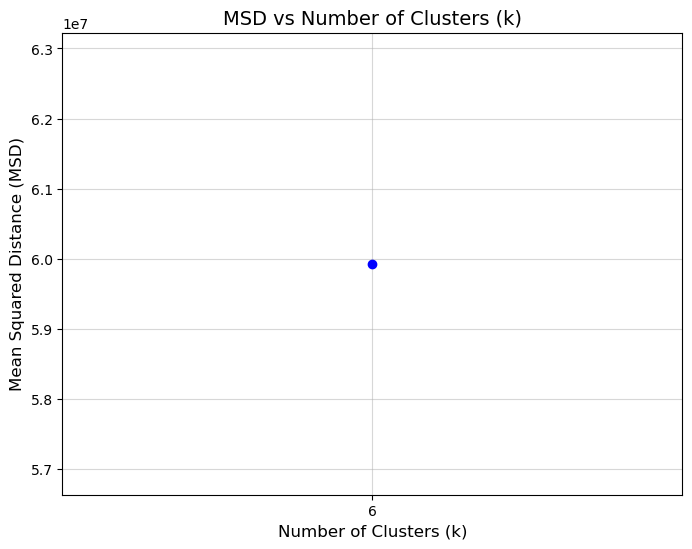

In [2]:
import matplotlib.pyplot as plt


plt.figure(figsize=(8, 6))
plt.plot(k_values, msd_results, marker='o', linestyle='-', color='b')
plt.title("MSD vs Number of Clusters (k)", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Mean Squared Distance (MSD)", fontsize=12)
plt.xticks(k_values)
plt.grid(alpha=0.5)
plt.show()